### Overview and Motivation

The goal of this notebook is to place bounds on the phase shift appearing in 2 to 2 scalar scattering amplitudes. The phase shift can be determined by an integral 

$$B (z) \sin \phi (z) = \frac{1}{4 \pi} \int_{- 1}^1 d z_1  \int_0^{2 \pi} d
   \phi_1 B (z_1) B (z_2) e^{i \phi (z_1) - i \phi (z_2)} $$
   
   where we use $z_2 = zz_1 + (1 - z^2)^{1 / 2}  (1 - z_1^2)^{1 / 2} \cos \phi_1$. Here $B(z)$ represents the differential cross section, where $z$ is $\cos \theta$, with $\theta$ the scattering angle. The goal will be to solve this equation for a function $\phi(z)$, the phase shift, assuming that $B(z)$ is given.

There are two questions that we can ask:

   1) For a given $B(z)$ do we have a solution to the equation ? In other words does there exist a unitary scattering amplitude fitting the given differential cross section ?
   
   2) For a given $B(z)$ is the $\phi(z)$ solution unique ? (Up to ambiguities like $f(\cos \theta) \rightarrow -f^\star(\cos \theta)$
   
  In particular bounds have been given in the litterature by considering $$\sup \frac{\int d \Omega_3 B (z_1) B (z_2)}{4 \pi B (z)} \equiv
   \sin \mu $$
   where existence is guaranteed for $\sin \mu <1$ (Martin 1969). Uniqueness has been proved up to $\sin \mu < 0.89$ (Gangal and Kupsch ). Assuming a finite partial wave expansion uniqueness has been verified up to $\sin \mu < 1$.

##### ML angle

To tackle this problem we will represent $\phi(z)$ by a neural network and try and solve the integral equation, by characterizing it as a loss term $\mathcal{L}$.

### Implementation

##### Start with the imports

Import the necessary modules and set up the Neptune logger with the API token and project name.

In [1]:
use_neptune_logging = False

In [2]:
import os
import neptune.new as neptune
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import LambdaLR, ExponentialLR, MultiplicativeLR
from torch import Generator
import math
from collections import OrderedDict
import numpy as np
from itertools import chain
from tqdm.notebook import tqdm

if use_neptune_logging:
    # Set the Neptune Logger variables
    NEPTUNE_API_TOKEN = os.environ.get('NEPTUNE_API_TOKEN')
    NEPTUNE_PROJECT = os.environ.get('NEPTUNE_ALIAS') + '/2to2scattering'


Check for available GPU or MPS and set the device for PyTorch tensors.

In [3]:
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device('mps')
else:
    device = torch.device('cpu')

General plotting parameters and routines

In [17]:
import matplotlib.pyplot as plt
from matplotlib import rc

# If we need to define some global parameters for the plots they go here

#os.environ["PATH"] += os.pathsep + "/Users/aurelien/Documents/Package_lib/texlive/2021/bin/universal-darwin/"
#rc('text', usetex=True)
#rc('text.latex', preamble=r'\usepackage{lmodern}')

##### Define the networks

In [5]:
def cust_sigmoidal(z, end_low=-math.pi, end_high=math.pi, slope_fact=5):
    range_diff = (end_high-end_low)/2
    range_tot = (end_high+end_low)/2
    
    return range_diff* torch.sigmoid(slope_fact*(z-range_tot)) +range_tot

class Custom_Sigmoid(nn.Module):
    def __init__(self, slope_sigmoid=10):
        super(Custom_Sigmoid, self).__init__()
        self.slope_sigmoid = slope_sigmoid
        #self.slope_sigmoid = slope_sigmoid * torch.nn.Parameter(torch.ones(1)) # If we want to learn the slope
    
    def forward(self, z):
        return cust_sigmoidal(z, slope_fact=self.slope_sigmoid)

In [7]:
class PhiNet(nn.Module):
    def __init__(self, ffnlayers, activation, device='cpu', final_layer='Sigmoid'):
        """
        Initialize the network with the number of FC layers, the activation function, and the device to use
        """
        super(PhiNet, self).__init__()
        
        self.device = device
        
        if activation=='ReLU':
            self.activation = nn.ReLU()
        elif activation == 'Tanh':
            self.activation = nn.Tanh()
        else:
            raise ValueError("Activation function '{}' not supported. Supported activation functions are 'ReLU' and 'Tanh'".format(activation))

        
        if final_layer=='Sigmoid':
            self.final_layer = nn.Sigmoid()
            self.final_l = 'Sigmoid'
        elif final_layer == 'Tanh':
            self.final_layer = nn.Tanh()
            self.final_l = 'Tanh'
        elif final_layer == 'Custom_Sigmoid':
            self.final_layer = Custom_Sigmoid()
            self.final_l = 'Custom_Sigmoid'
        elif final_layer == 'Identity':
            self.final_layer = nn.Identity()
            self.final_l = 'Identity'
        else:
            raise ValueError("Final layer '{}' not supported. Supported final layers are 'Sigmoid', 'Tanh' and 'Identity'".format(final_layer))

        
        # Create a list of layers from the parameters given. Add the appropriate activation function
        self.layer_sizes = ffnlayers
        layer_list = []
        
        for i, layer_size in enumerate(self.layer_sizes):
            if i == 0:
                layer_list.append(('layer_%d' % (i+1), nn.Linear(1, layer_size)))
                layer_list.append(('activation_%d' % (i+1), self.activation))
            else:
                layer_list.append(('layer_%d' % (i+1), nn.Linear(self.layer_sizes[i-1], layer_size)))
                layer_list.append(('activation_%d' %(i+1), self.activation))
        
        layer_list.append(('layer_%d' % (len(self.layer_sizes)+1), nn.Linear(self.layer_sizes[-1], 1)))
        
        # The last layer is sigmoid to constrain outputs between 0 and 1 or tanh for [-1,1]
        layer_list.append(('final_layer', self.final_layer))
            
        
        self.model = nn.Sequential(OrderedDict(layer_list))
    
    
    def forward(self, x):
        """
        Network forward pass where the outputs for the phase are in [-pi/2, pi/2] or [-pi, pi]
        """
        x = self.model(x)
        if self.final_l == 'Identity' or self.final_l == 'Custom_Sigmoid':
            return x
        if self.final_l == 'Sigmoid':
            return 2*math.pi*x - math.pi
        elif self.final_l == 'Tanh':
            return math.pi*x
        else:
            raise ValueError('No good activation function')
    
    
class ModuleNetManual(nn.Module):
    """
    Class for parametrizing the given differential cross section
    """
    def __init__(self, scan_param=None, func_class='linear'):
        super(ModuleNetManual, self).__init__()
        self.scan_param = scan_param
        self.func_class = func_class
        
    def forward(self, x):
        """
        Network forward pass is given by a specific function. Can iterate on the overall scale if we want to
        """
        
        denom = self.scan_param if self.scan_param is not None else 1
        if self.func_class == 'linear':
            return (x + 4)/denom
        elif self.func_class == 'quadratic':
            #return (torch.pow(x,2) + 1)/denom
            return (torch.pow(x,2)*5*np.sqrt(3/2) + np.sqrt(3/2))/denom
        elif self.func_class == 'cubic':
            return (-torch.pow(x,3) + torch.pow(x,2) + x + 1)/denom
        elif self.func_class == 'quadratic_path':
            return (torch.pow(x,2)/2 + denom)
        else:
            raise ValueError('Did not recognize / implement the function type {}'.format(self.func_class))


class PhaseNetSolver():
    """
    Main class for crafting the simulation
    """
    def __init__(self, params_simu, phi_net, mod_net, optimizer, random_generator, scheduler, device='cpu'):
        """
        Initialize the simulation with the networks, the loss function and the optimizer
        """
        
        self.epochs = params_simu['epochs_num']
        self.batch_size = params_simu['batch_size']
        self.eval_points_num = params_simu['integral_points']
        self.scaled_loss = params_simu['scaled_loss']
        self.method_int = params_simu['method_int']
        self.p_value = params_simu['p_value']
        self.lambda_repulsive = params_simu['lambda_repulsive']
        self.repulsive_epochs = params_simu['repulsive_epochs']
        self.repulsive_type = params_simu['repulsive_type']
        self.loss_func = params_simu['loss']
        
        if isinstance(phi_net, list):
            self.multi_nets = [net.to(device) for net in phi_net]
            self.phi_net = None
            self.multiple_nets = True
        else:
            self.multi_nets = None
            self.phi_net = phi_net.to(device)
            self.multiple_nets = False
        self.mod_net = mod_net.to(device)
        self.device = device
        self.rand_gen = random_generator
        
        self.optimizer = optimizer
        self.scheduler = scheduler
    
    def z2(self, z, z1, phi):
        """
        Compute the z2 parameter (formula in motivation)
        Place the batch size on first dim, z1 on the second and phi on the third
        """
        term1 = z.unsqueeze(dim=0).transpose(0, 1) * (z1.unsqueeze(dim=0))
        term2 = torch.sqrt(1 - torch.square(z)).unsqueeze(dim=0).transpose(0, 1) * torch.sqrt(1 - torch.square(z1)).unsqueeze(dim=0)
        return term1.unsqueeze(dim=2) + term2.unsqueeze(dim=2)*torch.cos(phi.unsqueeze(dim=0)).view(1,1,-1)
    
    def integral_approximator(self, z, method='trapz'):
        """
        Approximate the value of the RHS of the integral equation.
        Compute the grids of z1 and phi points for given z values and integrate over the grids
        """
        
        # Linear partition of the space
        z1_points = torch.linspace(-1,1,steps=self.eval_points_num, device=self.device, requires_grad=False)
        phi_points = torch.linspace(0, 2*math.pi, steps=self.eval_points_num, device=self.device, requires_grad=False)
        dx_z1 = 2/(self.eval_points_num-1)
        dx_phi = 2*math.pi/(self.eval_points_num-1)
        
        grid_points = self.mod_net(z1_points).view(1,-1,1)*self.mod_net(self.z2(z, z1_points, phi_points))*torch.cos(self.phi_net(z1_points.view(1,-1,1)) - self.phi_net(self.z2(z, z1_points, phi_points).unsqueeze(dim=-1)).squeeze())
        
        # Simple trapezoid exists in PyTorch
        if method == 'trapz':
            integral = torch.trapezoid(torch.trapezoid(grid_points, dx=dx_phi), dx=dx_z1)/(4*math.pi) 
        
        return integral
    
    def loss_function(self, zsamples):
        """
        Compute a loss based on the average residuals for the integral equation
        """
        
        # For each value of z we estimate the integral equation
        target = torch.sin(self.phi_net(zsamples.view(-1,1)).squeeze()) if self.scaled_loss else self.mod_net(zsamples)*torch.sin(self.phi_net(zsamples.view(-1,1)).squeeze())
        model_input = self.integral_approximator(zsamples, method=self.method_int)
        
        # If scaled then all targets should be sin phase
        if self.scaled_loss:
             model_input = model_input / (self.mod_net(zsamples))
                
        # We have different choices of losses. Huber is more stable to outliers.
        if self.loss_func =='Huber':
            loss_out = F.huber_loss(model_input, target, delta=0.1)
        elif self.loss_func == 'MSE':
            loss_out = F.mse_loss(model_input, target)
        else:
            raise NotImplemented
        
        return loss_out
    
    def multi_loss_function(self, zsamples, logger=None):
        
        if not self.multiple_nets:
            raise NotImplemented
        
        total_loss = 0
        for i, net in enumerate(self.multi_nets):
            self.phi_net = net
            individual_loss = self.loss_function(zsamples)
            logger['metrics/solution_loss_{}'.format(i)].log(individual_loss)
            total_loss = total_loss + individual_loss
        
        return total_loss
   
    
    def dual_loss_ambiguity(self, zsamples):
             
        if not self.multiple_nets and len(self.multi_nets)!=2:
            raise NotImplemented
        
        net1_val = self.multi_nets[0](zsamples.view(-1,1)).squeeze()
        net2_val = self.multi_nets[1](zsamples.view(-1,1)).squeeze()
        
        target = torch.stack((torch.cos(net1_val), torch.sin(net1_val)))
        model_input1 = torch.stack((torch.cos(net2_val), torch.sin(net2_val)))
        model_input2 = torch.stack((-torch.cos(net2_val), torch.sin(net2_val)))
        
        if self.repulsive_type == 'sharp':
            # Sharp repulsive loss
            loss_out1 = torch.pow(F.mse_loss(model_input1, target), -self.p_value)
            loss_out2 = torch.pow(F.mse_loss(model_input2, target), -self.p_value)

        elif self.repulsive_type == 'decay':
            # Repulsive loss with decay
            loss_out1 = 1-torch.tanh(self.p_value * F.mse_loss(model_input1, target))
            loss_out2 = 1-torch.tanh(self.p_value * F.mse_loss(model_input2, target))
        else:
            raise ValueError('Correct type of repulsion not specified')
        
        return loss_out1 + loss_out2
    
    def complete_loss(self, zsamples, dual_active, logger=None):
        
        if not self.multiple_nets:
            return self.loss_function(zsamples)
        else:
            if len(self.multi_nets)!=2:
                raise NotImplemented
            if dual_active:
                repulsive_loss = self.dual_loss_ambiguity(zsamples)
            else: 
                repulsive_loss = 0.0
            
            if logger is not None:
                logger['metrics/repulsive_loss'].log(repulsive_loss)
            
            unitarity_loss = self.multi_loss_function(zsamples, logger=logger)
            
            if repulsive_loss * 10 > unitarity_loss and self.lambda_repulsive>0.0:
                return unitarity_loss + self.lambda_repulsive * repulsive_loss
            else:
                return unitarity_loss
    
    def point_loss(self, zsamples):
        """
        If we want to know the residuals at each given z point. This is useful for evaluation purposes
        """
        target = torch.sin(self.phi_net(zsamples.view(-1,1)).squeeze()) if self.scaled_loss else self.mod_net(zsamples)*torch.sin(self.phi_net(zsamples.view(-1,1)).squeeze())
        model_input = self.integral_approximator(zsamples)
        
        if self.scaled_loss:
            model_input = model_input / (self.mod_net(zsamples))
        return torch.square(model_input - target)
        
    def train(self, neptune_run):
        """
        Main training loop. 
        Each epoch is a single optimization step over a unique batch.
        A batch is composed of a number of randomly selected z points between -1 and 1
        """
        
        p_value_init = self.p_value
        
        tq_iterator = tqdm(range(self.epochs), unit='epoch', leave=False)
        
        for epoch_num in tq_iterator:
            
            if self.repulsive_type is None:
                dual_active = False
            elif self.repulsive_type == 'sharp':
                dual_active = False if self.repulsive_epochs is None or epoch_num < self.repulsive_epochs[0] or epoch_num > self.repulsive_epochs[1] else True
            elif self.repulsive_type == 'decay':
                dual_active = True
                self.p_value = repulsive_decay_func(p_value_init, epoch_num, self.repulsive_epochs)
            
            # Set the network in train mode
            if self.multiple_nets:
                for net in self.multi_nets:
                    net.train()
            else:
                self.phi_net.train()
            
            if self.device is not torch.device('cuda'):
                zpoints = torch.rand(self.batch_size, requires_grad=False, generator=self.rand_gen, device='cpu').to(self.device)*2 - 1
            else:
                zpoints = torch.rand(self.batch_size, requires_grad=False, generator=self.rand_gen, device=self.device)*2 - 1
            
        
            if type(self.optimizer).__name__ == 'LBFGS':
                
                loss = self.complete_loss(zpoints, dual_active, logger=neptune_run)
                
                def closure():
                    if torch.is_grad_enabled():
                        self.optimizer.zero_grad()
                    loss_comp = self.complete_loss(zpoints, dual_active, logger=neptune_run)
                    if loss_comp.requires_grad:
                        loss_comp.backward()
                    return loss_comp
                
                neptune_run['metrics/learning_rate'].log(self.optimizer.param_groups[0]["lr"])
                self.optimizer.step(closure)
                   
            else:
                # Zero the grads, get the loss and backpropagate
                self.optimizer.zero_grad()
                loss = self.complete_loss(zpoints, dual_active, logger=neptune_run)               
                loss.backward()
                
                if neptune_run is not None:
                    neptune_run['metrics/learning_rate'].log(self.optimizer.param_groups[0]["lr"])
                self.optimizer.step()
                
            if self.scheduler is not None:
                self.scheduler.step()
            
            if neptune_run is not None:
                neptune_run['metrics/train_loss'].log(loss)
            
            tq_iterator.set_description('Train Epoch: {} ; tLoss: {:.6f}'.format(epoch_num,loss.item()))

def scheduler_rate(step, factor, size_param, warmup):
    """
    For the Learning Rate scheduler we implement a warmup start, followed by a square root decay
    """
    if step == 0:
        step = 1
    return factor * size_param**(-0.5) * min(step**(-0.5), step*warmup ** (-1.5))

def scheduler_rate_exp(step, gamma, max_ep):
    """
    For the Exponential Learning Rate scheduler where we decay only after the repulsive loss
    """
    if step < 0.3 * min(5000, max_ep):
        return 1
    else:
        return gamma
    
    
def repulsive_decay_func2(p_value_init, epoch_num, repulsive_epochs, overall_scale=8):
    """
    Construct a profile function for the increase in the temperature parameter used
    in the repulsive loss
    """
    
    # Construct a hyperbolic tanh function with a maximum slope at the middle of the repulsive interval
    # The hyperbolic function reaches 0.9 at the end of the repulsive interval
    a = (repulsive_epochs[0] + repulsive_epochs[1])/(2*math.atanh(0.9))
    b = (repulsive_epochs[1] - repulsive_epochs[0])/(2*a)
    
    # Scale the init value by 1 at 0 and by the overall_scale at the end
    scale1 = (1-overall_scale)/(math.tanh(-b) - 1)
    
    return p_value_init*(math.tanh(-b + epoch_num/a)*scale1 + overall_scale - scale1)


def repulsive_decay_func(p_value_init, epoch_num, repulsive_epochs, overall_scale=16):
    """
    Construct a profile function for the increase in the temperature parameter used
    in the repulsive loss
    """
    
    # Construct a hyperbolic tanh function with a maximum slope at the middle of the repulsive interval
    # The hyperbolic function reaches 0.99 at the end of the repulsive interval
    a = (repulsive_epochs[0] + repulsive_epochs[1])/(2*math.atanh((100-99*overall_scale)/(100-101*overall_scale)))
    b = (repulsive_epochs[1] - repulsive_epochs[0])/(2*a)
    
    delta1 = p_value_init *(101*overall_scale - 100) /200
    delta2 = p_value_init *(99*overall_scale + 100) /200
    
    return delta1*np.tanh(-b+epoch_num/a) + delta2

##### Define the training run

In [8]:
from torchinfo import summary

def train_run(parameters, device, run_neptune, module_net=None, phi_net=None, seed_num=42, optim_name='Adam'):
    """
    Function to call for launching the training run
    """
    # Fix for the generator : For reproducibility between cpu and MPS
    random_gen_cpu = Generator(device='cpu')
    random_gen_cpu.manual_seed(seed_num)
    torch.manual_seed(seed_num)   
    torch.cuda.manual_seed(seed_num)
    
    num_phi_nets = parameters['num_nets']
    
    # Define and register the networks
    if num_phi_nets>1:
        phinn = [PhiNet(parameters['layer_list'], parameters['activation'], device=device, final_layer=parameters['final_layer']) for i in range(num_phi_nets)]
        phidisp = phinn[0]
    else:
        if phi_net is None:
            phinn = PhiNet(parameters['layer_list'], parameters['activation'], device=device, final_layer=parameters['final_layer'])
        else:
            phinn = phi_net
        phidisp = phinn
    
    
    if run_neptune is not None:
        run_neptune["config/phimodel"] = type(phidisp).__name__
        with open(f"model_arch.txt", "w") as f:
            f.write(str(summary(phidisp, verbose=0, col_width=16, device=device)))
            f.write(str(phidisp))
    
    if module_net is None:
        modnn = ModuleNetManual(scan_param=parameters['scan_param'], func_class=parameters['func_class'])
    else:
        modnn = module_net

        
    # Define and register the optimizer and scheduler
    if optim_name == 'Adam':
        if num_phi_nets>1:
            optimizer = torch.optim.Adam(chain.from_iterable([phinet.parameters() for phinet in phinn]), lr=parameters['learning_rate'], betas=(parameters['beta1'], parameters['beta2']))
        else:
            optimizer = torch.optim.Adam(phinn.parameters(), lr=parameters['learning_rate'], betas=(parameters['beta1'], parameters['beta2']))
    elif optim_name == 'LBFGS':
        if num_phi_nets>1:
            optimizer = torch.optim.LBFGS(chain.from_iterable([phinet.parameters() for phinet in phinn]), lr=parameters['learning_rate'], max_iter=50,tolerance_grad=1e-20)
        else:
            optimizer = torch.optim.LBFGS(phinn.parameters(), lr=parameters['learning_rate'], max_iter=50,tolerance_grad=1e-20)
    
    if run_neptune is not None:        
        run_neptune["config/modmodel"] = type(modnn).__name__
        run_neptune["model_arch"].upload("model_arch.txt")
        run_neptune["config/optimizer"] = type(optimizer).__name__

    
    if parameters['lr_scheduler']:
        lr_scheduler = MultiplicativeLR(optimizer=optimizer, lr_lambda=lambda step: scheduler_rate_exp(step, 0.999, parameters['epochs_num']))
    else:
        lr_scheduler = None
    
    # Create the simulation, train it and return the trained result
    netsolver = PhaseNetSolver(parameters, phinn, modnn, optimizer, random_gen_cpu, lr_scheduler, device=device)
    netsolver.train(run_neptune)

    return netsolver

##### Define the evaluation run

In [9]:
def eval_run(trained_solver, params, device, neptune_run, steps_eval=100, num=None):
    """
    At evaluation we verify if the integral equation is satisfied. 
    For this we take a larger sample of z points
    """
    
    str_add = '_' + str(num) if num is not None else ''
    
    # Make sure we are in evaluation mode
    trained_solver.phi_net.eval()
    with torch.no_grad(): 
        
        # Create the evaluation points and compute the phase at those points
        zpointstest = torch.linspace(-1,1,steps=steps_eval, device=device)
        results = trained_solver.phi_net(zpointstest.view(-1,1))
        phires = results.squeeze().cpu().numpy()
        sinphires = torch.sin(results).squeeze().cpu().numpy()
        
        # Also log the final loss values. Including the loss at individual z values
        trained_solver.scaled_loss = True
        eval_loss_scaled = trained_solver.loss_function(zpointstest)
        
        if neptune_run is not None:
            neptune_run['metrics/eval_loss_scaled' + str_add].log(eval_loss_scaled)
        eval_point_loss_scaled = trained_solver.point_loss(zpointstest)
        
        trained_solver.scaled_loss = False
        eval_loss_base = trained_solver.loss_function(zpointstest)
        
        if neptune_run is not None:
            neptune_run['metrics/eval_loss_base' + str_add].log(eval_loss_base)
        eval_point_loss_non_scaled = trained_solver.point_loss(zpointstest)
    
    return zpointstest, phires, sinphires, eval_point_loss_scaled, eval_point_loss_non_scaled

##### Check the value of the $\sin(\mu)$ parameter

In [10]:
def sin_mu_integral(params, device, trained_solver, zpoints):
    """
    Helper function to compute the sin(\mu) variable defined in the motivation.
    This compute the relevant integral involving the differential cross section
    """
    z1_points = torch.linspace(-1,1,steps=params['integral_points'], device=device)
    phi_points = torch.linspace(0, 2*math.pi, steps=params['integral_points'], device=device)
    dx_z1 = 2/(params['integral_points']-1)
    dx_phi = 2*math.pi/(params['integral_points']-1)
        
    grid_points = trained_solver.mod_net(z1_points).view(1,-1,1)*trained_solver.mod_net(trained_solver.z2(zpoints, z1_points, phi_points))
        
    integral = torch.trapezoid(torch.trapezoid(grid_points, dx=dx_phi), dx=dx_z1)/(4*math.pi) 
        
    return integral/trained_solver.mod_net(zpoints)
   

##### Define the plotting routines

In [11]:
import matplotlib.pyplot as plt
from neptune.new.types import File
     
    
def plot_phase(zpoints, phipoints, neptune_run):

    fig = plt.figure(figsize=(14, 10))

    plt.plot(zpoints.cpu(),phipoints, 'b-', linewidth = 2)       
    plt.xlabel('$z$')
    plt.ylabel('$\phi(z)$')    
    plt.title('$\phi(z)$ prediction', fontsize = 15)
    plt.xlim([-1,1])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/phase_prediction'].upload(File.as_image(fig))
    plt.close(fig)
    
def plot_phases(zpoints, phipoints_list, neptune_run):

    fig = plt.figure(figsize=(14, 10))
    
    for phipoints in phipoints_list:
        plt.plot(zpoints.cpu(),phipoints, '-', linewidth = 2)       
    plt.xlabel('$z$')
    plt.ylabel('$\phi(z)$')    
    plt.title('$\phi(z)$ prediction', fontsize = 15)
    plt.legend(['Network {}'.format(i+1) for i in range(len(phipoints_list))])
    plt.xlim([-1,1])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/phase_prediction'].upload(File.as_image(fig))
    plt.close(fig)
    
    
def plot_point_loss(zpoints, point_loss_data_s, point_loss_data_no_s, neptune_run):

    fig = plt.figure(figsize=(14, 10))

    plt.plot(zpoints.cpu(), np.log10(point_loss_data_s.cpu()), 'b-', linewidth = 2)  
    plt.plot(zpoints.cpu(), np.log10(point_loss_data_no_s.cpu()), 'g-', linewidth = 2)  
    plt.xlabel('$z$')
    plt.ylabel('$||\mathcal{L}(z)||_2$')    
    plt.title('Point loss evaluation', fontsize = 15)
    plt.xlim([-1,1])
    plt.legend(['Normalized loss at each point', 'Base loss'])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/point_loss_evaluation'].upload(File.as_image(fig))
    plt.close(fig)
    

def plot_sin_mu(zpoints, integralpoints, tags_run):

    sinmu = max(integralpoints.cpu())

    fig2 = plt.figure(figsize=(14, 10))

    plt.plot(zpoints.cpu(),integralpoints.cpu(), 'g-', linewidth = 2)   
    plt.plot(zpoints.cpu(),sinmu.repeat(integralpoints.size(dim=0)), 'r--' )
    plt.xlabel('$z$')
    plt.ylabel('$\sin \mu(z)$')    
    plt.title('Differential cross section categorization: B(z) = {}'.format(tags_run['constant function']), fontsize = 15)
    plt.xlim([-1,1])
    plt.legend(['$\sin\mu(z)$','$\sin \mu$={}'.format(str(np.round(sinmu.numpy(),4)))])
    plt.show()
    
def plot_summary(zpoints, phipoints, sinphipoints, integralpoints, neptune_run, tags_run):
    
    sinmu = max(integralpoints.cpu())
    
    fig3 = plt.figure(figsize=(14, 10))

    plt.plot(zpoints.cpu(),phipoints, 'b-', linewidth = 2)       
    plt.plot(zpoints.cpu(),sinphipoints, 'b--', linewidth = 2)       
    plt.plot(zpoints.cpu(),integralpoints.cpu(), 'g-', linewidth = 2)   
    plt.plot(zpoints.cpu(),sinmu.repeat(integralpoints.size(dim=0)), 'r--' )
    plt.xlabel('$z$')
    plt.ylabel('$\sin \mu(z)$')    
    plt.title('Differential cross section categorization: B(z) = {}'.format(tags_run['constant function']), fontsize = 15)
    plt.xlim([-1,1])
    plt.legend(['$\phi(z)$', '$\sin \phi(z)$','$\sin\mu(z)$','$\sin \mu$={}'.format(str(np.round(sinmu.numpy(),4)))])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/overview'].upload(File.as_image(fig3))
    plt.close(fig3)

### Single function Run

##### Define the parameters

In [12]:
# Start the Neptune logger run

if use_neptune_logging:
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test")
else:
    run = None

params = {'batch_size': 64,
         'epochs_num': 5000,
         'learning_rate': 0.003,
         'repulsive_epochs': None,
         'repulsive_type' : None,
         'lr_scheduler': True, 
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'activation': 'ReLU',
         'layer_list': [64, 64, 64, 64],
         'final_layer': 'Tanh',
         'func_class': 'linear',
         'loss': 'MSE',
         'scaled_loss': True,
         'scan_param': 10.0,
         'num_nets' : 1,
         'p_value': 2,
         'lambda_repulsive': 0.0}

tags = {'constant function': '(z+4)/10', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    run["sys/tags"].add(list(tags.values()))
    run['parameters'] = params

##### Training run

In [13]:
netsolver = train_run(params, device, run, seed_num=10, optim_name='Adam')

  0%|          | 0/5000 [00:00<?, ?epoch/s]

##### Evaluation and plots

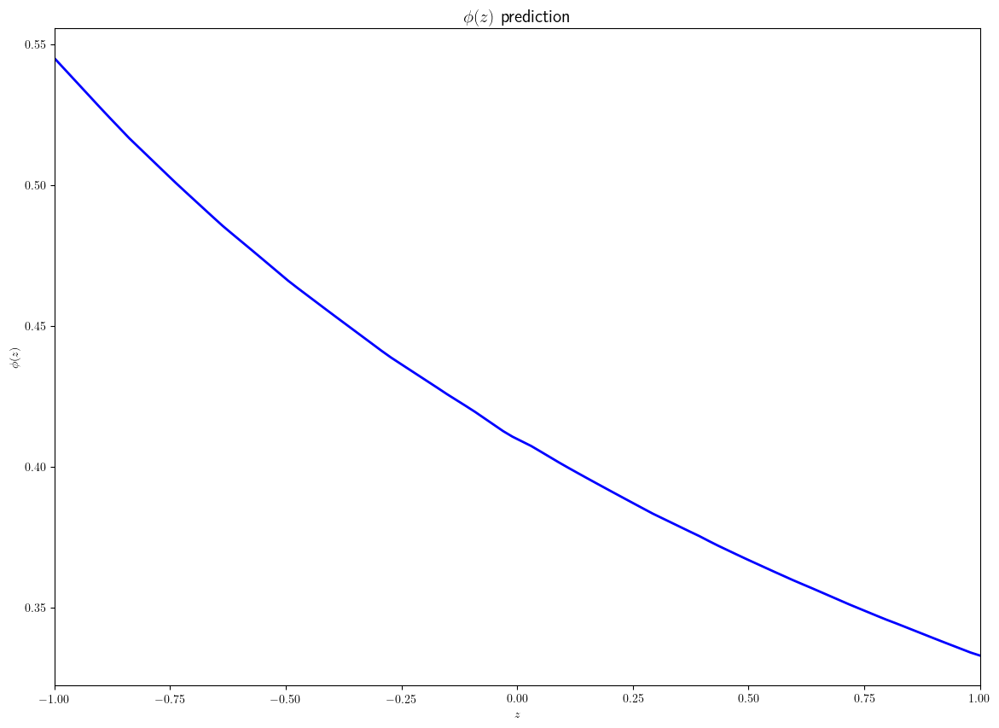

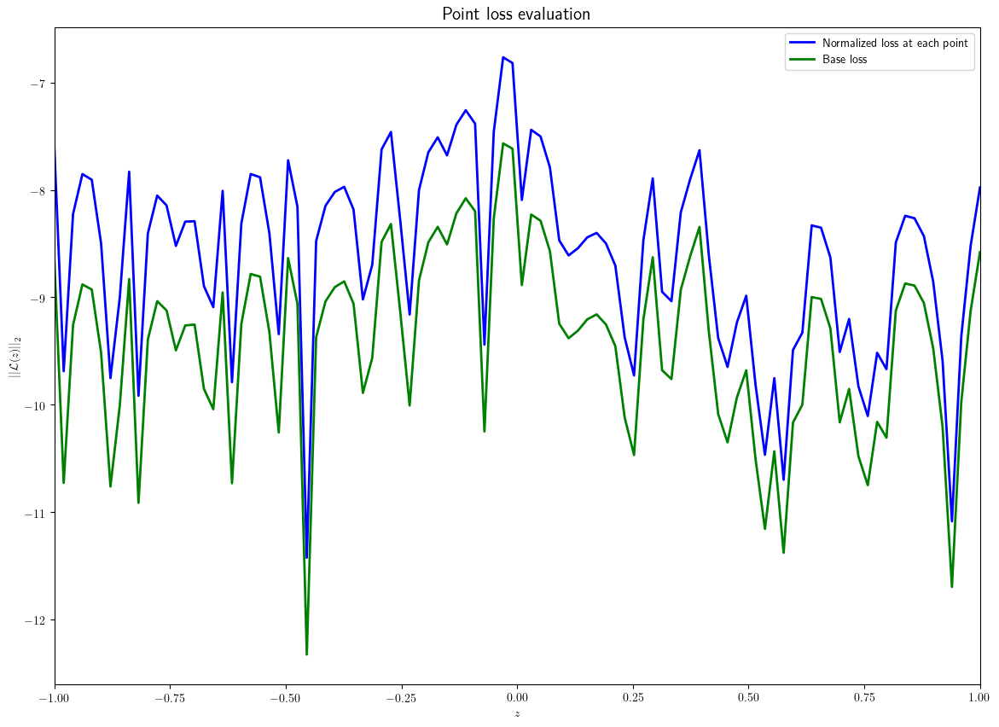

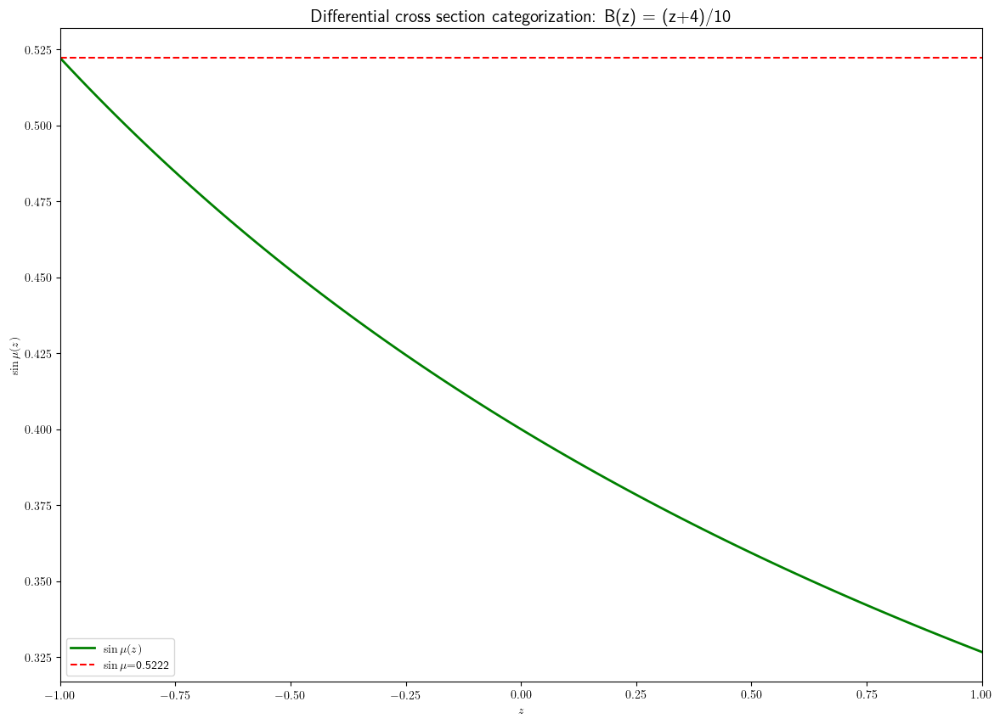

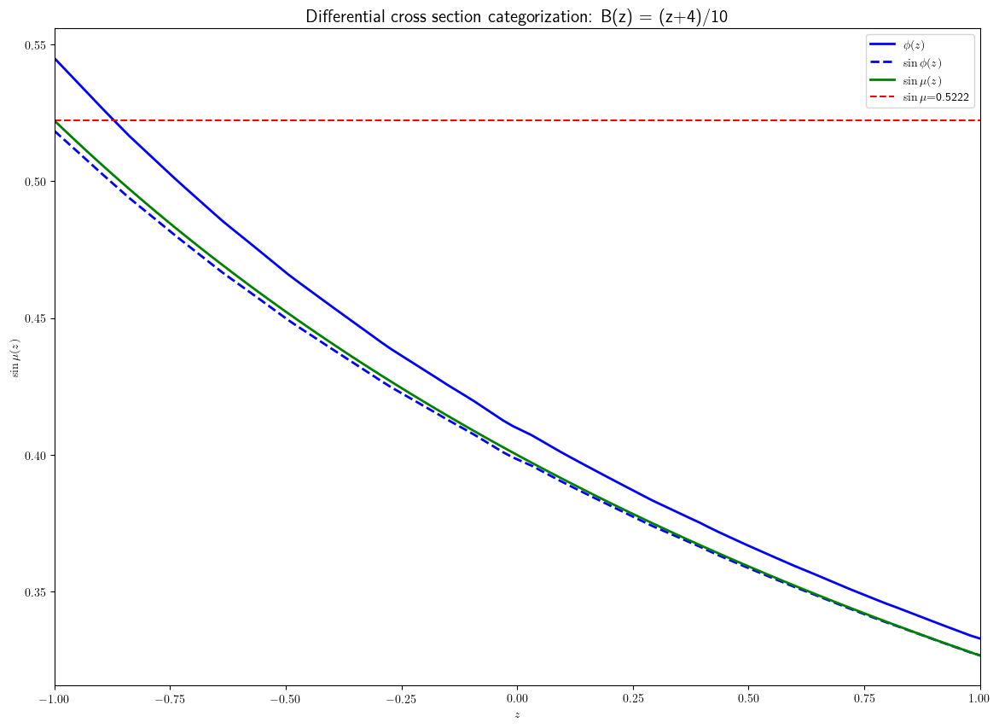

In [18]:
zpointseval_lin, phieval_lin, sinphieval_lin, eval_pt_loss_s_lin, eval_pt_loss_no_s_lin = eval_run(netsolver, params, device, run)

plot_phase(zpointseval_lin, phieval_lin, run)
plot_point_loss(zpointseval_lin, eval_pt_loss_s_lin, eval_pt_loss_no_s_lin, run)

integralz_lin = sin_mu_integral(params, device, netsolver, zpointseval_lin)
plot_sin_mu(zpointseval_lin, integralz_lin, tags)

plot_summary(zpointseval_lin, phieval_lin, sinphieval_lin, integralz_lin, run, tags)

In [15]:
# Make sure to kill the Neptune logger run
if run is not None:
    run.stop()

Now move on to a cubic function

In [13]:
from copy import deepcopy

In [121]:
params2 = deepcopy(params)
params2['func_class'] = 'cubic'
params2['scan_param'] = 3.0
tags = {'constant function': '(-z^3+z^2+z+1)/3', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    # Start the Neptune logger run
    run2 = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test")
else:
    run2 = None
    run2["sys/tags"].add(list(tags.values()))
    run2['parameters'] = params2

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1833
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/5000 [00:00<?, ?epoch/s]

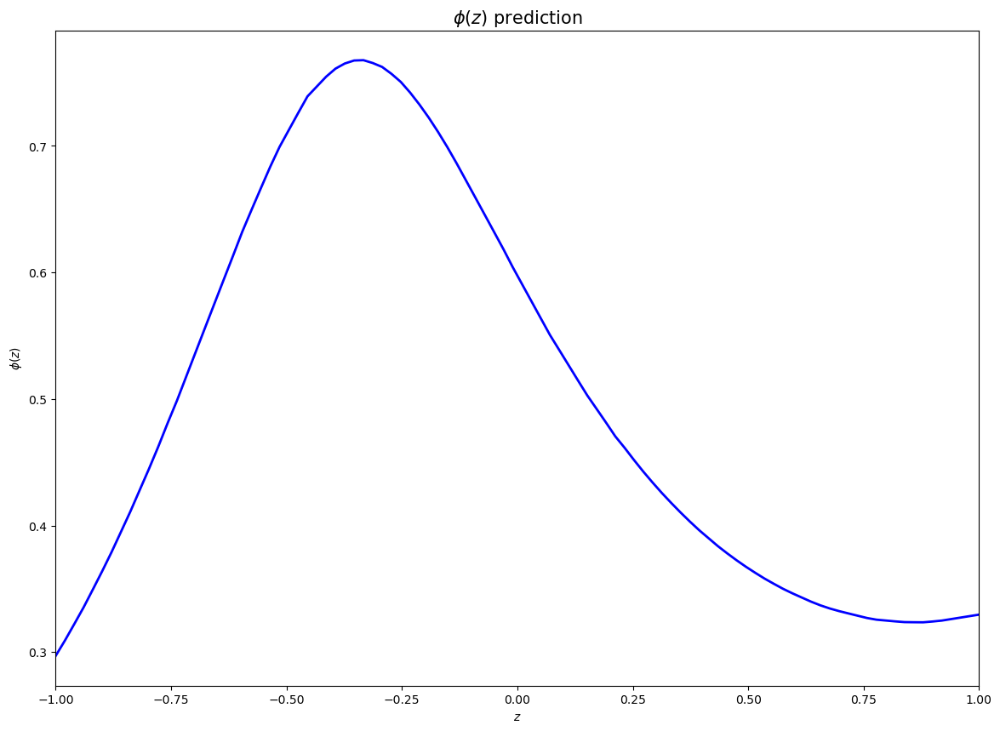

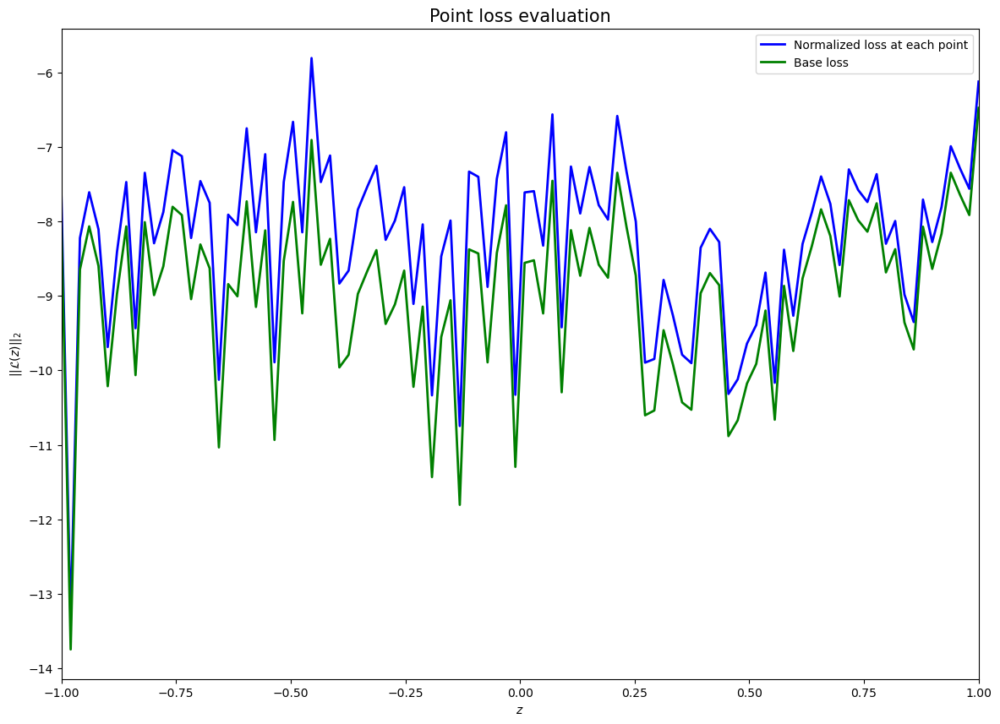

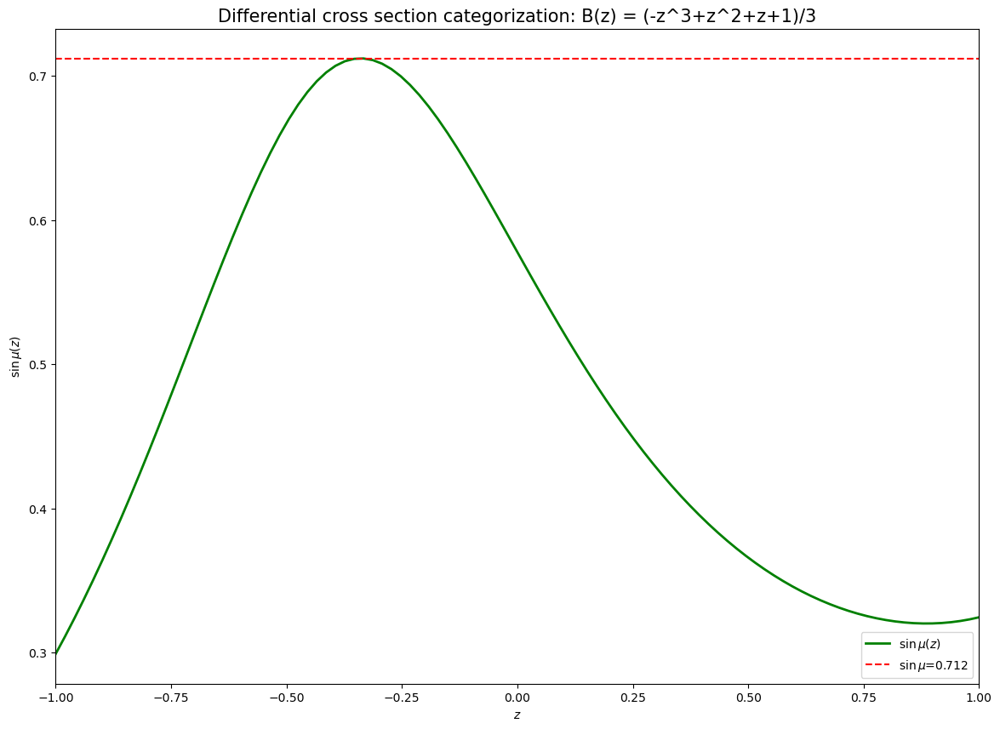

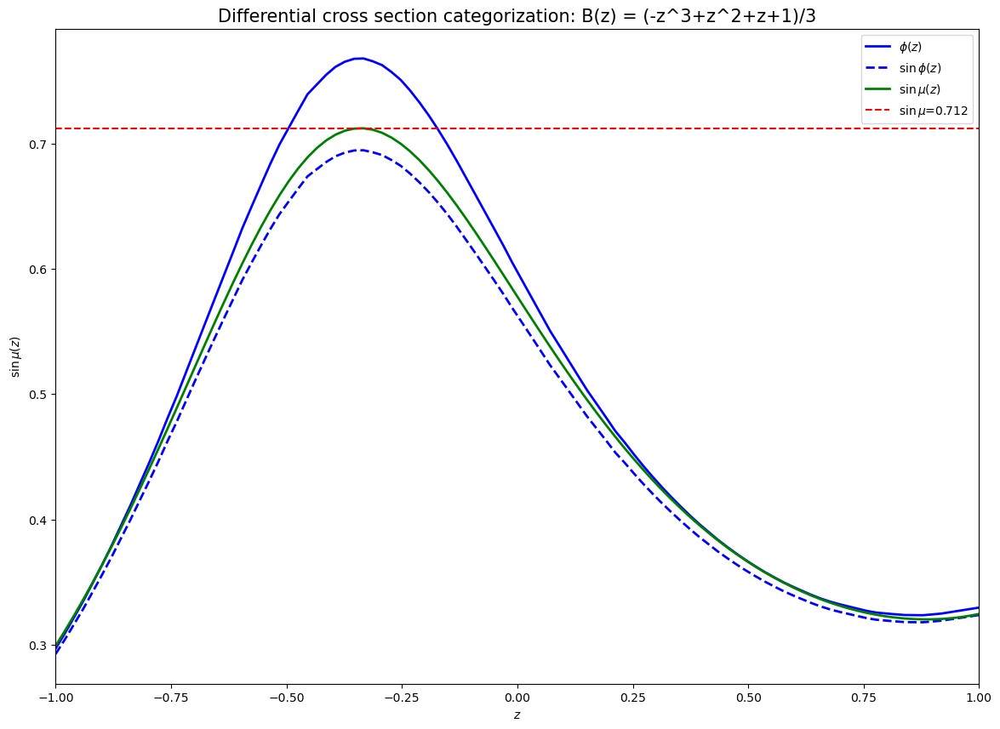

In [122]:
netsolver2 = train_run(params2, device, run2, seed_num=42, optim_name='Adam')

zpointseval_cub, phieval_cub, sinphieval_cub, eval_pt_loss_s_cub, eval_pt_loss_no_s_cub = eval_run(netsolver2, params2, device, run2)

plot_phase(zpointseval_cub, phieval_cub, run2)
plot_point_loss(zpointseval_cub, eval_pt_loss_s_cub, eval_pt_loss_no_s_cub, run2)

integralz_cub = sin_mu_integral(params2, device, netsolver2, zpointseval_cub)
plot_sin_mu(zpointseval_cub, integralz_cub, tags)

plot_summary(zpointseval_cub, phieval_cub, sinphieval_cub, integralz_cub, run2, tags)

In [123]:
if run2 is not None:
# Make sure to kill the Neptune logger run
    run2.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 198 operations to synchronize with Neptune. Do not kill this process.
All 198 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1833


Make nice pictures

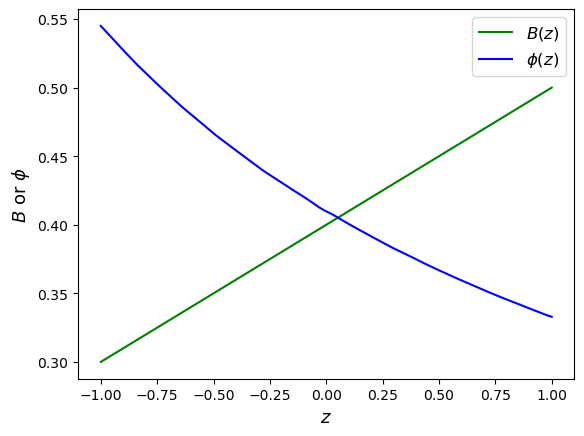

In [135]:
fig = plt.figure()
plt.plot(zpointseval_lin.cpu().numpy(), netsolver.mod_net(zpointseval_lin).cpu().numpy(), c='g')
plt.plot(zpointseval_lin.cpu().numpy(), phieval_lin, c='b')
plt.legend(['$B(z)$', '$\phi(z)$'], fontsize=12)
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$B$ or $\phi$', fontsize=13)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Single_solution_polynomial/linear_sol.pdf',bbox_inches='tight')

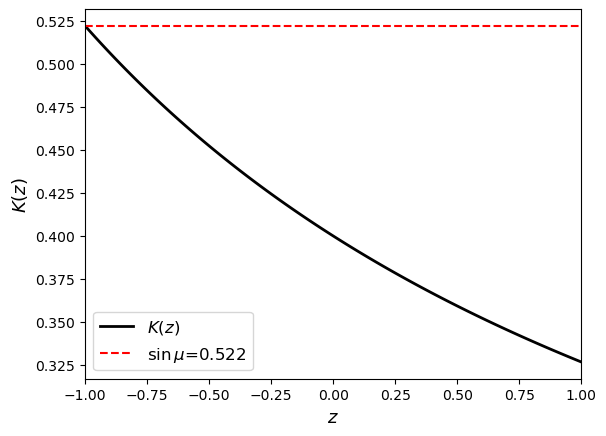

In [125]:
sinmu_lin = max(integralz_lin.cpu())

fig = plt.figure()
plt.plot(zpointseval_lin.cpu(),integralz_lin.cpu(), 'k-', linewidth = 2)   
plt.plot(zpointseval_lin.cpu(),sinmu_lin.repeat(integralz_lin.size(dim=0)), 'r--' )
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$K(z)$', fontsize=13)    
plt.xlim([-1,1])
plt.legend(['$K(z)$','$\sin \mu$={}'.format(str(np.round(sinmu_lin.numpy(),3)))], fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Single_solution_polynomial/linear_sinmu.pdf',bbox_inches='tight')

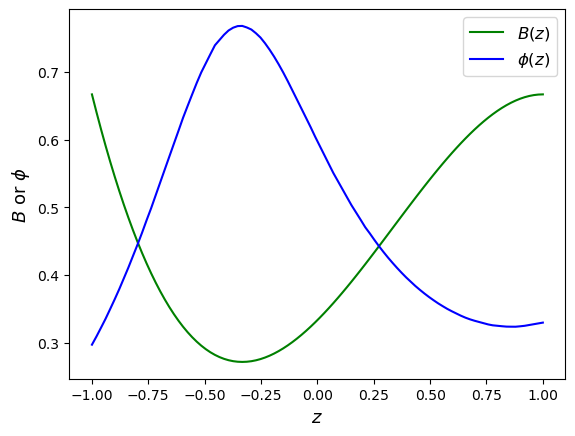

Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError


Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.


Communication with Neptune restored!
Communication with Neptune restored!


In [140]:
fig = plt.figure()
plt.plot(zpointseval_cub.cpu().numpy(), netsolver2.mod_net(zpointseval_cub).cpu().numpy(), c='g')
plt.plot(zpointseval_cub.cpu().numpy(), phieval_cub, c='b')
plt.legend(['$B(z)$', '$\phi(z)$'], fontsize=12)
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$B$ or $\phi$', fontsize=13)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Single_solution_polynomial/cubic_sol.pdf',bbox_inches='tight')

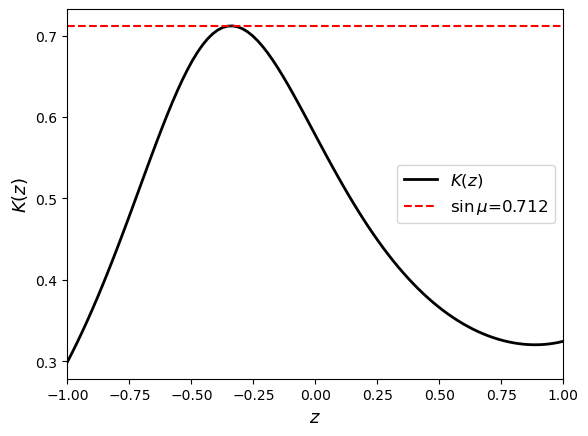

In [127]:
sinmu_cub = max(integralz_cub.cpu())

fig = plt.figure()
plt.plot(zpointseval_cub.cpu(),integralz_cub.cpu(), 'k-', linewidth = 2)   
plt.plot(zpointseval_cub.cpu(),sinmu_cub.repeat(integralz_cub.size(dim=0)), 'r--' )
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$K(z)$', fontsize=13)    
plt.xlim([-1,1])
plt.legend(['$K(z)$','$\sin \mu$={}'.format(str(np.round(sinmu_cub.numpy(),3)))], fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Single_solution_polynomial/cubic_sinmu.pdf',bbox_inches='tight')

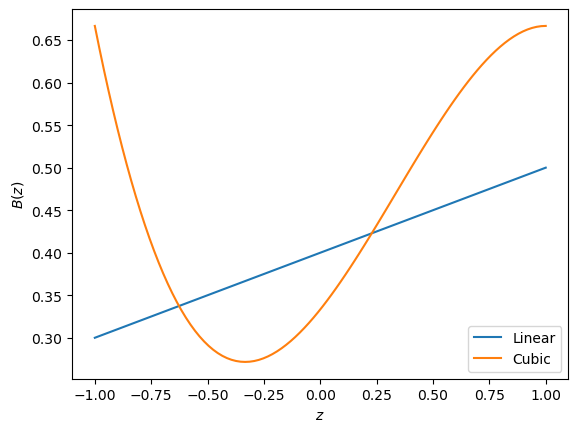

In [65]:
plt.plot(zpointseval_lin.cpu().numpy(), netsolver.mod_net(zpointseval_lin).cpu().numpy())
plt.plot(zpointseval_cub.cpu().numpy(), netsolver2.mod_net(zpointseval_cub).cpu().numpy())
plt.legend(['Linear', 'Cubic'])
plt.xlabel('$z$')
plt.ylabel('$B(z)$')
plt.show()

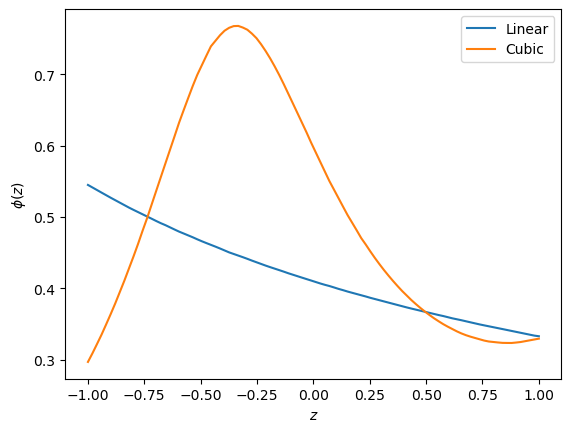

In [67]:
plt.plot(zpointseval_lin.cpu().numpy(), phieval_lin)
plt.plot(zpointseval_cub.cpu().numpy(), phieval_cub)
plt.legend(['Linear', 'Cubic'])
plt.xlabel('$z$')
plt.ylabel('$\phi(z)$')
plt.show()

##### Move on to quadratic

In [14]:
params3 = deepcopy(params)
params3['func_class'] = 'quadratic'
params3['scan_param'] = 2.0
tags = {'constant function': 'L2', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    # Start the Neptune logger run
    run3 = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test")
    run3["sys/tags"].add(list(tags.values()))
    run3['parameters'] = params3
else:
    run3 = None

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1835
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/5000 [00:00<?, ?epoch/s]

  0%|          | 0/5000 [00:00<?, ?epoch/s]

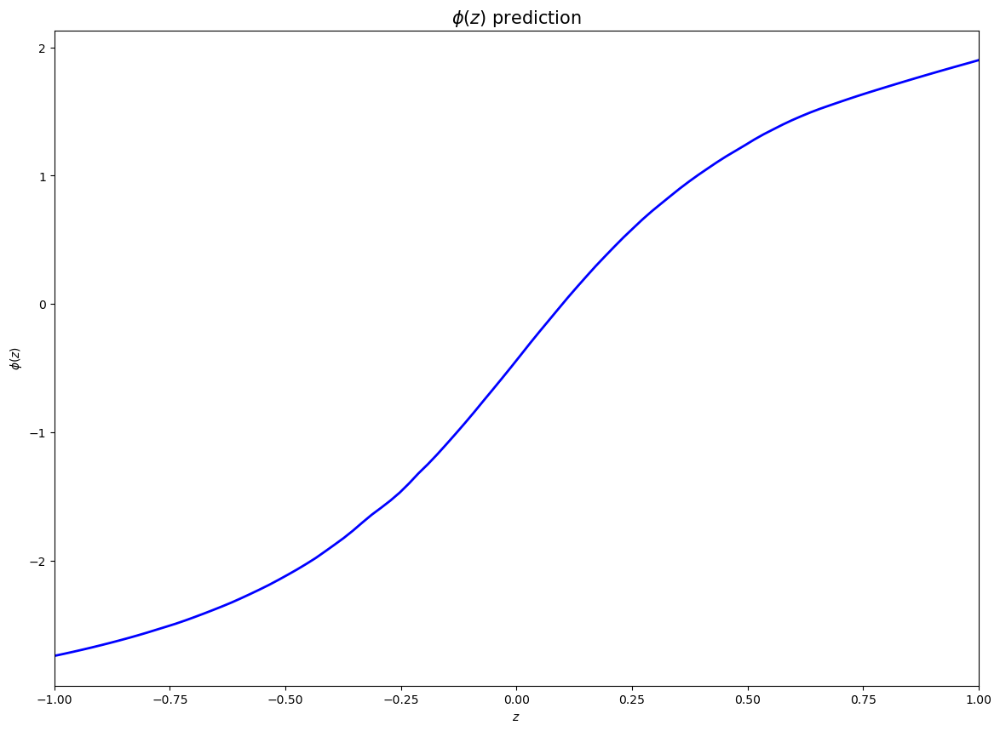

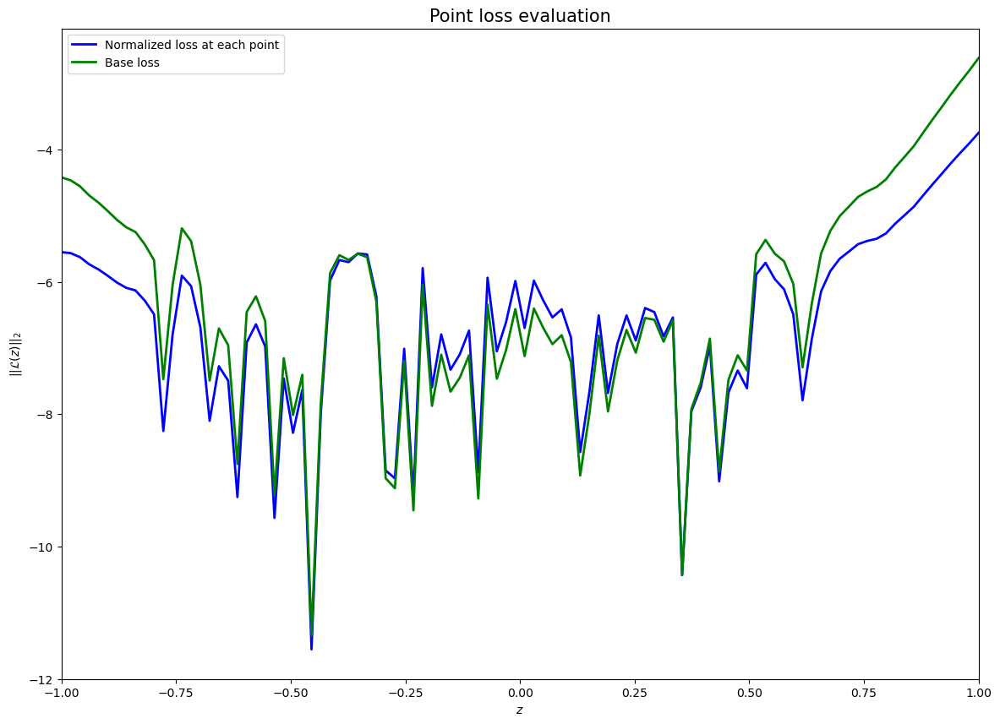

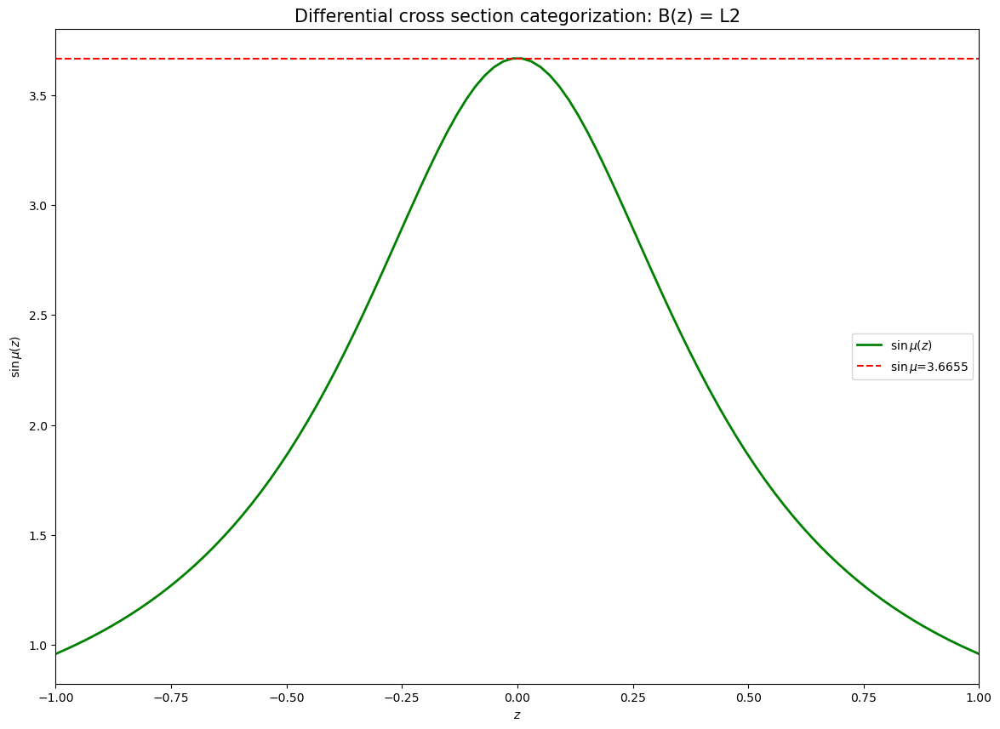

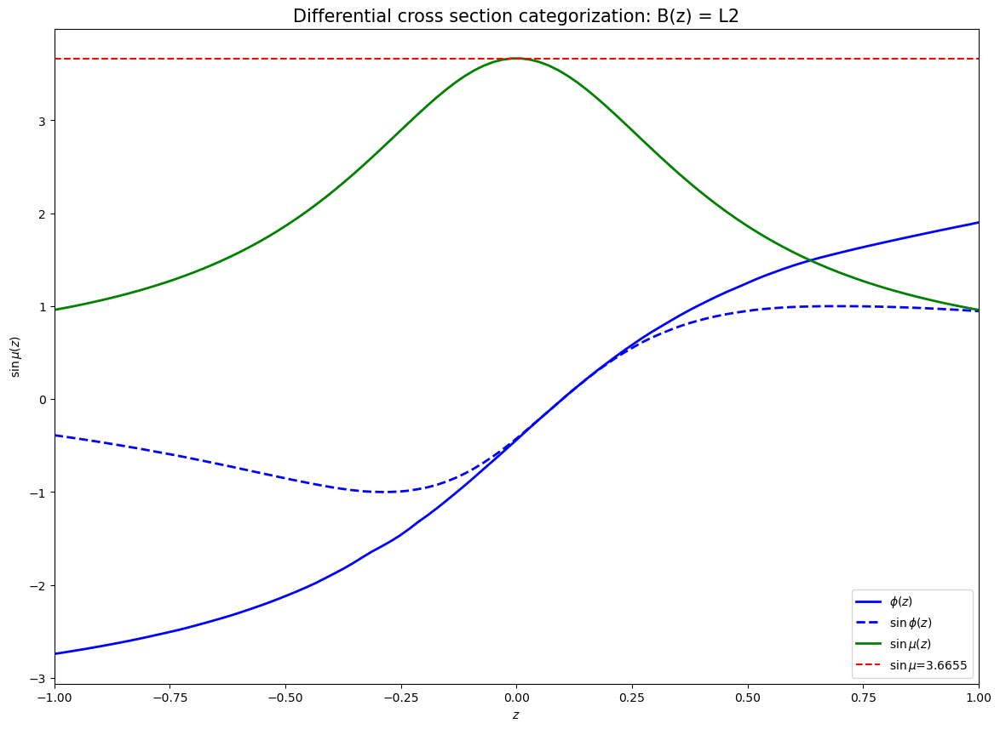

In [15]:
netsolver3 = train_run(params3, device, run3, seed_num=2, optim_name='Adam')

zpointseval_quad, phieval_quad, sinphieval_quad, eval_pt_loss_s_quad, eval_pt_loss_no_s_quad = eval_run(netsolver3, params3, device, run3)

plot_phase(zpointseval_quad, phieval_quad, run3)
plot_point_loss(zpointseval_quad, eval_pt_loss_s_quad, eval_pt_loss_no_s_quad, run3)

integralz_quad = sin_mu_integral(params3, device, netsolver3, zpointseval_quad)
plot_sin_mu(zpointseval_quad, integralz_quad, tags)

plot_summary(zpointseval_quad, phieval_quad, sinphieval_quad, integralz_quad, run3, tags)

In [16]:
if run3 is not None:
    run3.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 162 operations to synchronize with Neptune. Do not kill this process.
All 162 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1835


Pictures

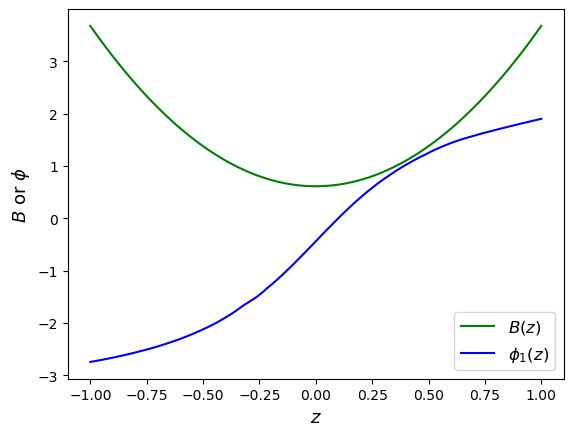

In [19]:
fig = plt.figure()
plt.plot(zpointseval_quad.cpu().numpy(), netsolver3.mod_net(zpointseval_quad).cpu().numpy(), c='g')
plt.plot(zpointseval_quad.cpu().numpy(), phieval_quad, c='b')
plt.legend(['$B(z)$', '$\phi_1(z)$', '$\phi_2(z)$'], fontsize=12)
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$B$ or $\phi$', fontsize=13)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Single_solution_polynomial/quadratic_sol_all.pdf',bbox_inches='tight')

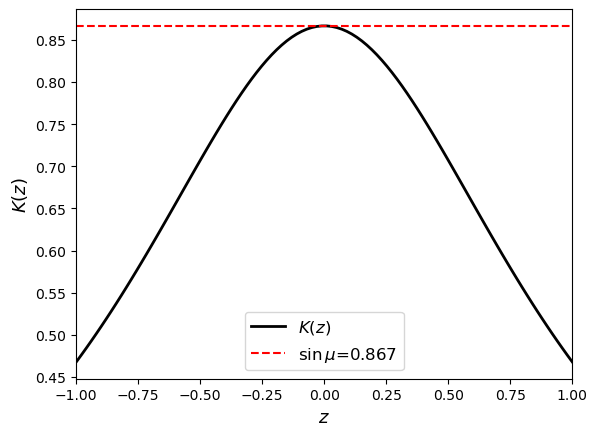

In [75]:
sinmu_quad = max(integralz_quad.cpu())

fig = plt.figure()
plt.plot(zpointseval_quad.cpu(),integralz_quad.cpu(), 'k-', linewidth = 2)   
plt.plot(zpointseval_quad.cpu(),sinmu_quad.repeat(integralz_quad.size(dim=0)), 'r--' )
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$K(z)$', fontsize=13)    
plt.xlim([-1,1])
plt.legend(['$K(z)$','$\sin \mu$={}'.format(str(np.round(sinmu_quad.numpy(),3)))], fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Single_solution_polynomial/quadratic_sinmu.pdf',bbox_inches='tight')

##### Error on the trapezoidal rule

The error on the trapezoidal rule is bounded by $$E\leq \max_x \frac{(b-a)^3}{12 N^2} |f''(x)|$$ The scaling with the number of evaluation points goes as $N^{-2}$ which is relevant for us to put some bound on the expected answer. In a multidimensional setting we can still expect the global error to grow as $N^{-2}$.

In [358]:
import sympy as sp

symbz = sp.Symbol('z')
symbphi = sp.Symbol('\phi')
symbz1 = sp.Symbol('z_1')

funcz = (1+symbz+symbz**2-symbz**3)/3
completesol=sp.factor(sp.integrate(sp.integrate((funcz.subs(symbz,symbz1) * funcz.subs(symbz,symbz1*symbz + sp.sqrt(1-symbz**2)*sp.sqrt(1-symbz1**2)*sp.cos(symbphi)))/(4*sp.pi*funcz),(symbphi, 0,2*sp.pi)),(symbz1,-1,1)))

In [362]:
params['integral_points'] = 25

integralapprox = sin_mu_integral(params, device, netsolver, zpointseval).to('cpu')
integralexact = torch.FloatTensor([completesol.subs(symbz,pt) for pt in zpointseval], device='cpu')
base=integralapprox - integralexact
print(base)
print(max(base))
print(min(base))

tensor([ 7.7218e-04,  7.7960e-04,  7.8663e-04,  7.9292e-04,  7.9852e-04,
         8.0335e-04,  8.0720e-04,  8.1030e-04,  8.1220e-04,  8.1304e-04,
         8.1235e-04,  8.1053e-04,  8.0717e-04,  8.0210e-04,  7.9554e-04,
         7.8708e-04,  7.7683e-04,  7.6455e-04,  7.5054e-04,  7.3445e-04,
         7.1639e-04,  6.9654e-04,  6.7455e-04,  6.5082e-04,  6.2543e-04,
         5.9837e-04,  5.7006e-04,  5.4049e-04,  5.0974e-04,  4.7839e-04,
         4.4638e-04,  4.1419e-04,  3.8195e-04,  3.4988e-04,  3.1841e-04,
         2.8741e-04,  2.5749e-04,  2.2864e-04,  2.0105e-04,  1.7464e-04,
         1.5008e-04,  1.2696e-04,  1.0550e-04,  8.5831e-05,  6.7890e-05,
         5.1737e-05,  3.7313e-05,  2.4617e-05,  1.3709e-05,  4.3511e-06,
        -3.3975e-06, -9.5963e-06, -1.4424e-05, -1.7524e-05, -1.9670e-05,
        -2.0266e-05, -1.9610e-05, -1.7971e-05, -1.5080e-05, -1.1235e-05,
        -6.3777e-06, -5.0664e-07,  6.2585e-06,  1.3798e-05,  2.2173e-05,
         3.1441e-05,  4.1366e-05,  5.2005e-05,  6.3

In [363]:
params['integral_points'] = 50

integralapprox = sin_mu_integral(params, device, netsolver, zpointseval).to('cpu')
integralexact = torch.FloatTensor([completesol.subs(symbz,pt) for pt in zpointseval])
print(base/(integralapprox - integralexact))

tensor([4.1716, 4.1708, 4.1692, 4.1689, 4.1696, 4.1689, 4.1688, 4.1682, 4.1678,
        4.1663, 4.1685, 4.1662, 4.1668, 4.1675, 4.1657, 4.1643, 4.1652, 4.1660,
        4.1654, 4.1642, 4.1646, 4.1632, 4.1622, 4.1644, 4.1639, 4.1621, 4.1619,
        4.1596, 4.1636, 4.1650, 4.1582, 4.1636, 4.1610, 4.1572, 4.1572, 4.1605,
        4.1578, 4.1650, 4.1591, 4.1679, 4.1551, 4.1602, 4.1647, 4.1618, 4.1722,
        4.1731, 4.1733, 4.1300, 4.1818, 4.5625, 3.8000, 4.0250, 4.1017, 4.1408,
        4.0741, 4.0476, 4.1646, 4.0743, 4.0480, 3.9684, 3.8909, 1.7000, 4.3750,
        4.3271, 4.3006, 4.2540, 4.2188, 4.2048, 4.1996, 4.1887, 4.1901, 4.1857,
        4.1883, 4.1864, 4.1813, 4.1763, 4.1777, 4.1775, 4.1749, 4.1750, 4.1737,
        4.1725, 4.1707, 4.1733, 4.1709, 4.1680, 4.1692, 4.1677, 4.1691, 4.1691,
        4.1668, 4.1663, 4.1662, 4.1664, 4.1644, 4.1672, 4.1644, 4.1659, 4.1640,
        4.1648])


In [364]:
params['integral_points'] = 250

integralapprox = sin_mu_integral(params, device, netsolver, zpointseval).to('cpu')
integralexact = torch.FloatTensor([completesol.subs(symbz,pt) for pt in zpointseval])
print(base/(integralapprox - integralexact))

tensor([ 108.4100,  107.6502,  107.2967,  107.2823,  108.0403,  107.3944,
         109.2137,  107.4664,  107.7194,  106.5664,  108.1667,  107.0748,
         107.0514,  107.2271,  107.6371,  107.3577,  107.7107,  107.7899,
         107.6239,  107.1478,  109.2636,  107.2110,  105.7664,  109.1900,
         108.1753,  109.1196,  108.6818,  106.6824,  108.2532,  108.4595,
         108.5362,  106.9077,  106.8000,  110.7547,  106.8400,  109.5909,
         108.0000,  106.5556,  105.4062,  112.6923,  114.4545,  101.4286,
         110.6250,  120.0000,  113.9000,  124.0000,  125.2000,  103.2500,
        -230.0000,   73.0000,   28.5000,   80.5000,   80.6667,   98.0000,
          66.0000,   68.0000,  109.6667,   67.0000,  101.2000,   75.4000,
          71.3333,    8.5000,   70.0000,  154.3333,  148.8000,  105.5000,
         106.7692,  124.6429,  106.2500,  110.0000,  118.1600,  103.1212,
         113.8235,  114.6842,  113.1860,  108.0000,  112.2453,  110.5254,
         109.4462,  110.4000,  108.623

As we increase the number of integral points considered we can verify the $N^{-2}$ scaling. Going from 25 points (per dimension) to 50 points indeed decreases the error by a factor 4, while going to 250 points decreases the error by a factor 100.

### Scan over Function runs

Compare the performance of the scaled and non scaled losses by taking $B(z)=z^2/2 + C$ as input, iterating over a range of C values

In [11]:
scan_range = np.logspace(-5, np.log10(0.1), num=50)

if use_neptune_logging:
    run_path = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_QuadPath")
else:
    run_path = None
phiresults = []
pt_losses_s = []
pt_losses_no_s = []
sinumus = []

for i, scan_param in tqdm(enumerate(scan_range)):

    params_scan = {'batch_size': 64,
                 'epochs_num': 2000,
                 'repulsive_epochs': None,
                 'repulsive_type' : None,
                 'learning_rate': 0.003,
                 'lr_scheduler': True, 
                 'beta1' : 0.9,
                 'beta2' : 0.999,
                 'integral_points': 25,
                 'method_int': 'trapz',
                 'activation': 'ReLU',
                 'layer_list': [64, 64, 64, 64],
                 'func_class': 'quadratic_path',
                 'final_layer': 'Tanh',
                 'loss': 'MSE',
                 'scaled_loss': False,
                 'scan_param': scan_param,
                 'num_nets' : 1,
                 'p_value': 2,
                 'lambda_repulsive': 0.0}

    tags_scan = {'constant function': 'z^2/2+C', 'optimizer': 'Adam', 'Mode': 'Scan param'}
    
    if use_neptune_logging:
        run_path["sys/tags"].add(list(tags_scan.values()))
        run_path['parameters'] = params_scan
    
    netsolver_path = train_run(params_scan, device, run_path)
    
    zpointseval, phieval, sinphieval, pt_loss_s, pt_loss_no_s = eval_run(netsolver_path, params_scan, device, run_path)
    phiresults.append(phieval)
    pt_losses_s.append(pt_loss_s.cpu().numpy())
    pt_losses_no_s.append(pt_loss_no_s.cpu().numpy())
    integralz = sin_mu_integral(params_scan, device, netsolver_path, zpointseval)
    sinumus.append(max(integralz.cpu()))


if run_path is None:
    # Make sure to kill the Neptune logger run
    run_path.stop()

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1993


Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs.neptune.ai/help/nvml_error/


Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


0it [00:00, ?it/s]

/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/new/attributes/attribute.py:64: NeptuneDeprecationWarning: The object you're logging will be implicitly cast to a string. We'll end support of this behavior in `neptune-client==1.0.0`. To log the object as a string, use `str(object)` instead.
  return self.assign(value, wait)


  0%|          | 0/2000 [00:00<?, ?epoch/s]

/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/new/attributes/atoms/string.py:54: NeptuneDeprecationWarning: The object you're logging will be implicitly cast to a string. We'll end support of this behavior in `neptune-client==1.0.0`. To log the object as a string, use `String(str(object))` instead.
  value = StringVal(value)


  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 85 operations to synchronize with Neptune. Do not kill this process.
All 85 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1993


Save the results in a dedicated folder

In [32]:
log_res_path = {'phiresults': np.array(phiresults),'pt_losses_s': np.array(pt_losses_s),'pt_losses_no_s': np.array(pt_losses_no_s),'sinmus': np.array(sinumus)}

#path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans_path/'

for key in log_res_path.keys():
    end_path = '_non_scaled.npy'
    path = path_save + str(key) + end_path
    np.save(path, log_res_path[key])

In [39]:
scan_range = np.logspace(-5, -1, num=50)

if use_neptune_logging:
    run_path2 = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_QuadPath2")
else:
    run_path2 = None
    
phiresults2 = []
pt_losses_s2 = []
pt_losses_no_s2 = []
sinmus2 = []

for i, scan_param in tqdm(enumerate(scan_range)):

    params_scan = {'batch_size': 64,
                 'epochs_num': 2000,
                 'repulsive_epochs': None,
                 'repulsive_type' : None,
                 'learning_rate': 0.003,
                 'lr_scheduler': True, 
                 'beta1' : 0.9,
                 'beta2' : 0.999,
                 'integral_points': 25,
                 'method_int': 'trapz',
                 'activation': 'ReLU',
                 'layer_list': [64, 64, 64, 64],
                 'func_class': 'quadratic_path',
                 'final_layer': 'Tanh',
                 'loss': 'MSE',
                 'scaled_loss': True,
                 'scan_param': scan_param,
                 'num_nets' : 1,
                 'p_value': 2,
                 'lambda_repulsive': 0.0}

    tags_scan = {'constant function': 'z^2/2+C', 'optimizer': 'Adam', 'Mode': 'Scan param'}
    
    if use_neptune_logging:
        run_path2["sys/tags"].add(list(tags_scan.values()))
        run_path2['parameters'] = params_scan
    
    netsolver_path2 = train_run(params_scan, device, run_path2)
    
    zpointseval, phieval, sinphieval, pt_loss_s, pt_loss_no_s = eval_run(netsolver_path2, params_scan, device, run_path2)
    phiresults2.append(phieval)
    pt_losses_s2.append(pt_loss_s.cpu().numpy())
    pt_losses_no_s2.append(pt_loss_no_s.cpu().numpy())

    integralz2 = sin_mu_integral(params_scan, device, netsolver_path2, zpointseval)
    sinmus2.append(max(integralz2.cpu()))
    
if run_path2 is not None:
    # Make sure to kill the Neptune logger run
    run_path2.stop()

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1995
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


0it [00:00, ?it/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learning_rate. Invalid point: 2023-06-01T01:46:10.948Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learning_rate. Invalid point: 2023-06-01T01:46:11.002Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learning_rate. Invalid point: 2023-06-01T01:46:11.062Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learning_rate. Invalid point: 2023-06-01T01:46:11.118Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learning_rate. Invalid point: 2023-06-01T01:46:11.190Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learn

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Shutting down background jobs, please wait a moment...


Exception in thread NeptuneWebhooks:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
    bytes_ = _recv()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 87, in _recv
    return sock.recv(bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1227, in recv
    return self.read(buflen)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1102, in read
    return self._sslobj.read(len)
TimeoutError: [Errno 60] Operation timed out

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/ne

Done!
All 0 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1995


In [40]:
log_res_path2 = {'phiresults': np.array(phiresults2),'pt_losses_s': np.array(pt_losses_s2),'pt_losses_no_s': np.array(pt_losses_no_s2),'sinmus': np.array(sinmus2)}

path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans_path/'

for key in log_res_path2.keys():
    end_path = '_scaled.npy'
    path = path_save + str(key) + end_path
    np.save(path, log_res_path2[key])

In [124]:
mean_losses = np.mean(log_res_path['pt_losses_s'], axis=1)
mean_losses_no_s = np.mean(log_res_path['pt_losses_no_s'], axis=1)
mean_losses2 = np.mean(log_res_path2['pt_losses_s'], axis=1)
mean_losses_no_s2 = np.mean(log_res_path2['pt_losses_no_s'], axis=1)

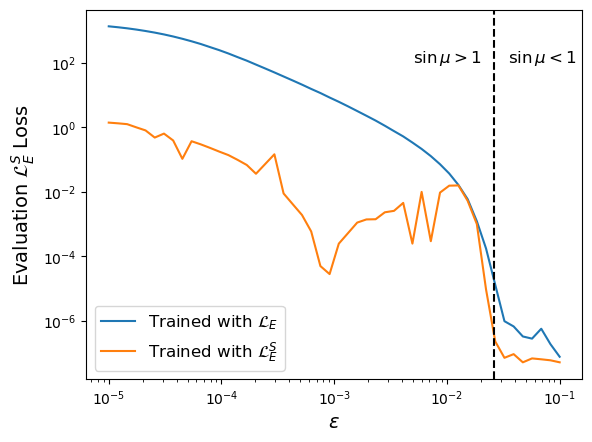

In [125]:
fig = plt.figure()
plt.plot(scan_range, mean_losses)
plt.plot(scan_range, mean_losses2)
plt.axvline(x = (10-np.sqrt(85))/30, color = 'k', label = 'axvline - full height', linestyle='--')
#plt.plot(scan_range, log_res_path['sinmus'])


plt.legend(['Trained with $\mathcal{L}_E$', 'Trained with $\mathcal{L}_E^S$'], fontsize=12)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\epsilon$', fontsize = 14)
plt.ylabel('Evaluation $\mathcal{L}_E^S$ Loss', fontsize = 14)
plt.text(0.035,100, '$\sin \mu <1$', fontsize=12)
plt.text(0.005,100, '$\sin \mu >1$', fontsize=12)
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Losses_Diff/scaled_eval.pdf',bbox_inches='tight')

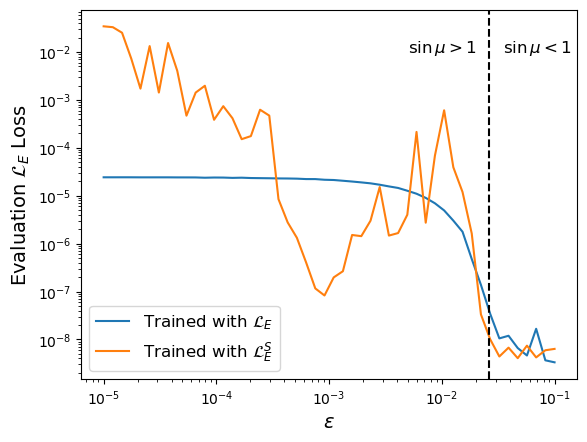

In [126]:
fig = plt.figure()
plt.plot(scan_range, mean_losses_no_s)
plt.plot(scan_range, mean_losses_no_s2)
plt.axvline(x = (10-np.sqrt(85))/30, color = 'k', label = 'axvline - full height', linestyle='--')
plt.legend(['Trained with $\mathcal{L}_E$', 'Trained with $\mathcal{L}_E^S$'], fontsize=12)
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\epsilon$', fontsize = 14)
plt.ylabel('Evaluation $\mathcal{L}_E$ Loss', fontsize = 14)
plt.text(0.035, 0.01, '$\sin \mu <1$', fontsize=12)
plt.text(0.005, 0.01, '$\sin \mu >1$', fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Losses_Diff/base_eval.pdf',bbox_inches='tight')

In [187]:
fig = plt.figure()
plt.plot(zpointseval.cpu(), log_res_path['phiresults'][45], color='tab:blue')
plt.plot(zpointseval.cpu(), log_res_path2['phiresults'][45], color='tab:orange', linestyle='--')
plt.legend(['$\mathcal{{L}}_E$ trained / $\sin \mu = {:.2f}$'.format(log_res_path['sinmus'][45]), '$\mathcal{{L}}_E^S$ trained / $\sin \mu = {:.2f}$'.format(log_res_path['sinmus'][45])], fontsize=10)
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$\phi(z)$', fontsize=14)
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Losses_Diff/phases_low_sinmu.pdf',bbox_inches='tight')

fig = plt.figure()
plt.plot(zpointseval.cpu(), log_res_path['phiresults'][24], color='tab:blue')
plt.plot(zpointseval.cpu(), log_res_path2['phiresults'][24], color='tab:orange')
plt.legend(['$\mathcal{{L}}_E$ trained / $\sin \mu = {:.2f}$'.format(log_res_path['sinmus'][24]), '$\mathcal{{L}}_E^S$ trained / $\sin \mu = {:.2f}$'.format(log_res_path['sinmus'][24])], fontsize=10)
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$\phi(z)$', fontsize=14)
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Losses_Diff/phases_high_sinmu.pdf',bbox_inches='tight')

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_21867/2041637449.py:14: UserWarning: Matplotlib is currently using pgf, which is a non-GUI backend, so cannot show the figure.
  plt.show()
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_21867/2041637449.py:23: UserWarning: Matplotlib is currently using pgf, which is a non-GUI backend, so cannot show the figure.
  plt.show()
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unknown font: Latin Modern Roman
Ignoring unkno

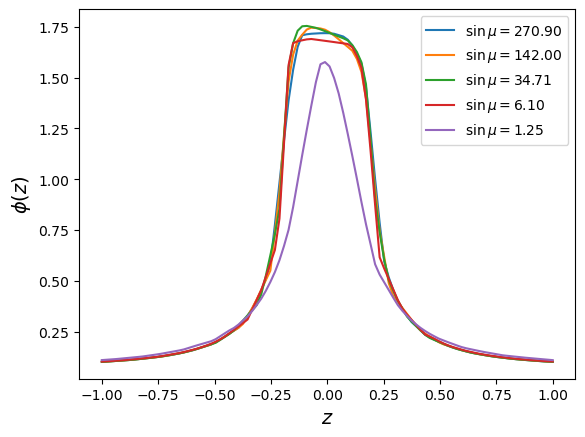

In [154]:
sinumleg=[]
for i in range(5):
    plt.plot(zpointseval.cpu(), log_res_path['phiresults'][i*10])
    sinumleg.append('$\sin \mu = {:.2f}$'.format(log_res_path['sinmus'][i*10]))
plt.xlabel('$z$', fontsize=14)
plt.legend(sinumleg)
plt.ylabel('$\phi(z)$', fontsize=14)
plt.show()

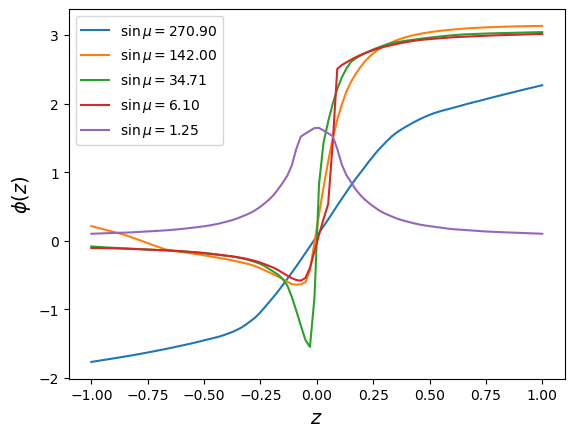

In [155]:
sinumleg=[]
for i in range(5):
    plt.plot(zpointseval.cpu(), log_res_path2['phiresults'][i*10])
    sinumleg.append('$\sin \mu = {:.2f}$'.format(log_res_path2['sinmus'][i*10]))
plt.xlabel('$z$', fontsize=14)
plt.legend(sinumleg)
plt.ylabel('$\phi(z)$', fontsize=14)
plt.show()

### Scan over linear functions

##### Assessing the existence

The idea here is to parametrize the differential cross section as $B(z)=az+b >0$ and map out the loss landscape. This will allow us to have a handle on the existence of a solution. We will tackle uniqueness later

Define the polynomial $B(z)$ network

In [9]:
class ModuleNetPolynomial(nn.Module):
    """
    Class for parametrizing the given differential cross section as a polynomial
    The input parameters correspond to the different weights of the polynomial
    """
    def __init__(self, polynomial_coeffs=None, device='cpu'):
        super(ModuleNetPolynomial, self).__init__()
        self.polynomial_coeffs = polynomial_coeffs
        self.device = device
        
    def forward(self, x):
        """
        Network forward pass is given by constructing the appropriate polynomial function
        """
        y = torch.zeros(x.size(), device=self.device)
        
        for i , coeff in enumerate(self.polynomial_coeffs):
            y = y + coeff * torch.pow(x, i)
        
        return y

##### Evaluation and plotting scripts

In [20]:
def eval_run_scans(trained_solver, params, device, neptune_run, steps_eval=100):
    """
    At evaluation we verify if the integral equation is satisfied. 
    For this we take a larger sample of z points
    """
    
    # Make sure we are in evaluation mode
    trained_solver.phi_net.eval()
    with torch.no_grad(): 
        
        # Create the evaluation points and compute the phase at those points
        zpointstest = torch.linspace(-1,1,steps=steps_eval, device=device)
        
        # Also log the final loss values. Including the loss at individual z values
        trained_solver.scaled_loss = True
        eval_loss_scaled = trained_solver.loss_function(zpointstest)
        
        if neptune_run is not None:        
            neptune_run['metrics/eval_loss_scaled'].log(eval_loss_scaled)
        
        trained_solver.scaled_loss = False
        eval_loss_base = trained_solver.loss_function(zpointstest)
        
        if neptune_run is not None:   
            neptune_run['metrics/eval_loss_base'].log(eval_loss_base)
        
        # Look at sim mu value
        sinmu = max((sin_mu_integral(params, device, trained_solver, zpointstest)).cpu())

    return sinmu, eval_loss_scaled, eval_loss_base

In [11]:
def plot_contour_loss_curves_linear(log_results, neptune_run, tags_scan, log_type='natural', logging=True):
    # Plot the log of the loss
    if log_type == 'base10':
        loss_scale = np.log10(log_results['loss_scale'])
        loss_no_scale = np.log10(log_results['loss_no_scale'])
    elif log_type == 'natural':
        loss_scale = np.log(log_results['loss_scale'])
        loss_no_scale = np.log(log_results['loss_no_scale'])
    else:
        raise NotImplemented
        
    sin_mu = log_results['sinmu']
    
    min_a = min(log_results['params'][:,0])
    max_a = max(log_results['params'][:,0])
    min_b = min(log_results['params'][:,1])
    max_b = max(log_results['params'][:,1])
    
    fig = plt.figure(figsize=(14, 10))

    plt.imshow(loss_scale, extent=[min_b,max_b,min_a,max_a], cmap='jet', vmax=-2, origin='lower')       
    plt.xlabel('$b$ parameter')
    plt.ylabel('$a$ parameter')    
    plt.title('Normalized loss lanscape of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.colorbar()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_loss_scale'].upload(File.as_image(fig))
    plt.close(fig)
    
    fig2 = plt.figure(figsize=(14, 10))

    plt.imshow(loss_no_scale, extent=[min_b,max_b,min_a,max_a], cmap='jet', vmax=-2, origin='lower')       
    plt.xlabel('$b$ parameter')
    plt.ylabel('$a$ parameter')    
    plt.title('Base loss lanscape of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.colorbar()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_loss_no_scale'].upload(File.as_image(fig2))
    plt.close(fig2)
    
        
    fig3 = plt.figure(figsize=(14, 10))

    plt.imshow(sin_mu, extent=[min_b,max_b,min_a,max_a], cmap='jet', vmax=1.5, origin='lower')       
    plt.xlabel('$b$ parameter')
    plt.ylabel('$a$ parameter')    
    plt.title('$\sin \mu$ value of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.colorbar()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_sinmu'].upload(File.as_image(fig3))
    plt.close(fig3)

In [12]:
def plot_sinmu_losses(log_results, neptune_run, tags_scan, log_type='natural', logging=True):
    
    sin_mu = log_results['sinmu'].flatten()
    
    if log_type == 'base10':
        loss_scalef = np.log10(log_results['loss_scale']).flatten()
        loss_no_scalef = np.log10(log_results['loss_no_scale']).flatten()
        sin_muf = np.log10(log_results['sinmu'].flatten())
        add_str = '10'
    elif log_type == 'natural':
        loss_scalef = np.log(log_results['loss_scale']).flatten()
        loss_no_scalef = np.log(log_results['loss_no_scale']).flatten()
        sin_muf = np.log(log_results['sinmu'].flatten())
        add_str = ''
    else:
        raise NotImplemented

    fig = plt.figure(figsize=(14, 10))

    plt.scatter(sin_muf, loss_scalef, c='b')       
    plt.xlabel('$\log_{{{}}}(\sin \mu)$ parameter'.format(add_str))
    plt.ylabel('Log{} loss'.format(add_str))    
    plt.title('Normalized loss lanscape of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.show()
    if logging:
        neptune_run[f'evaluation/sinmu_loss_scale'].upload(File.as_image(fig))
    plt.close(fig)
    
    fig2 = plt.figure(figsize=(14, 10))

    plt.scatter(sin_muf, loss_no_scalef, c='g')       
    plt.xlabel('$\log_{{{}}}(\sin \mu)$ parameter'.format(add_str))
    plt.ylabel('Log{} loss'.format(add_str))    
    plt.title('Base loss lanscape of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.show()
    if logging:
        neptune_run[f'evaluation/sinmu_loss_no_scale'].upload(File.as_image(fig2))
    plt.close(fig2)
    
    
    
    fig3 = plt.figure(figsize=(14, 10))

    plt.scatter(sin_mu, loss_scalef, c='b')       
    plt.xlabel('$\sin \mu$ parameter')
    plt.ylabel('Log{} loss'.format(add_str))    
    plt.xlim([0,3])
    plt.title('Normalized loss lanscape of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.show()
    if logging:
        neptune_run[f'evaluation/sinmu_loss_scale_r'].upload(File.as_image(fig3))
    plt.close(fig3)
    
    fig4 = plt.figure(figsize=(14, 10))

    plt.scatter(sin_mu, loss_no_scalef, c='g')       
    plt.xlabel('$\sin \mu$ parameter')
    plt.ylabel('Log{} loss'.format(add_str))    
    plt.xlim([0,3])
    plt.title('Base loss lanscape of $B(z)={}$'.format(tags_scan['constant function']), fontsize = 15)
    plt.show()
    if logging:
        neptune_run[f'evaluation/sinmu_loss_no_scale_r'].upload(File.as_image(fig4))
    plt.close(fig4)
    

##### Main scanning loop over  $B(z) = az+b$

Note: For a 30*30 grid this will take a very long time (half a day)

In [112]:
num_a = 30
num_b = 30

scan_range_a = np.linspace(-0.5, 0.5, num=num_a)
scan_range_b = np.linspace(0, 1.25, num=num_b)
param_grid = np.dstack(np.meshgrid(scan_range_a, scan_range_b)).reshape(-1, 2)


if use_neptune_logging:
    run_scan = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_LinScanf")
else:
    run_scan = None

log_res = {'params':param_grid, 'sinmu':np.empty([num_a, num_b]), 'loss_scale':np.empty([num_a, num_b]), 'loss_no_scale':np.empty([num_a, num_b])}

for i, params_lin in tqdm(enumerate(param_grid)):
    
    a_index = i % num_a
    b_index = int((i - i % num_a)/num_a)
    
    # Ensure that the differential cross section is positive for all z values
    if params_lin[1] > abs(params_lin[0]):

        params_scan = {'batch_size': 64,
                 'epochs_num': 2000,
                 'repulsive_epochs': None,
                 'repulsive_type' : None,
                 'learning_rate': 0.003,
                 'lr_scheduler': True, 
                 'beta1' : 0.9,
                 'beta2' : 0.999,
                 'integral_points': 25,
                 'method_int': 'trapz',
                 'activation': 'ReLU',
                 'layer_list': [64, 64, 64, 64],
                 'func_class': None,
                 'final_layer': 'Tanh',
                 'loss': 'MSE',
                 'scaled_loss': True,
                 'scan_param': None,
                 'num_nets' : 1,
                 'p_value': 2,
                 'lambda_repulsive': 0.0}
        
        tags_scan = {'constant function': 'az+b', 'optimizer': 'Adam', 'Mode': 'Scan param linear'}
        
        if use_neptune_logging:
            run_scan["sys/tags"].add(list(tags_scan.values()))
            run_scan['parameters'] = params_scan
        
        
        modnet = ModuleNetPolynomial(polynomial_coeffs=np.flip(params_lin), device=device)
        netsolver = train_run(params_scan, device, run_scan, module_net=modnet)

        sinmu, loss_scale, loss_no_scale = eval_run_scans(netsolver, params_scan, device, run_scan)
        log_res['sinmu'][a_index, b_index] = sinmu.cpu().numpy()
        log_res['loss_scale'][a_index, b_index] = loss_scale.cpu().numpy()
        log_res['loss_no_scale'][a_index, b_index] = loss_no_scale.cpu().numpy()
    else:
        log_res['sinmu'][a_index, b_index] = np.nan
        log_res['loss_scale'][a_index, b_index] = np.nan
        log_res['loss_no_scale'][a_index, b_index] = np.nan

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1813
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


0it [00:00, ?it/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Error occurred during asynchronous operation processing: Cannot log infinite or NaN value to attribute metrics/eval_loss_scaled


  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Error occurred during asynchronous operation processing: Cannot log infinite or NaN value to attribute metrics/eval_loss_scaled


  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Error occurred during asynchronous operation processing: Cannot log infinite or NaN value to attribute metrics/eval_loss_scaled


  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Error occurred during asynchronous operation processing: Cannot log infinite or NaN value to attribute metrics/eval_loss_scaled


  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
Communication with Neptune restored!


  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

Exception in thread NeptuneWebhooks:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
    bytes_ = _recv()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 87, in _recv
    return sock.recv(bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1227, in recv
    return self.read(buflen)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1102, in read
    return self._sslobj.read(len)
TimeoutError: [Errno 60] Operation timed out

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/ne

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

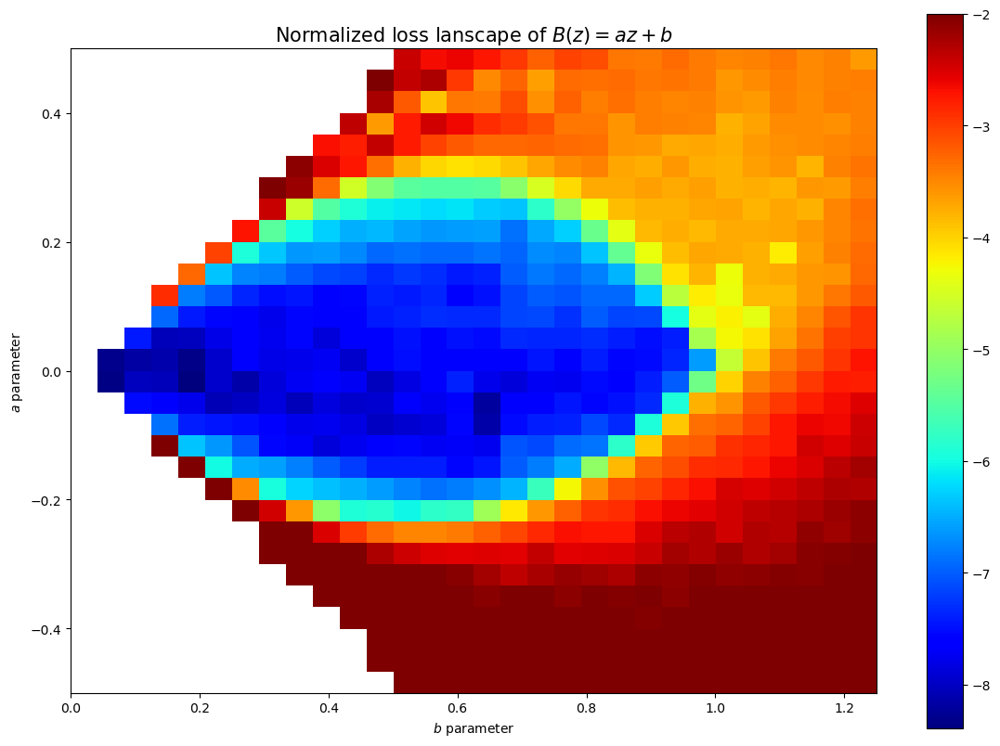

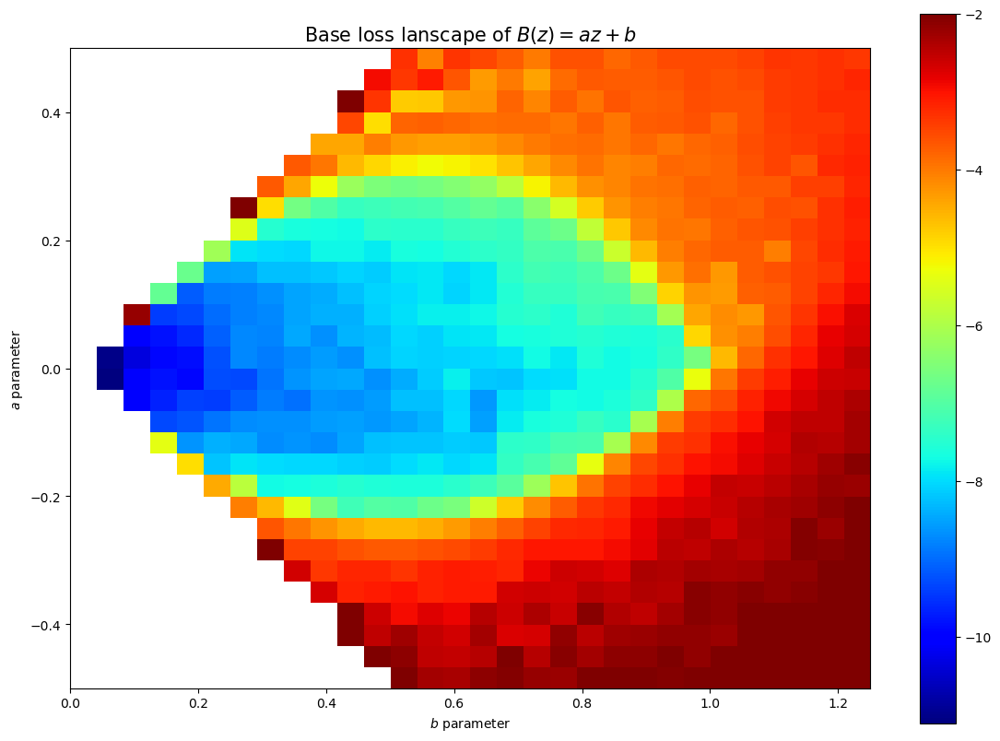

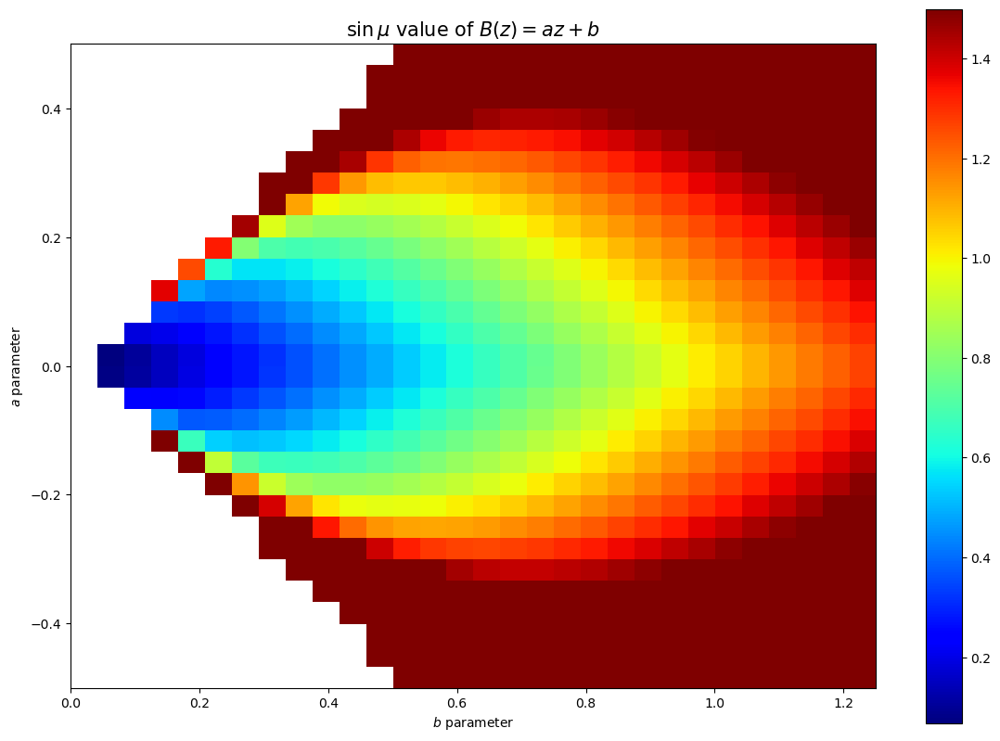

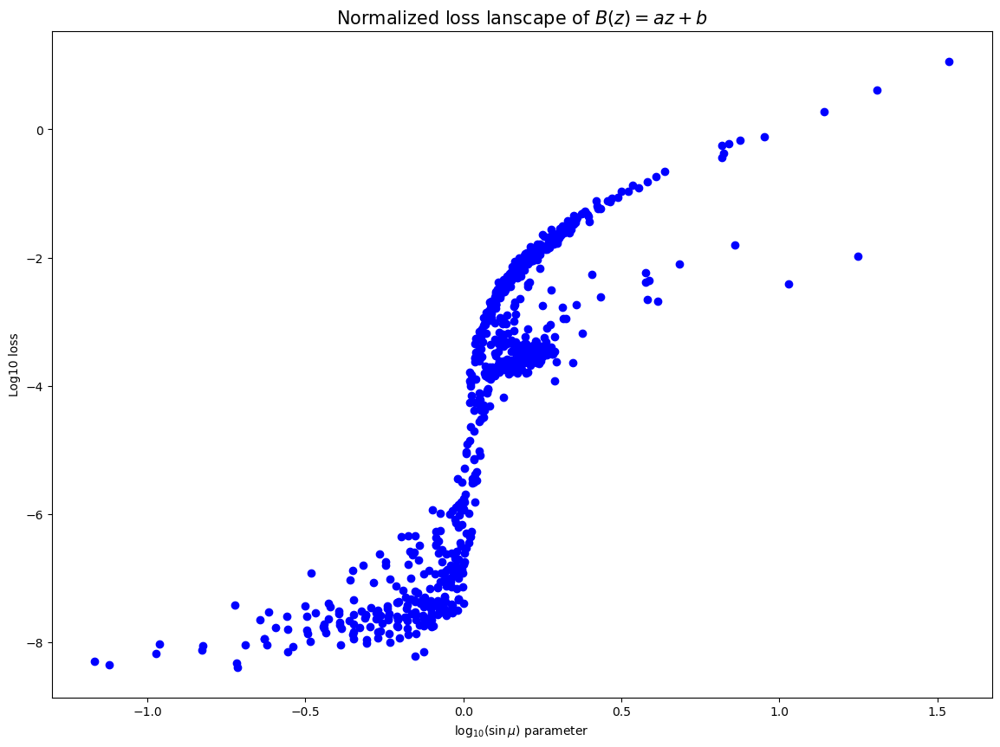

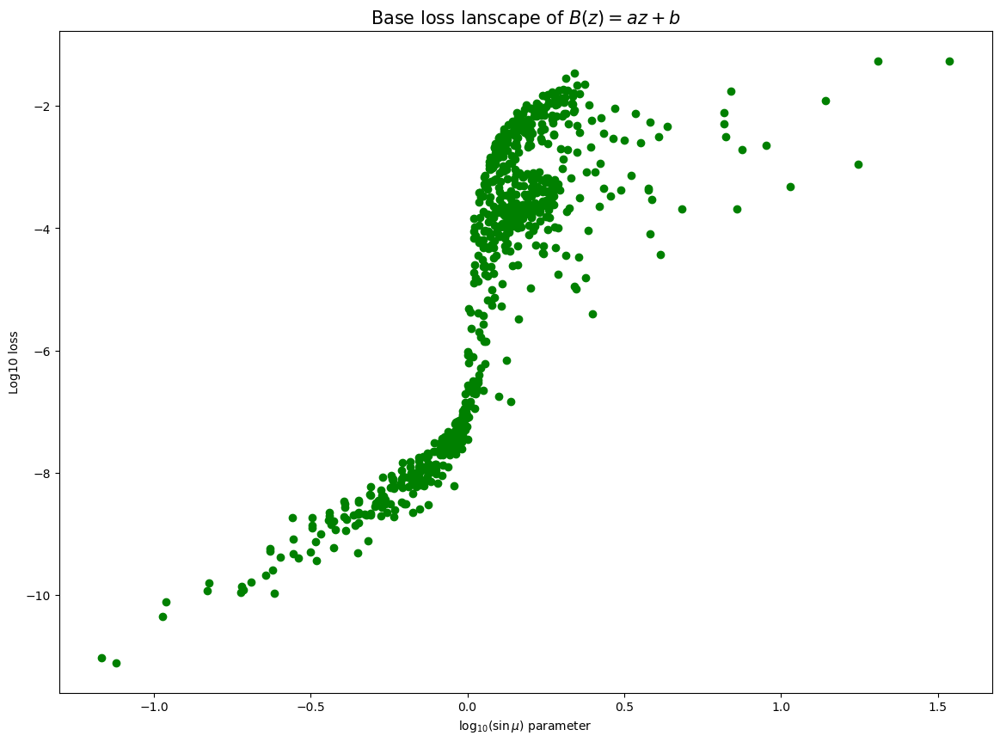

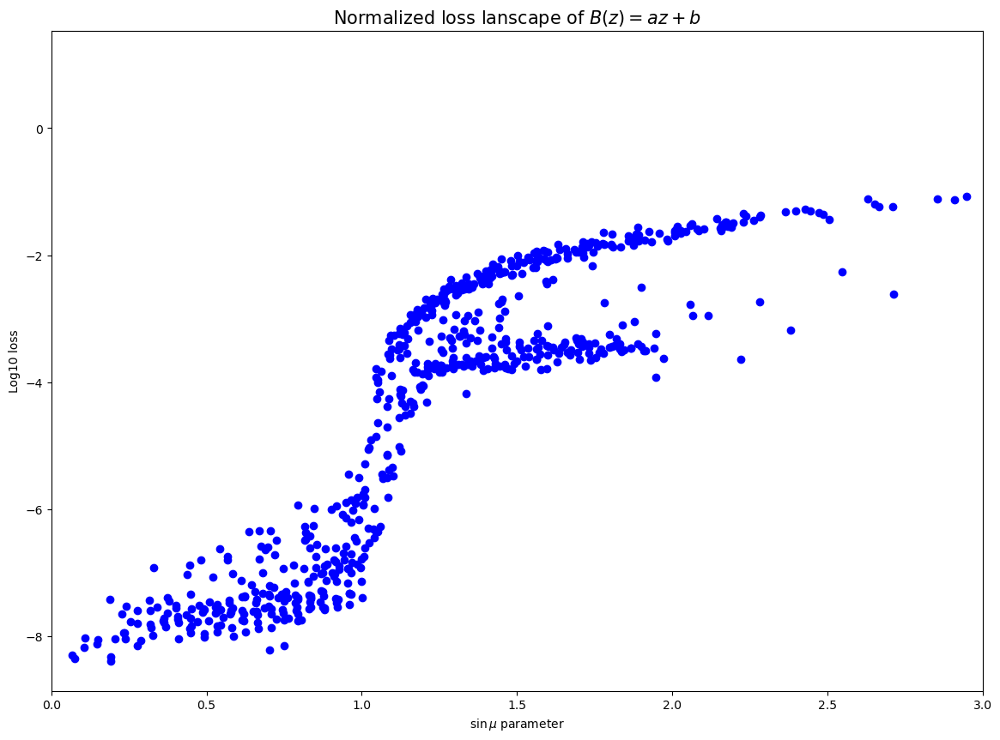

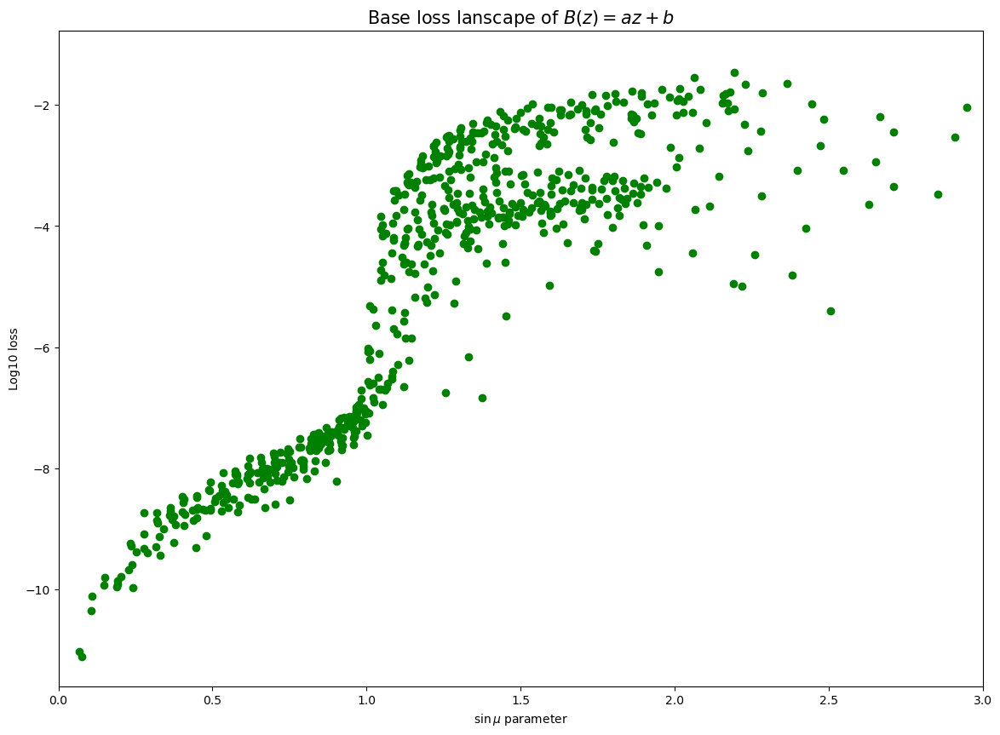

In [117]:
plot_contour_loss_curves_linear(log_res, run_scan, tags_scan, log_type='base10',logging=False)
plot_sinmu_losses(log_res, run_scan, tags_scan, log_type='base10',logging=False)

In [120]:
#path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans/'

for key in log_res.keys():
    end_path = '_linear.npy'
    path = path_save + str(key) + end_path
    np.save(path, log_res[key])

In [118]:
# Make sure to kill the Neptune logger run
if run_scan is not None:
    run_scan.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 11 operations to synchronize with Neptune. Do not kill this process.
All 11 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1813


Nice pictures

In [259]:
def plt_boundaries():
    b = np.linspace(0,1,100)
    a1 = 3/2 - (1/2)*np.sqrt(3)*np.sqrt(3 + 4*b - 4*b**2)
    a2 = 3/2 - (1/2)*np.sqrt(3)*np.sqrt(3 - 4*b + 4*b**2)
    
    plt.plot(b,a1,'k-', lw=2)
    plt.plot(b,a2,'k-', lw=2)

Load the data if necessary (if we have it saved and don't want to rerun)

In [248]:
#path_init = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans/'
log_res = {'params':[], 'sinmu': [], 'loss_scale':[], 'loss_no_scale':[]}


for key in log_res.keys():
    end_path = '_linear.npy'
    path = path_init + str(key) + end_path
    array_data = np.load(path) 
    log_res[key] = array_data

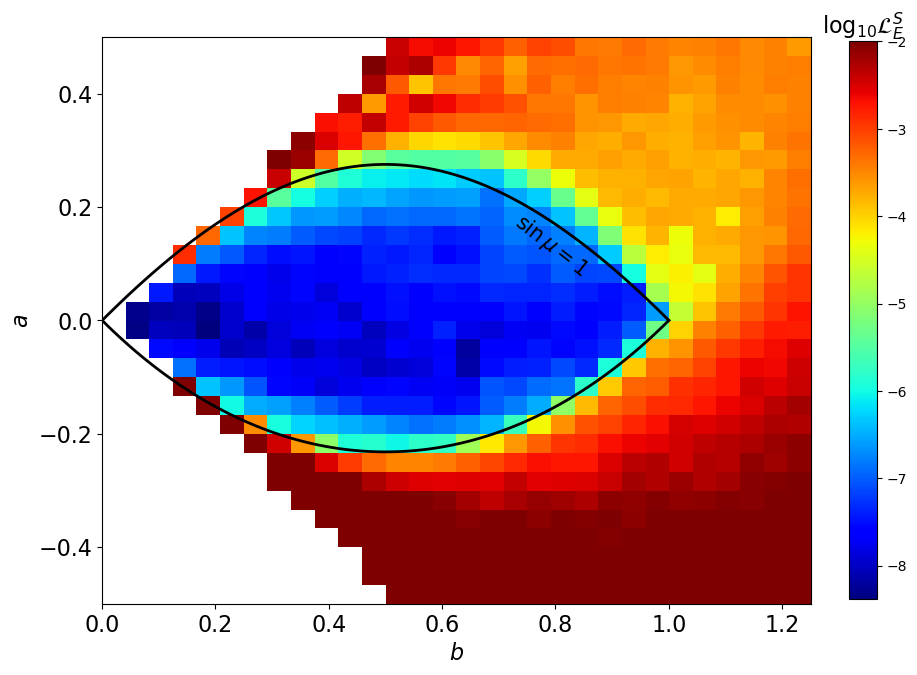

In [270]:
loss_scaled = np.log10(log_res['loss_scale'])
loss_no_scaled = np.log10(log_res['loss_no_scale'])
      
min_a = min(log_res['params'][:,0])
max_a = max(log_res['params'][:,0])
min_b = min(log_res['params'][:,1])
max_b = max(log_res['params'][:,1])
    
fig = plt.figure(figsize=[10,10])

im = plt.imshow(loss_scaled, extent=[min_b,max_b,min_a,max_a], cmap='jet', vmax=-2, origin='lower')       
plt.xlabel('$b$', fontsize = 16)
plt.xticks(fontsize=16)
plt.ylabel('$a$', fontsize = 16)  
plt.yticks(fontsize=16)
plt.text(0.72, 0.079, '$\sin \mu =1$', fontsize=15, rotation = -38)
cbar = plt.colorbar(im,fraction=0.036)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E^S$', fontsize=16)
plt_boundaries()
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/linear_scaled_loss.pdf',bbox_inches='tight')

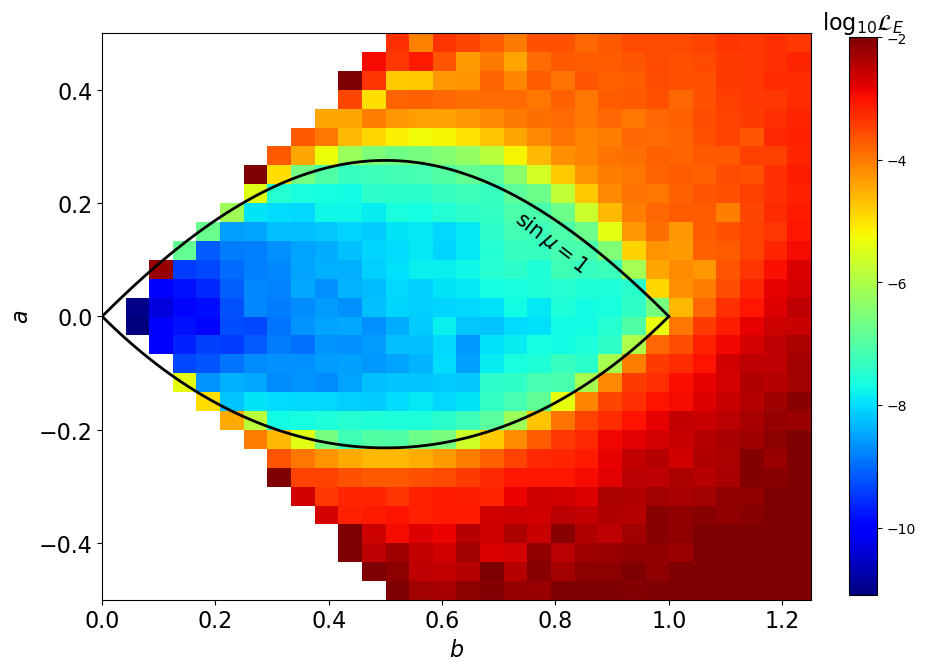

In [275]:
#### loss_scaled = np.log10(log_res['loss_scale'])
loss_no_scaled = np.log10(log_res['loss_no_scale'])
      
min_a = min(log_res['params'][:,0])
max_a = max(log_res['params'][:,0])
min_b = min(log_res['params'][:,1])
max_b = max(log_res['params'][:,1])
    
fig = plt.figure(figsize=[10,10])

im = plt.imshow(loss_no_scaled, extent=[min_b,max_b,min_a,max_a], cmap='jet', vmax=-2, origin='lower')       
plt.xlabel('$b$', fontsize = 16)
plt.xticks(fontsize=16)
plt.ylabel('$a$', fontsize = 16)  
plt.yticks(fontsize=16)
plt.text(0.72, 0.079, '$\sin \mu =1$', fontsize=15, rotation = -38)
cbar = plt.colorbar(im,fraction=0.036)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E$', fontsize=16)
plt_boundaries()
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/linear_base_loss.pdf',bbox_inches='tight')

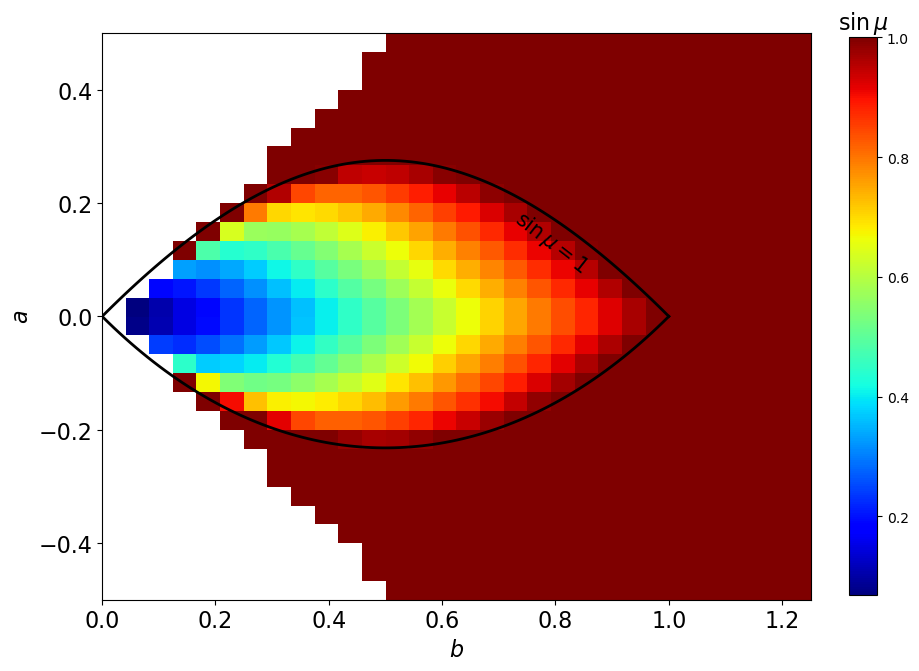

In [277]:
min_a = min(log_res['params'][:,0])
max_a = max(log_res['params'][:,0])
min_b = min(log_res['params'][:,1])
max_b = max(log_res['params'][:,1])
    
fig = plt.figure(figsize=[10,10])

im = plt.imshow(log_res['sinmu'], extent=[min_b,max_b,min_a,max_a], cmap='jet', vmax=1.0, origin='lower')       
plt.xlabel('$b$', fontsize = 16)
plt.xticks(fontsize=16)
plt.ylabel('$a$', fontsize = 16)  
plt.yticks(fontsize=16)  
plt.text(0.72, 0.079, '$\sin \mu =1$', fontsize=15, rotation = -38)
cbar = plt.colorbar(im,fraction=0.036)
cbar.ax.set_title('$\sin \mu $', fontsize=16)
plt_boundaries()
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/linear_sin_mu_zoom.pdf',bbox_inches='tight')

##### Moving to a quadratic $B(z) = az^2+c$

In [77]:
num_a = 30
num_c = 30

scan_range_a3 = np.linspace(2, 3, num=num_a)
scan_range_c3 = np.linspace(0, 1, num=num_c)
param_grid3 = np.dstack(np.meshgrid(scan_range_a3, scan_range_c3)).reshape(-1, 2)


if use_neptune_logging:
    run_scan = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_QuadScan2")
else:
    run_scan = None

log_res3 = {'params':param_grid3, 'sinmu':np.empty([num_a, num_c]), 'loss_scale':np.empty([num_a, num_c]), 'loss_no_scale':np.empty([num_a, num_c])}

for i, params_lin in tqdm(enumerate(param_grid3)):
    
    a_index = i % num_a
    c_index = int((i - i % num_a)/num_a)
    
    # Differential cross section is positive for all z values


    params_scan = {'batch_size': 64,
                 'epochs_num': 2000,
                 'repulsive_epochs': None,
                 'repulsive_type' : None,
                 'learning_rate': 0.003,
                 'lr_scheduler': True, 
                 'beta1' : 0.9,
                 'beta2' : 0.999,
                 'integral_points': 25,
                 'method_int': 'trapz',
                 'activation': 'ReLU',
                 'layer_list': [64, 64, 64, 64],
                 'func_class': None,
                 'final_layer': 'Tanh',
                 'loss': 'MSE',
                 'scaled_loss': True,
                 'scan_param': None,
                 'num_nets' : 1,
                 'p_value': 2,
                 'lambda_repulsive': 0.0}
        
    

    tags_scan = {'constant function': 'az^2+c', 'optimizer': 'Adam', 'Mode': 'Scan param quadratic'}

    if use_neptune_logging:
        run_scan["sys/tags"].add(list(tags_scan.values()))
        run_scan['parameters'] = params_scan

    coeffs_scan = np.array([params_lin[1], 0.0, params_lin[0]])

    modnet = ModuleNetPolynomial(polynomial_coeffs=coeffs_scan, device=device)
    netsolver = train_run(params_scan, device, run_scan, module_net=modnet)

    sinmu, loss_scale, loss_no_scale = eval_run_scans(netsolver, params_scan, device, run_scan)
    log_res3['sinmu'][a_index, c_index] = sinmu.cpu().numpy()
    log_res3['loss_scale'][a_index, c_index] = loss_scale.cpu().numpy()
    log_res3['loss_no_scale'][a_index, c_index] = loss_no_scale.cpu().numpy()

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1850
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


0it [00:00, ?it/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

  0%|          | 0/2000 [00:00<?, ?epoch/s]

In [78]:
# Save the results

#path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans/'

for key in log_res3.keys():
    end_path = '_quadratic_scaled23.npy'
    path = path_save + str(key) + end_path
    np.save(path, log_res3[key])

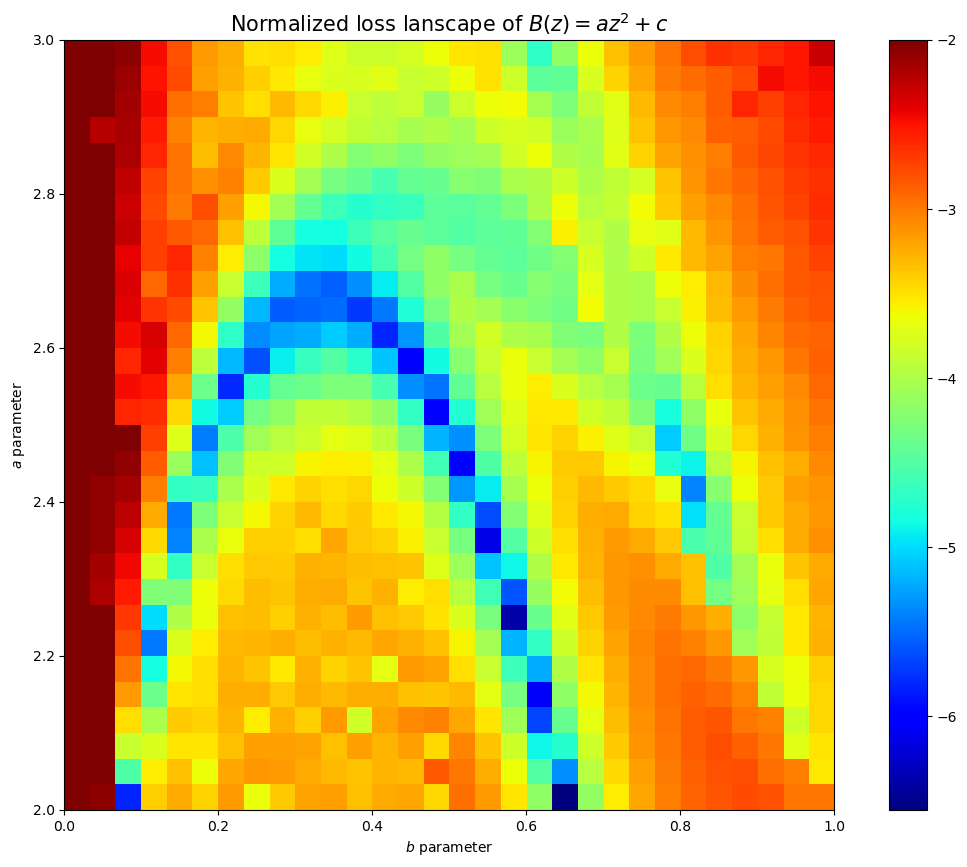

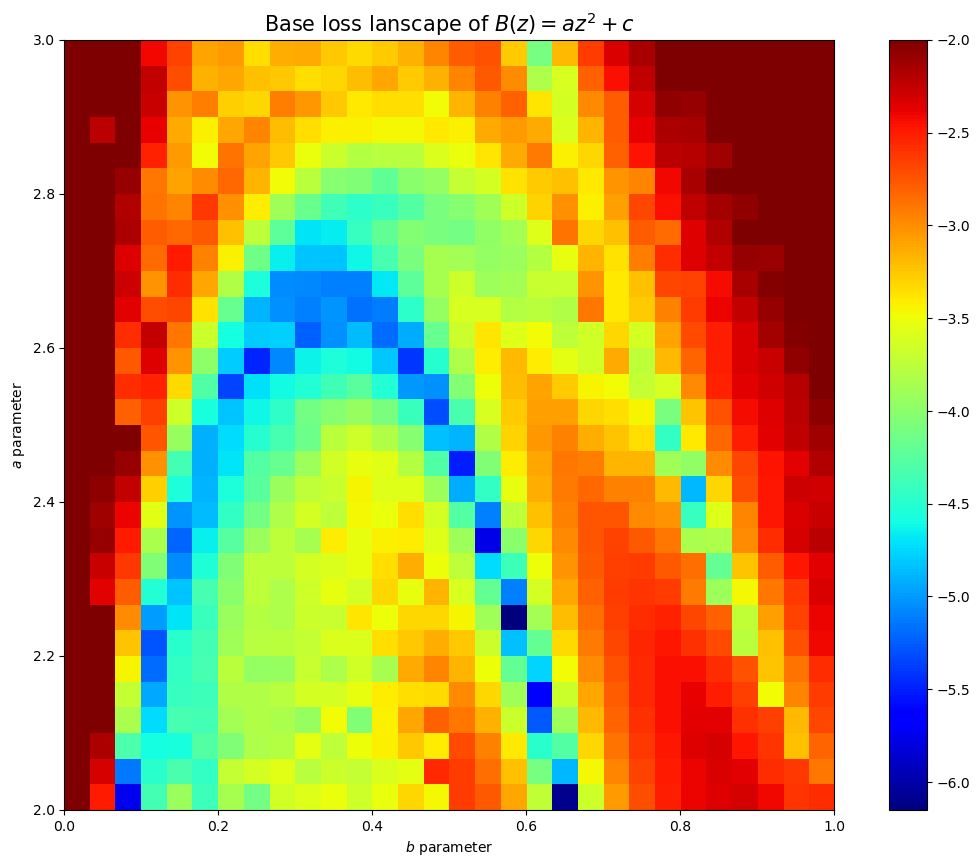

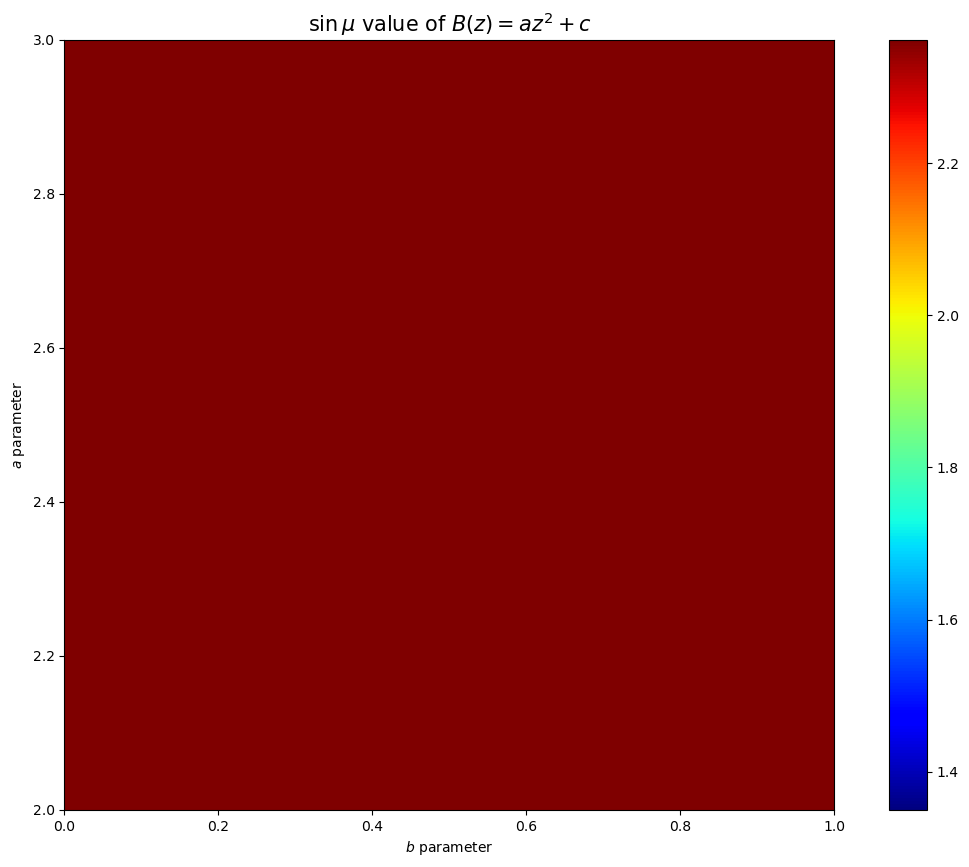

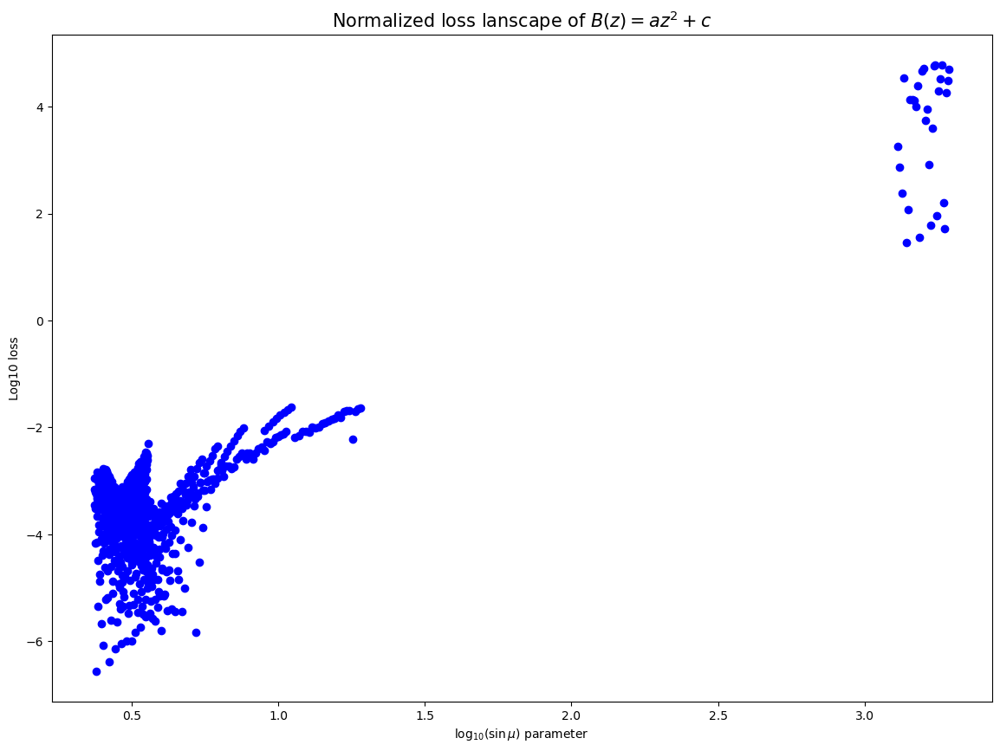

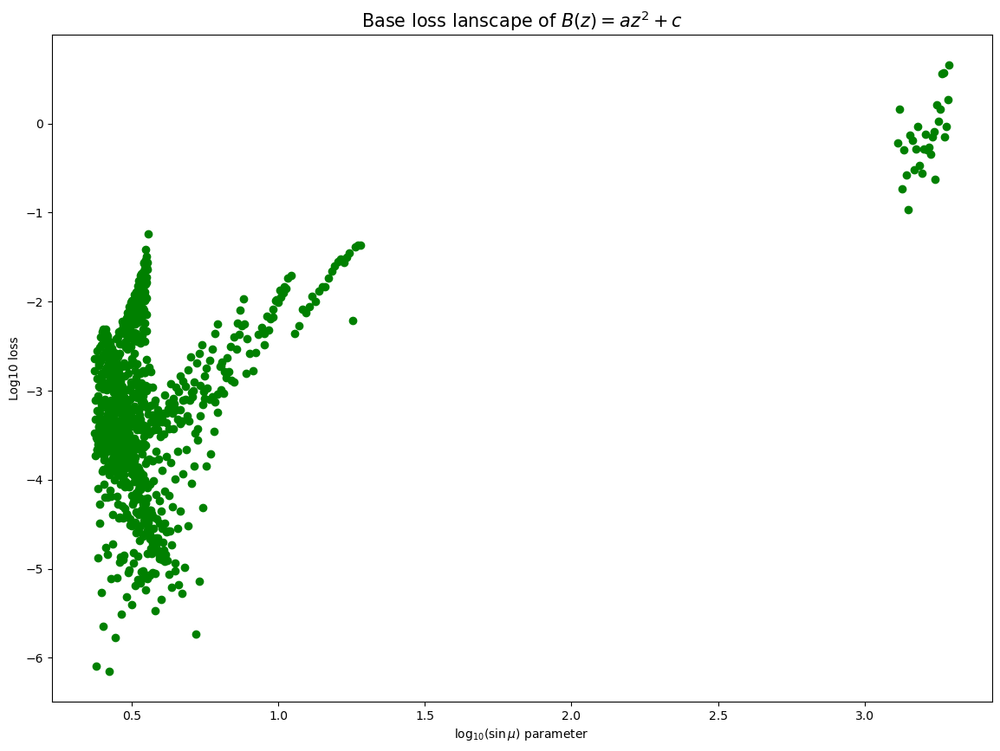

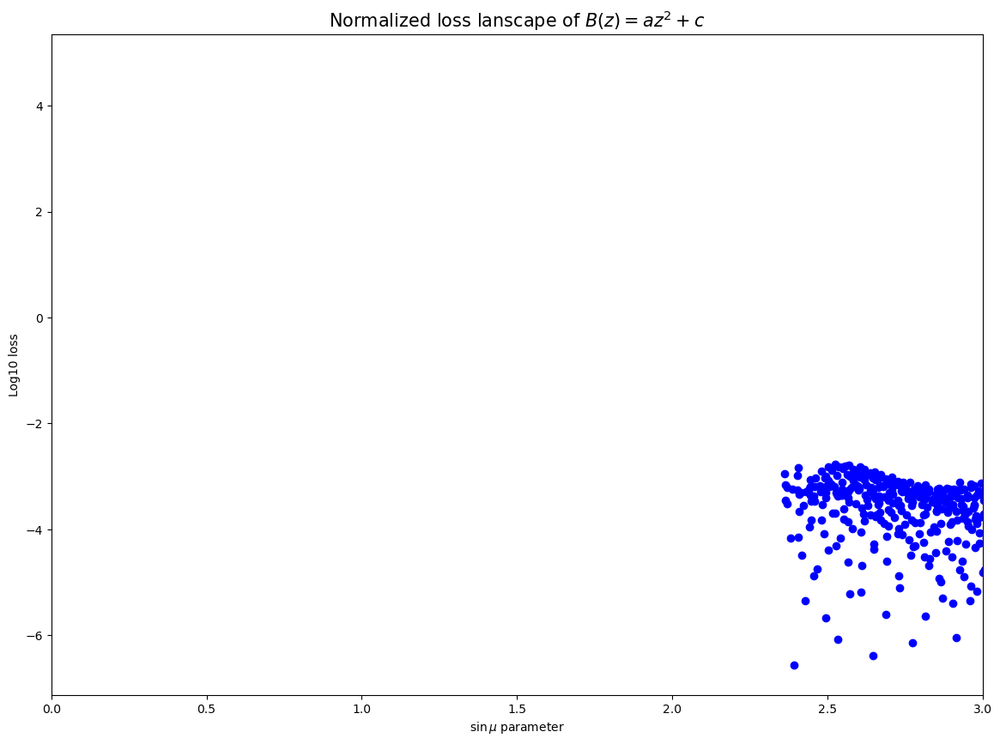

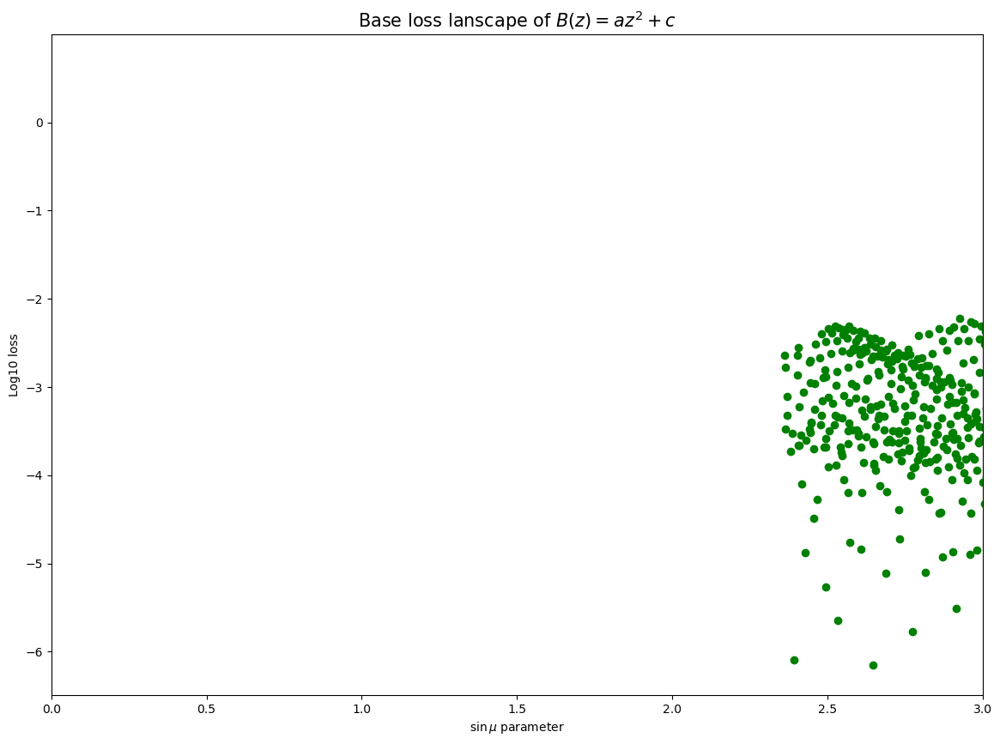

In [79]:
plot_contour_loss_curves_linear(log_res3, run_scan, tags_scan, log_type='base10', logging=False)
plot_sinmu_losses(log_res3, run_scan, tags_scan, log_type='base10', logging=False)

In [80]:
# Make sure to kill the Neptune logger run
if run_scan is not None:
    run_scan.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 60 operations to synchronize with Neptune. Do not kill this process.
All 60 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1850


Nice pictures

In [30]:
def plt_boundaries2(sinmu=1):
    c = np.linspace(0,1,100)
    a = -5*c + np.sqrt(5)*np.sqrt(c*(3*sinmu+2*c))
    plt.plot(c,a,'k-', lw=2)

In [20]:
# Load if needed

#path_init = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans/'
log_res3 = {'params':[], 'sinmu': [], 'loss_scale':[], 'loss_no_scale':[]}


for key in log_res3.keys():
    end_path = '_quadratic.npy'
    path = path_init + str(key) + end_path
    array_data = np.load(path) 
    log_res3[key] = array_data

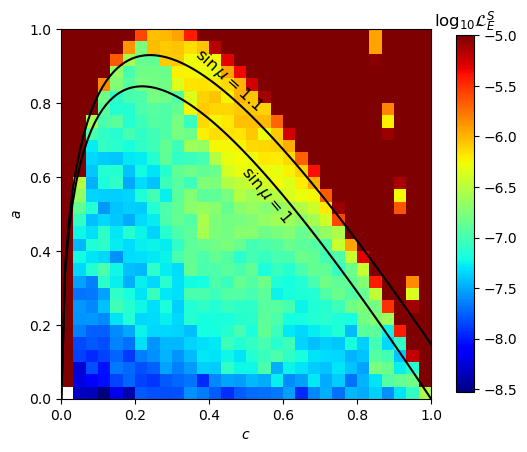

In [76]:
loss_scaled3 = np.log10(log_res3['loss_scale'])
      
min_a = min(log_res3['params'][:,0])
max_a = max(log_res3['params'][:,0])
min_c = min(log_res3['params'][:,1])
max_c = max(log_res3['params'][:,1])
    
fig = plt.figure()

im = plt.imshow(loss_scaled3, extent=[min_c,max_c,min_a,max_a], cmap='jet', vmax=-5.0, origin='lower')       
plt.xlabel('$c$')
plt.ylabel('$a$')  
plt.text(0.476, 0.477, '$\sin \mu =1$', fontsize=12, rotation = -50)
plt.text(0.35, 0.78, '$\sin \mu =1.1$', fontsize=12, rotation = -42)
cbar = plt.colorbar(im,fraction=0.036)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E^S$')
plt_boundaries2(sinmu=1.0)
plt_boundaries2(sinmu=1.1)
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/squadratic_scaled_loss2.pdf',bbox_inches='tight')

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31147/256381498.py:1: RuntimeWarning: divide by zero encountered in log10
  loss_no_scaled3 = np.log10(log_res3['loss_no_scale'])


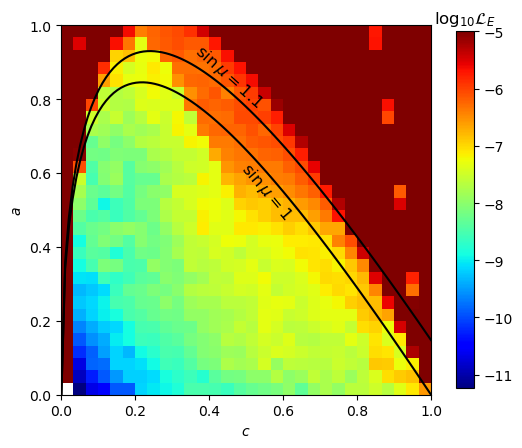

In [64]:
loss_no_scaled3 = np.log10(log_res3['loss_no_scale'])
      
min_a = min(log_res3['params'][:,0])
max_a = max(log_res3['params'][:,0])
min_c = min(log_res3['params'][:,1])
max_c = max(log_res3['params'][:,1])
    
fig = plt.figure()

im = plt.imshow(loss_no_scaled3, extent=[min_c,max_c,min_a,max_a], cmap='jet', vmax=-5.0, origin='lower')       
plt.xlabel('$c$')
plt.ylabel('$a$')  
plt.text(0.476, 0.477, '$\sin \mu =1$', fontsize=12, rotation = -50)
plt.text(0.35, 0.78, '$\sin \mu =1.1$', fontsize=12, rotation = -42)
cbar = plt.colorbar(im,fraction=0.036)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E$')
plt_boundaries2(sinmu=1.0)
plt_boundaries2(sinmu=1.1)
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/squadratic_base_loss2.pdf',bbox_inches='tight')

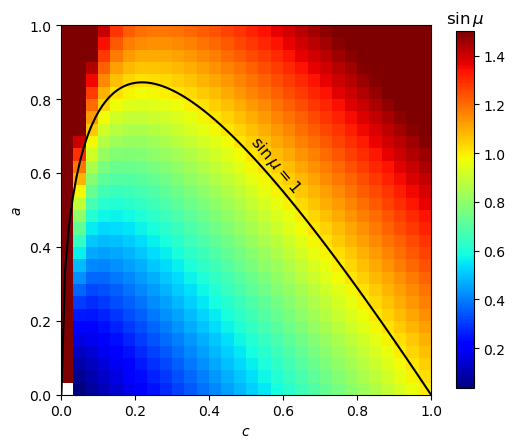

In [45]:
min_a = min(log_res3['params'][:,0])
max_a = max(log_res3['params'][:,0])
min_c = min(log_res3['params'][:,1])
max_c = max(log_res3['params'][:,1])
    
fig = plt.figure()

im = plt.imshow(log_res3['sinmu'], extent=[min_c,max_c,min_a,max_a], cmap='jet', vmax=1.5, origin='lower')       
plt.xlabel('$c$')
plt.ylabel('$a$')  
plt.text(0.5, 0.55, '$\sin \mu =1$', fontsize=12, rotation = -50)
cbar = plt.colorbar(im,fraction=0.036)
cbar.ax.set_title('$\sin \mu $')
plt_boundaries2()
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/quadratic_sin_mu.pdf',bbox_inches='tight')

Plot the complete extended region

In [26]:
# Load the full set of scans for the quadratic (done on cluster)

path_init = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans/'
log_res_full = {'params':[], 'sinmu': [], 'loss_scale':[], 'loss_no_scale':[]}

#path_ends = ['','_extended2','_extended3','23','_extended']

#for path_end in path_ends:
 #   for key in log_res_full.keys():
  #      end_path = '_quadratic_scaled' + path_end + '.npy'
   #     path = path_init + str(key) + end_path
    #    array_data = np.load(path) 
     #   log_res_full[key].extend(array_data.tolist())
        
for key in log_res_full.keys():
    end_path = '_quadratic_scaled_full.npy' 
    path = path_init + str(key) + end_path
    array_data = np.load(path) 
    log_res_full[key] = np.array(array_data)

In [28]:
def plt_boundaries_test():
    c = np.linspace(0,1,100)
    a = - 125*c/36 + (41/22)*np.sqrt((409/24-882*c/65)*c)
    plt.plot(c,a,'k-')

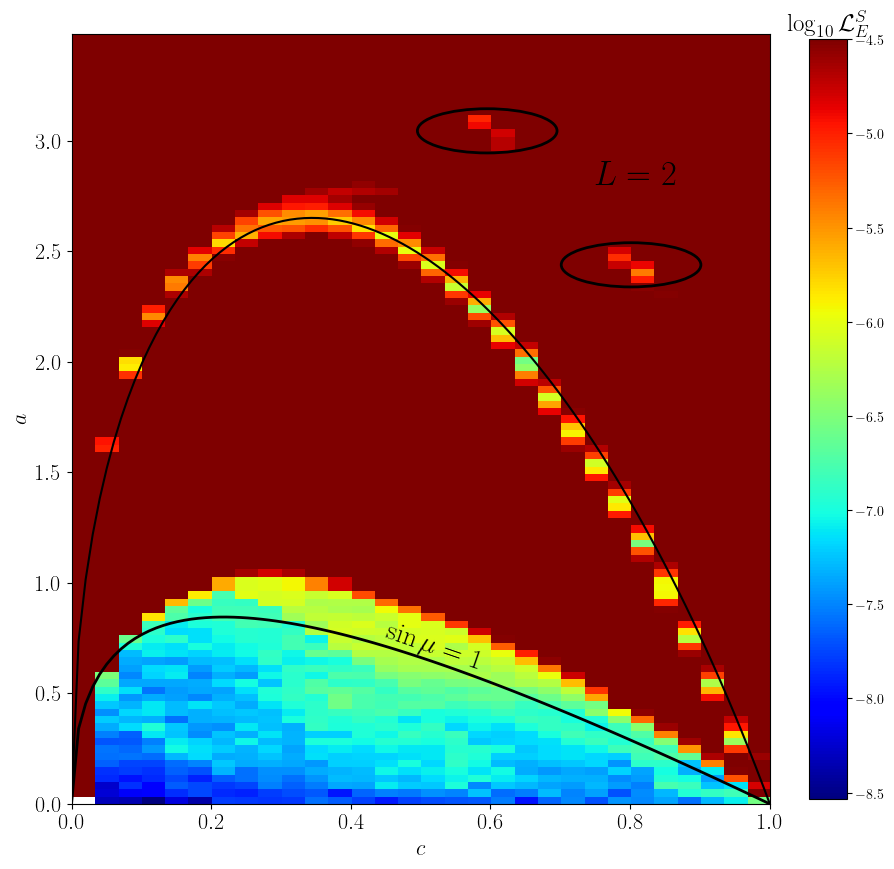

In [31]:
offset_pixel = (1/30)/2

loss_scaled_full = np.log10(log_res_full['loss_scale'])
      
min_a = min(log_res_full['params'][:,0])
max_a = max(log_res_full['params'][:,0])
min_c = min(log_res_full['params'][:,1])
max_c = max(log_res_full['params'][:,1])
    
fig = plt.figure(figsize=[10, 10])
ax = fig.gca()
im = plt.imshow(loss_scaled_full, extent=[min_c,max_c,min_a,max_a], cmap='jet', vmax=-4.5, origin='lower', aspect='auto')       
plt.xlabel('$c$', fontsize = 16)
plt.xticks(fontsize=16)
plt.ylabel('$a$', fontsize = 16)  
plt.yticks(fontsize=16)
plt.text(0.446, 0.607, '$\sin \mu =1$', fontsize=20, rotation = -19)
plt.text(0.75, 2.8, '$L=2$', fontsize=25)
cbar = plt.colorbar(im,fraction=0.049)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E^S$', fontsize=18)
plt_boundaries2(sinmu=1.0)
circle1 = plt.Circle(( 0.818- (offset_pixel) , 2.455- (offset_pixel) ), 0.1 , facecolor="none", edgecolor='black', lw=2)
circle2 = plt.Circle(( 0.612- (offset_pixel) , 3.061- (offset_pixel) ), 0.1 , facecolor="none", edgecolor='black', lw=2)
ax.add_artist(circle1)
ax.add_artist(circle2)
plt_boundaries_test()
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/squadratic_full_scaled_loss.pdf',bbox_inches='tight')

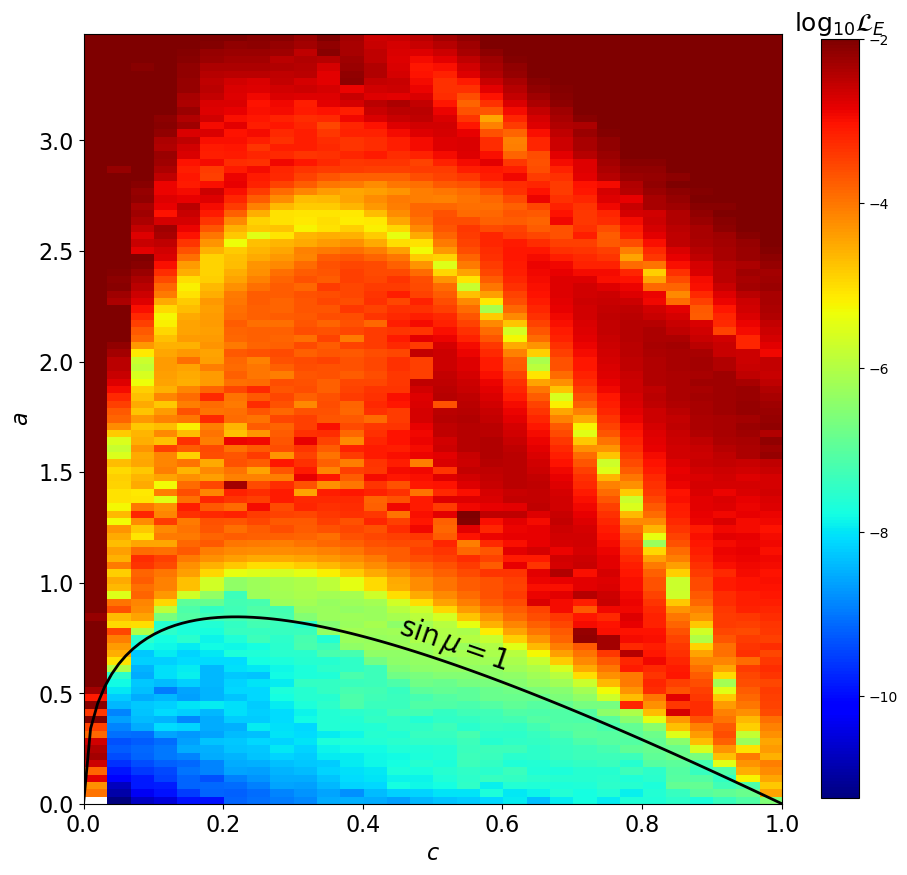

In [296]:
### loss_no_scaled_full = np.log10(log_res_full['loss_no_scale'])
      
min_a = min(log_res_full['params'][:,0])
max_a = max(log_res_full['params'][:,0])
min_c = min(log_res_full['params'][:,1])
max_c = max(log_res_full['params'][:,1])
    
fig = plt.figure(figsize=[10, 10])

im = plt.imshow(loss_no_scaled_full, extent=[min_c,max_c,min_a,max_a], cmap='jet', vmax=-2, origin='lower', aspect='auto')       
plt.xlabel('$c$', fontsize = 16)
plt.xticks(fontsize=16)
plt.ylabel('$a$', fontsize = 16)  
plt.yticks(fontsize=16)
plt.text(0.446, 0.607, '$\sin \mu =1$', fontsize=20, rotation = -19)
cbar = plt.colorbar(im,fraction=0.049)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E$', fontsize = 18)
plt_boundaries2(sinmu=1.0)
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/squadratic_full_no_scaled_loss.pdf',bbox_inches='tight')

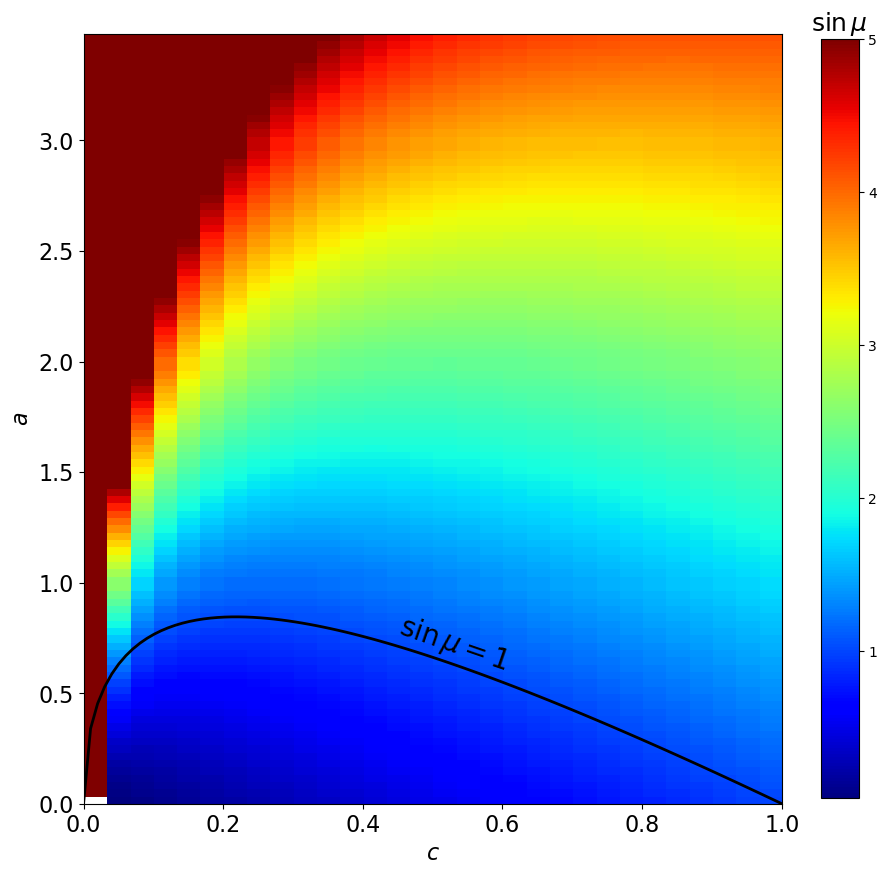

In [298]:
min_a = min(log_res_full['params'][:,0])
max_a = max(log_res_full['params'][:,0])
min_c = min(log_res_full['params'][:,1])
max_c = max(log_res_full['params'][:,1])
    
fig = plt.figure(figsize=[10, 10])

im = plt.imshow(log_res_full['sinmu'], extent=[min_c,max_c,min_a,max_a], cmap='jet', vmax=5, origin='lower', aspect='auto')       
plt.xlabel('$c$', fontsize = 16)
plt.xticks(fontsize=16)
plt.ylabel('$a$', fontsize = 16)  
plt.yticks(fontsize=16)  
plt.text(0.446, 0.607, '$\sin \mu =1$', fontsize=20, rotation = -19)
cbar = plt.colorbar(im,fraction=0.049)
cbar.ax.set_title('$\sin \mu $', fontsize=18)
plt_boundaries2()
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/quadratic_sin_mu.pdf',bbox_inches='tight')

Picture for close differential cross section

In [314]:
def analytic_close(z):
    """
    Define the analytic solution that has a differential cross section that is close to a quadratic one
    """
    
    delta_0 = 2.05132
    delta_1 = 0.457788
    delta_2 = -3.13145
    delta_3 = -3.12802
    
    return np.sin(delta_0) * np.exp(delta_0 * 1j)+ 3*z*np.sin(delta_1) * np.exp(delta_1 * 1j) + 5*(3*z**2-1)*np.sin(delta_2) * np.exp(delta_2 * 1j)/2 + 7*(5*z**3-3*z)*np.sin(delta_3) * np.exp(delta_3 * 1j)/2

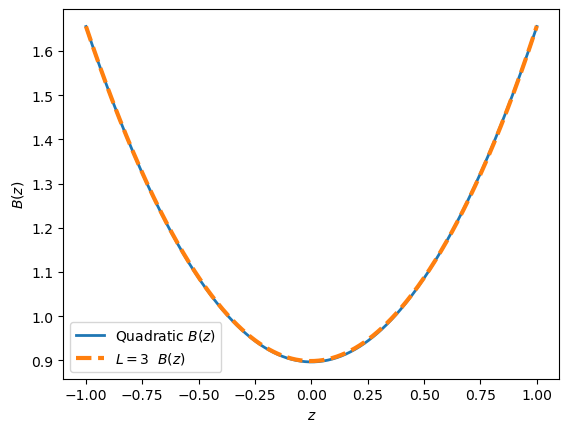

In [316]:
zpt = np.linspace(-1,1,400)
mod_close = np.abs(analytic_close(zpt))
mod_quad =22*zpt**2/29 + 26/29

plt.plot(zpt, mod_quad, lw=2)
plt.plot(zpt, mod_close, '--', lw=3)
plt.xlabel('$z$')
plt.ylabel('$B(z)$')
plt.legend(['Quadratic $B(z)$', '$L=3$  $B(z)$'])
plt.show()

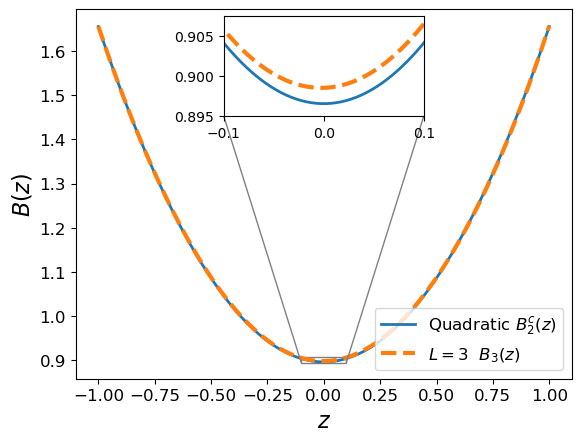

In [471]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar


fig = plt.figure()
plt.plot(zpt, mod_quad, lw=2)
plt.plot(zpt, mod_close, '--', lw=3)
plt.xlabel('$z$', fontsize=16)
plt.xticks(fontsize=12)
plt.ylabel('$B(z)$', fontsize=16)
plt.yticks(fontsize=12)
plt.legend(['Quadratic $B_2^c(z)$', '$L=3$  $B_3(z)$'], fontsize=12,loc='lower right')
ax = plt.gca()

#axins = inset_axes(ax, 1, 1, loc=9, bbox_to_anchor=(0.52, 0.85),bbox_transform=ax.figure.transFigure) 
axins = inset_axes(ax, 2, 1, loc=9) 
axins.plot(zpt, mod_quad, lw=2)
axins.plot(zpt, mod_close, '--', lw=3)
axins.set_xlim(-0.1,0.1)
axins.set_ylim(0.895, 0.9075)
axins.xaxis.set_ticks(np.arange(-0.1, 0.11, 0.1))


mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")

plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/quadratic_mod_comparison.pdf',bbox_inches='tight')

In [397]:
if use_neptune_logging:
    # Start the Neptune logger run
    runtest = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test")
else:
    runtest = None
    
paramstest = {'batch_size': 64,
         'epochs_num': 5000,
         'learning_rate': 0.003,
         'repulsive_epochs': None,
         'repulsive_type' : None,
         'lr_scheduler': True, 
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'activation': 'ReLU',
         'layer_list': [64, 64, 64, 64],
         'final_layer': 'Tanh',
         'func_class': None,
         'loss': 'MSE',
         'scaled_loss': True,
         'scan_param': None,
         'num_nets' : 1,
         'p_value': 2,
         'lambda_repulsive': 0.0}

tags = {'constant function': '22/29z^2+26/29', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    runtest["sys/tags"].add(list(tags.values()))
    runtest['parameters'] = paramstest

modnettest = ModuleNetPolynomial(polynomial_coeffs=np.array([26/29,0.0,22/29]), device=device)

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1852
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [398]:
netsolvertest = train_run(paramstest, device, runtest, seed_num=42, optim_name='Adam', module_net = modnettest)

  0%|          | 0/5000 [00:00<?, ?epoch/s]

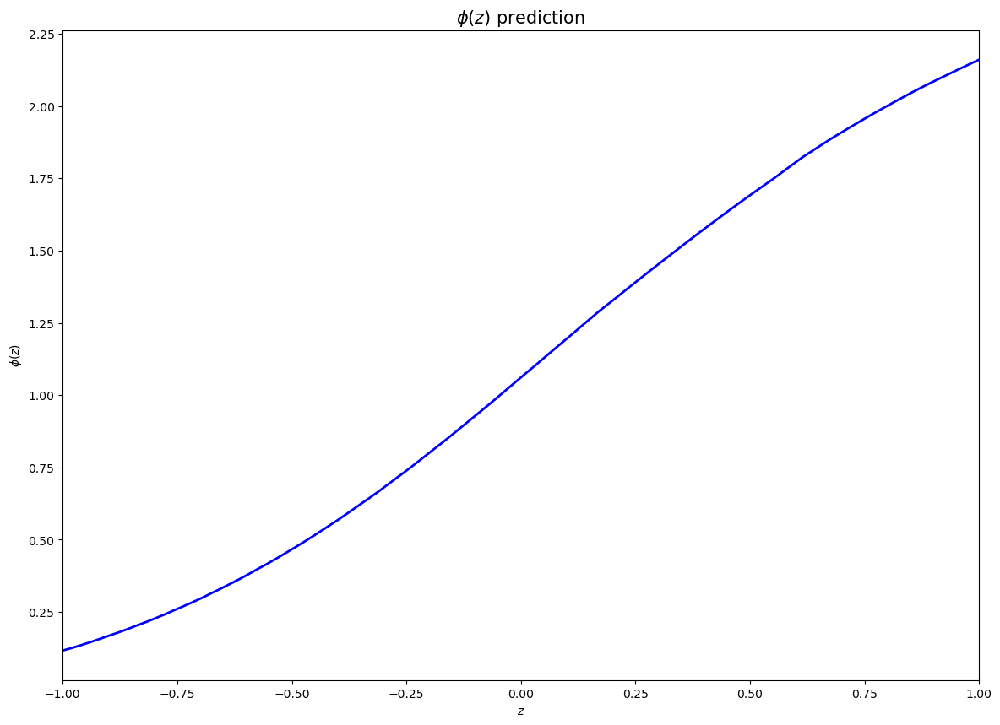

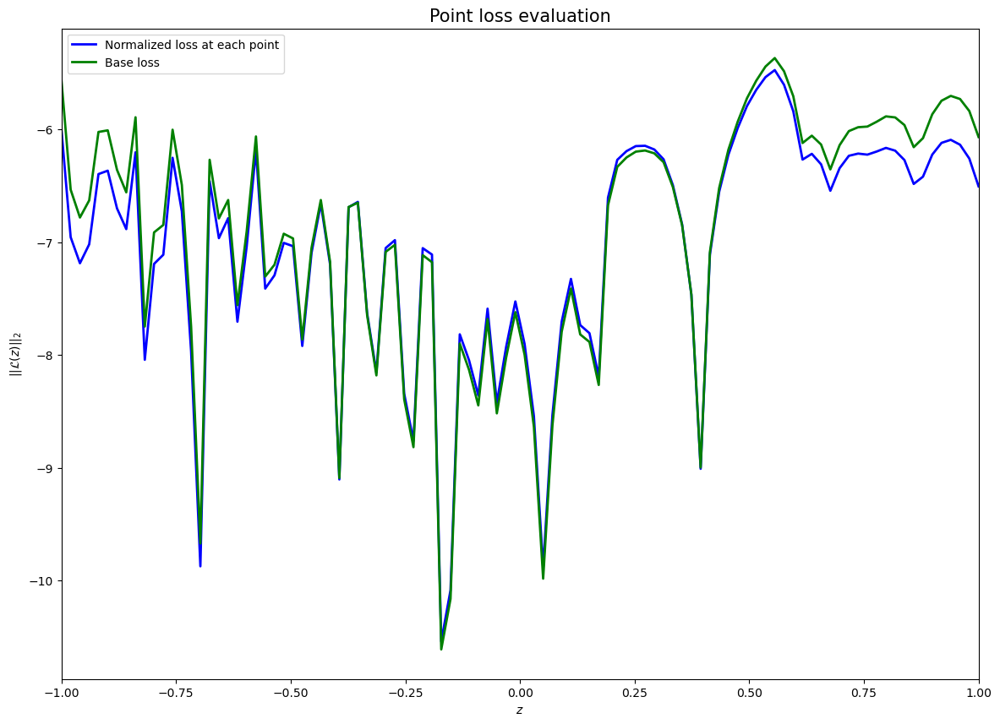

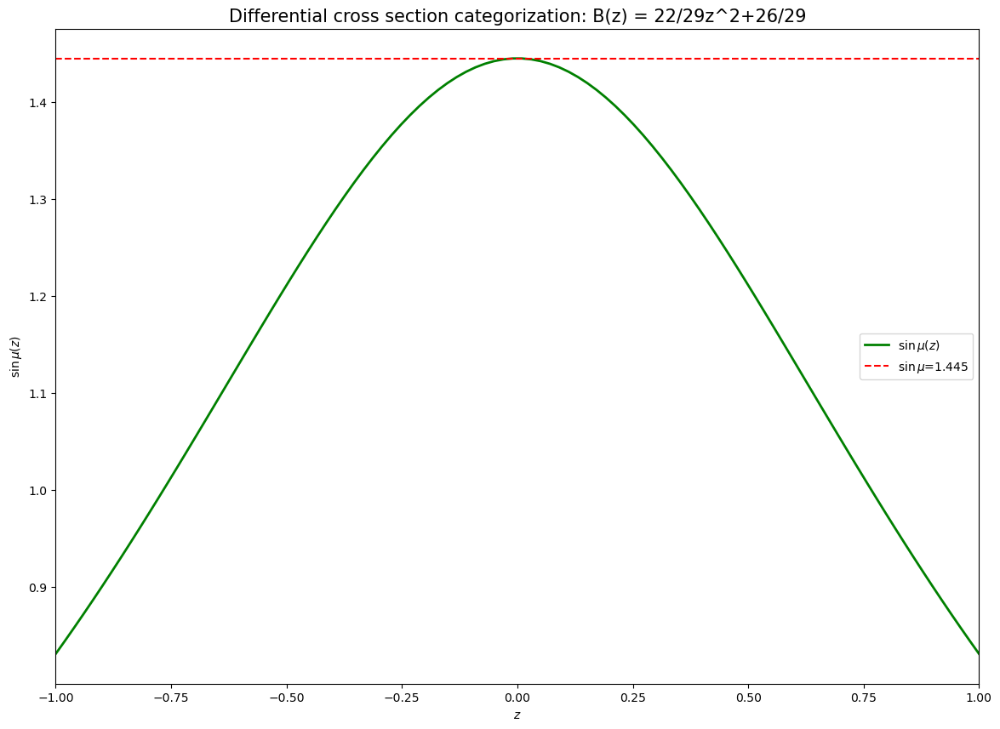

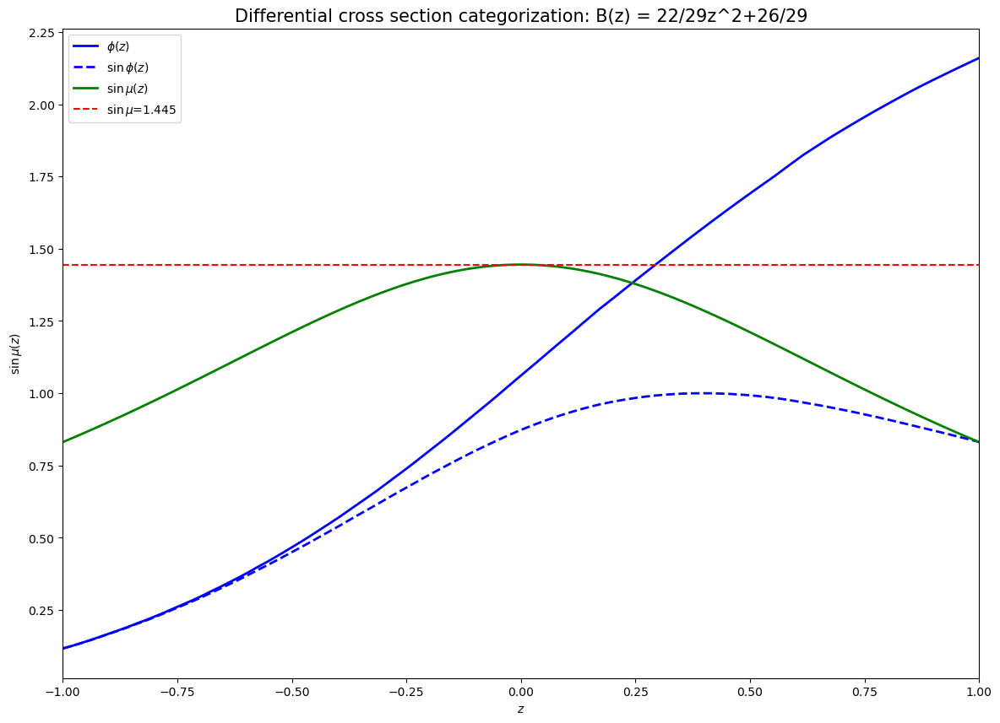

In [399]:
zpointseval_test, phieval_test, sinphieval_test, eval_pt_loss_s_test, eval_pt_loss_no_s_test = eval_run(netsolvertest, paramstest, device, runtest)

plot_phase(zpointseval_test, phieval_test, runtest)
plot_point_loss(zpointseval_test, eval_pt_loss_s_test, eval_pt_loss_no_s_test, runtest)

integralz_test = sin_mu_integral(paramstest, device, netsolvertest, zpointseval_test)
plot_sin_mu(zpointseval_test, integralz_test, tags)

plot_summary(zpointseval_test, phieval_test, sinphieval_test, integralz_test, runtest, tags)

In [400]:
if runtest is not None:
    runtest.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 1 operations to synchronize with Neptune. Do not kill this process.
All 1 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1852


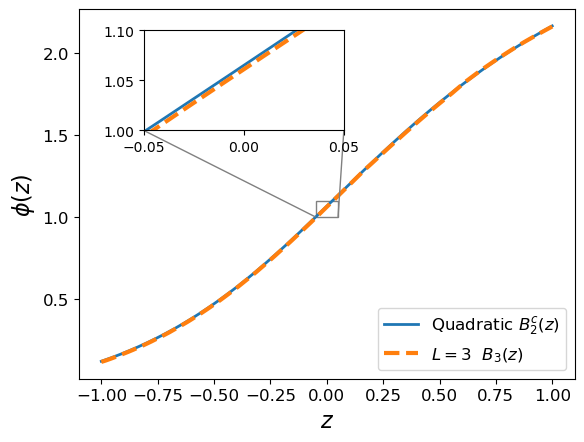

In [468]:
phase_close = math.pi - np.angle(analytic_close(zpt))

fig = plt.figure()
plt.plot(zpt, phase_close,  lw=2)
plt.plot(zpointseval_test.cpu().numpy(), phieval_test, '--',  lw=3)

plt.xlabel('$z$', fontsize=16)
plt.xticks(fontsize=12)
plt.ylabel('$\phi(z)$', fontsize=16)
plt.yticks(fontsize=12)
plt.legend(['Quadratic $B_2^c(z)$', '$L=3$  $B_3(z)$'],loc='lower right', fontsize=12)
ax = plt.gca()

axins = inset_axes(ax, 2, 1, loc=1, bbox_to_anchor=(0.55, 0.85),bbox_transform=ax.figure.transFigure) 
axins.plot(zpt, phase_close, lw=2)
axins.plot(zpointseval_test.cpu().numpy(), phieval_test, '--', lw=3)
axins.set_xlim(-0.05,0.05)
axins.set_ylim(1.0, 1.1)
axins.xaxis.set_ticks(np.arange(-0.05, 0.051, 0.05))


mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")

plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Scans_polynomials/quadratic_phases_comparison.pdf',bbox_inches='tight')

### Ambiguity Study

##### Crichton Ambiguity

In [13]:
class ModuleNetCrichton(nn.Module):
    """
    Class for parametrizing the given differential cross section
    """
    def __init__(self, scale_param=1):
        super(ModuleNetCrichton, self).__init__()
        self.scale_param = scale_param
        
    def forward(self, x):
        """
        Network forward pass is given by a specific function. Can iterate on the overall scale if we want to
        """
        return torch.sqrt(1.38065 + 3.1118 *x - 1.60815*torch.pow(x,2) - 4.731*torch.pow(x,3) + 6.58* torch.pow(x,4))/self.scale_param # Crichton example

In [21]:
import matplotlib.pyplot as plt
from neptune.new.types import File

def crichton_solutions(zpoints):
    """
    Analytic solution for the Crichton ambiguity (from the original paper)
    """
    z = zpoints.cpu()
    sol1 = torch.angle((5/2)*np.exp(1j*math.pi/9)*(3*torch.pow(z,2)-1)*np.sin(math.pi/9)-np.exp(-7*1j*math.pi/54)*np.sin(7*math.pi/54)-3*np.exp(-869*1j*math.pi/3600)*z*np.sin(869*math.pi/3600))
    sol1 = math.pi - sol1 - 2*math.pi*torch.heaviside(-sol1, torch.tensor(0.0)) + 2*math.pi*torch.heaviside(sol1-2*math.pi, torch.tensor(0.0))
    sol2 = math.pi - torch.angle((5/2)*np.exp(1j*math.pi/9)*(3*torch.pow(z,2)-1)*np.sin(math.pi/9)+np.exp(659*1j*math.pi/1200)*np.cos(59*math.pi/1200)-3*np.exp(-59*1j*math.pi/400)*z*np.sin(59*math.pi/400))
    
    return sol1, sol2

def plot_point_loss_crichton(zpoints, point_loss_data_ses, point_loss_data_noses, neptune_run):

    fig = plt.figure(figsize=(14, 10))
    
    for point_loss_data_s in point_loss_data_ses:
        plt.plot(zpoints.cpu(), np.log10(point_loss_data_s.cpu()), '-', linewidth = 2)  
    
    plt.gca().set_prop_cycle(None)
    for point_loss_data_nos in point_loss_data_noses:
        plt.plot(zpoints.cpu(), np.log10(point_loss_data_nos.cpu()), '--', linewidth = 2)  
    plt.xlabel('$z$')
    plt.ylabel('$\log_{10} ||\mathcal{L}(z)||_2$')    
    plt.title('Point loss evaluation', fontsize = 15)
    plt.xlim([-1,1])
    legendstr = ['Network {} : Normalized point loss'.format(i+1) for i in range(len(point_loss_data_ses))] + ['Network {} : Base point loss'.format(i+1) for i in range(len(point_loss_data_noses))]
    plt.legend(legendstr)
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/point_loss_evaluation'].upload(File.as_image(fig))
    plt.close(fig)
    
    
def plot_summary_crichton(zpoints, phipoints_list, neptune_run):
    
    
    fig3 = plt.figure(figsize=(14, 10))
    
    sol1, sol2 = crichton_solutions(zpoints)
    
    for phipoints in phipoints_list:
        plt.plot(zpoints.cpu(),phipoints, '--', linewidth = 2)   
    plt.plot(zpoints.cpu(),sol1, 'g', linewidth = 2)   
    plt.plot(zpoints.cpu(),sol2, 'k', linewidth = 2)   
    
     
    plt.xlabel('$z$')
    plt.ylabel('$\phi(z)$')    
    plt.title('Differential cross section categorization: B(z) : Crichton', fontsize = 15)
    plt.xlim([-1,1])
    legend_nets = ['$\phi(z)$ network {}'.format(i+1) for i in range(len(phipoints_list))]
    plt.legend(legend_nets + ['$\phi_1(z)$ exact', '$\phi_2(z)$ exact'])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/overview'].upload(File.as_image(fig3))
    plt.close(fig3)

##### Start with no repulsive loss and two networks

In [491]:
# Start the Neptune logger run
if use_neptune_logging:
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_crichton17")
else:
    run = None

params = {'batch_size': 64,
         'epochs_num': 5000,
         'learning_rate': 0.003,
         'repulsive_epochs': None,
         'repulsive_type' : None,
         'lr_scheduler': True, 
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'activation': 'ReLU',
         'layer_list': [64, 64, 64, 64],
         'final_layer': 'Tanh',
         'func_class': None,
         'loss': 'MSE',
         'scaled_loss': False,
         'scan_param': None,
         'num_nets': 2,
         'p_value': 2,
         'lambda_repulsive': 0.000}


tags = {'constant function': 'Crichton', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    run["sys/tags"].add(list(tags.values()))
    run['parameters'] = params

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1897
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [492]:
crichtonnet = ModuleNetCrichton()
netsolver = train_run(params, device, run, module_net=crichtonnet, seed_num=42)

  0%|          | 0/5000 [00:00<?, ?epoch/s]

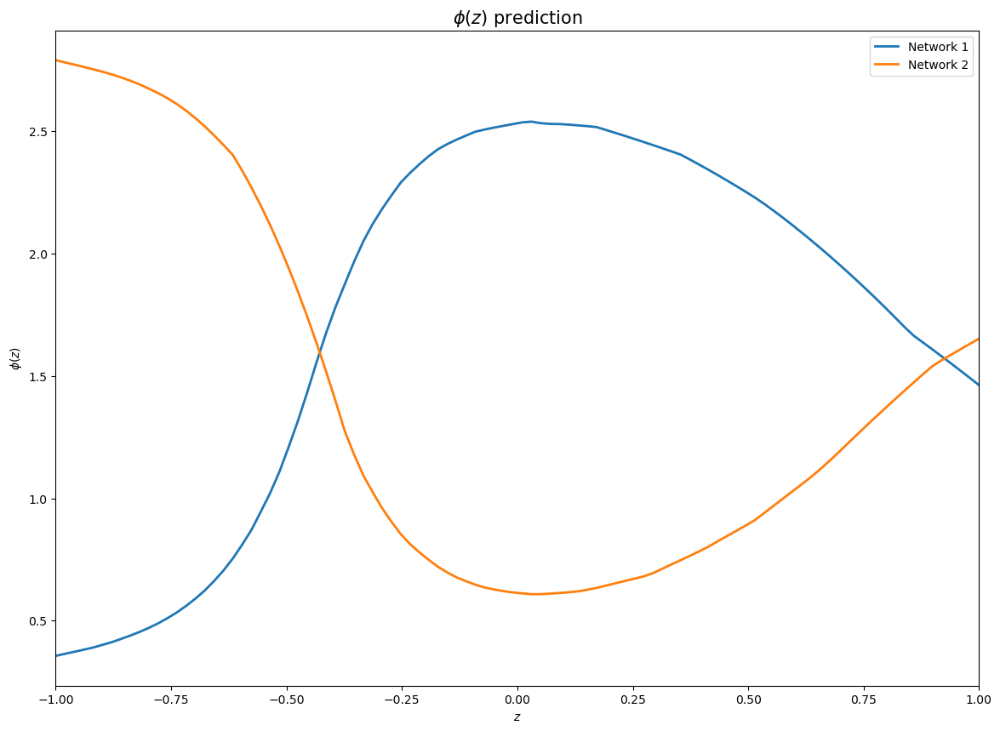

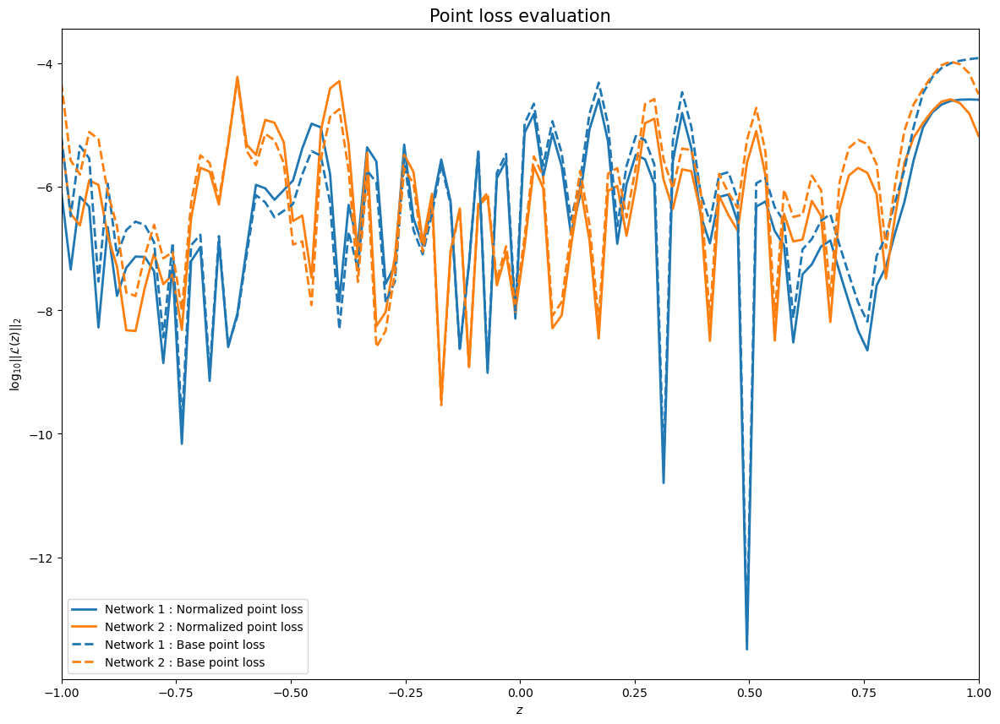

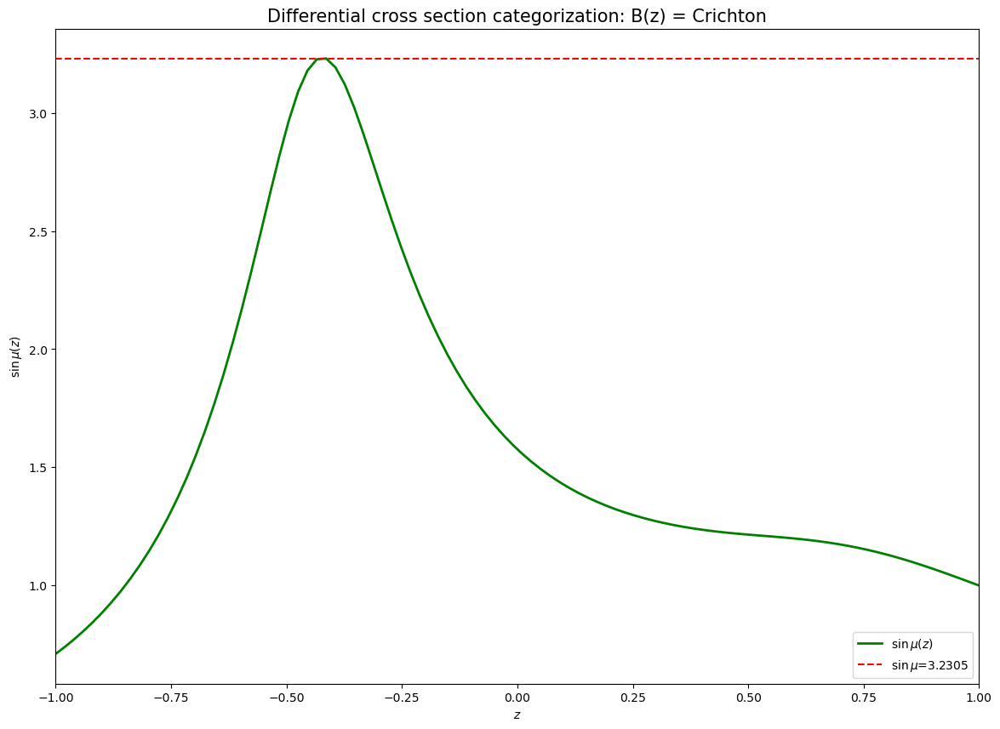

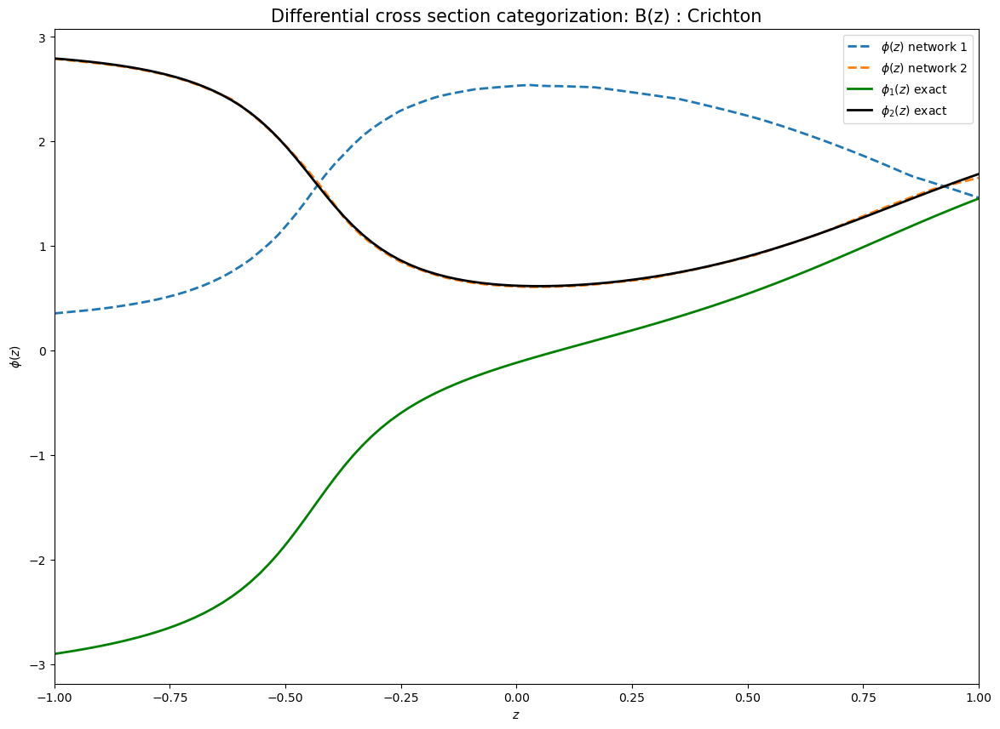

In [493]:
phievals = []
eval_pt_loss_ses = []
eval_pt_loss_no_ses= []

for i in range(params['num_nets']):
    
    if params['num_nets'] > 1: 
        netsolver.phi_net = netsolver.multi_nets[i]
    zpointseval, phieval, _, eval_pt_loss_s, eval_pt_loss_no_s = eval_run(netsolver, params, device, run)
    phievals.append(phieval)
    eval_pt_loss_ses.append(eval_pt_loss_s)
    eval_pt_loss_no_ses.append(eval_pt_loss_no_s)

plot_phases(zpointseval, phievals, run)
plot_point_loss_crichton(zpointseval, eval_pt_loss_ses, eval_pt_loss_no_ses, run)

integralz = sin_mu_integral(params, device, netsolver, zpointseval)
plot_sin_mu(zpointseval, integralz, tags)

plot_summary_crichton(zpointseval, phievals, run)

In [494]:
# Make sure to kill the Neptune logger run

if run is not None:
    run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 537 operations to synchronize with Neptune. Do not kill this process.
All 537 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1897


Dedicated pictures

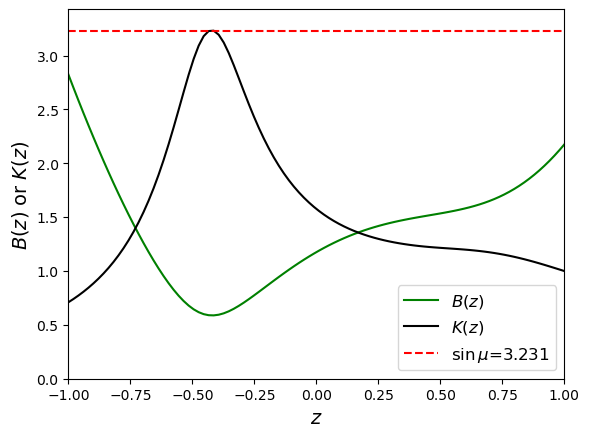

In [549]:
crichtonmod = crichtonnet(zpointseval).cpu().numpy()
sinmucrichton = max(integralz).cpu().numpy()

fig = plt.figure()

plt.plot(zpointseval.cpu().numpy(), crichtonmod, 'g')
plt.plot(zpointseval.cpu().numpy(), integralz.cpu().numpy(), 'k')
plt.plot(zpointseval_lin.cpu().numpy(),sinmucrichton.repeat(integralz.size(dim=0)), 'r--' )
plt.xlabel('$z$', fontsize=14)
plt.xlim([-1,1])
plt.ylabel('$B(z)$ or $K(z)$', fontsize=14)
plt.ylim([0, sinmucrichton+0.2])
plt.legend(['$B(z)$', '$K(z)$','$\sin \mu$={}'.format(str(np.round(sinmucrichton,3)))], fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Crichton/crichton_mod.pdf',bbox_inches='tight')

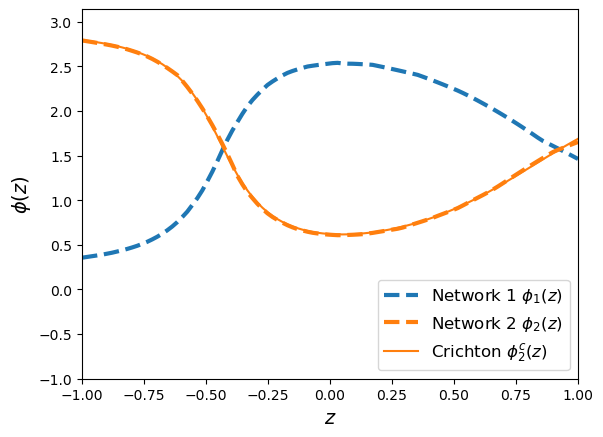

In [552]:
sol1, sol2 = crichton_solutions(zpointseval)

fig = plt.figure()
plt.plot(zpointseval.cpu().numpy(), phievals[0],  '--',lw=3)
plt.plot(zpointseval.cpu().numpy(), phievals[1], '--', lw=3)
plt.plot(zpointseval.cpu().numpy(), sol2, 'tab:orange')
plt.xlabel('$z$', fontsize=14)
plt.xlim([-1,1])
plt.ylabel('$\phi(z)$', fontsize=14)
plt.ylim([-1, math.pi])
plt.legend(['Network 1 $\phi_1(z)$', 'Network 2 $\phi_2(z)$', 'Crichton $\phi_2^c(z)$'], loc='lower right', fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Crichton/crichton_phases_redundant.pdf',bbox_inches='tight')

##### Enabling the repulsion loss

In [115]:
# Start the Neptune logger run
if use_neptune_logging:
    run_sharp = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test2")
else:
    run_sharp = None

params = {'batch_size': 64,
         'epochs_num': 10000,
         'learning_rate': 0.003,
         'lr_scheduler': True,
         'repulsive_epochs': [200, 300],
         'repulsive_type' : 'sharp',
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'activation': 'ReLU',
         'layer_list' : [64,64, 64, 64],
         'final_layer': 'Tanh',
         'func_class': None,
         'loss': 'MSE',
         'scaled_loss': False,
         'scan_param': None,
         'num_nets': 2,
         'p_value': 2,
         'lambda_repulsive': 1.0}

tags = {'constant function': 'Crichton', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    run_sharp["sys/tags"].add(list(tags.values()))
    run_sharp['parameters'] = params

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1958
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [116]:
crichtonnet = ModuleNetCrichton()
netsolver = train_run(params, device, run_sharp, module_net=crichtonnet, seed_num=42, optim_name='Adam')

  0%|          | 0/10000 [00:00<?, ?epoch/s]

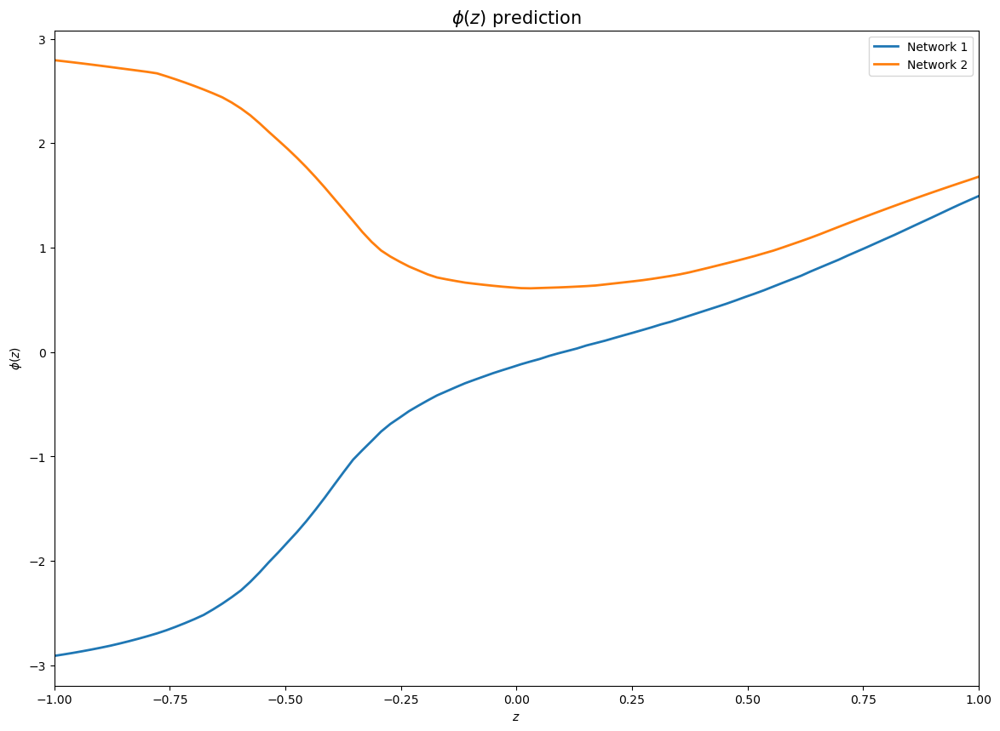

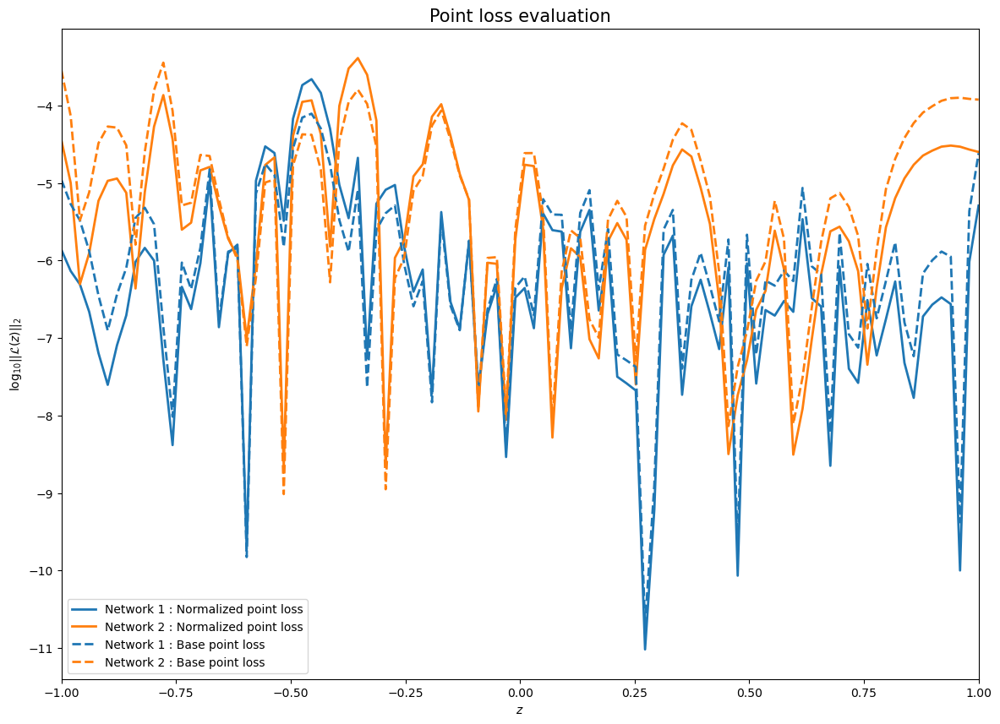

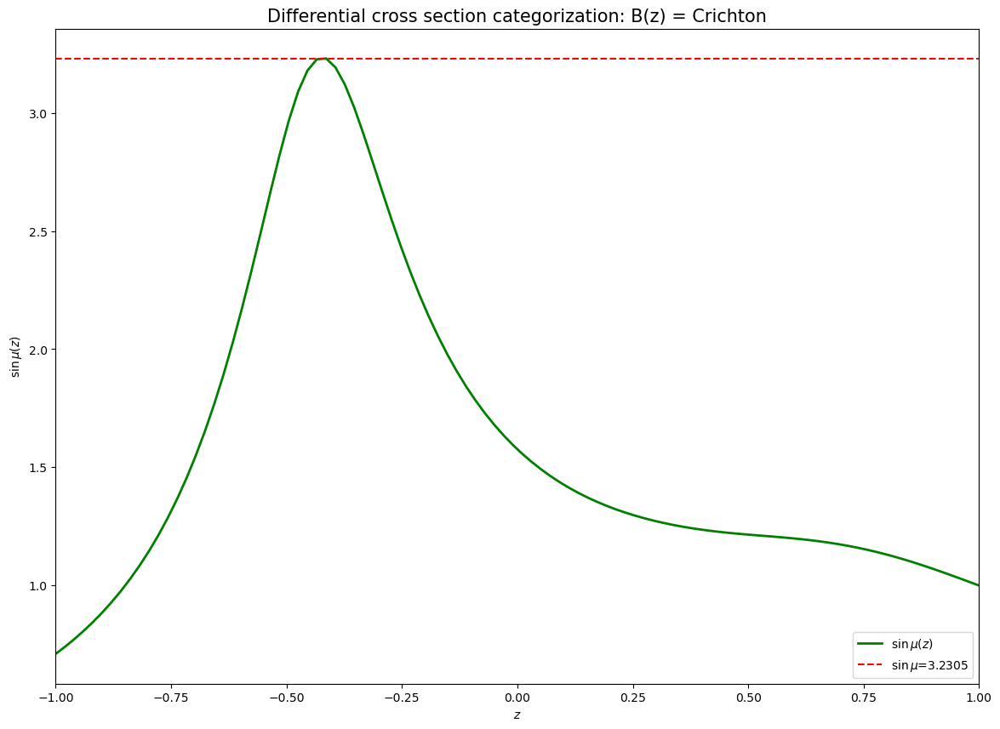

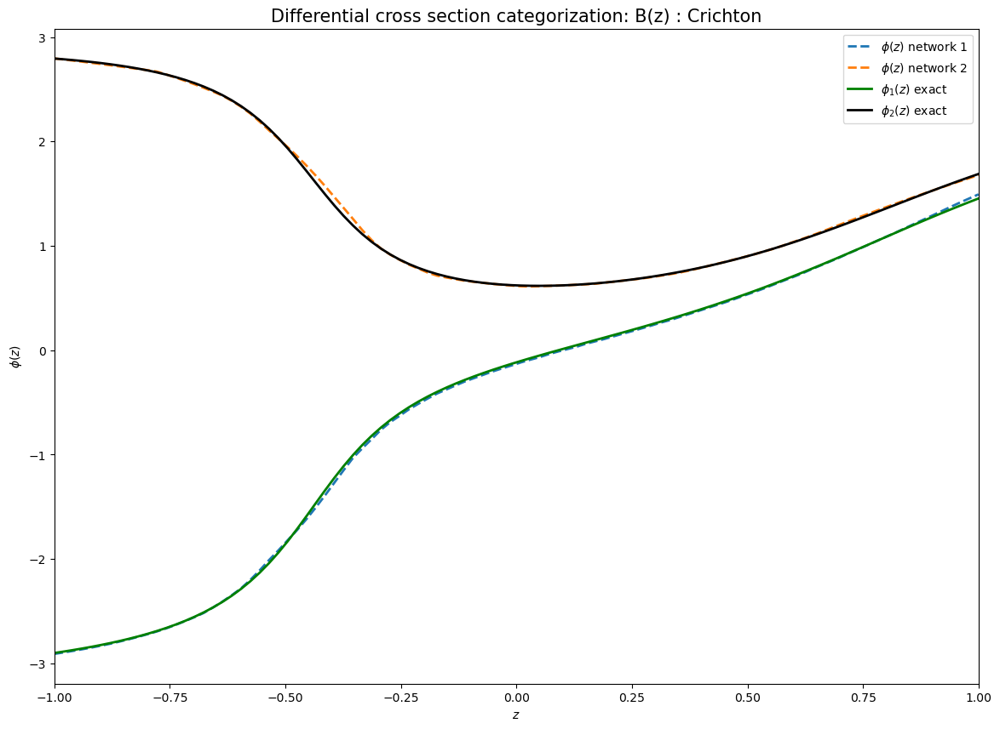

In [117]:
phievals = []
eval_pt_loss_ses = []
eval_pt_loss_no_ses= []

for i in range(params['num_nets']):
    
    if params['num_nets'] > 1: 
        netsolver.phi_net = netsolver.multi_nets[i]
    zpointseval, phieval, _, eval_pt_loss_s, eval_pt_loss_no_s = eval_run(netsolver, params, device, run_sharp)
    phievals.append(phieval)
    eval_pt_loss_ses.append(eval_pt_loss_s)
    eval_pt_loss_no_ses.append(eval_pt_loss_no_s)

plot_phases(zpointseval, phievals, run_sharp)
plot_point_loss_crichton(zpointseval, eval_pt_loss_ses, eval_pt_loss_no_ses, run_sharp)

integralz = sin_mu_integral(params, device, netsolver, zpointseval)
plot_sin_mu(zpointseval, integralz, tags)

plot_summary_crichton(zpointseval, phievals, run_sharp)

In [118]:
# Make sure to kill the Neptune logger run
if run_sharp is None:
    run_sharp.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 185 operations to synchronize with Neptune. Do not kill this process.
All 185 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1958


Pictures

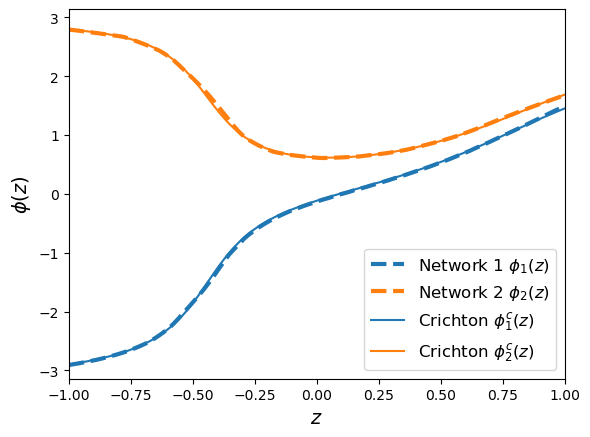

In [120]:
sol1, sol2 = crichton_solutions(zpointseval)

fig = plt.figure()
plt.plot(zpointseval.cpu().numpy(), phievals[0],  '--',lw=3)
plt.plot(zpointseval.cpu().numpy(), phievals[1], '--', lw=3)
plt.plot(zpointseval.cpu().numpy(), sol1, 'tab:blue')
plt.plot(zpointseval.cpu().numpy(), sol2, 'tab:orange')
plt.xlabel('$z$', fontsize=14)
plt.xlim([-1,1])
plt.ylabel('$\phi(z)$', fontsize=14)
plt.ylim([-math.pi, math.pi])
plt.legend(['Network 1 $\phi_1(z)$', 'Network 2 $\phi_2(z)$', 'Crichton $\phi_1^c(z)$', 'Crichton $\phi_2^c(z)$'], loc='lower right', fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Crichton/crichton_phases_sharp.pdf',bbox_inches='tight')

##### Second repulsive loss setup

In [101]:
# Start the Neptune logger run
if use_neptune_logging:
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test2")
else:
    run = None

params = {'batch_size': 64,
         'epochs_num': 10000,
         'learning_rate': 0.003,
         'lr_scheduler': True,
         'repulsive_epochs': [0, 1000],
         'repulsive_type' : 'decay',
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'activation': 'ReLU',
         'layer_list' : [64,64, 64, 64],
         'final_layer': 'Tanh',
         'func_class': None,
         'loss': 'MSE',
         'scaled_loss': False,
         'scan_param': None,
         'num_nets': 2,
         'p_value': 2,
         'lambda_repulsive': 50.0}

tags = {'constant function': 'Crichton', 'optimizer': 'Adam', 'Mode': 'Constant param'}

if use_neptune_logging:
    run["sys/tags"].add(list(tags.values()))
    run['parameters'] = params

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1956
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [102]:
crichtonnet = ModuleNetCrichton()
netsolver2 = train_run(params, device, run, module_net=crichtonnet, seed_num=42, optim_name='Adam')

  0%|          | 0/10000 [00:00<?, ?epoch/s]

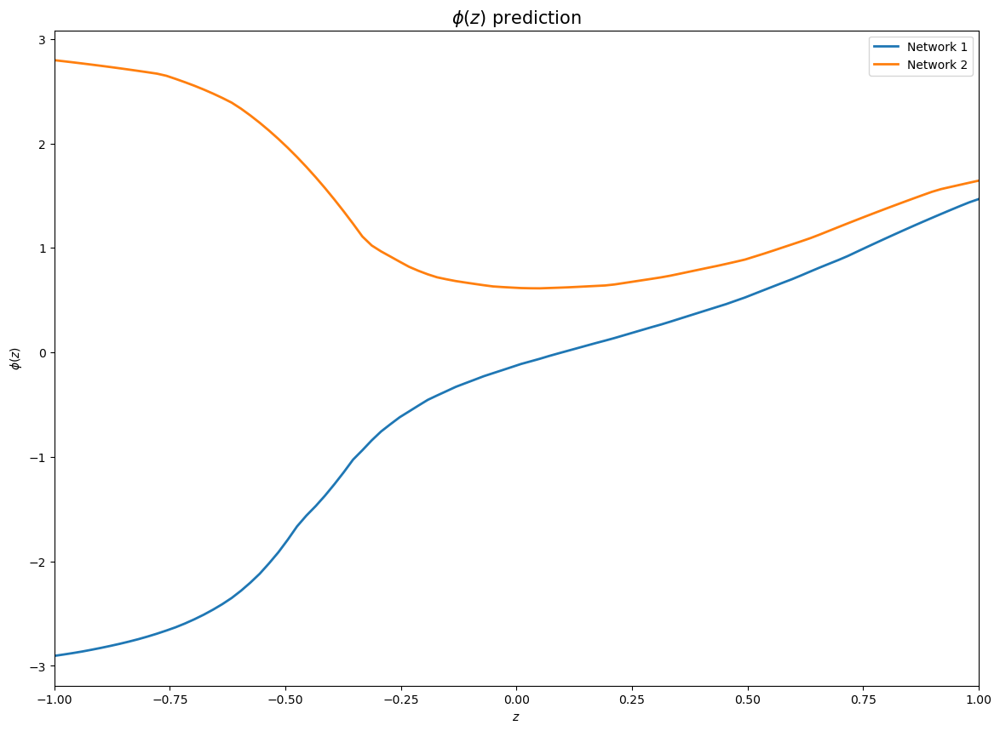

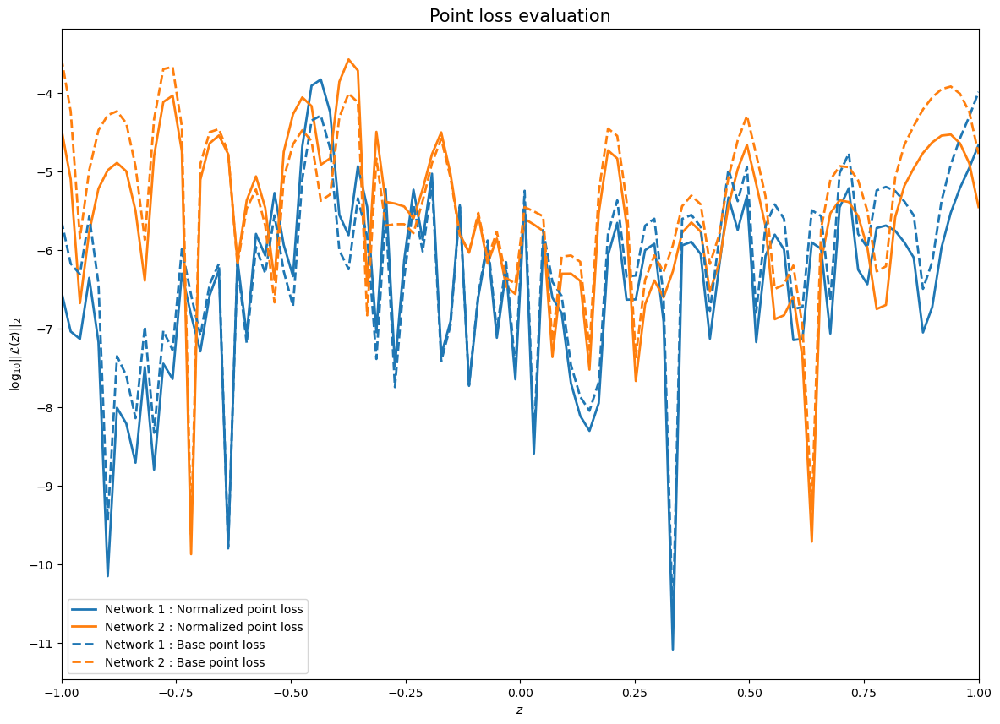

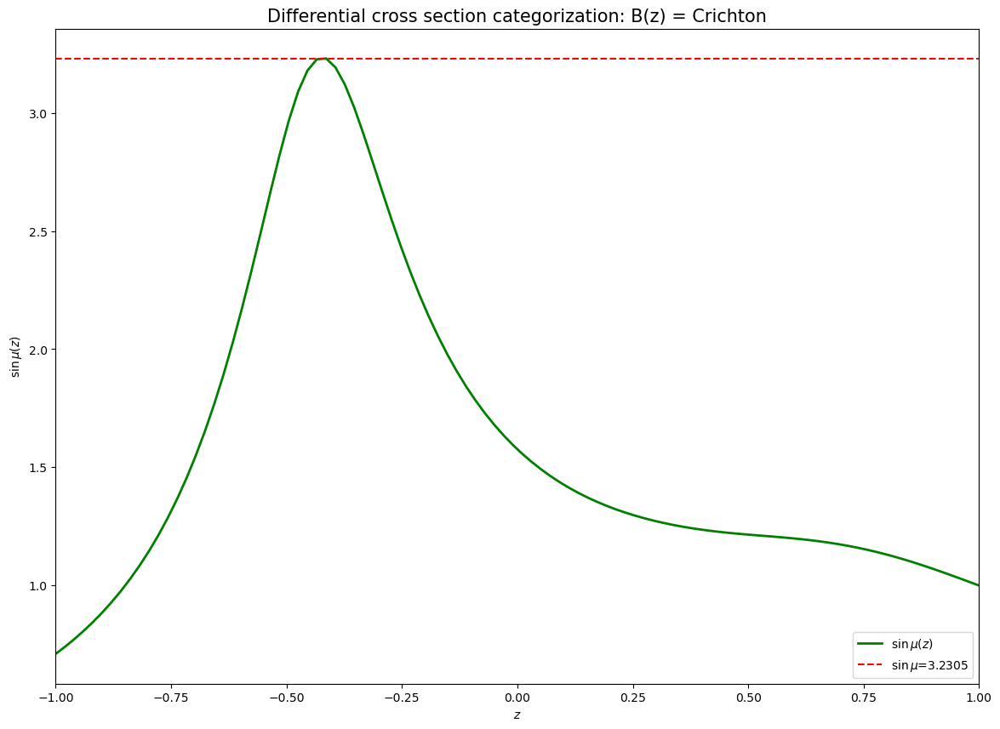

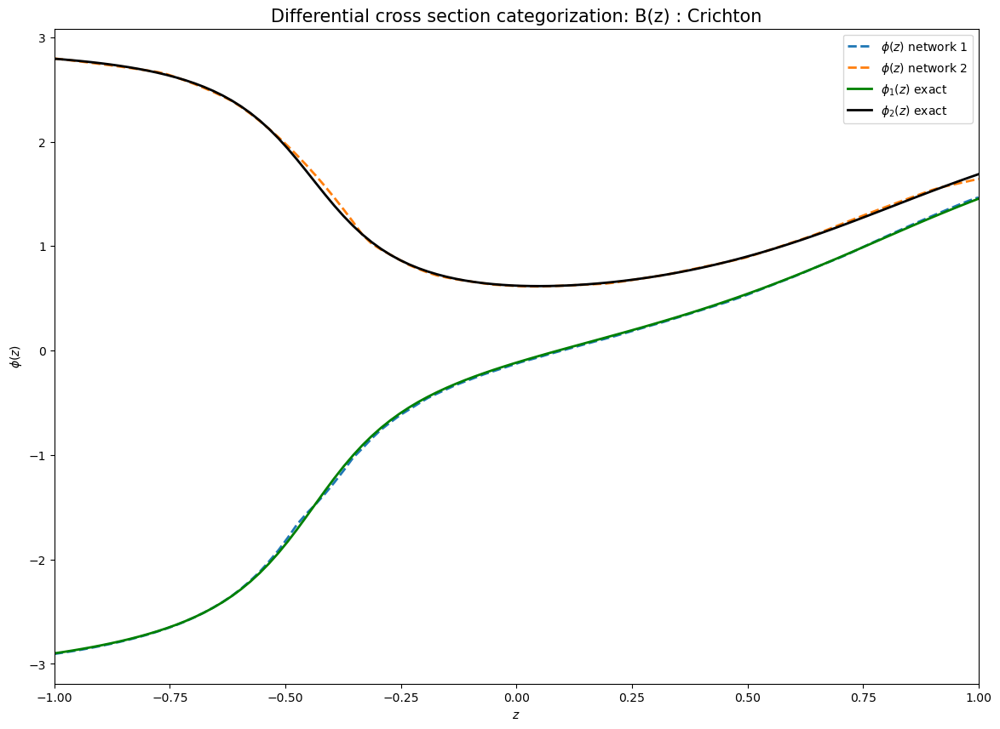

In [103]:
phievals2 = []
eval_pt_loss_ses2 = []
eval_pt_loss_no_ses2= []

for i in range(params['num_nets']):
    
    if params['num_nets'] > 1: 
        netsolver2.phi_net = netsolver2.multi_nets[i]
    zpointseval, phieval, _, eval_pt_loss_s, eval_pt_loss_no_s = eval_run(netsolver2, params, device, run)
    phievals2.append(phieval)
    eval_pt_loss_ses2.append(eval_pt_loss_s)
    eval_pt_loss_no_ses2.append(eval_pt_loss_no_s)

plot_phases(zpointseval, phievals2, run)
plot_point_loss_crichton(zpointseval, eval_pt_loss_ses2, eval_pt_loss_no_ses2, run)

integralz2 = sin_mu_integral(params, device, netsolver2, zpointseval)
plot_sin_mu(zpointseval, integralz2, tags)

plot_summary_crichton(zpointseval, phievals2, run)

In [104]:
# Make sure to kill the Neptune logger run
if run is None:
    run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 32 operations to synchronize with Neptune. Do not kill this process.
All 32 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1956


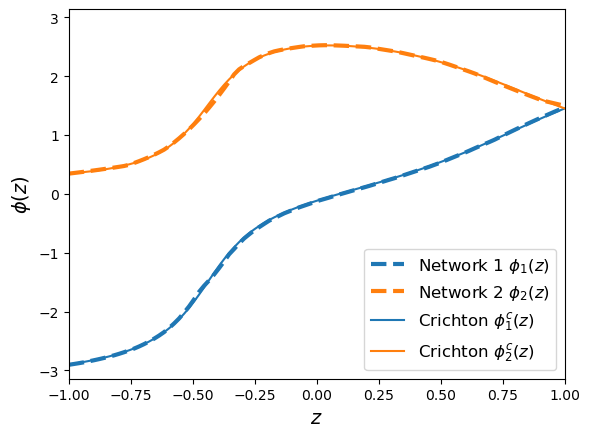

In [159]:
sol1, sol2 = crichton_solutions(zpointseval)

fig = plt.figure()
plt.plot(zpointseval.cpu().numpy(), phievals2[0],  '--',lw=3)
plt.plot(zpointseval.cpu().numpy(), math.pi-phievals2[1], '--', lw=3)
plt.plot(zpointseval.cpu().numpy(), sol1, 'tab:blue')
plt.plot(zpointseval.cpu().numpy(), math.pi-sol2, 'tab:orange')
plt.xlabel('$z$', fontsize=14)
plt.xlim([-1,1])
plt.ylabel('$\phi(z)$', fontsize=14)
plt.ylim([-math.pi, math.pi])
plt.legend(['Network 1 $\phi_1(z)$', 'Network 2 $\phi_2(z)$', 'Crichton $\phi_1^c(z)$', 'Crichton $\phi_2^c(z)$'], loc='lower right', fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Crichton/crichton_phases_decay.pdf',bbox_inches='tight')

Look at the actual loss function evolution (can fetch the values from the Neptune logging results).
Change this to a loading from a datafile in final version

In [123]:
run_sharp = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, with_id="TOS-1958")
run_decay = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, with_id="TOS-1956")

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1958
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1956
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [125]:
loss_sharp = run_sharp['metrics/train_loss'].fetch_values()
loss_decay = run_decay['metrics/train_loss'].fetch_values()

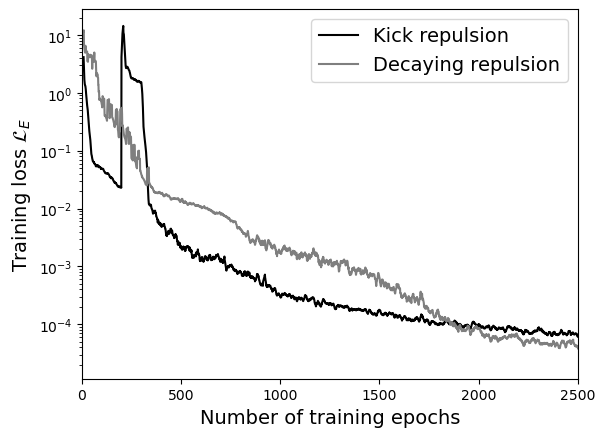

Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.


Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
Communication with Neptune restored!
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
Communication with Neptune restored!
Communication with Neptune restored!


Exception in thread Exception in thread NeptuneWebhooks:
Exception in thread NeptuneWebhooks:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
NeptuneWebhooks:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
    bytes_ = _recv()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 87, in _recv
    bytes_ = _recv()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 87, in _recv
    return sock.recv(bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1227, in 

    return recv(self.sock, bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 110, in recv
    bytes_ = self.recv(min(16384, shortage))
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_core.py", line 529, in _recv
    raise WebSocketTimeoutException("Connection timed out")
websocket._exceptions.WebSocketTimeoutException: Connection timed out
    return recv(self.sock, bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 110, in recv
    raise WebSocketTimeoutException("Connection timed out")
websocket._exceptions.WebSocketTimeoutException: Connection timed out


In [151]:
loss_sharp['value_roll'] = loss_sharp['value'].rolling(10).mean()
loss_decay['value_roll'] = loss_decay['value'].rolling(10).mean()

fig = plt.figure()

plt.plot(loss_sharp['value_roll'], 'k')
plt.plot(loss_decay['value_roll'], 'tab:grey')
plt.yscale("log")
plt.xlim([0, 2500])
plt.xlabel('Number of training epochs', fontsize=14)
plt.ylabel('Training loss $\mathcal{L}_E$', fontsize=14)
plt.legend(['Kick repulsion','Decaying repulsion'], fontsize=14)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Crichton/crichton_losses.pdf',bbox_inches='tight')

In [ ]:
run_sharp.stop()
run_decay.stop()

## The following regards other studies not included in the draft (can be ignored)

##### Setting a scan on the number of integral points and observing the loss scaling

##### Setting up a case where we interpolate between different solutions that go from $\sin \mu \sim 3.2$ to $\sin \mu \sim 0.9$

Let's start with an amplitude that is given by $\frac{5}{2} e^{\frac{i \pi  \lambda }{9}} \left(3 z^2-1\right) \sin \left(\frac{\pi  \lambda }{9}\right)-3 e^{\frac{1}{400} (-59) i \pi  \lambda } z \sin \left(\frac{59 \pi  \lambda }{400}\right)+e^{\frac{659 i \pi }{1200}} \cos \left(\frac{59 \pi }{1200}\right)$, where we interpolate from over $\lambda$. At $\lambda=1$ we have two solutions, but for $\lambda <1 $ we should now expect only a single solution

In [118]:
class ModuleInterpCrichton(nn.Module):
    """
    Class for parametrizing the given differential cross section
    """
    def __init__(self, lambda_param=1):
        super(ModuleInterpCrichton, self).__init__()
        self.lambda_param = lambda_param
        
    def forward(self, x):
        """
        Network forward pass is given by a specific function. Can iterate on the overall scale if we want to
        """
        #return torch.abs(np.exp(1j *659 * math.pi /1200) * np.cos(59*math.pi /1200) + 5*np.exp(1j*self.lambda_param*math.pi /9)*(3*torch.square(x)-1) * np.sin(self.lambda_param*math.pi /9)/2 - 3*np.exp(-59*1j*self.lambda_param*math.pi /400)* x * np.sin(59 * self.lambda_param*math.pi /400))
        return torch.sqrt((16*np.cos((59*math.pi)/1200.)**4 + 4*np.sin((59*math.pi)/600.)**2 + 100*(1 - 3*torch.square(x))**2*np.sin((math.pi*self.lambda_param)/9.)**4 + 96*x*np.cos((59*math.pi)/1200.)**2*np.sin((59*math.pi*self.lambda_param)/400.)**2 + 144*torch.square(x)*np.sin((59*math.pi*self.lambda_param)/400.)**4 + 80*(-1 + 3*torch.square(x))*np.sin((math.pi*self.lambda_param)/9.)**2*(np.cos((59*math.pi)/1200.)**2 + 3*x*np.sin((59*math.pi*self.lambda_param)/400.)**2) + 20*np.sin((59*math.pi)/600.)*np.sin((2*math.pi*self.lambda_param)/9.) - 60*torch.square(x)*np.sin((59*math.pi)/600.)*np.sin((2*math.pi*self.lambda_param)/9.) + 25*np.sin((2*math.pi*self.lambda_param)/9.)**2 - 150*torch.square(x)*np.sin((2*math.pi*self.lambda_param)/9.)**2 + 225*torch.pow(x,4)*np.sin((2*math.pi*self.lambda_param)/9.)**2 + 24*x*np.sin((59*math.pi)/600.)*np.sin((59*math.pi*self.lambda_param)/200.) + 60*x*np.sin((2*math.pi*self.lambda_param)/9.)*np.sin((59*math.pi*self.lambda_param)/200.) - 180*torch.pow(x,3)*np.sin((2*math.pi*self.lambda_param)/9.)*np.sin((59*math.pi*self.lambda_param)/200.) + 36*torch.square(x)*np.sin((59*math.pi*self.lambda_param)/200.)**2)/16.)

In [119]:
def crichton_solutions_lambda(zpoints, lambda_param):
    z = zpoints.cpu()
    sol1 = torch.angle((5/2)*np.exp(1j*math.pi/9)*(3*torch.pow(z,2)-1)*np.sin(math.pi/9)-np.exp(-7*1j*math.pi/54)*np.sin(7*math.pi/54)-3*np.exp(-869*1j*math.pi/3600)*z*np.sin(869*math.pi/3600))
    sol1 = math.pi - sol1 - 2*math.pi*torch.heaviside(-sol1, torch.tensor(0.0)) + 2*math.pi*torch.heaviside(sol1-2*math.pi, torch.tensor(0.0))
    sol2 = math.pi - torch.angle((5/2)*np.exp(1j*math.pi*lambda_param/9)*(3*torch.pow(z,2)-1)*np.sin(math.pi*lambda_param/9)+np.exp(659*1j*math.pi/1200)*np.cos(59*math.pi/1200)-3*np.exp(-59*1j*lambda_param*math.pi/400)*z*np.sin(59*lambda_param*math.pi/400))
    
    return sol1, sol2


def plot_point_loss_crichton(zpoints, point_loss_data_ses, point_loss_data_noses, neptune_run):

    fig = plt.figure(figsize=(14, 10))
    
    for point_loss_data_s in point_loss_data_ses:
        plt.plot(zpoints.cpu(), np.log10(point_loss_data_s.cpu()), '-', linewidth = 2)  
    
    plt.gca().set_prop_cycle(None)
    for point_loss_data_nos in point_loss_data_noses:
        plt.plot(zpoints.cpu(), np.log10(point_loss_data_nos.cpu()), '--', linewidth = 2)  
    plt.xlabel('$z$')
    plt.ylabel('$\log_{10} ||\mathcal{L}(z)||_2$')    
    plt.title('Point loss evaluation', fontsize = 15)
    plt.xlim([-1,1])
    legendstr = ['Network {} : Normalized point loss'.format(i+1) for i in range(len(point_loss_data_ses))] + ['Network {} : Base point loss'.format(i+1) for i in range(len(point_loss_data_noses))]
    plt.legend(legendstr)
    plt.show()

    neptune_run[f'evaluation/point_loss_evaluation'].upload(File.as_image(fig))
    plt.close(fig)
    

    
def plot_summary_crichton_lambda(zpoints, phipoints_list, lambda_param, neptune_run):
    
    
    fig3 = plt.figure(figsize=(14, 10))
    
    sol1, sol2 = crichton_solutions_lambda(zpoints, lambda_param)
    
    for phipoints in phipoints_list:
        plt.plot(zpoints.cpu(),phipoints, '--', linewidth = 2)   
    plt.plot(zpoints.cpu(),sol1, 'g', linewidth = 2)   
    plt.plot(zpoints.cpu(),sol2, 'k', linewidth = 2)   
    
     
    plt.xlabel('$z$')
    plt.ylabel('$\phi(z)$')    
    plt.title('B(z) : $\lambda={}$ Interpolation from Crichton'.format(round(lambda_param,2)), fontsize = 15)
    plt.xlim([-1,1])
    legend_nets = ['$\phi(z)$ network {}'.format(i+1) for i in range(len(phipoints_list))]
    plt.legend(legend_nets + ['$\phi_1(z)$ exact for $\lambda=1$', '$\phi_2(z)$ exact for $\lambda={}$'.format(round(lambda_param,2))])
    plt.show()

    neptune_run[f'evaluation/overview'].upload(File.as_image(fig3))
    plt.close(fig3)

Define the plotting functions relevant for the scans over $\lambda$

In [120]:
def plot_lambda_sinmu(lambdas, sinmus, neptune_run=None):
    
    fig1 = plt.figure(figsize=(14, 10))
    plt.plot(lambdas,sinmus, 'b-x', linewidth = 2)  
    plt.xlabel('$\lambda$ interpolation values')
    plt.ylabel('$\sin \mu$')
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/lambda_sinmu'].upload(File.as_image(fig1))
    plt.close(fig1)
    
def plot_losses(lambdas, sinmus, ns_losses, s_losses, neptune_run=None):
    
    fig1 =plt.figure(figsize=(14, 10))
    nsl_loss_net_1 = [np.log10(nsl[0].cpu()) for nsl in ns_losses]
    nsl_loss_net_2 = [np.log10(nsl[1].cpu()) for nsl in ns_losses]
    plt.plot(lambdas,nsl_loss_net_1, '-x', linewidth = 2)  
    plt.plot(lambdas,nsl_loss_net_2, '-x', linewidth = 2)  
    plt.xlabel('$\lambda$ interpolation values')
    plt.ylabel('$\log_{10}$ Base Loss')
    plt.legend(['Network 1: $\phi_1$', 'Network 2: $\phi_2$'])
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/non_scaled_loss_lambda'].upload(File.as_image(fig1))
    plt.close(fig1)
    
    fig2 =plt.figure(figsize=(14, 10))
    sl_loss_net_1 = [np.log10(sl[0].cpu()) for sl in s_losses]
    sl_loss_net_2 = [np.log10(sl[1].cpu()) for sl in s_losses]
    plt.plot(lambdas,sl_loss_net_1, '-x', linewidth = 2)  
    plt.plot(lambdas,sl_loss_net_2, '-x', linewidth = 2)  
    plt.xlabel('$\lambda$ interpolation values')
    plt.ylabel('$\log_{10}$ Scaled Loss')
    plt.legend(['Network 1: $\phi_1$', 'Network 2: $\phi_2$'])
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/scaled_loss_lambda'].upload(File.as_image(fig2))
    plt.close(fig2)
    
    fig3 = plt.figure(figsize=(14, 10))
    nsl_loss_net_1b = [np.log10(nsl[0].cpu()) for nsl in ns_losses]
    nsl_loss_net_2b = [np.log10(nsl[1].cpu()) for nsl in ns_losses]
    plt.plot(sinmus,nsl_loss_net_1b, '-x', linewidth = 2)  
    plt.plot(sinmus,nsl_loss_net_2b, '-x', linewidth = 2)  
    plt.xlabel('$\sin \mu$')
    plt.ylabel('$\log_{10}$ Base Loss')
    plt.legend(['Network 1: $\phi_1$', 'Network 2: $\phi_2$'])
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/non_scaled_loss_sinmu'].upload(File.as_image(fig3))
    plt.close(fig3)

    fig4 =plt.figure(figsize=(14, 10))
    sl_loss_net_1b = [np.log10(sl[0].cpu()) for sl in s_losses]
    sl_loss_net_2b = [np.log10(sl[1].cpu()) for sl in s_losses]
    plt.plot(sinmus, sl_loss_net_1b, '-x', linewidth = 2)  
    plt.plot(sinmus, sl_loss_net_2b, '-x', linewidth = 2)  
    plt.xlabel('$\sin \mu$')
    plt.ylabel('$\log_{10}$ Scaled Loss')
    plt.legend(['Network 1: $\phi_1$', 'Network 2: $\phi_2$'])
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/scaled_loss_sinmu'].upload(File.as_image(fig4))
    plt.close(fig4)
    
def phase_plots(lambdas, net_phases, neptune_run=None):
    phase1 = [phases[0] for phases in net_phases]
    phase2 = [phases[1] for phases in net_phases]

    fig1 = plt.figure(figsize=(14, 10))
    legend_str = []
    cmapp = plt.get_cmap('viridis')
    for i, lambda_val in enumerate(lambdas):

        plt.plot(zpointseval.cpu(), phase1[i], '-', linewidth = 2, color=cmapp(i/(len(lambdas)-1)))  
        legend_str.append('$\lambda = {}$'.format(round(lambda_val,2)))

    plt.xlabel('$z$')
    plt.ylabel('$\phi_1(z)$')
    plt.legend(legend_str)
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/phase_1'].upload(File.as_image(fig1))
    plt.close(fig1)


    fig2 = plt.figure(figsize=(14, 10))
    legend_str = []
    cmapp = plt.get_cmap('viridis')
    for i, lambda_val in enumerate(lambdas):

        plt.plot(zpointseval.cpu(), phase2[i], '-', linewidth = 2, color=cmapp(i/(len(lambdas)-1)))  
        legend_str.append('$\lambda = {}$'.format(round(lambda_val,2)))

    plt.xlabel('$z$')
    plt.ylabel('$\phi_2(z)$')
    plt.legend(legend_str)
    plt.title('Properties of $B(z)=|e^{i \delta_0} \sin \delta_0 + 3 e^{i \lambda \delta_1} \sin(\lambda \delta_1) + 5 e^{i \lambda \delta_2} \sin(\lambda \delta_2)|$')
    plt.show()
    if neptune_run is not None:
        neptune_run[f'evaluation/phase_2'].upload(File.as_image(fig2))
    plt.close(fig2)

Do a scan over different $\lambda$ values 

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1058
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): ReLU()
    (layer_5): Linear(in_features=64, out_features=1, bias=True)
    (final_layer): Tanh()
  )
)
Begin Memory: 0
1 - After model to device 0


Train Epoch: 4999 ; tLoss: 0.000029: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [12:17<00:00,  6.78epoch/s]


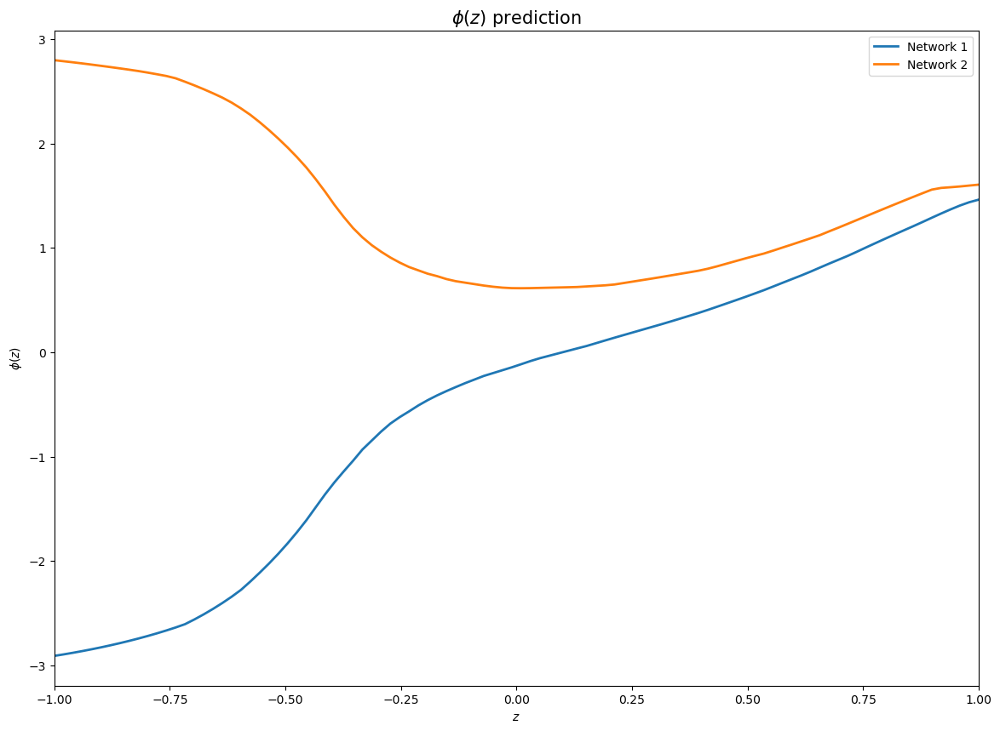

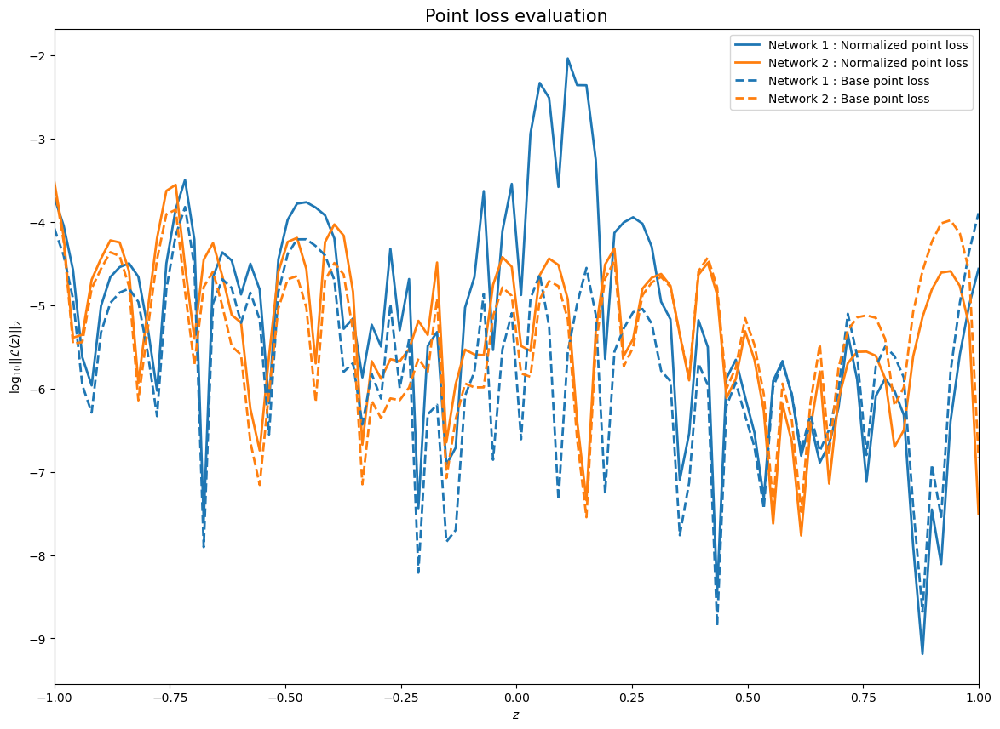

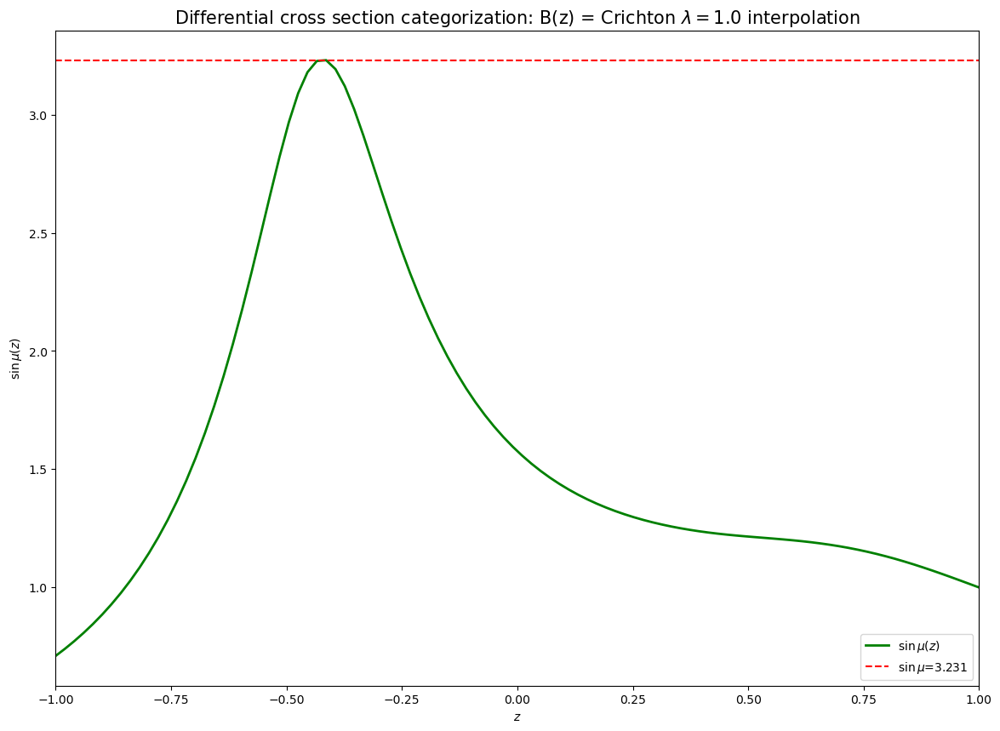

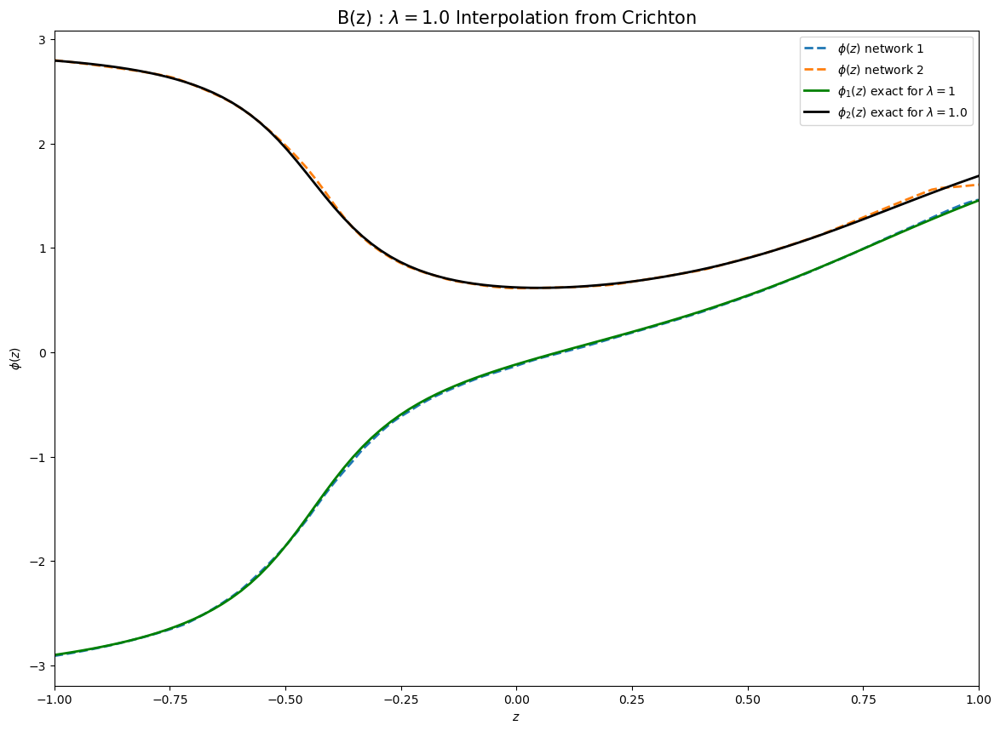

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 4 operations to synchronize with Neptune. Do not kill this process.
All 4 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1058
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1059
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): 

Train Epoch: 4999 ; tLoss: 0.000300: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:51<00:00,  7.68epoch/s]


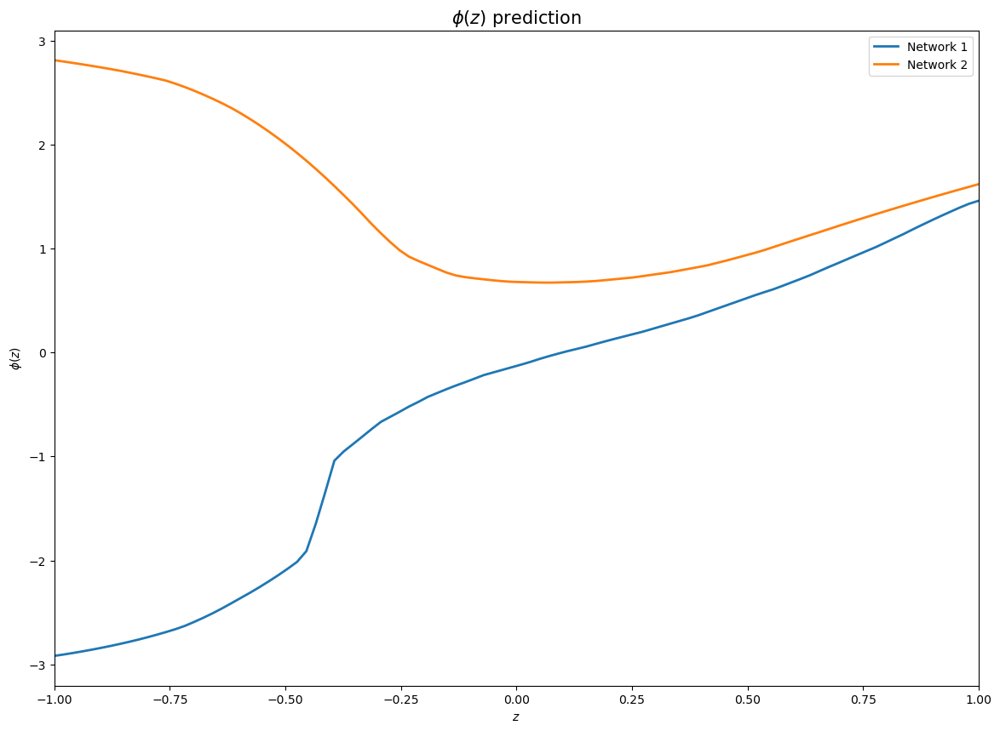

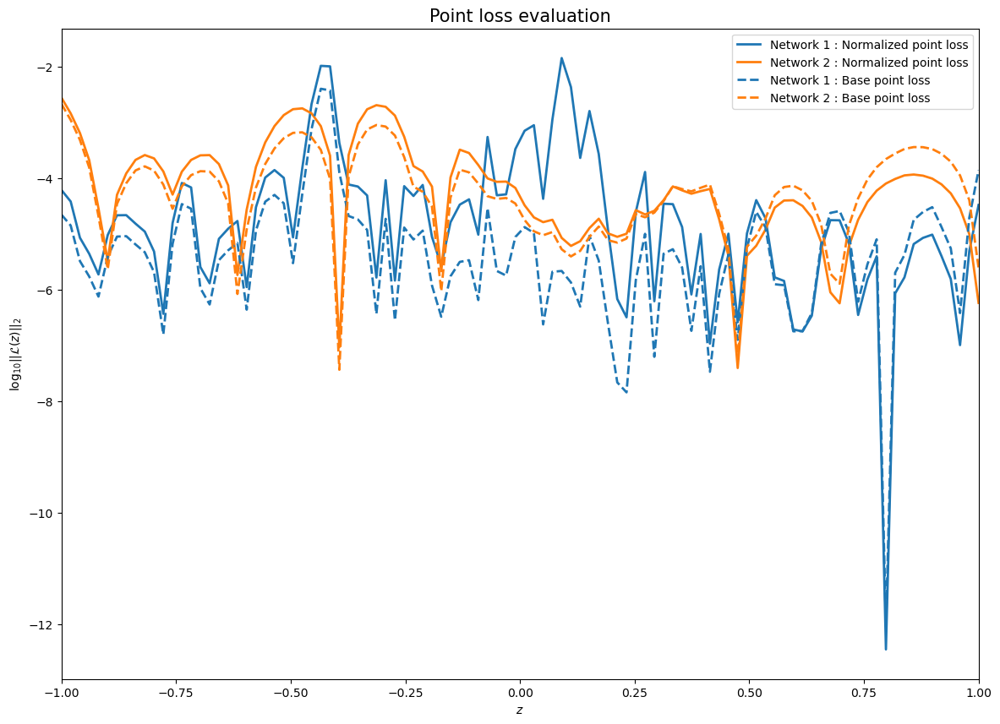

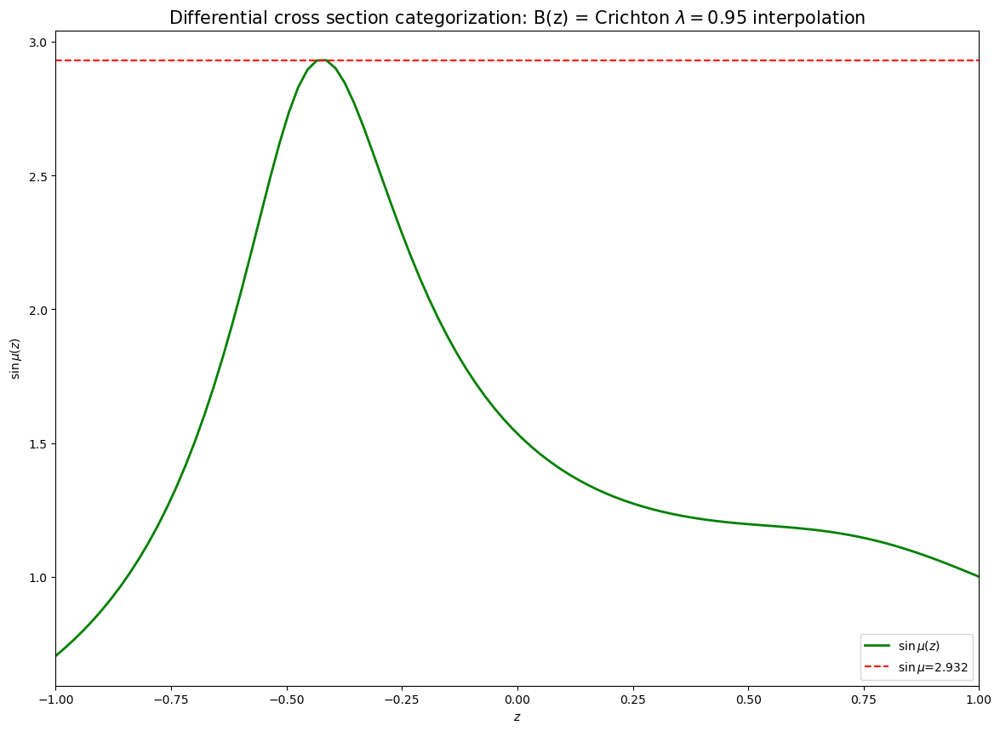

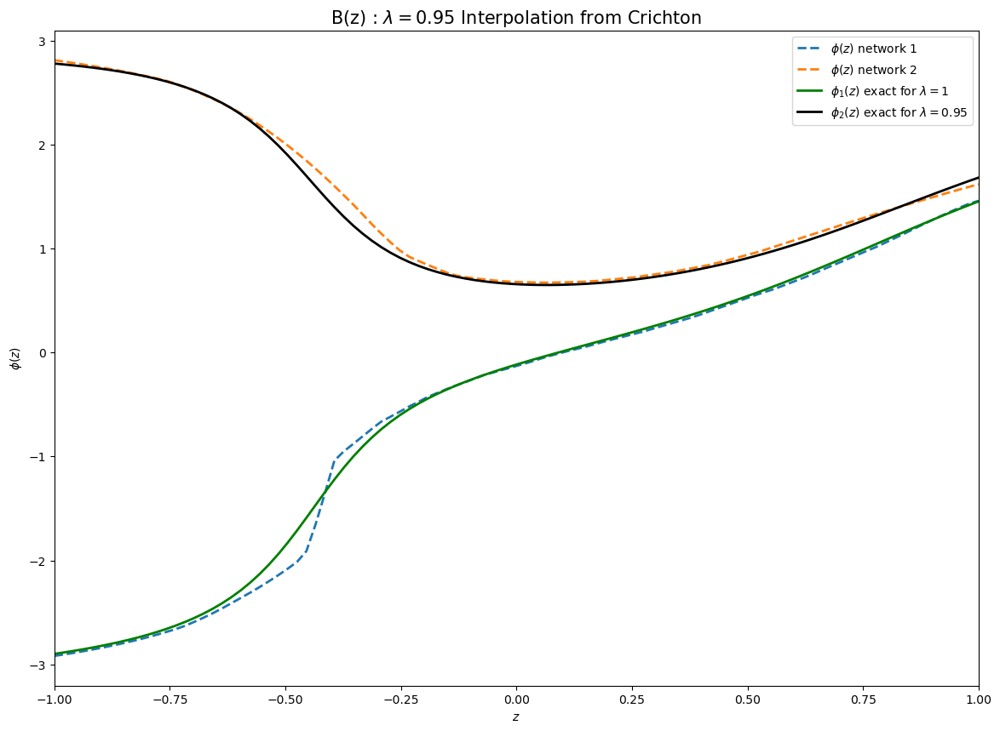

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 130 operations to synchronize with Neptune. Do not kill this process.
All 130 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1059
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1060
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.000348: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:21<00:00,  8.05epoch/s]


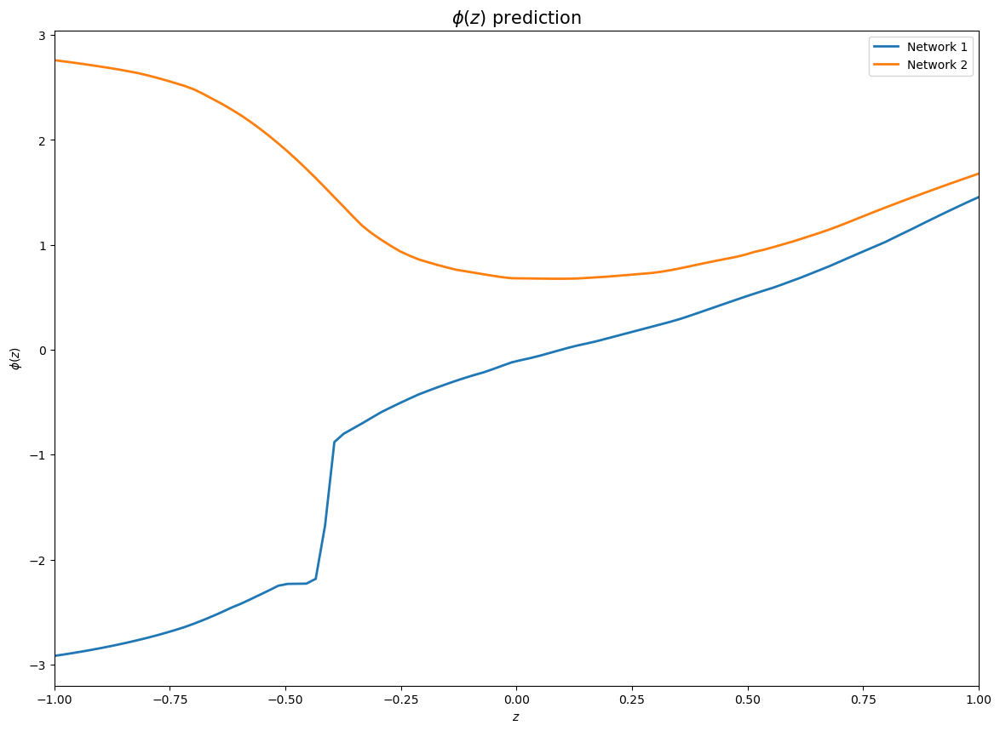

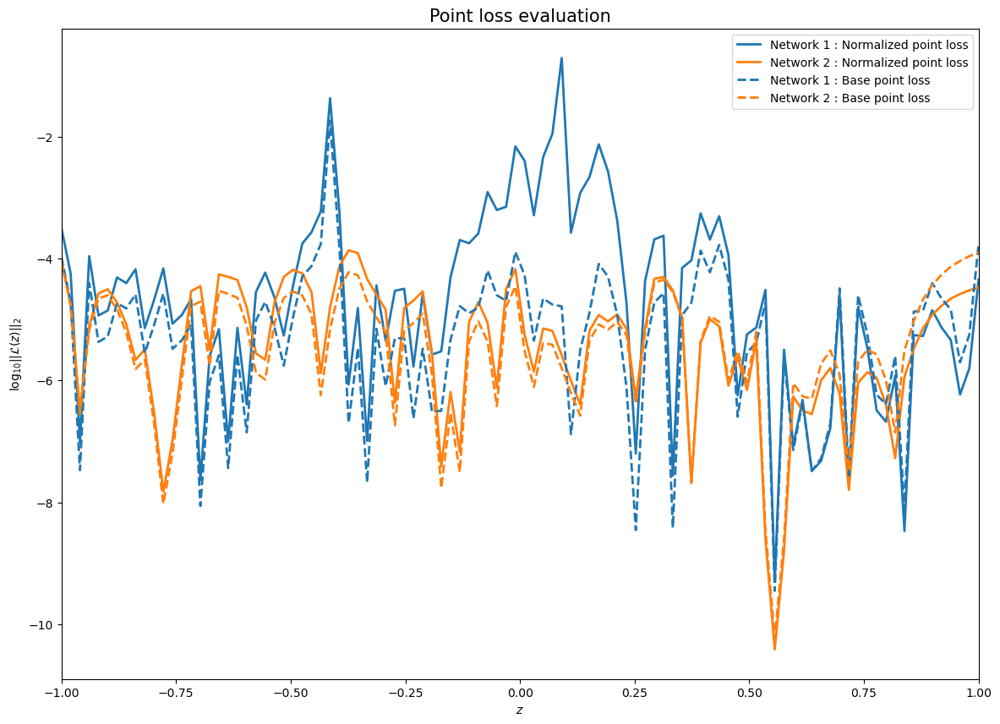

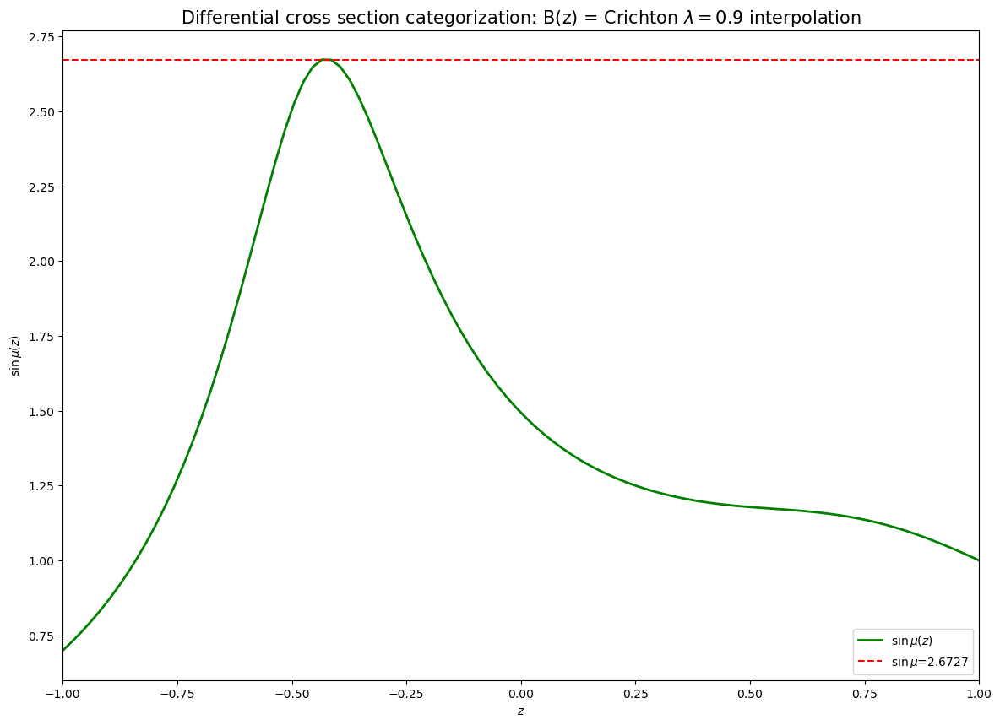

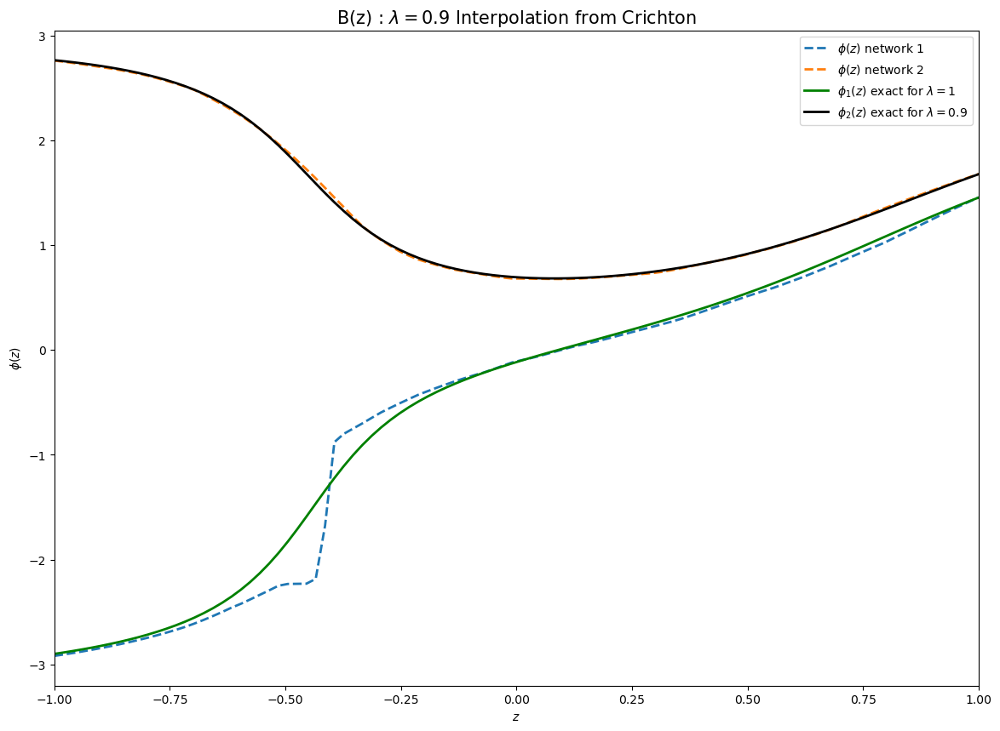

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 234 operations to synchronize with Neptune. Do not kill this process.
All 234 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1060
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1061
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.001126: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:32<00:00,  7.90epoch/s]


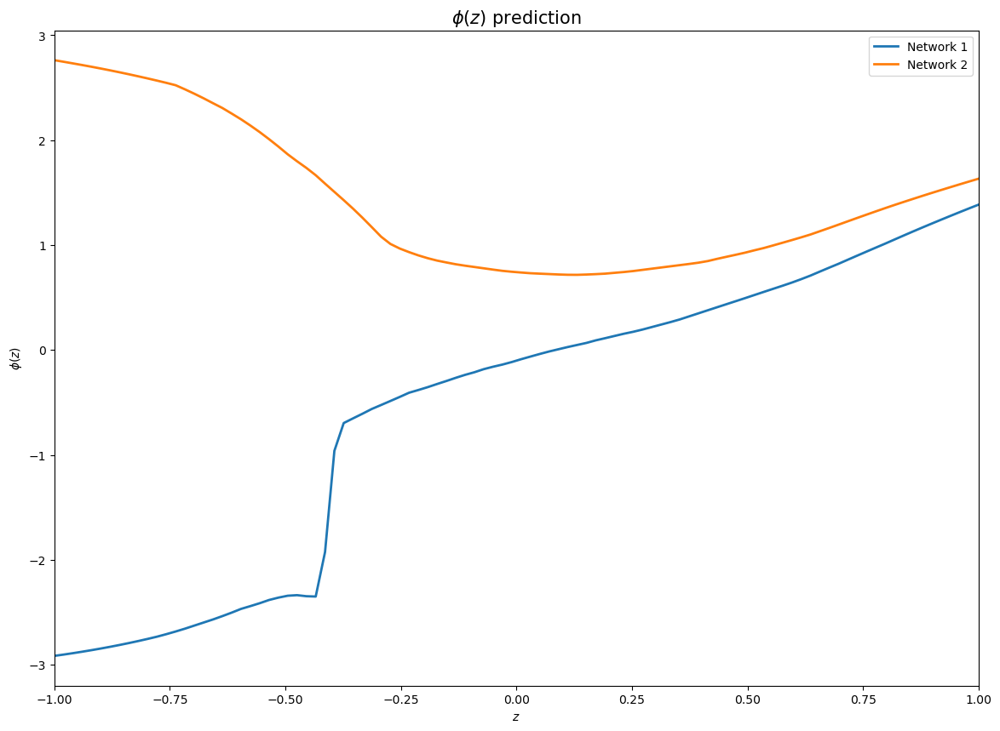

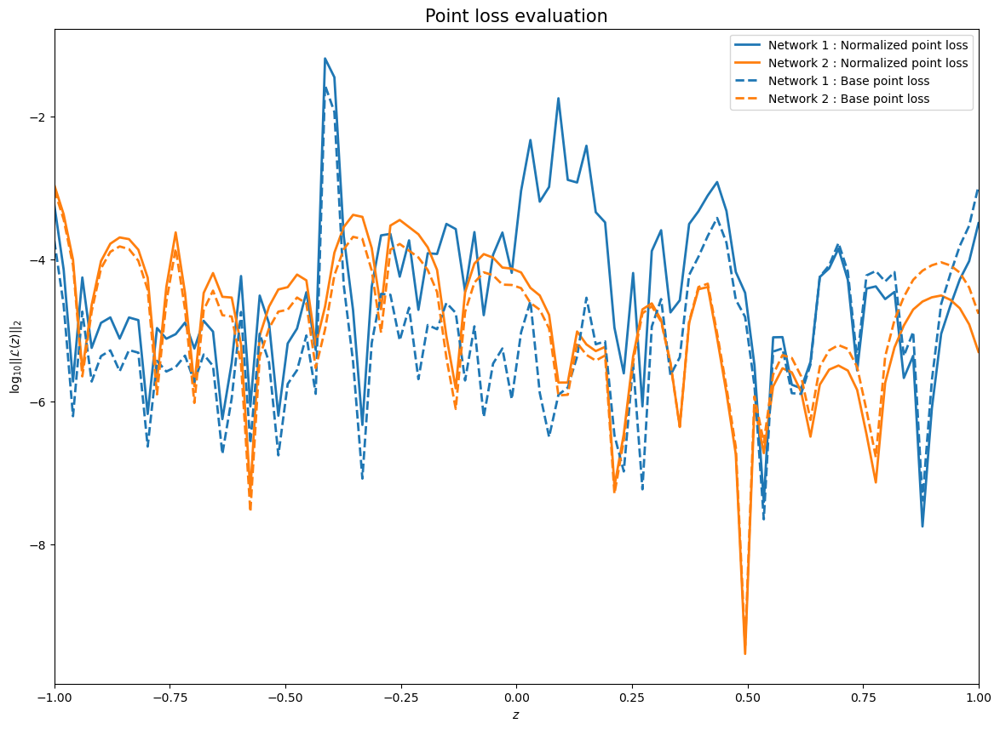

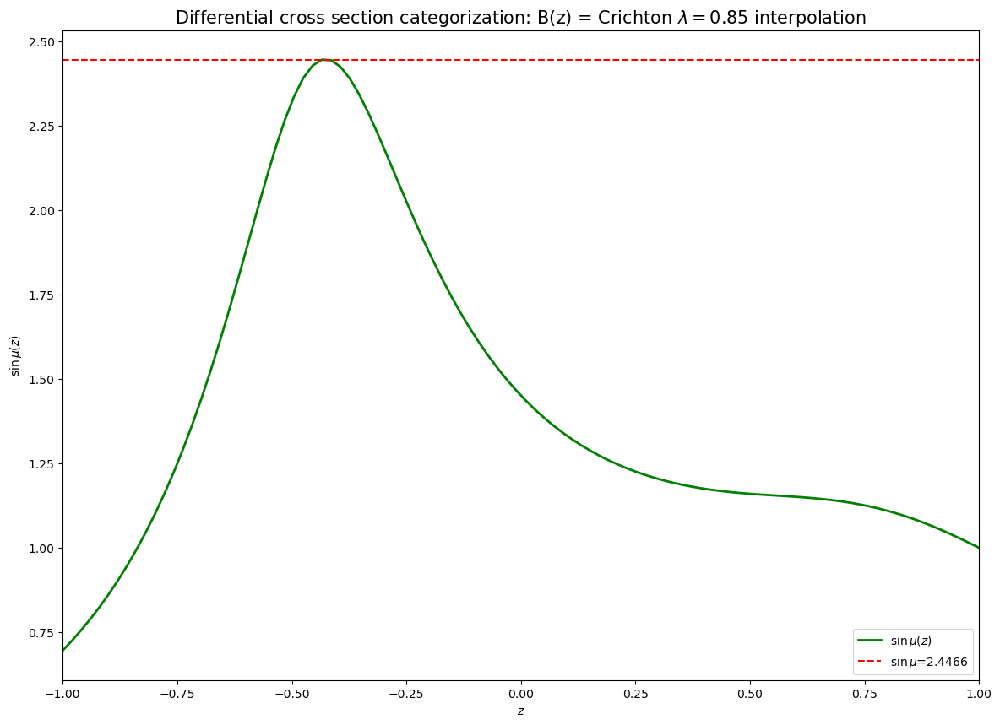

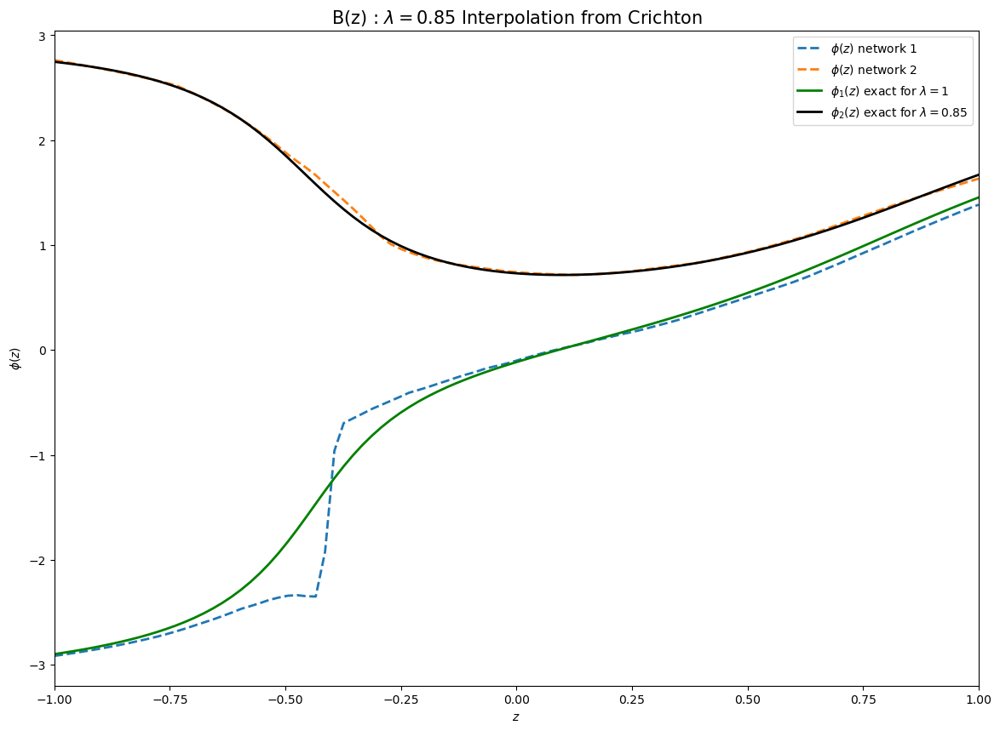

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 207 operations to synchronize with Neptune. Do not kill this process.
All 207 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1061
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1063
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.002070: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [11:05<00:00,  7.51epoch/s]


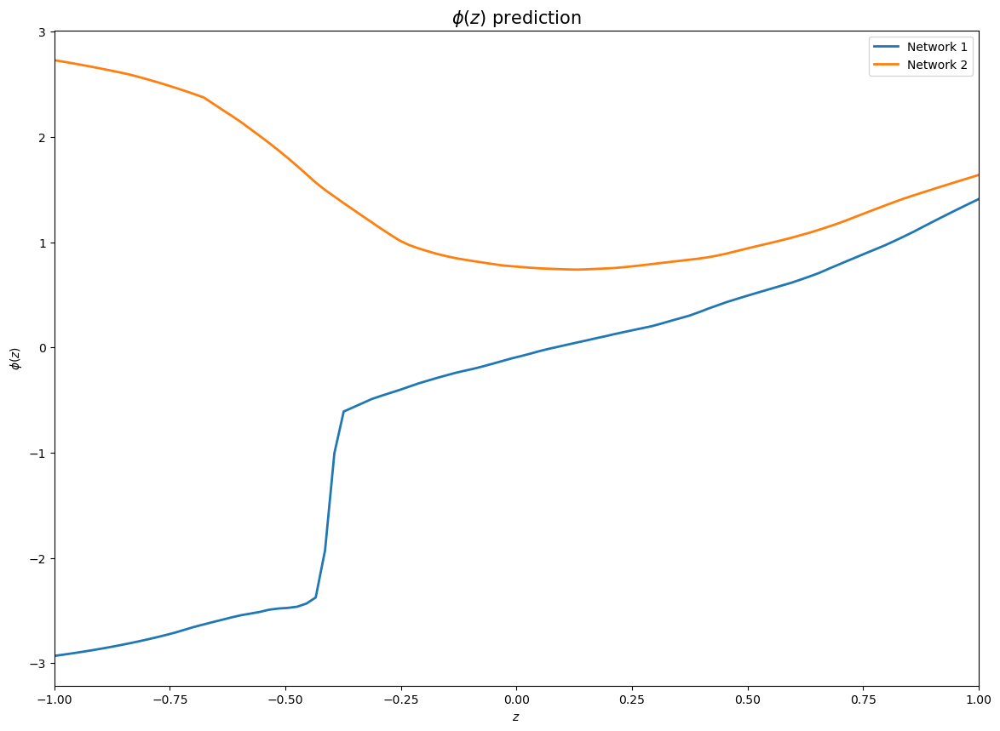

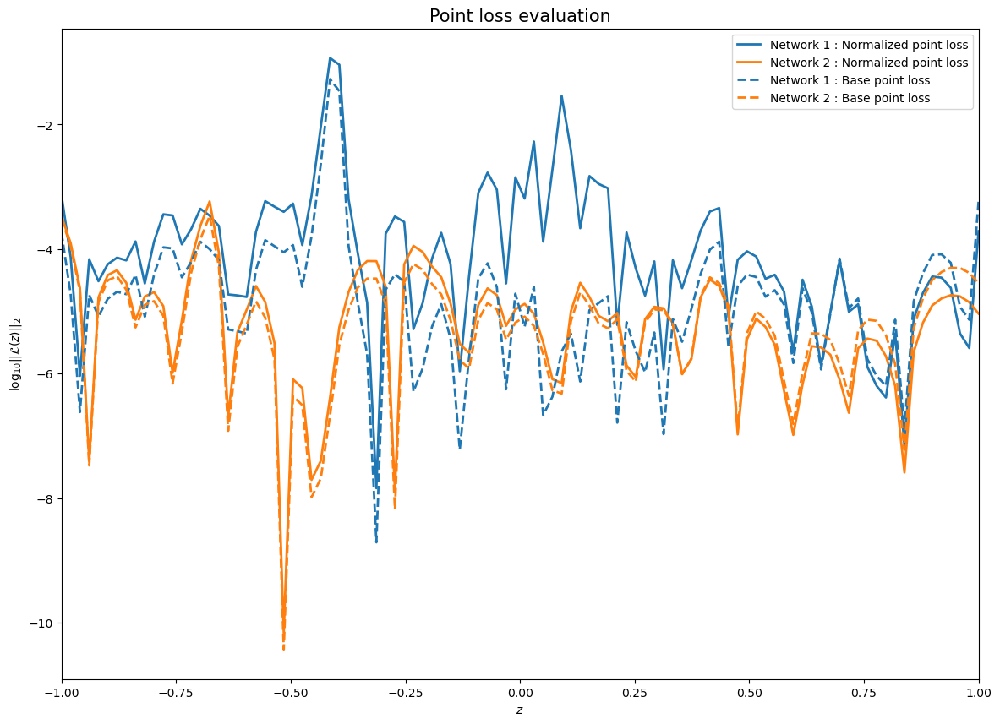

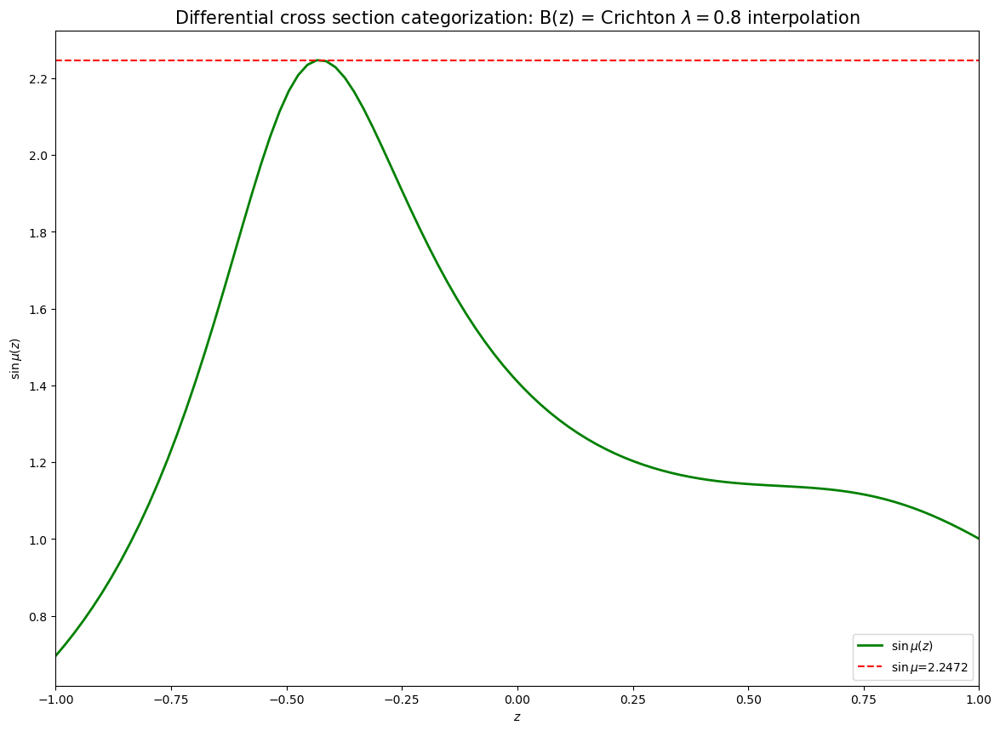

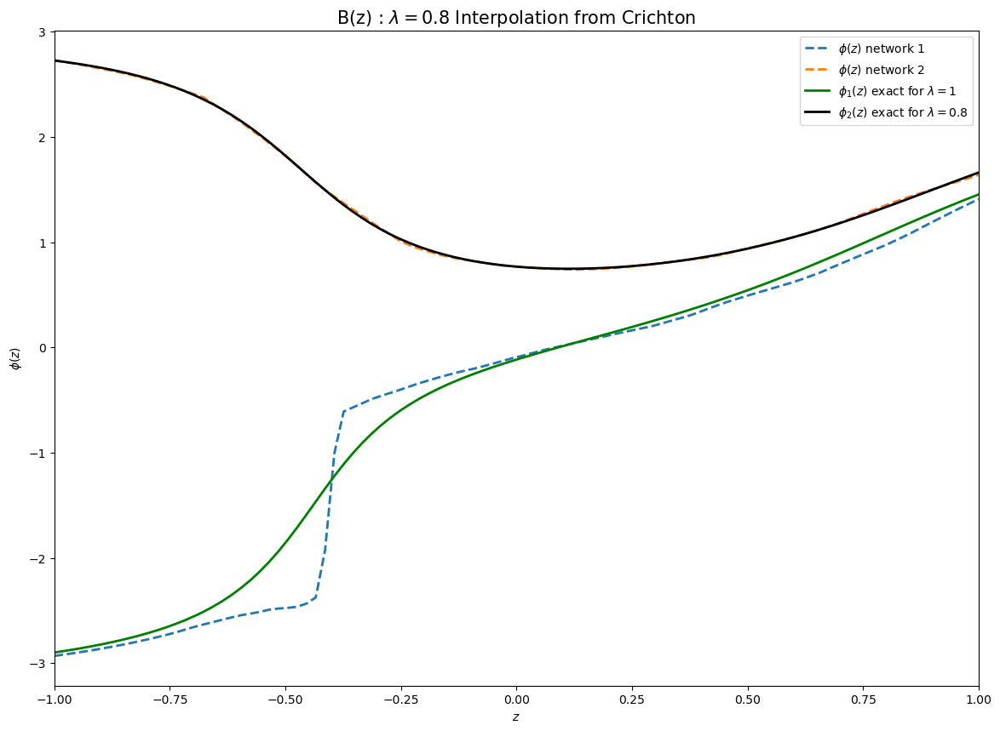

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 17 operations to synchronize with Neptune. Do not kill this process.
All 17 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1063
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1064
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4)

Train Epoch: 4999 ; tLoss: 0.002732: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [11:16<00:00,  7.39epoch/s]


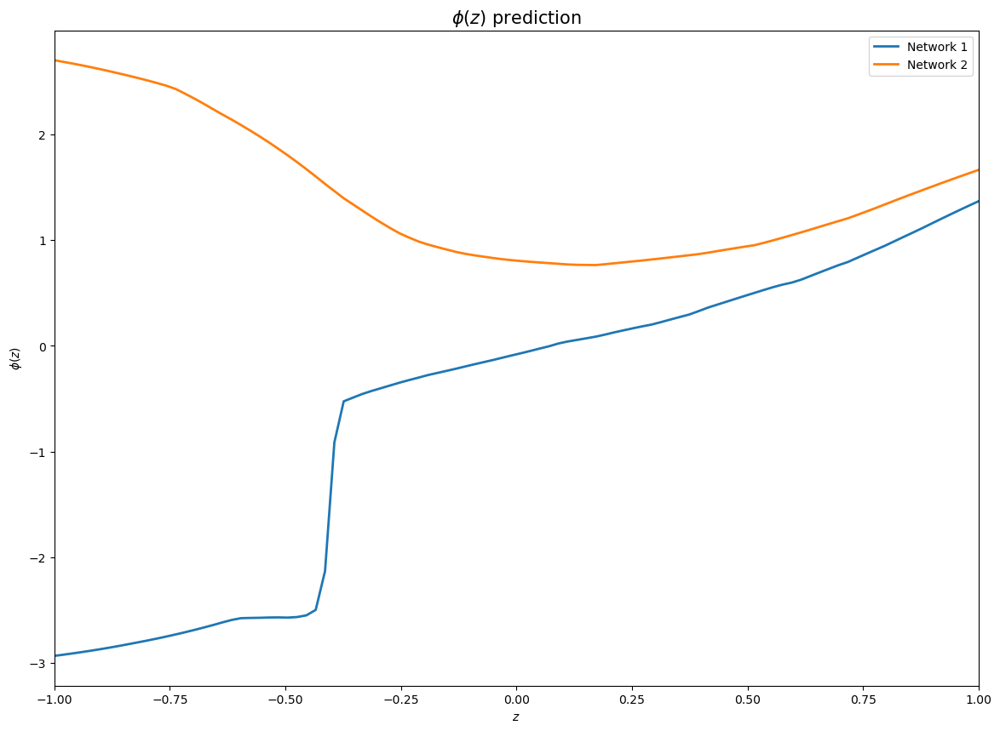

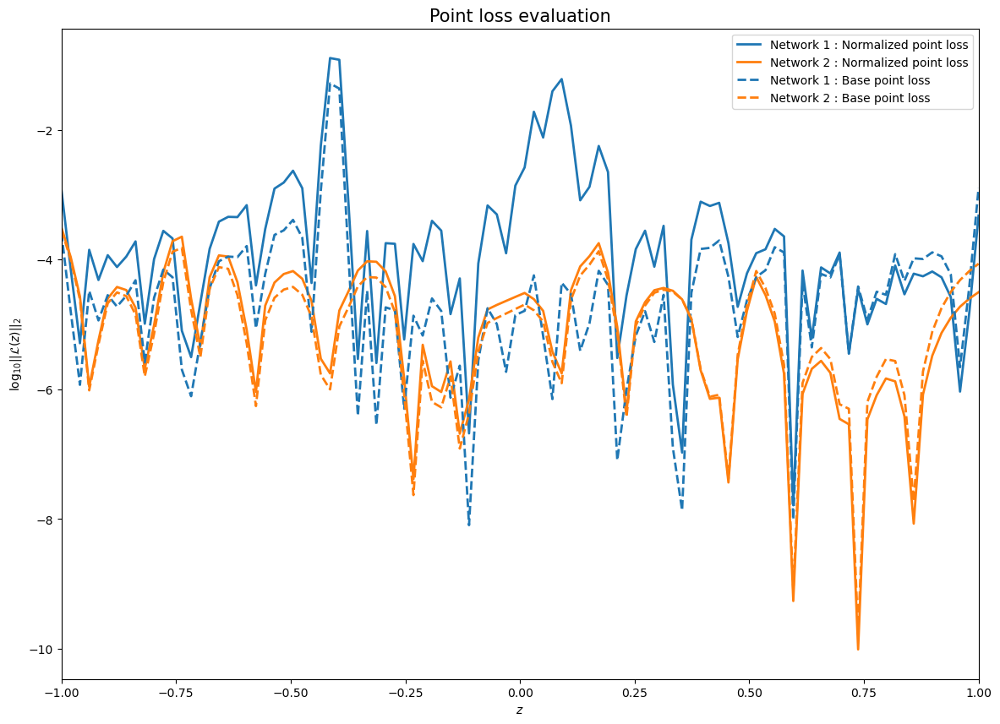

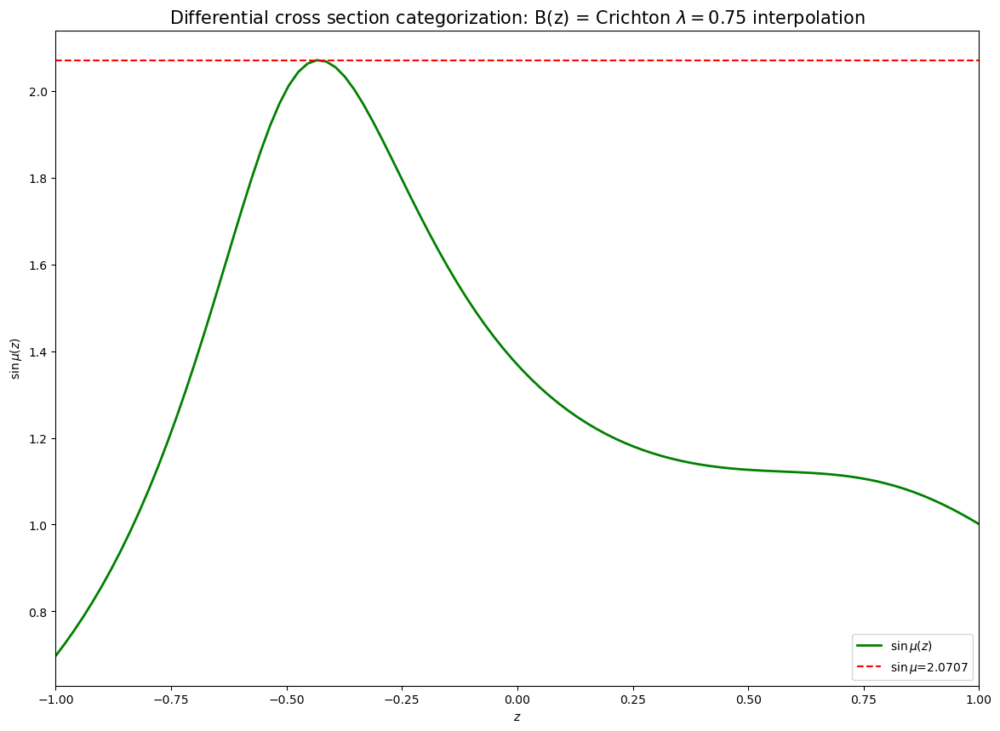

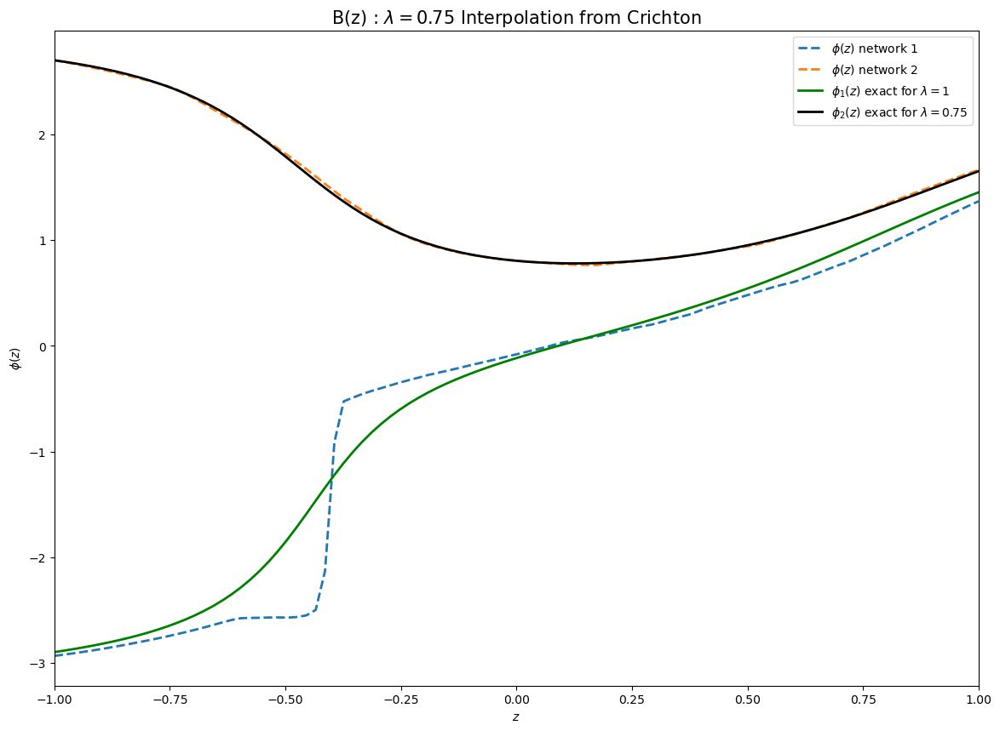

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 4 operations to synchronize with Neptune. Do not kill this process.
All 4 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1064
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1065
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): 

Train Epoch: 4999 ; tLoss: 0.004591: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [11:32<00:00,  7.22epoch/s]


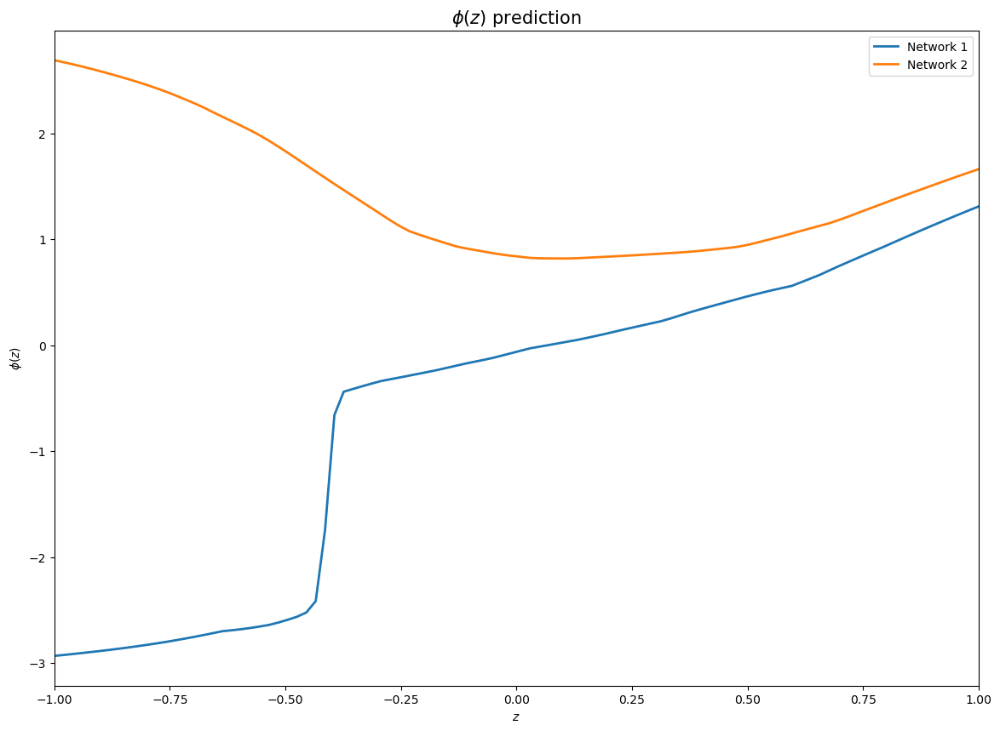

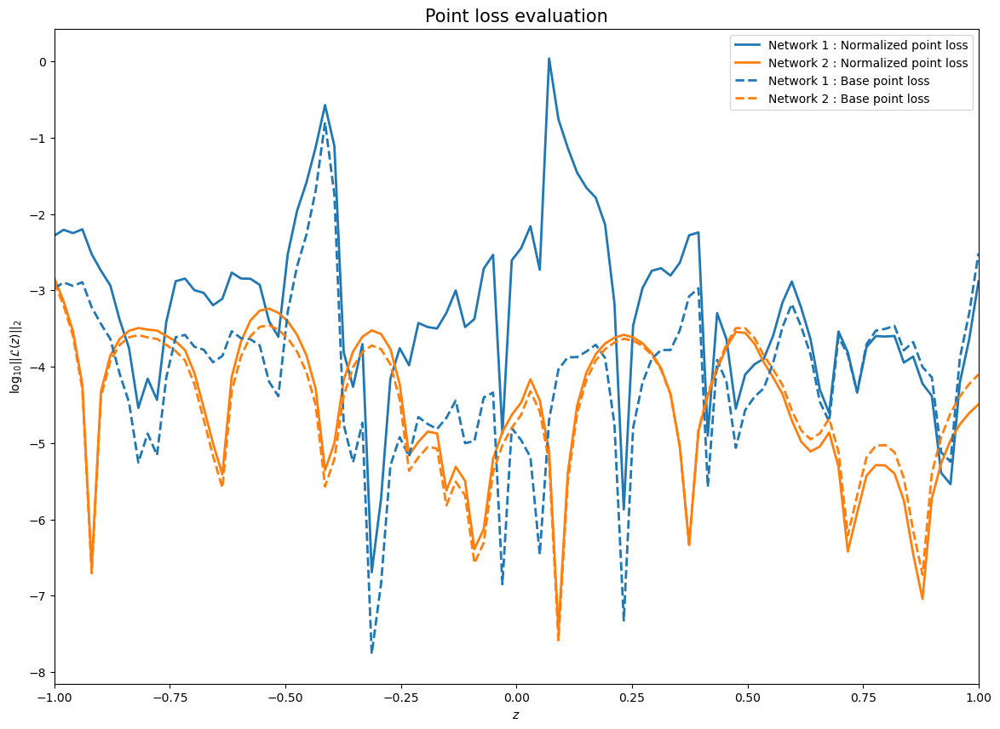

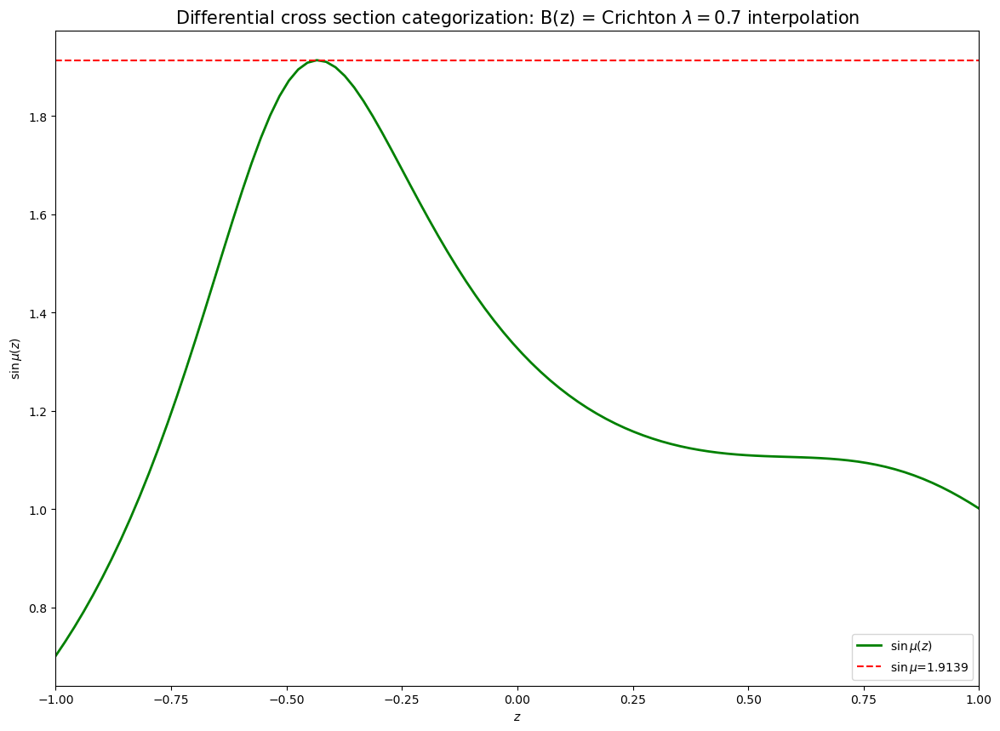

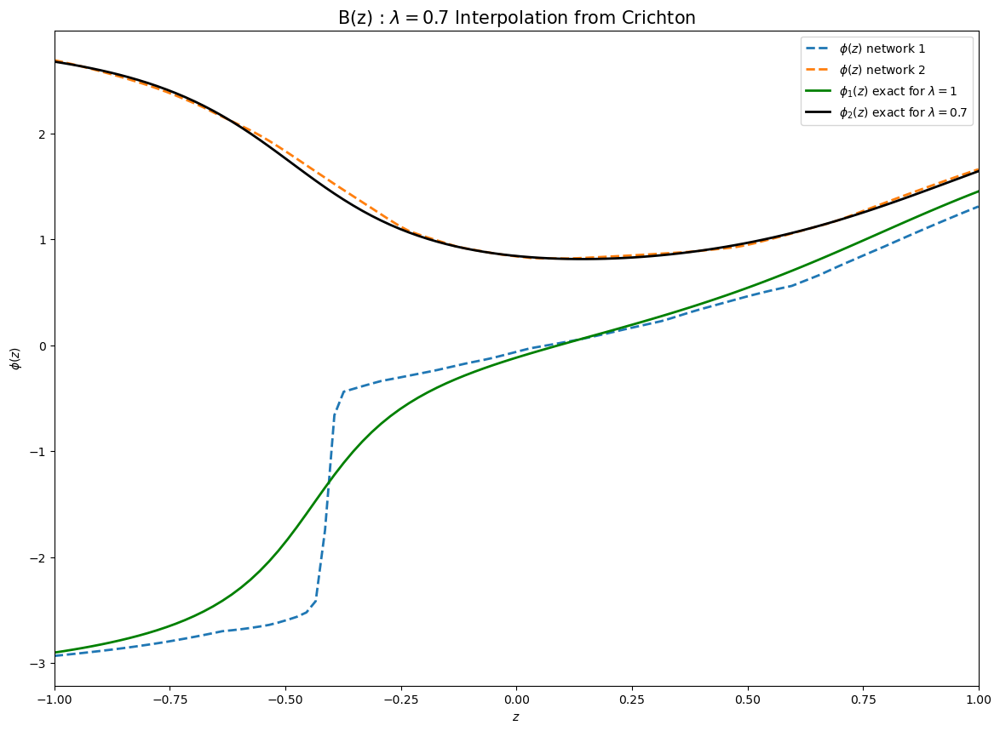

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 4 operations to synchronize with Neptune. Do not kill this process.
All 4 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1065
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1066
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): 

Train Epoch: 4999 ; tLoss: 0.005468: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:05<00:00,  8.26epoch/s]


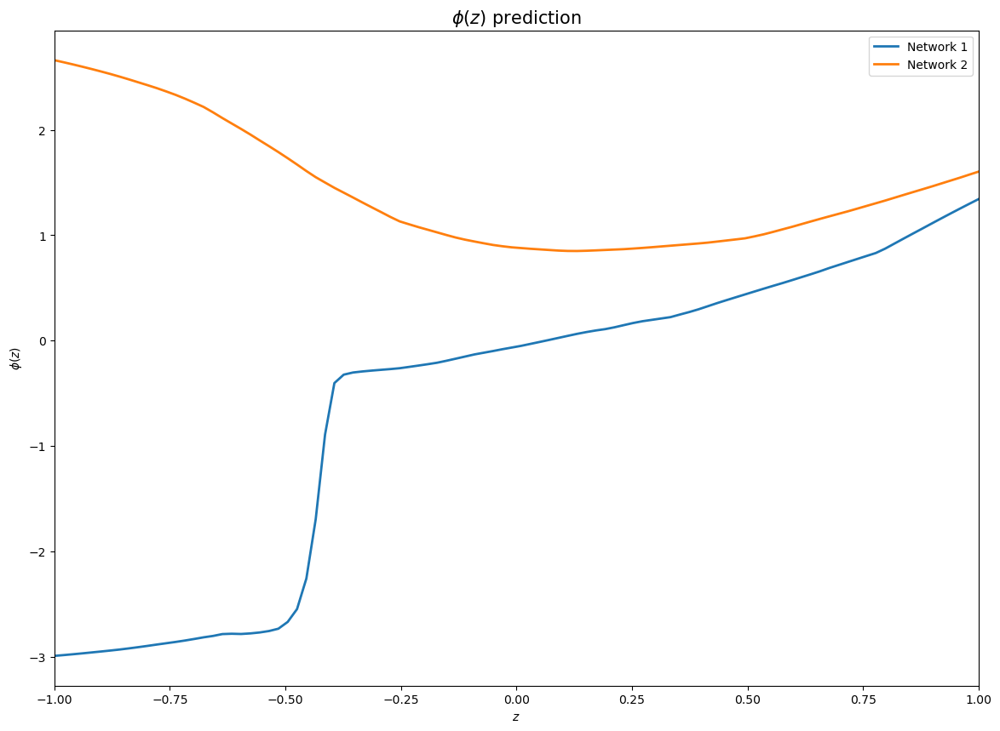

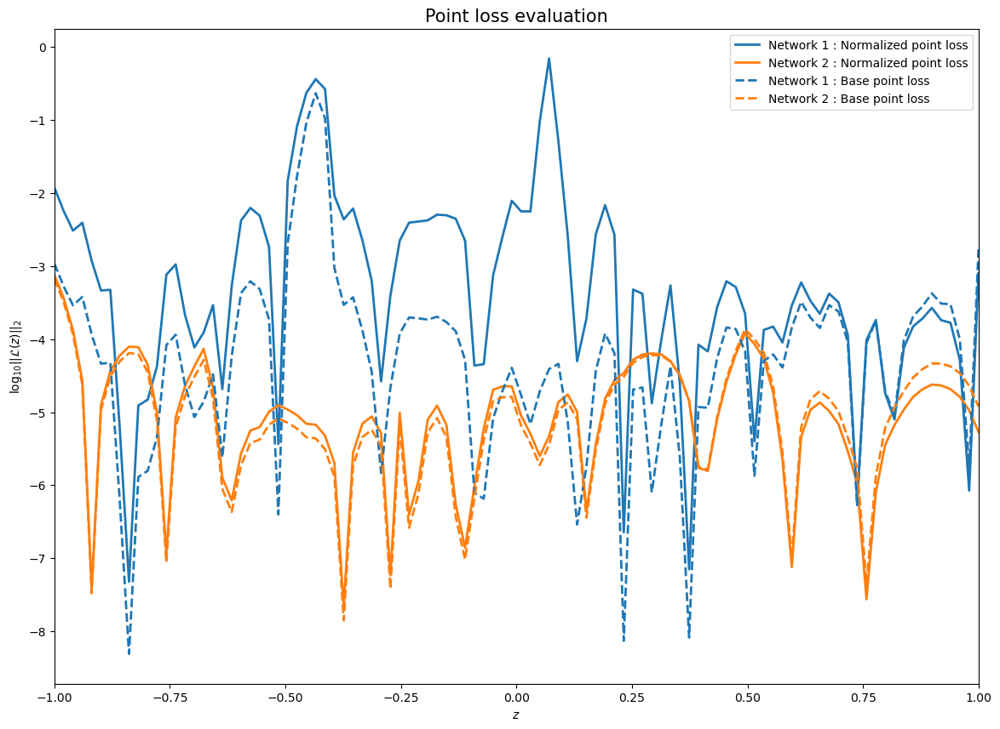

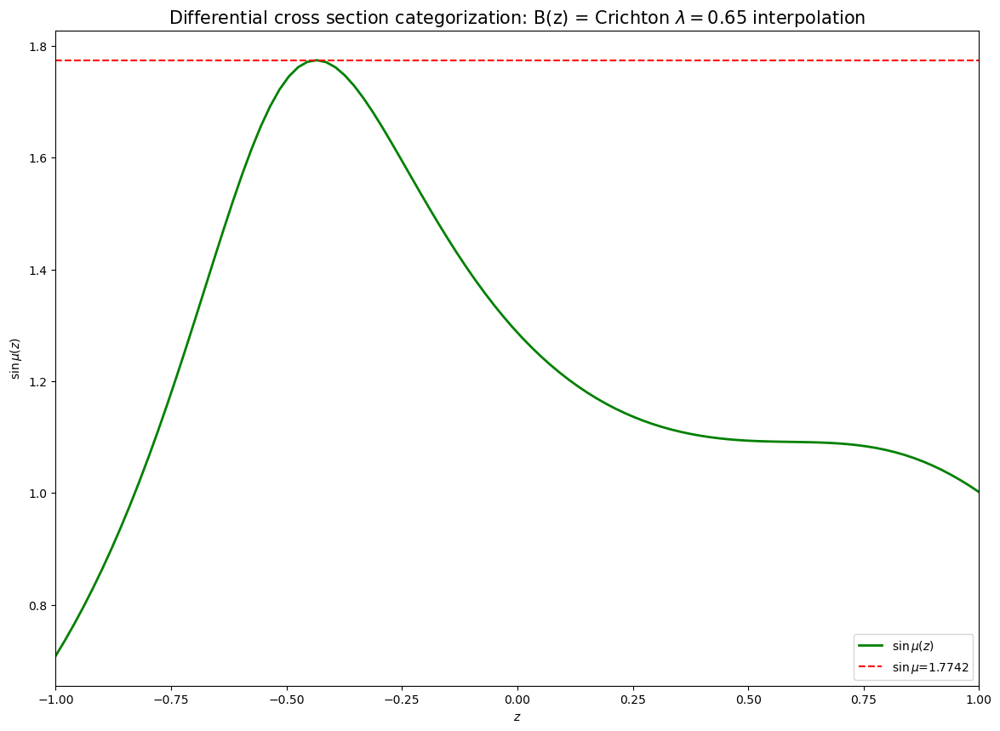

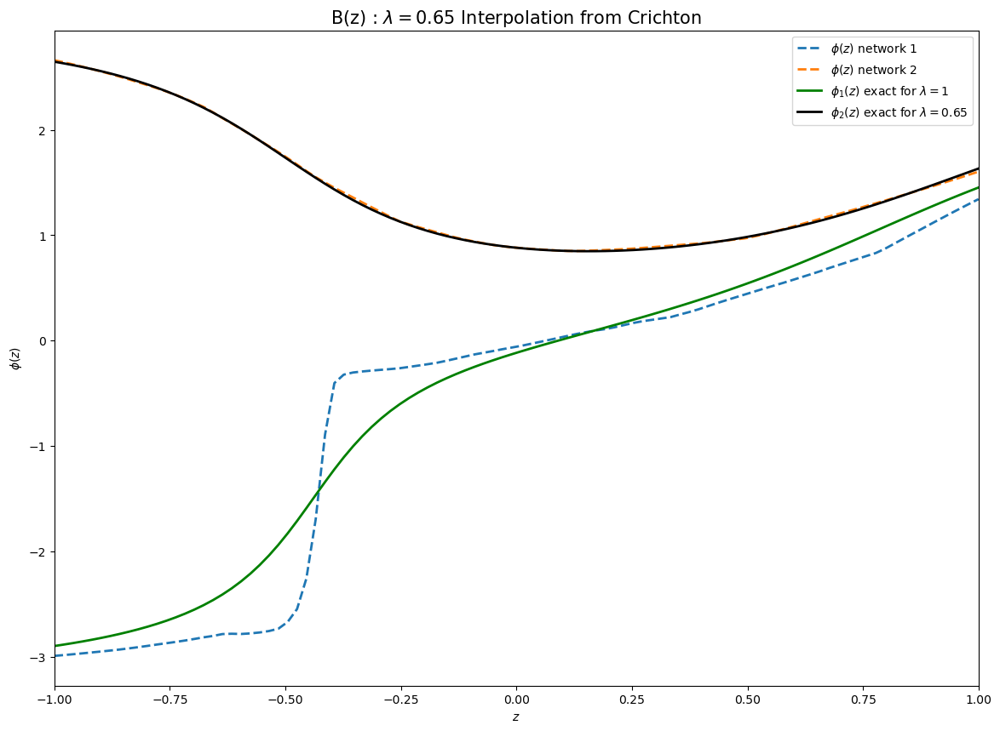

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 27 operations to synchronize with Neptune. Do not kill this process.
All 27 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1066
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1067
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4)

Train Epoch: 4999 ; tLoss: 0.003266: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:06<00:00,  8.24epoch/s]


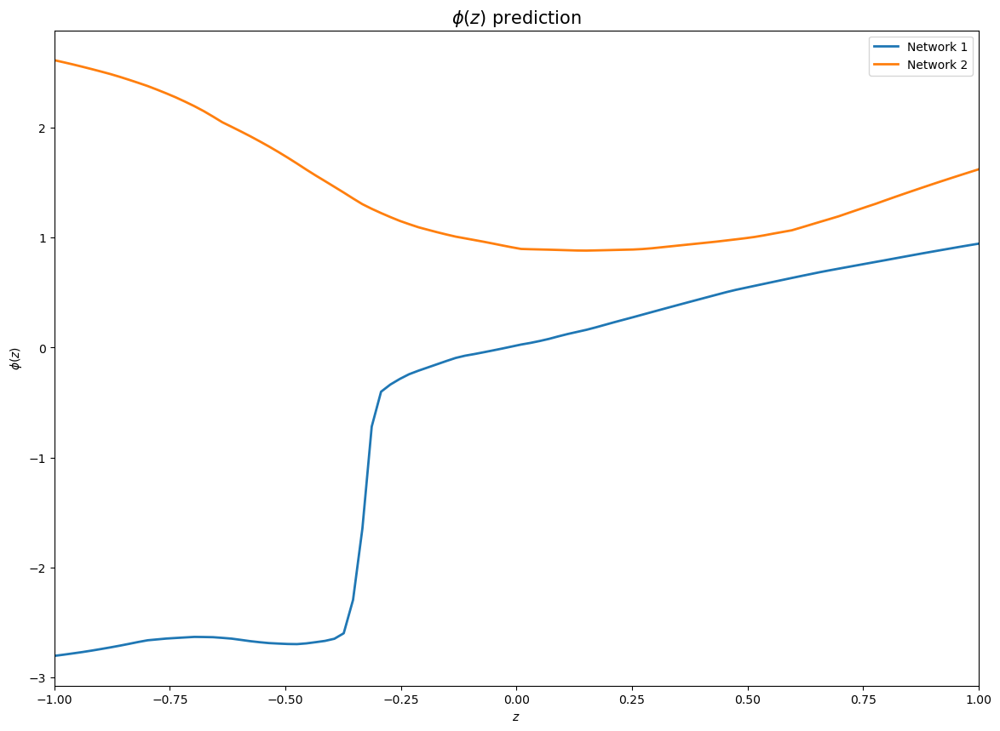

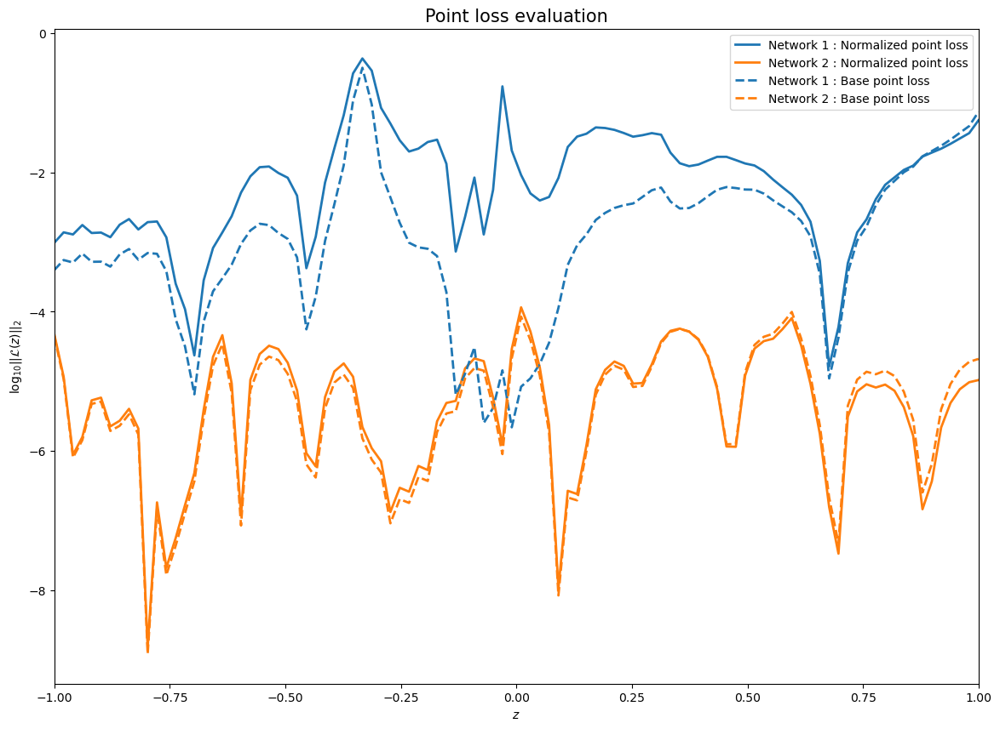

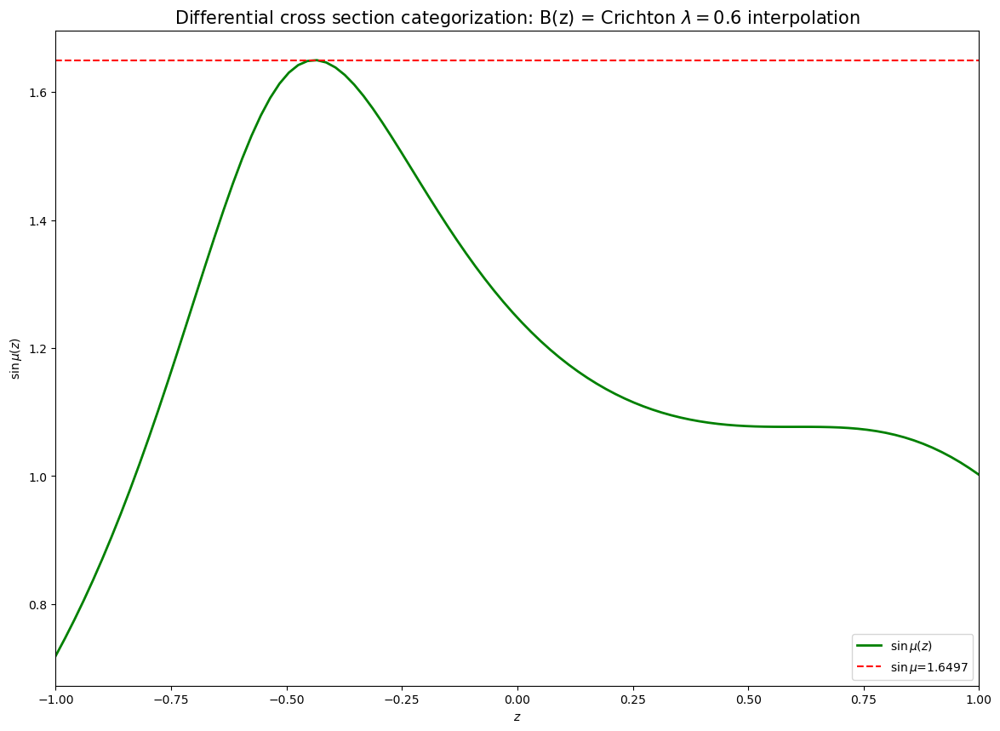

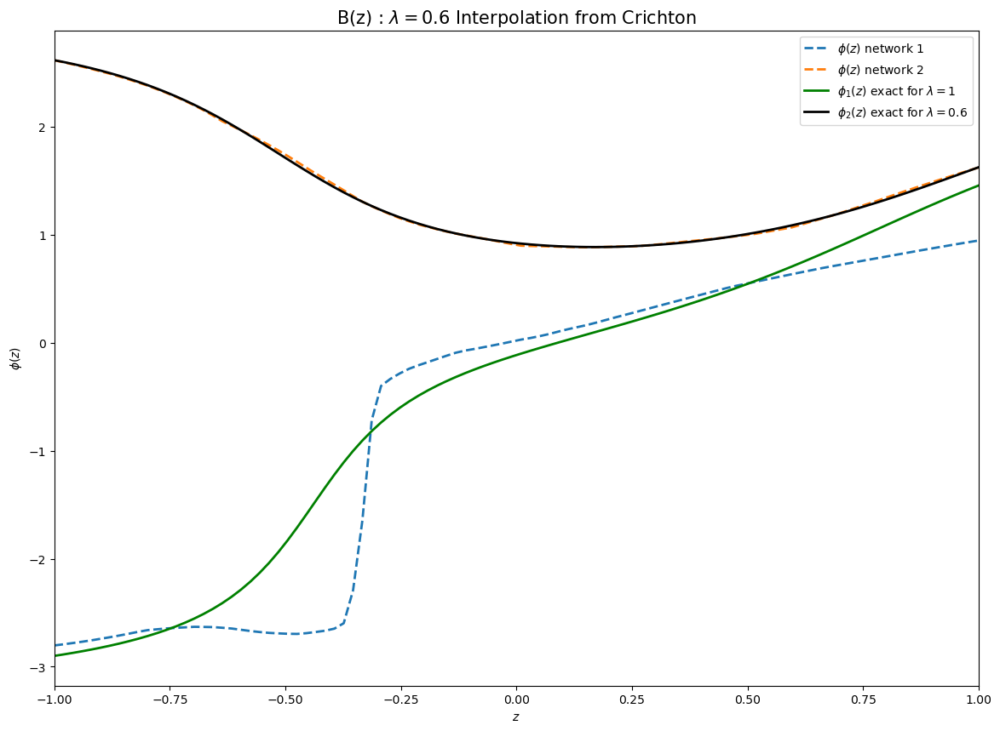

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 15 operations to synchronize with Neptune. Do not kill this process.
All 15 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1067
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1068
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4)

Train Epoch: 4999 ; tLoss: 0.006822: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:09<00:00,  8.20epoch/s]


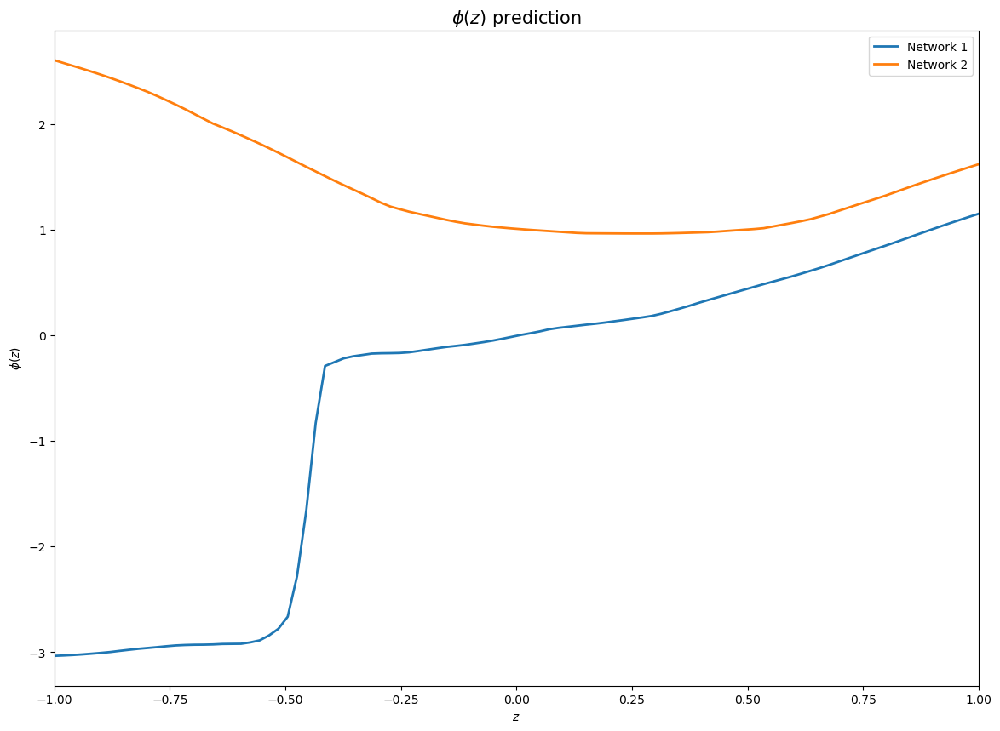

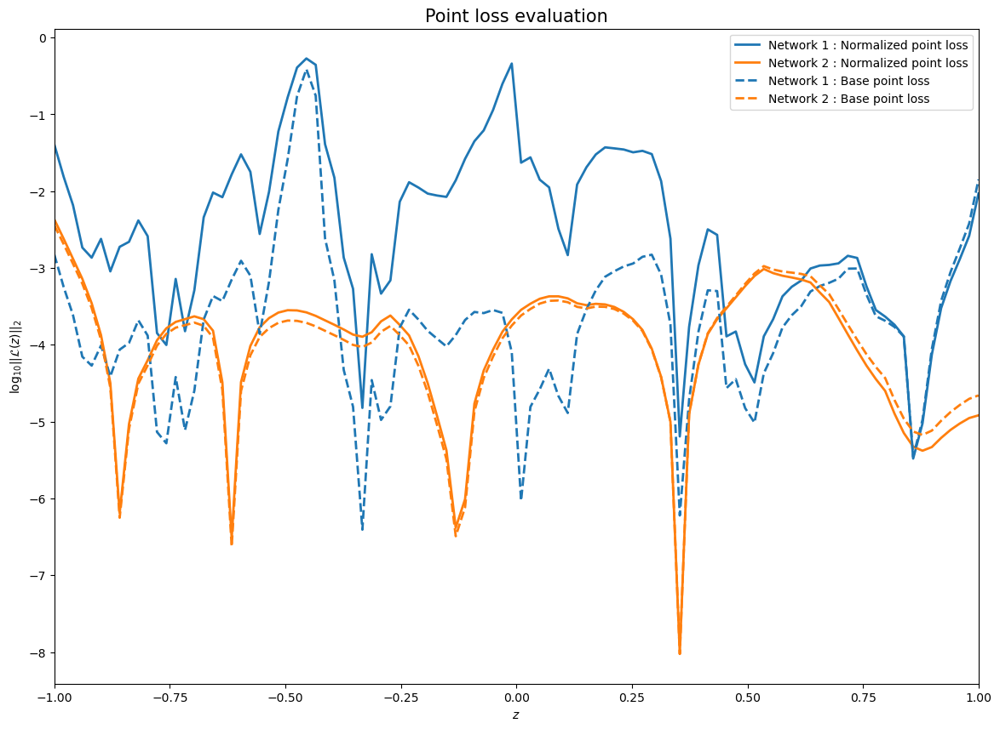

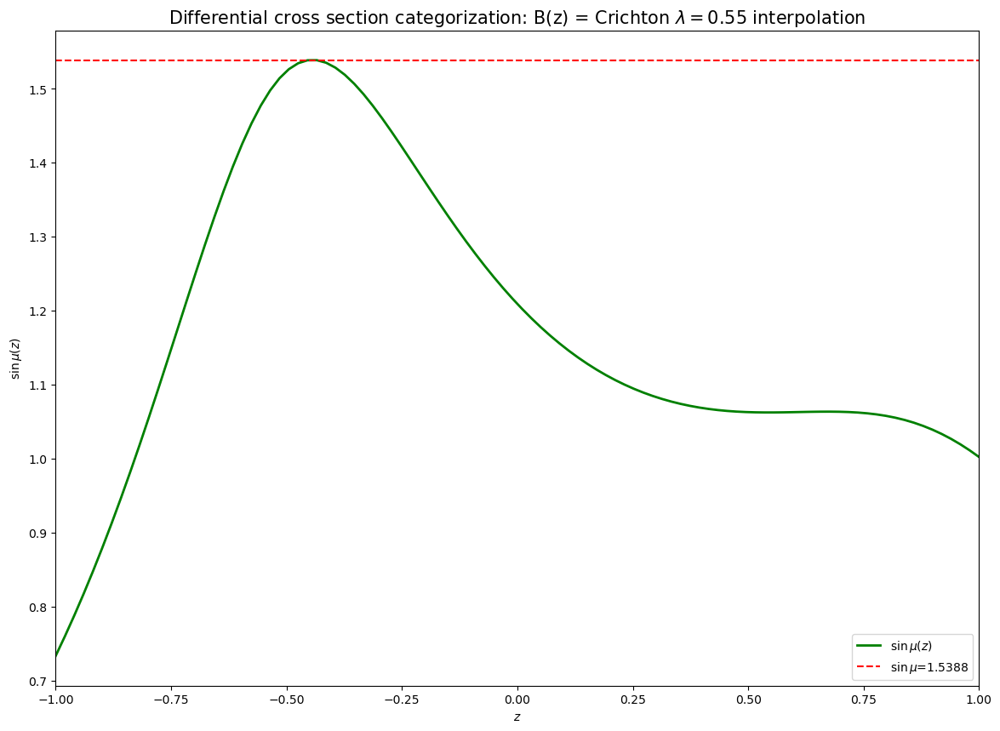

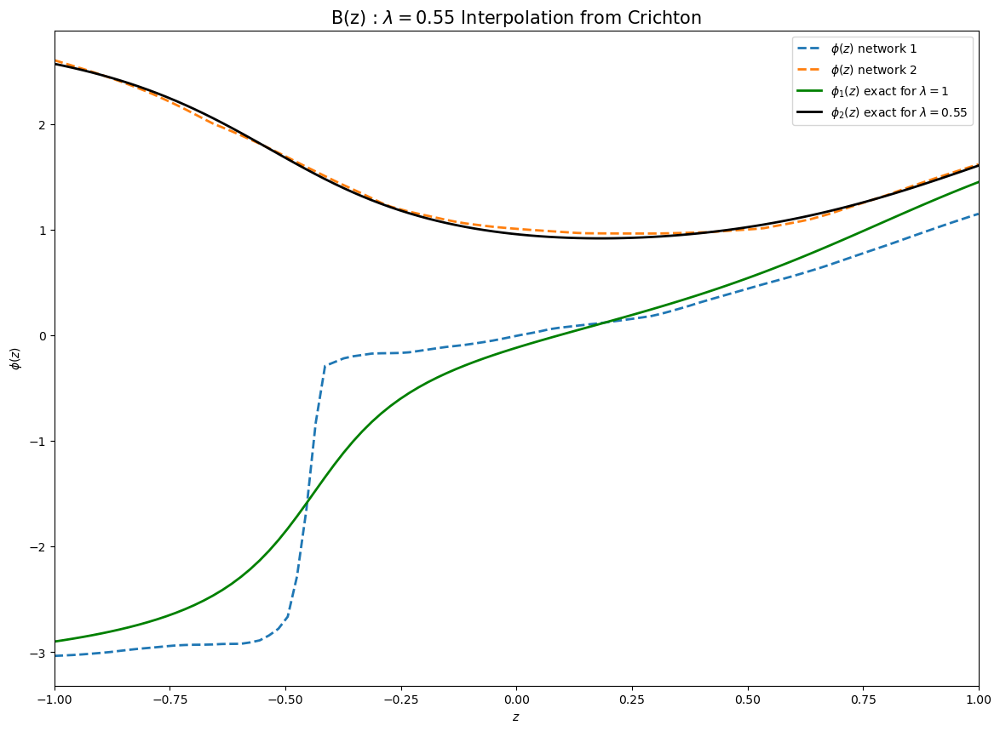

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 236 operations to synchronize with Neptune. Do not kill this process.
All 236 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1068
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1069
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.007854: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:11<00:00,  8.17epoch/s]


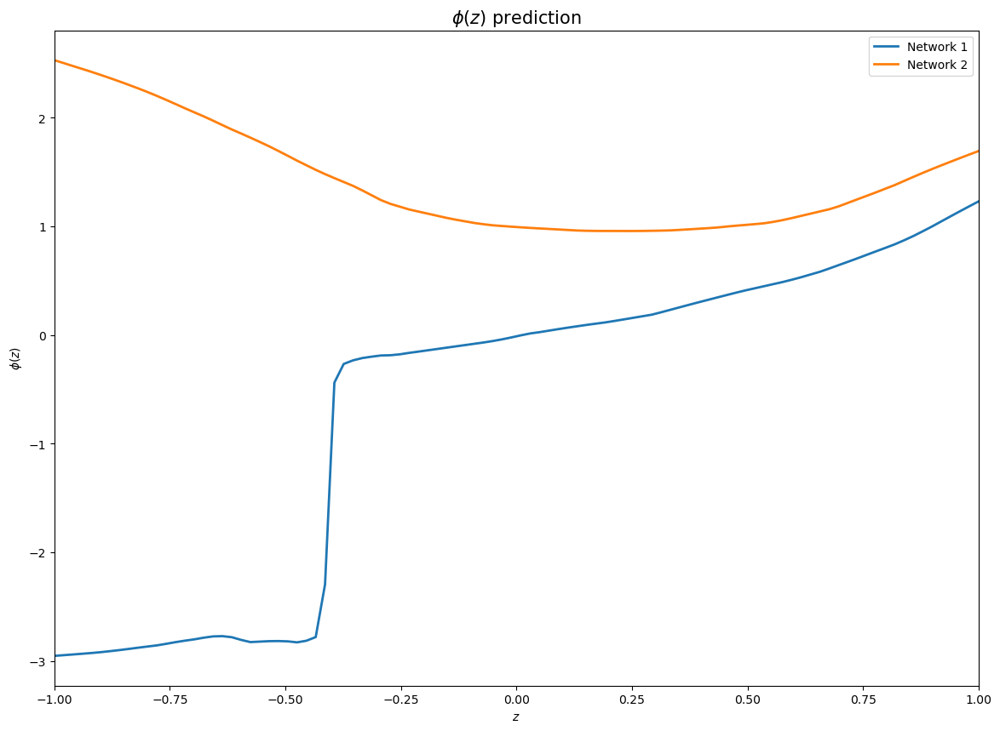

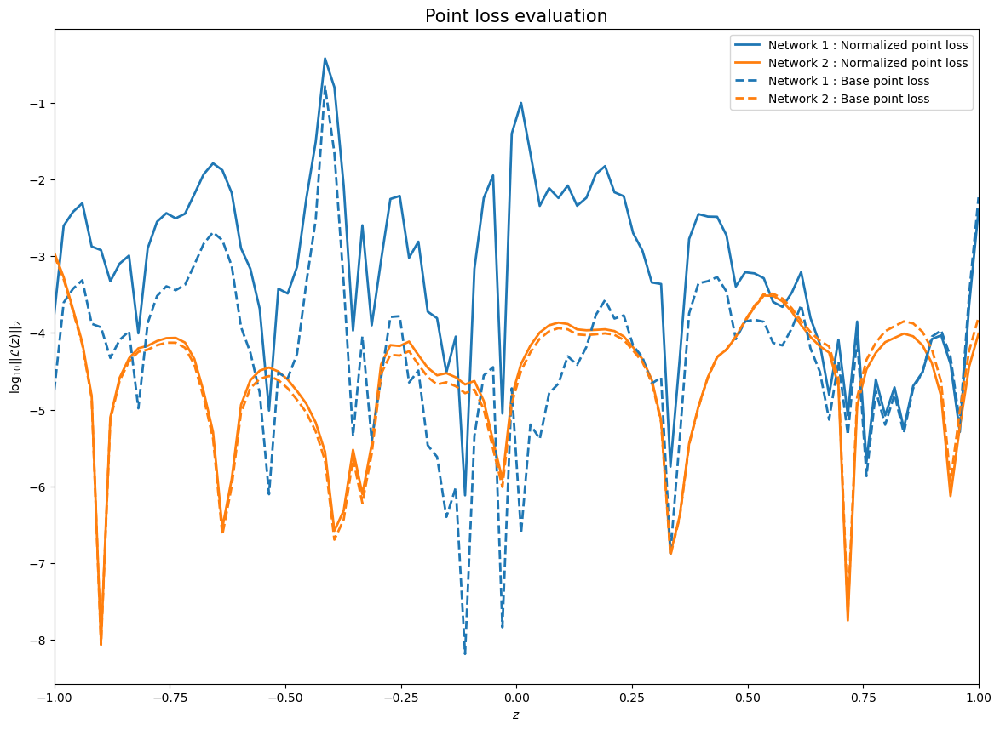

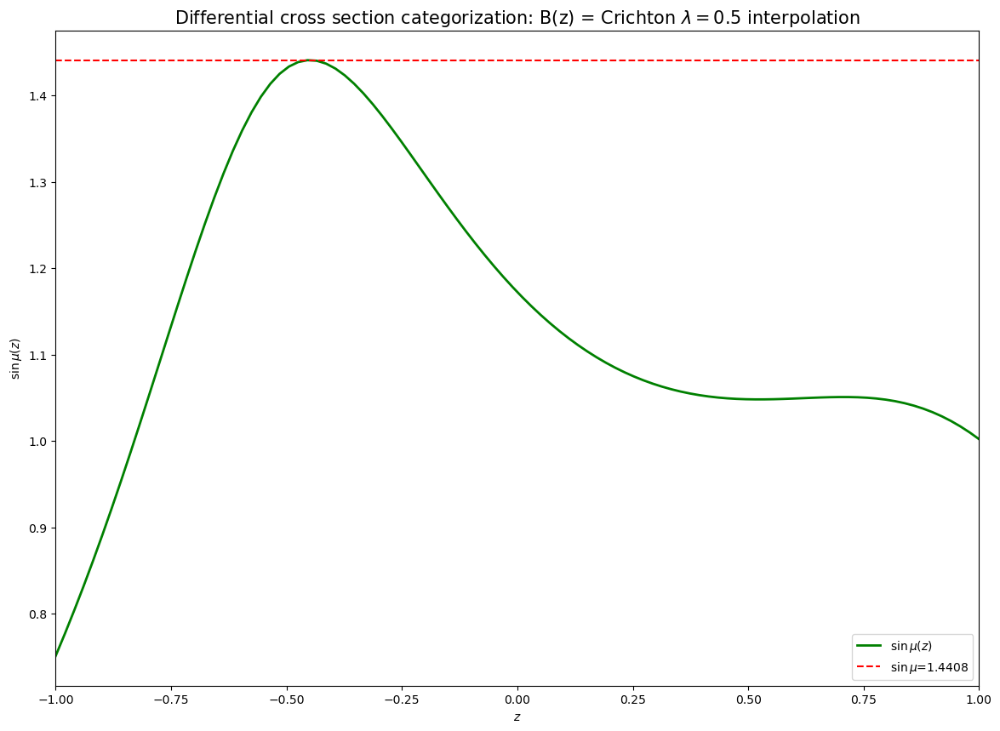

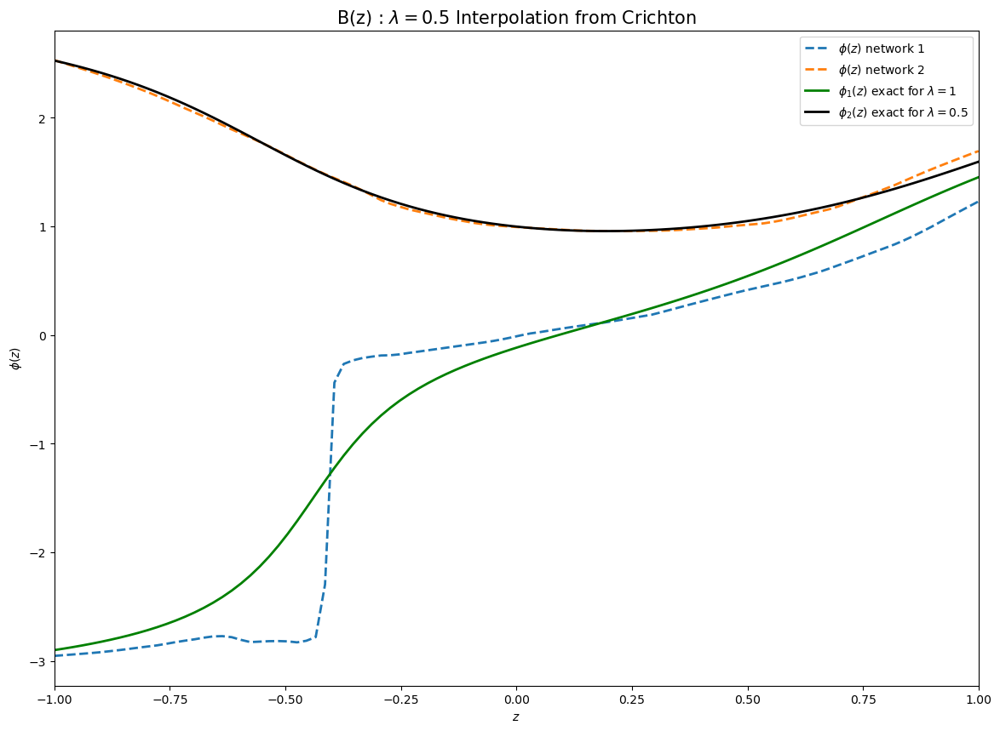

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 260 operations to synchronize with Neptune. Do not kill this process.
All 260 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1069
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1070
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.001575: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:10<00:00,  8.19epoch/s]


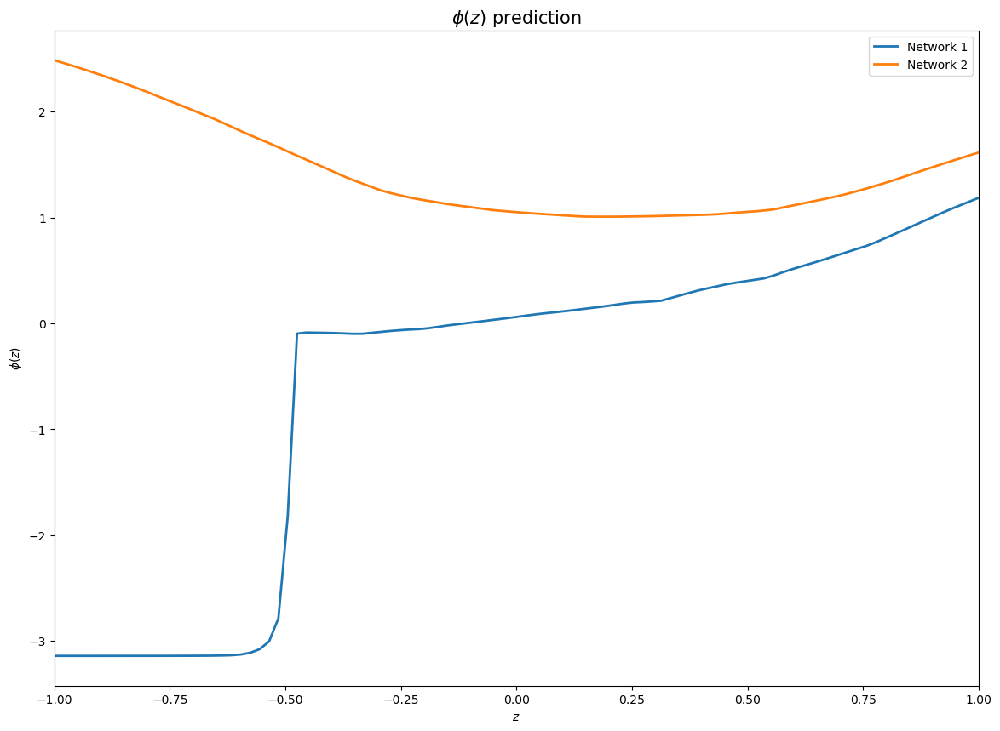

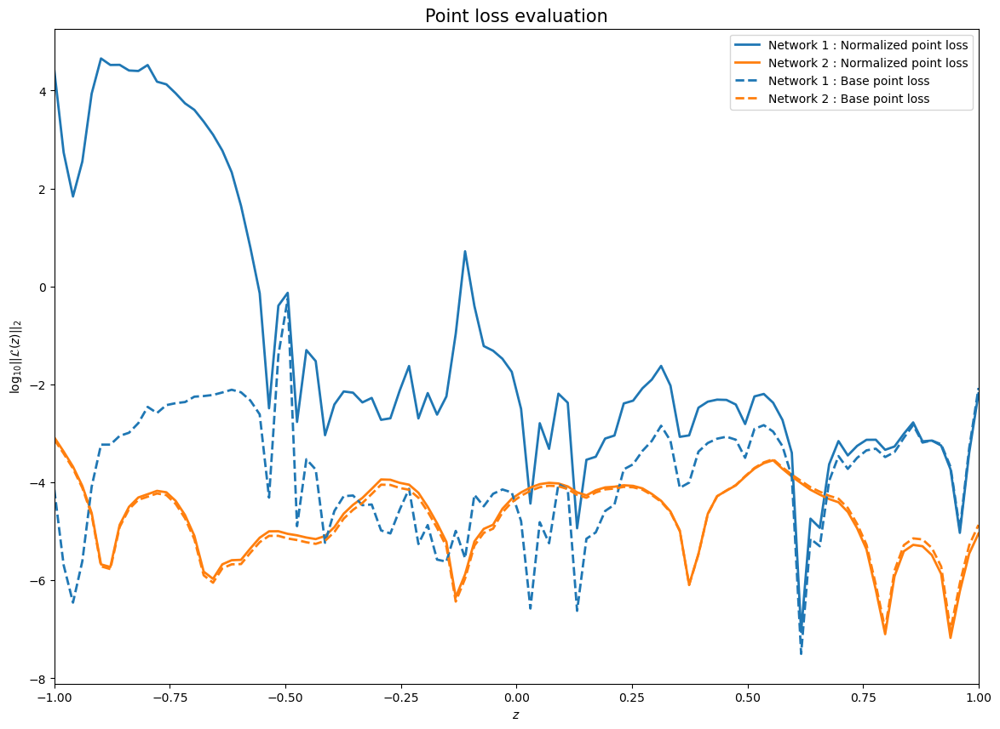

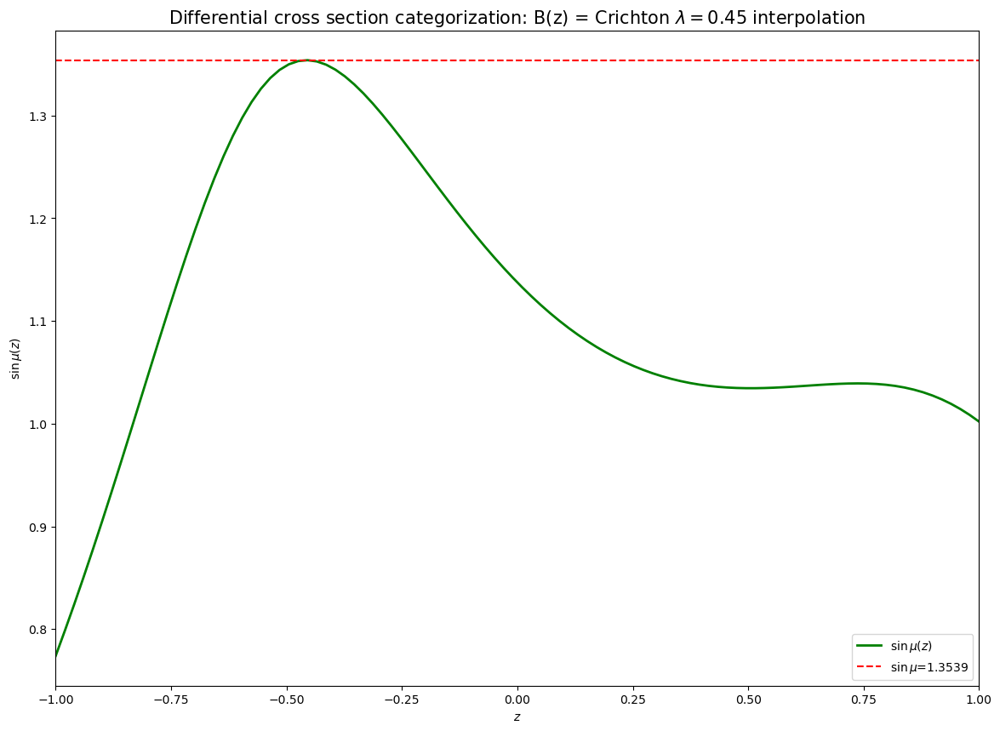

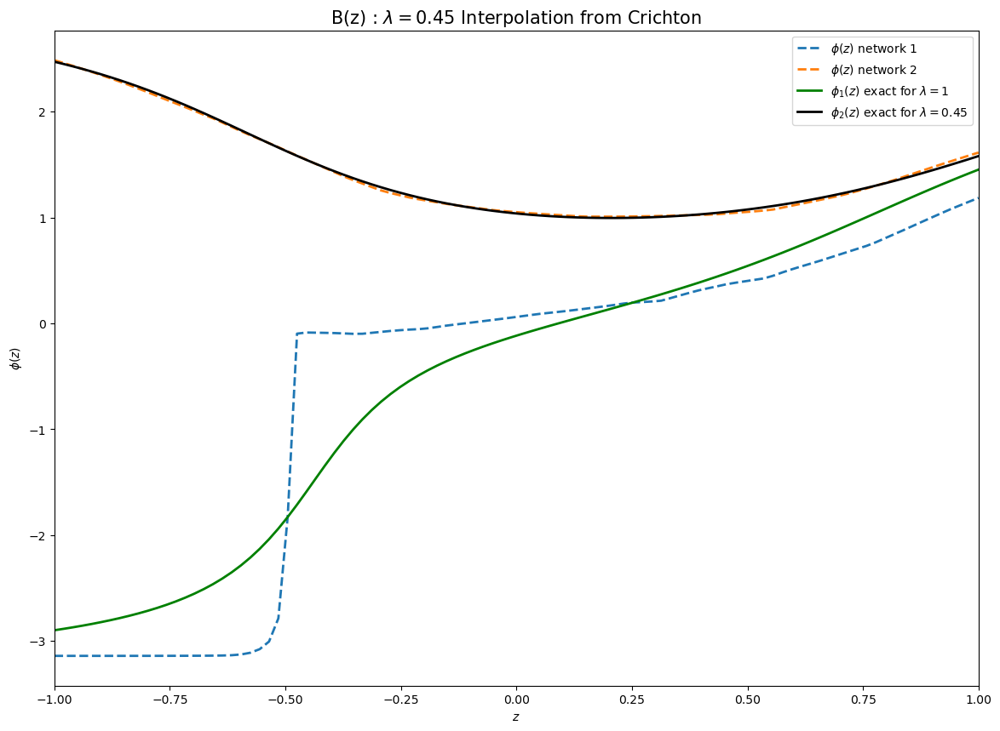

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 249 operations to synchronize with Neptune. Do not kill this process.
All 249 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1070
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1071
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.004918: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:13<00:00,  8.15epoch/s]


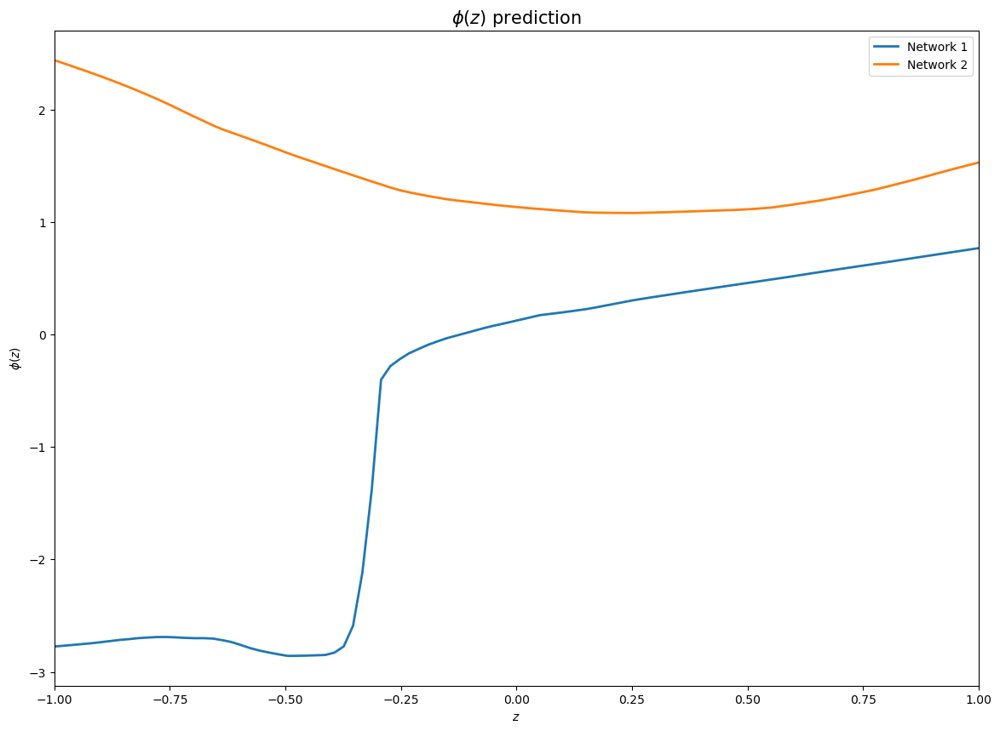

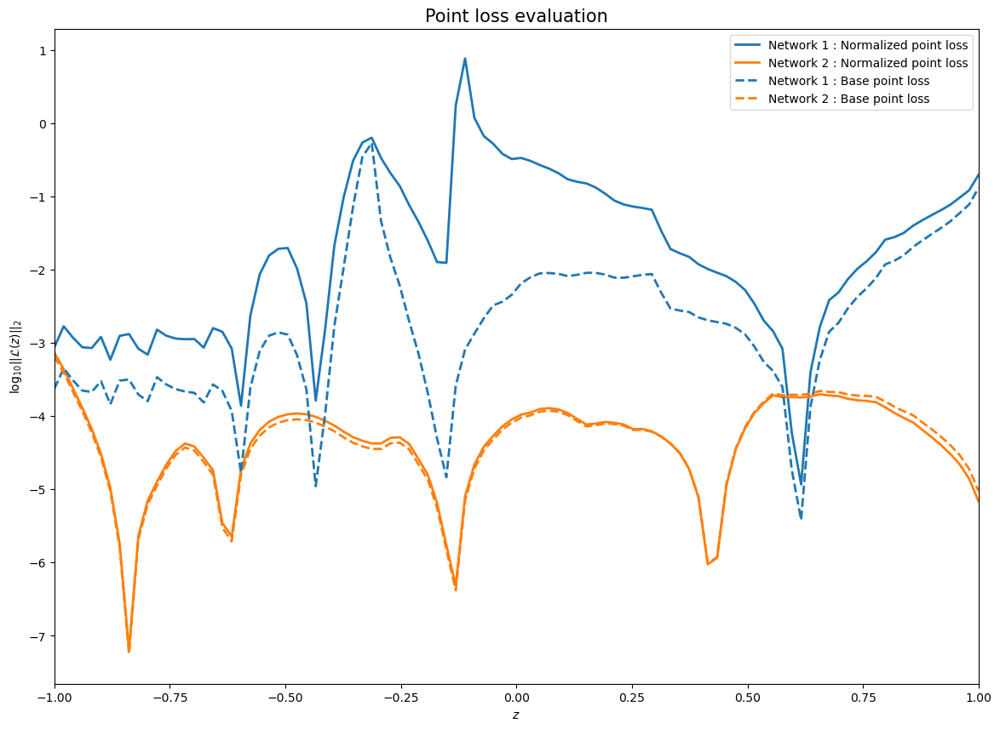

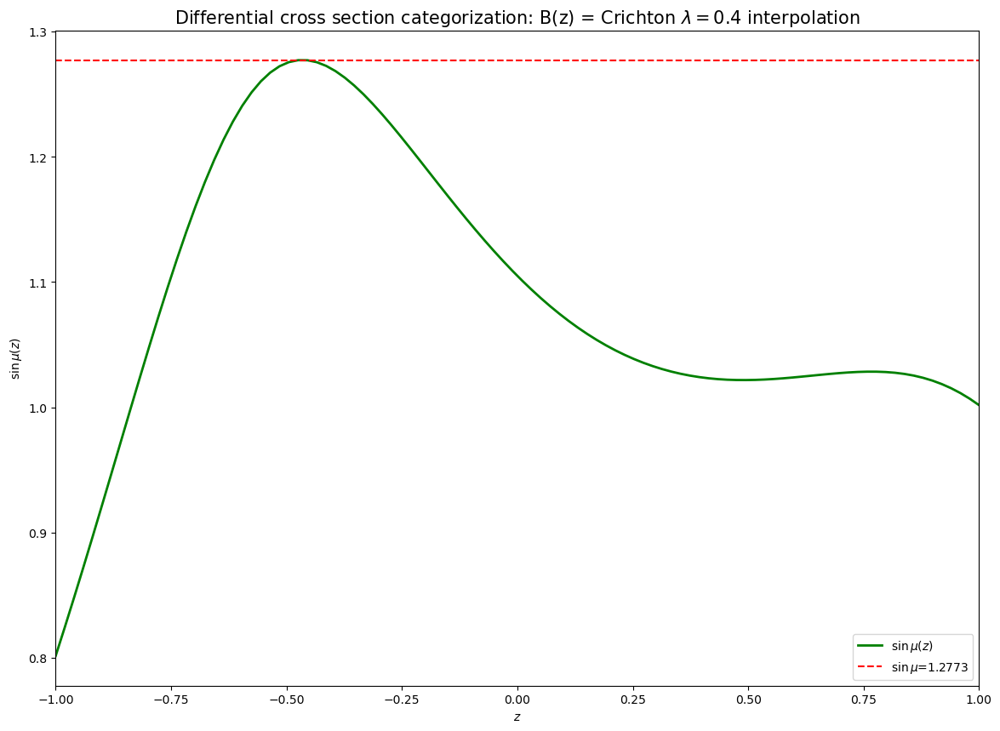

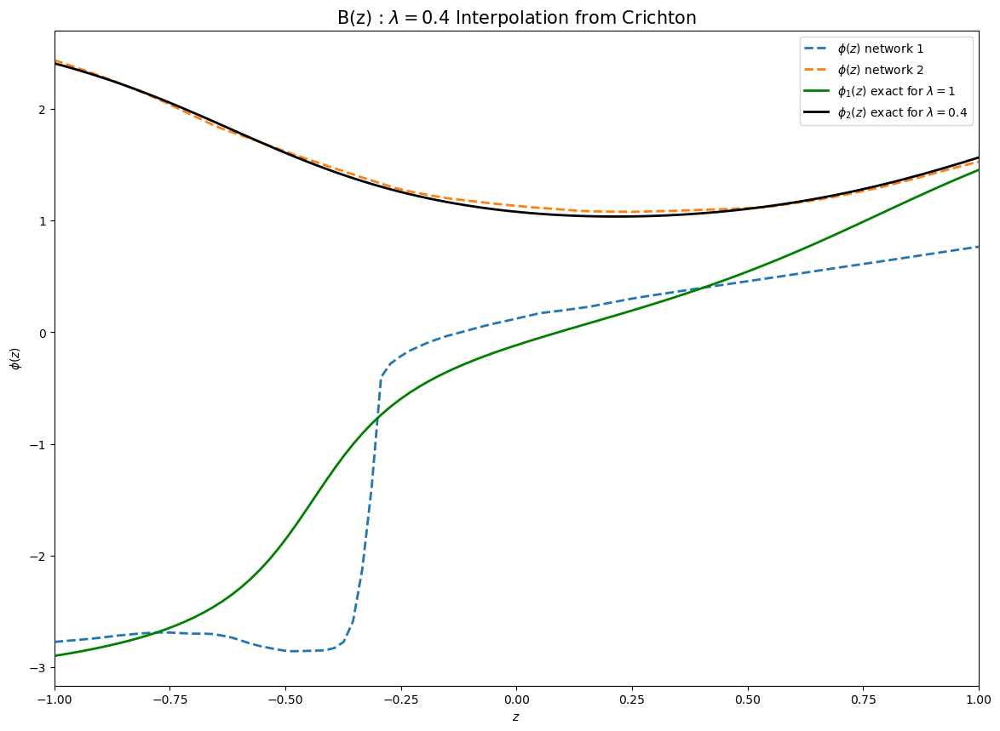

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 125 operations to synchronize with Neptune. Do not kill this process.
All 125 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1071
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1072
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.002280: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:16<00:00,  8.11epoch/s]


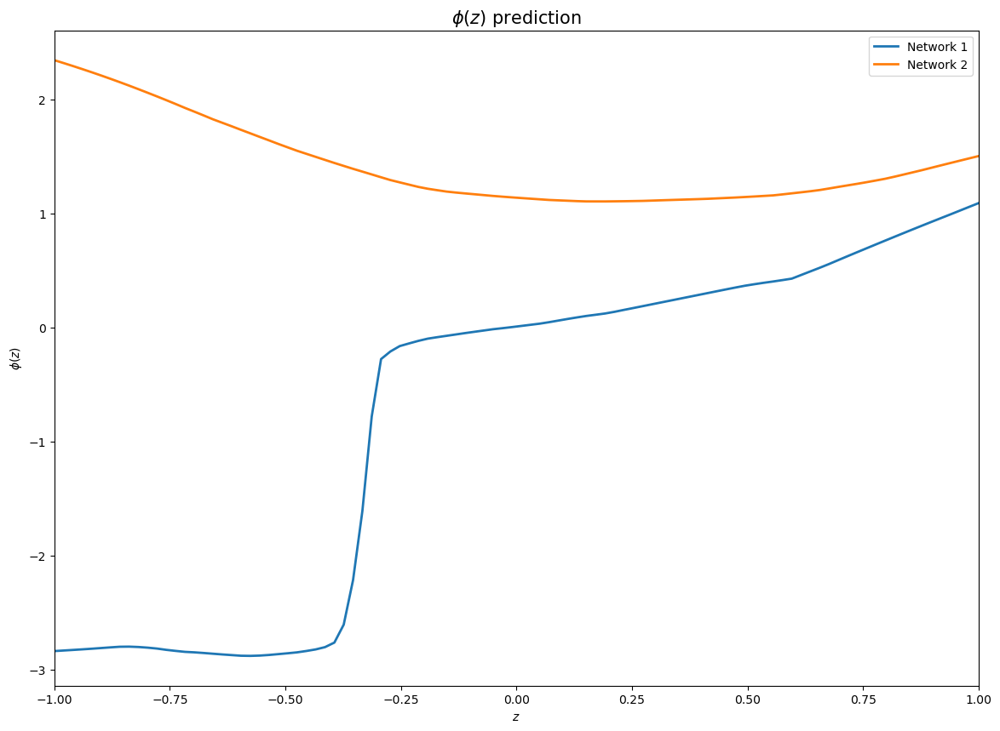

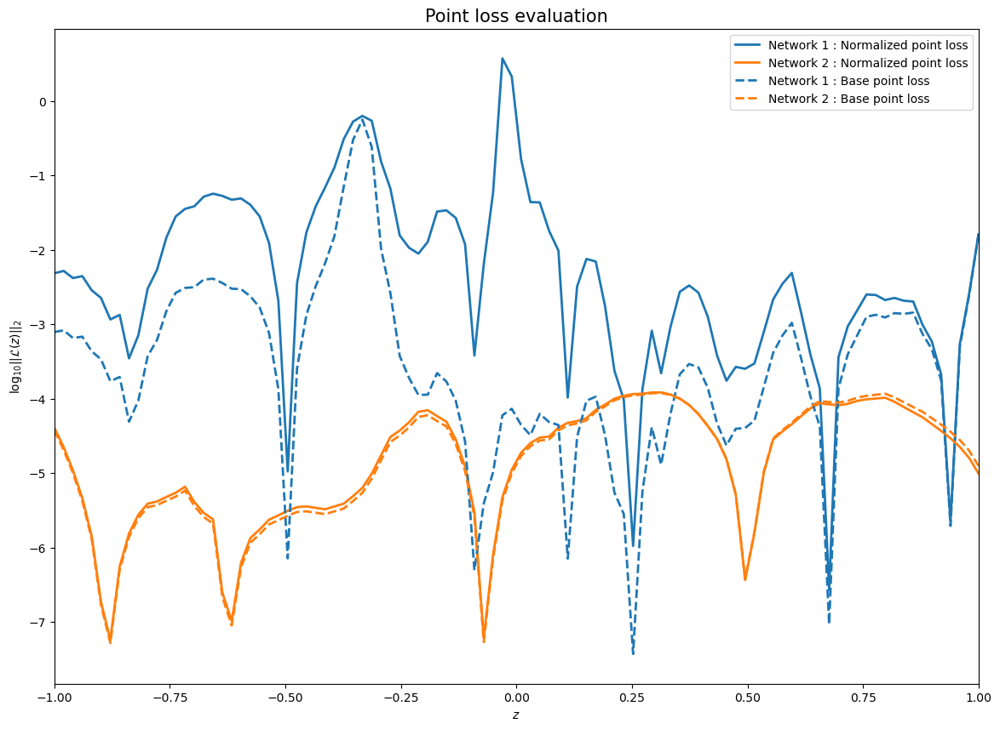

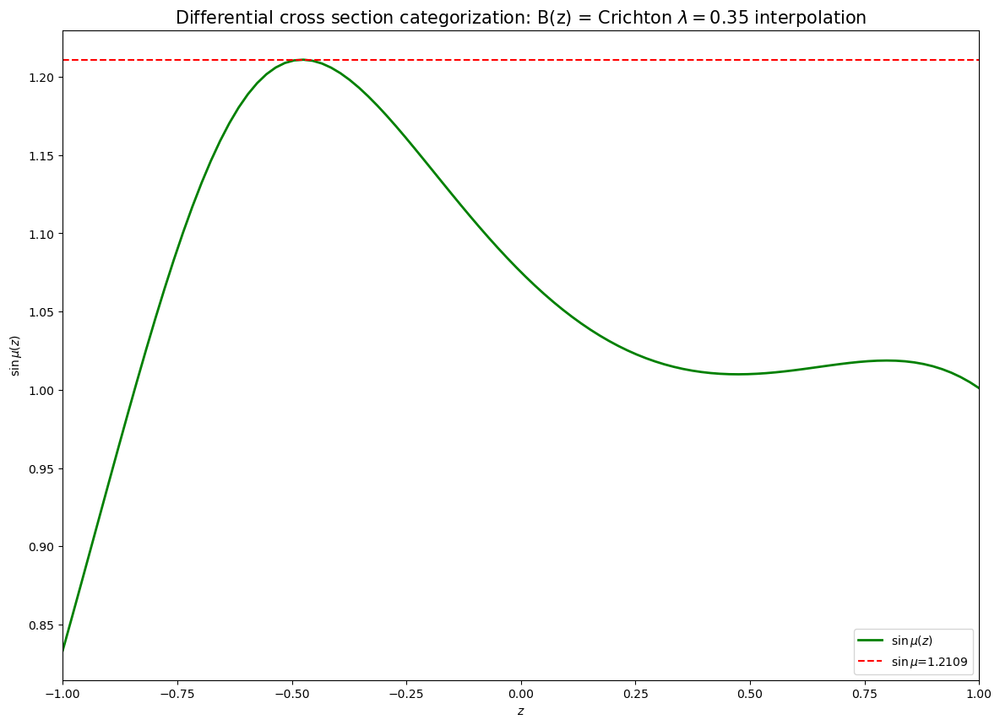

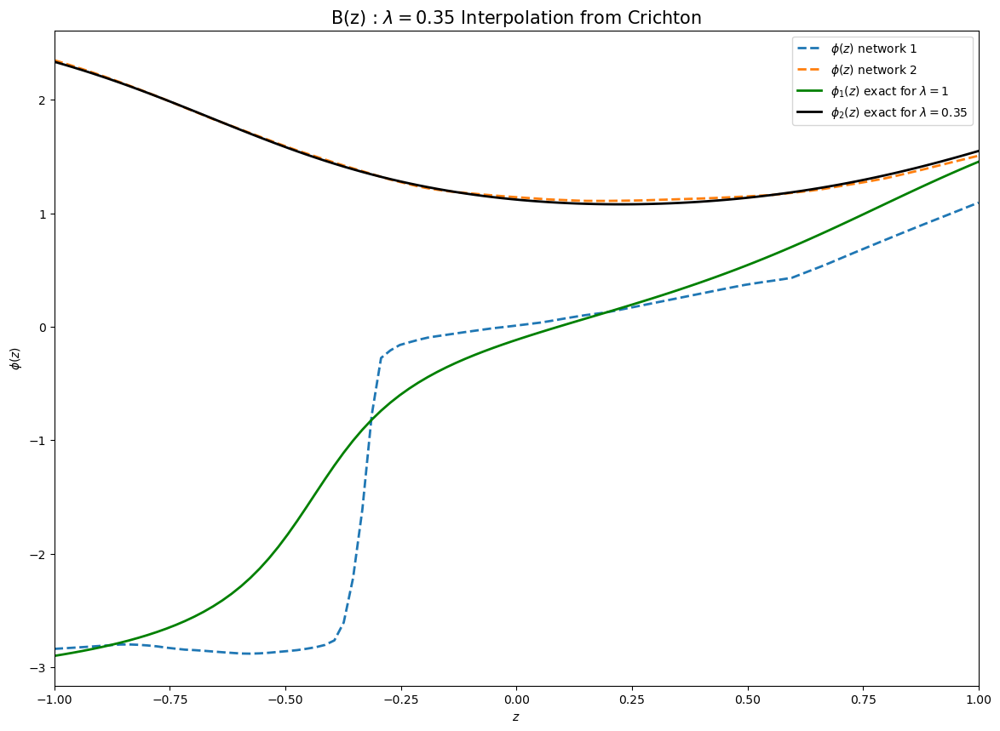

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 52 operations to synchronize with Neptune. Do not kill this process.
All 52 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1072
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1073
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4)

Train Epoch: 4999 ; tLoss: 0.000167: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:17<00:00,  8.09epoch/s]


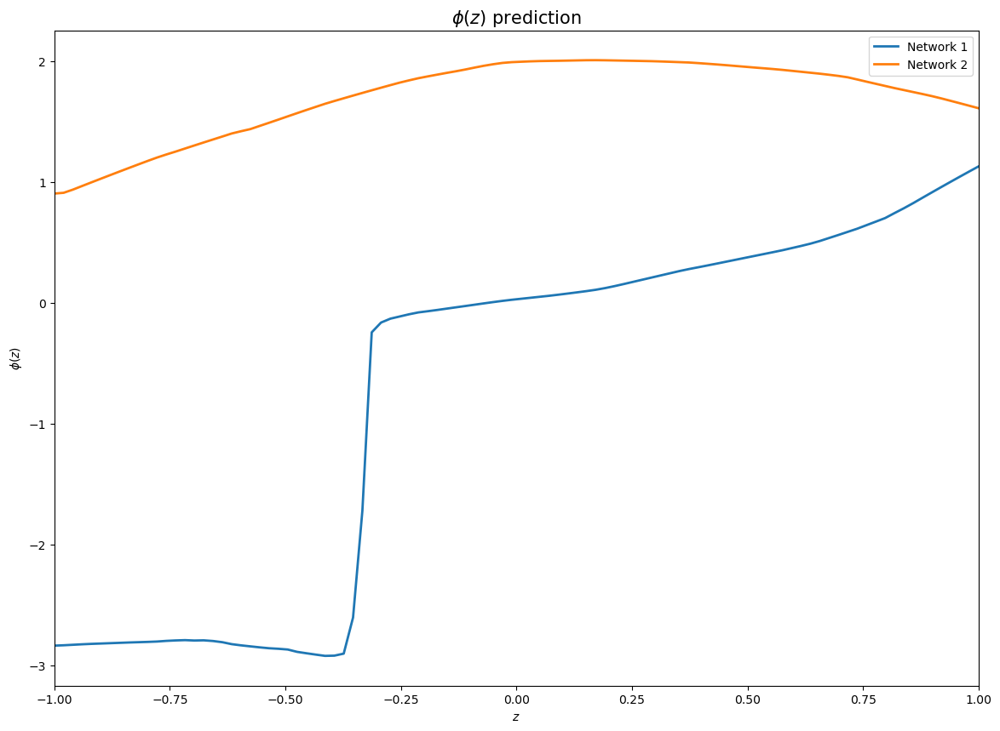

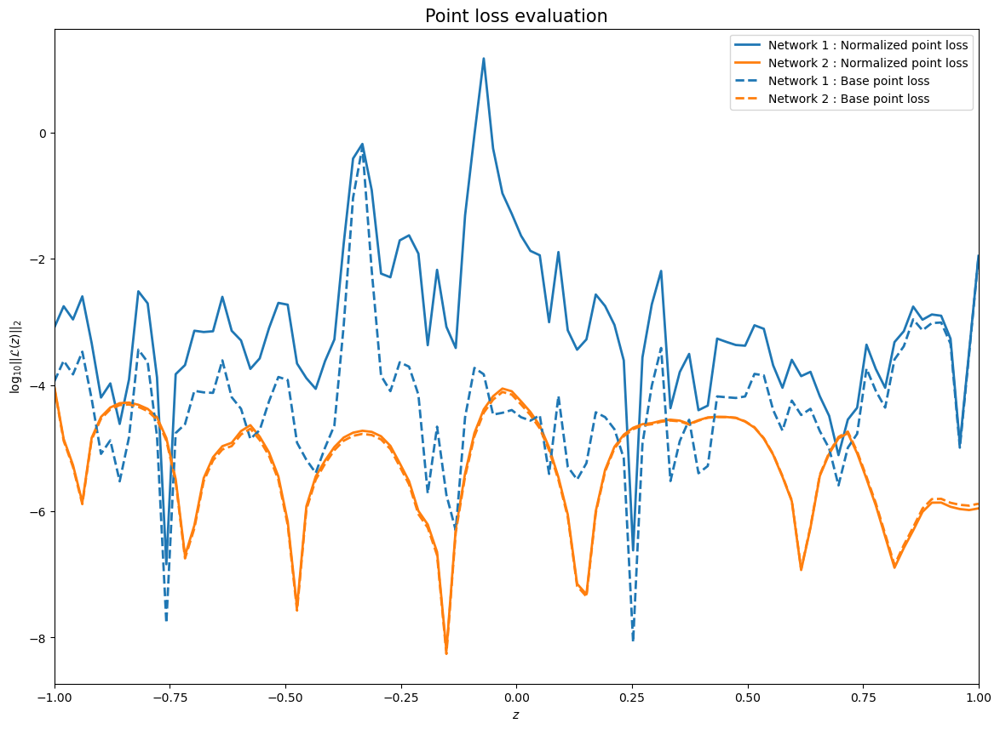

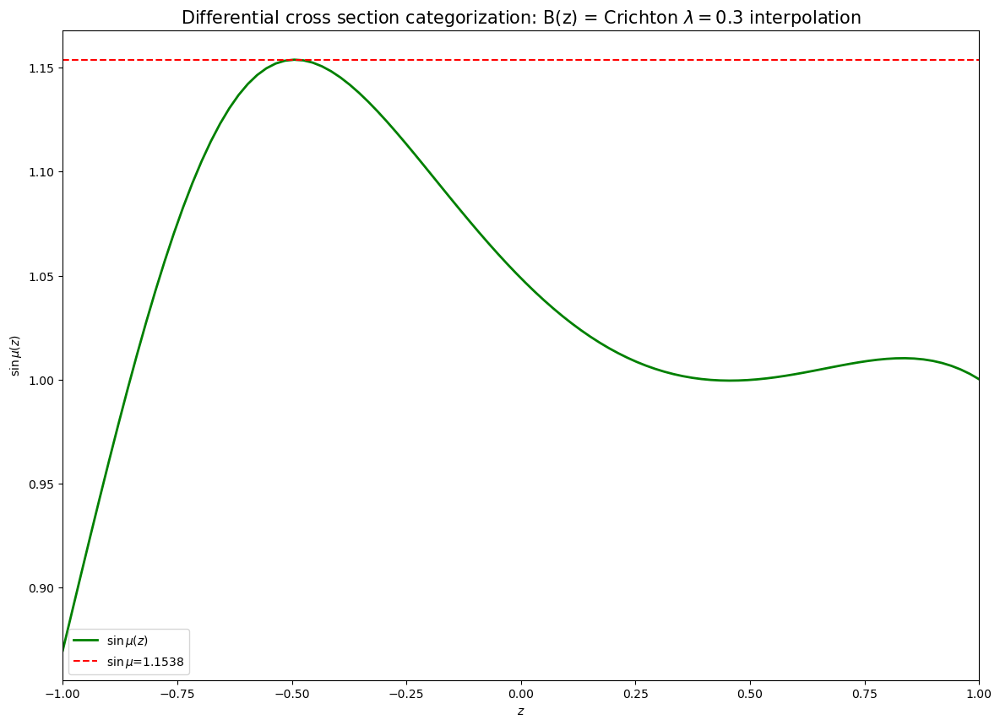

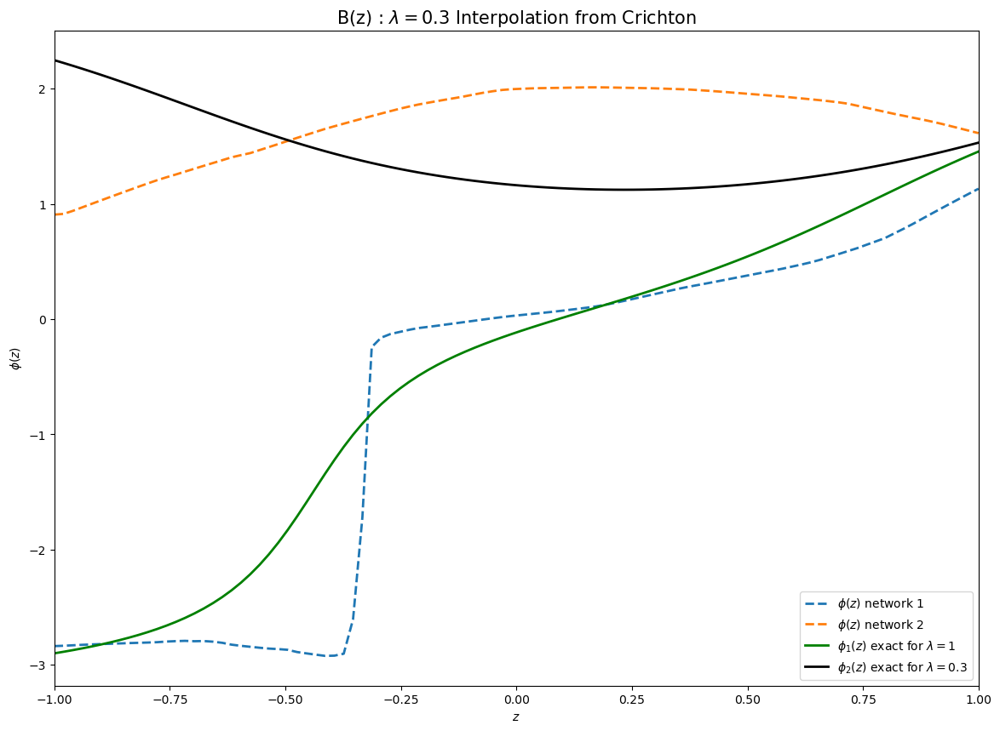

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 138 operations to synchronize with Neptune. Do not kill this process.
All 138 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1073
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1074
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.009505: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:17<00:00,  8.09epoch/s]


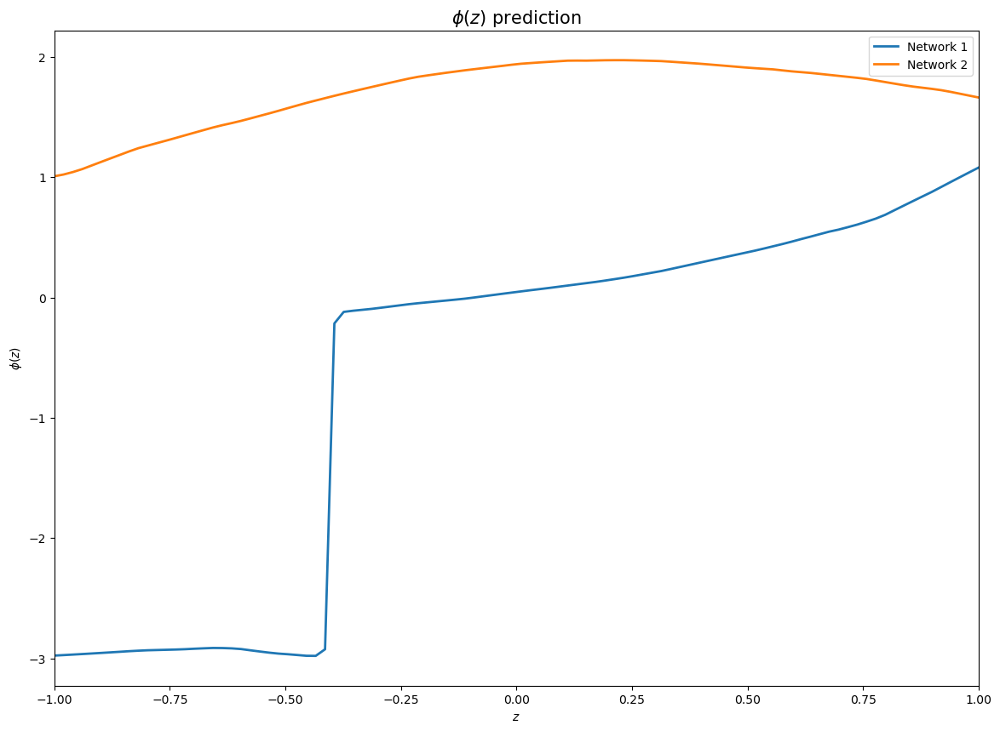

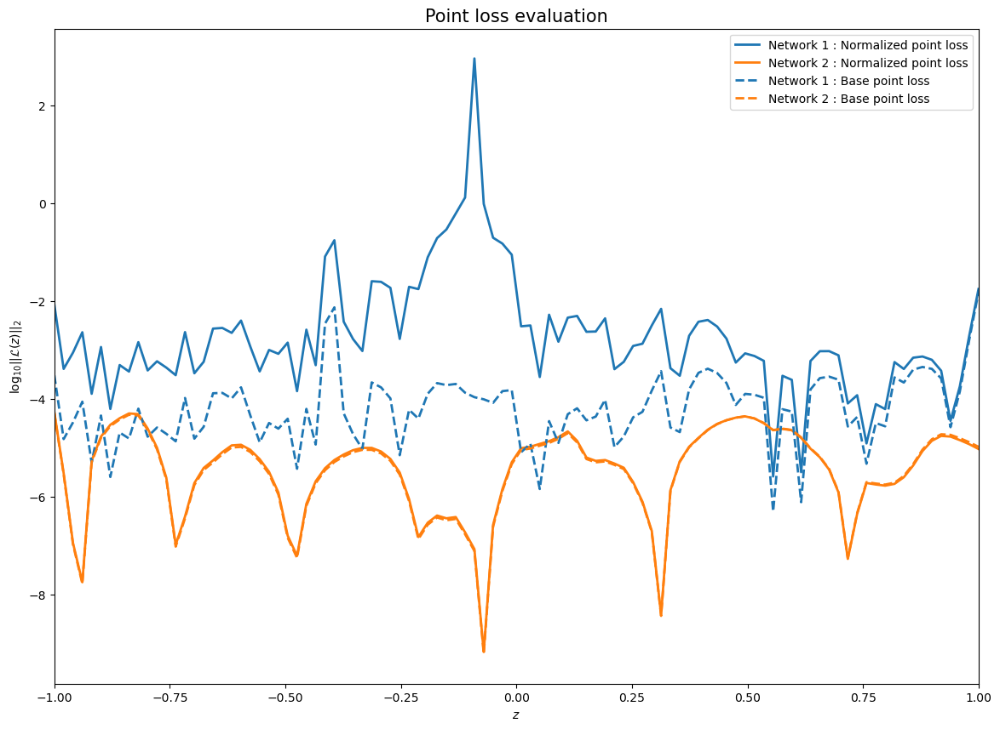

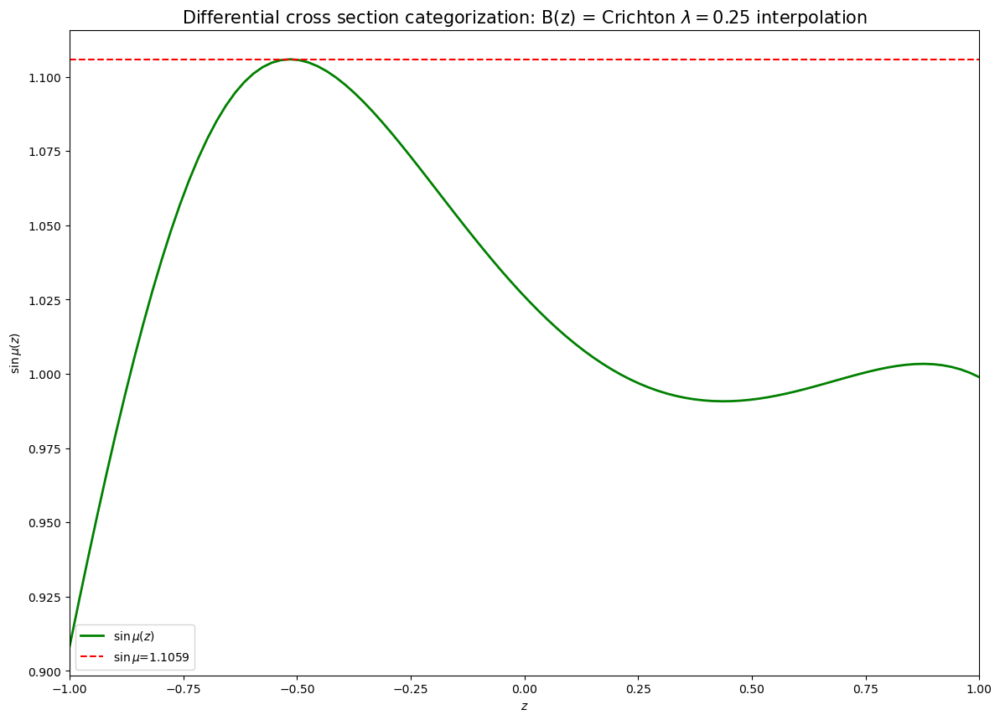

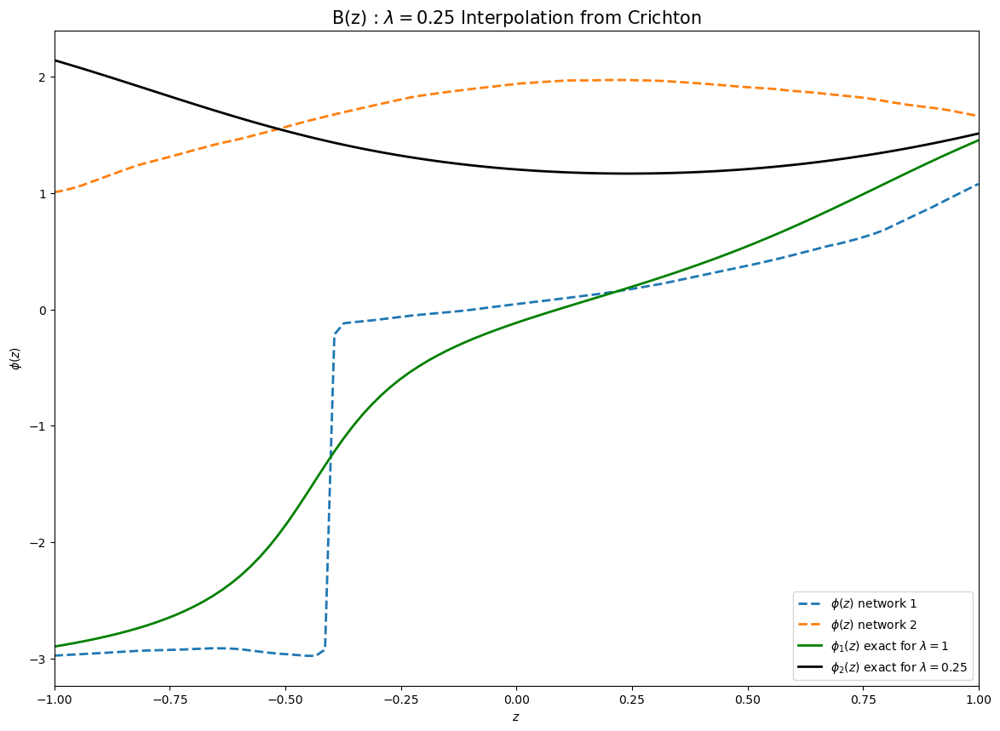

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 113 operations to synchronize with Neptune. Do not kill this process.
All 113 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1074
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1075
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.006807: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:19<00:00,  8.07epoch/s]


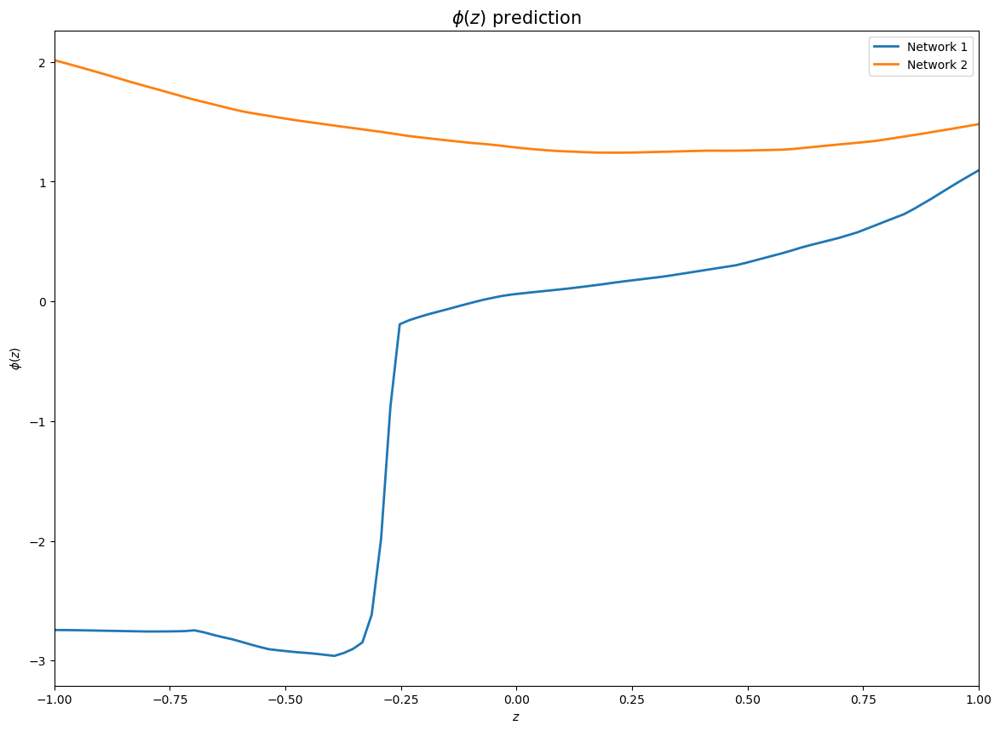

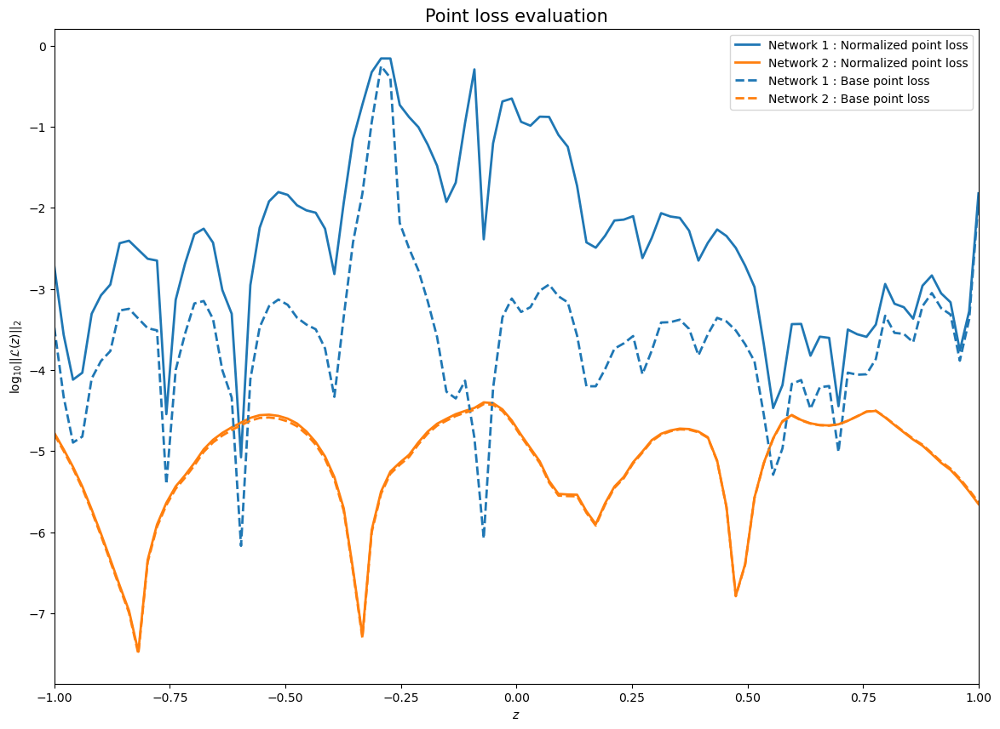

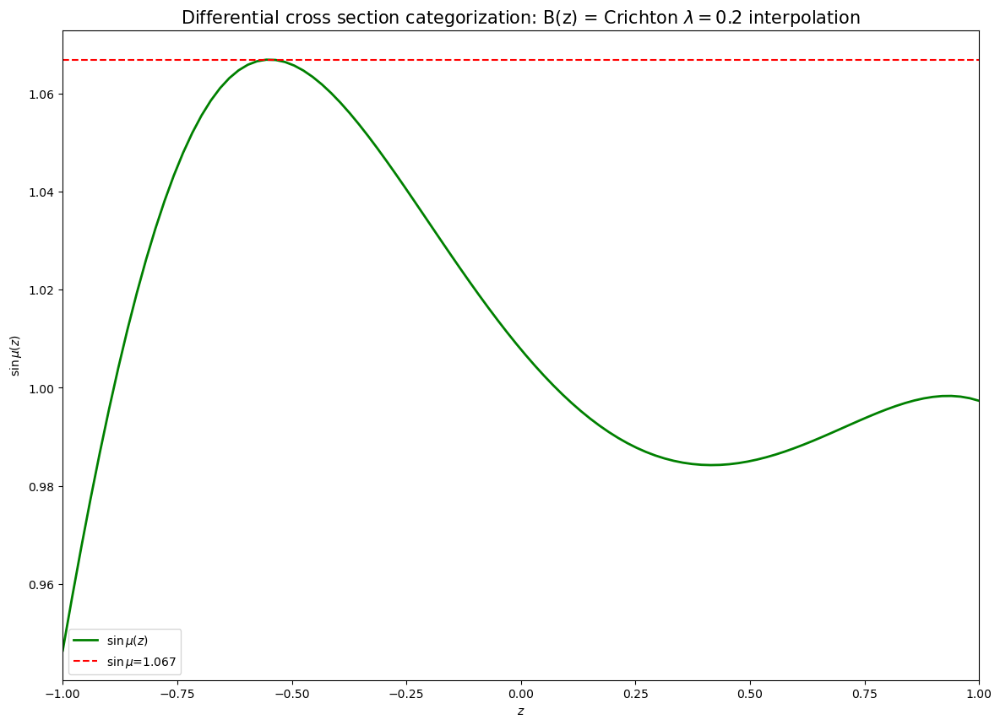

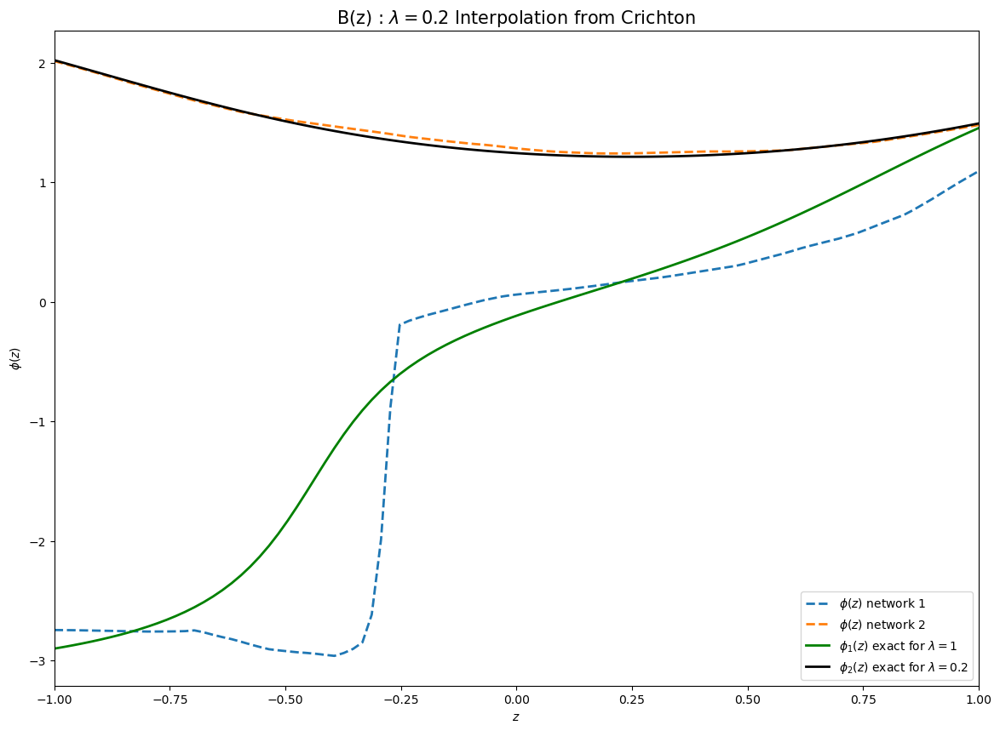

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 128 operations to synchronize with Neptune. Do not kill this process.
All 128 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1075
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1076
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.000015: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:23<00:00,  8.02epoch/s]


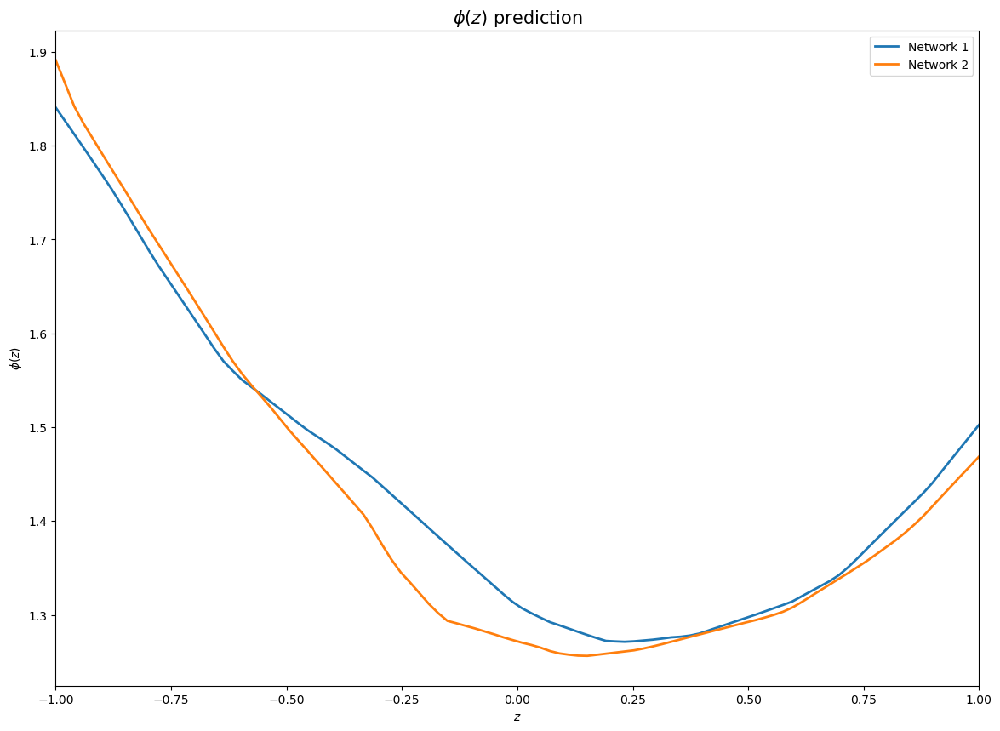

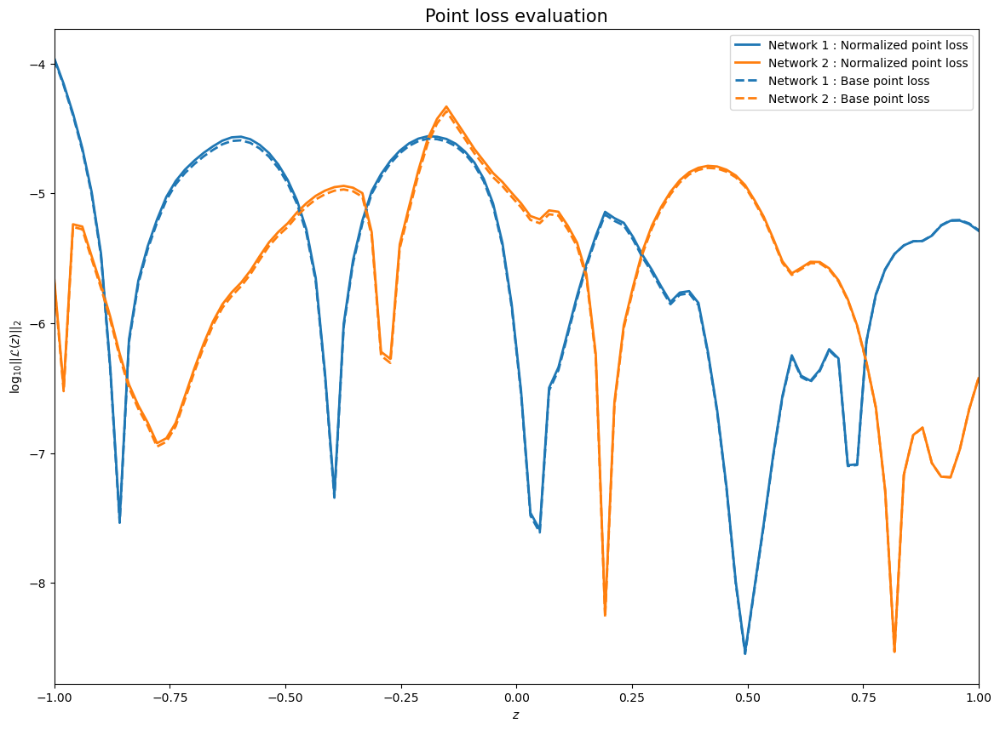

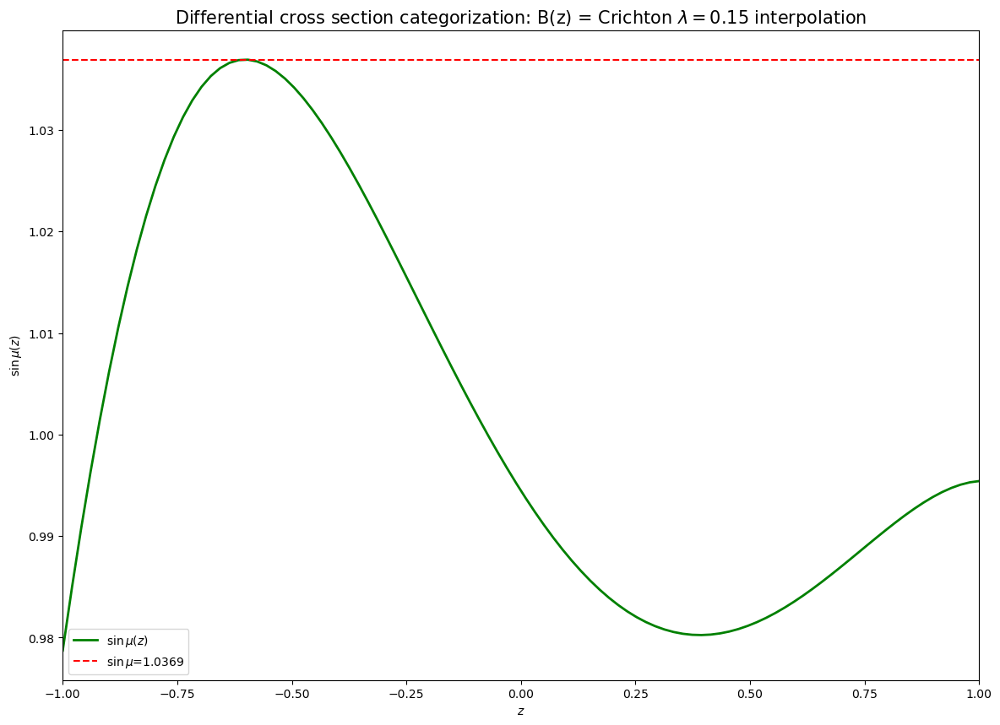

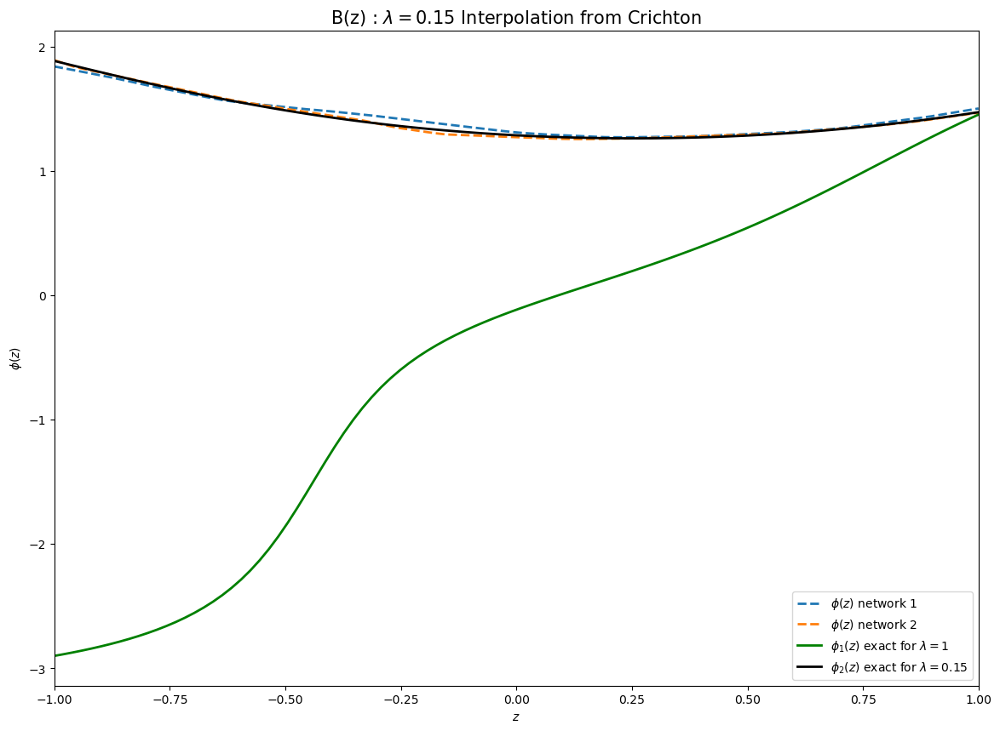

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 129 operations to synchronize with Neptune. Do not kill this process.
All 129 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1076
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1077
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_

Train Epoch: 4999 ; tLoss: 0.011588: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:22<00:00,  8.03epoch/s]


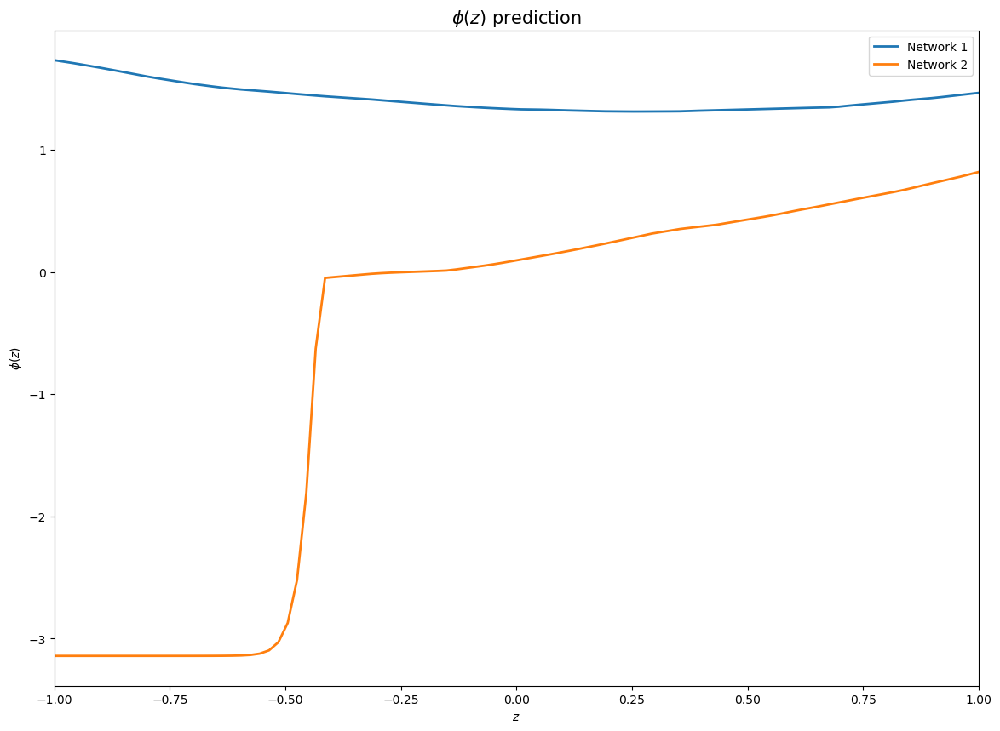

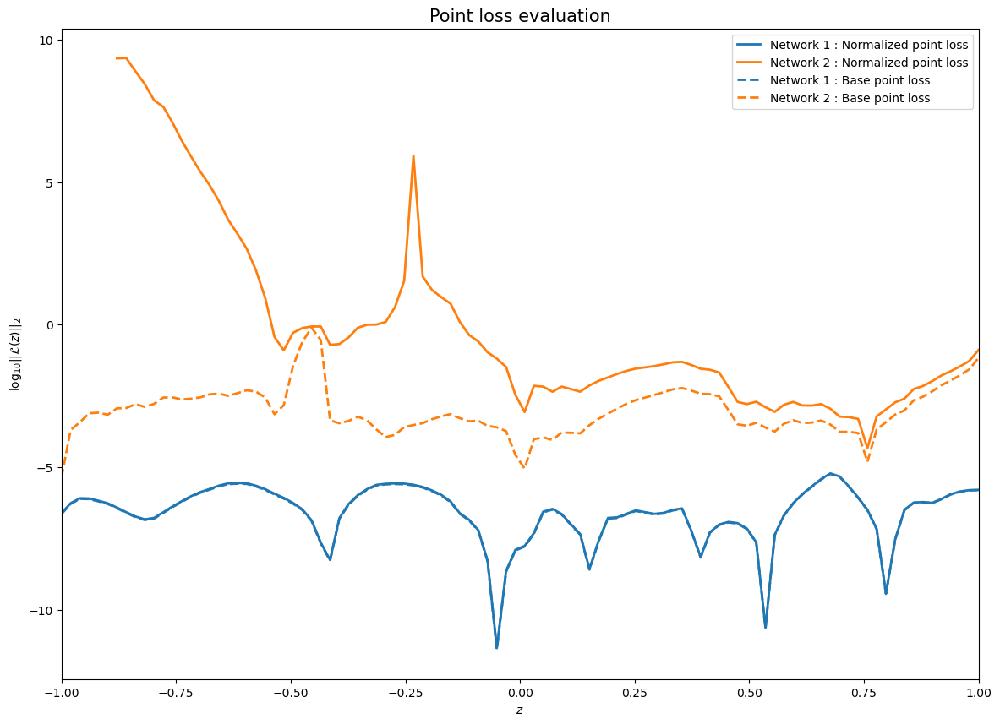

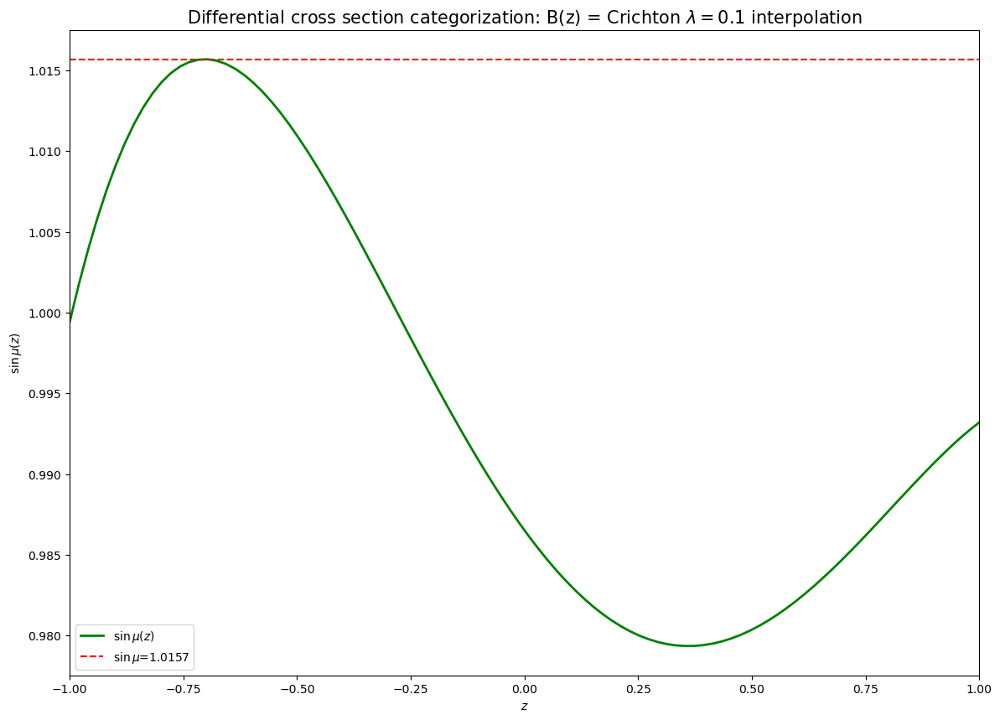

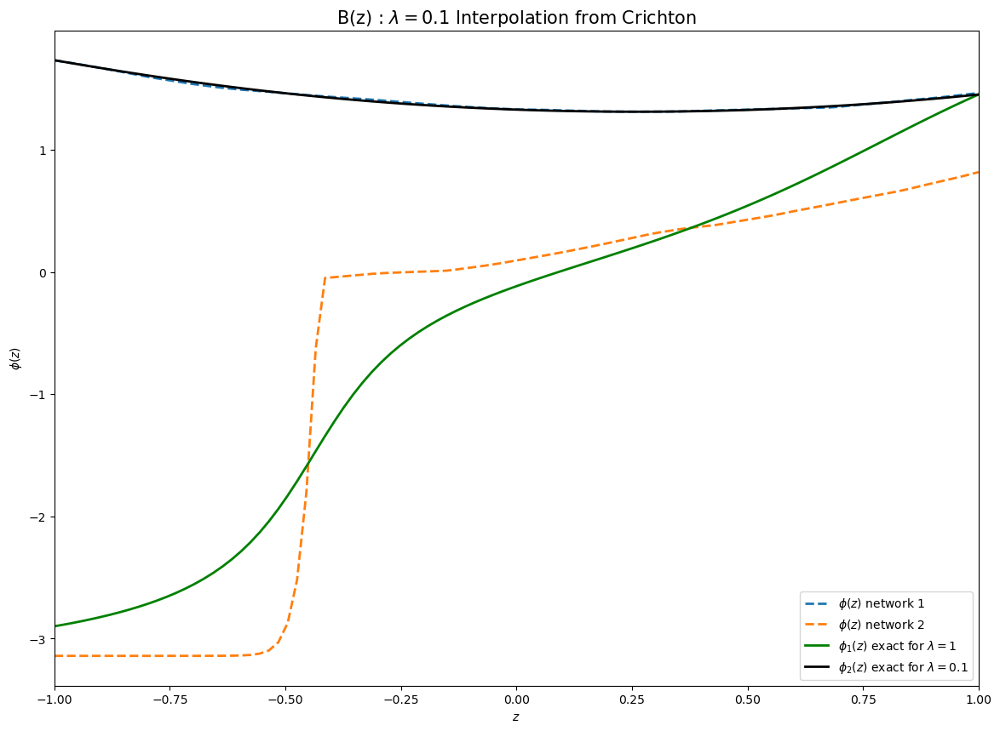

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 232 operations to synchronize with Neptune. Do not kill this process.


Error occurred during asynchronous operation processing: Cannot log infinite or NaN value to attribute metrics/eval_loss_scaled


All 232 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1077
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1078
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): ReLU()
    (layer_5): Linear(in_features=64, out_features=1, bias=True)
    (final_layer): Tanh()
  )
)
Begin Memory: 0
1 - After model to device 0


Train Epoch: 4999 ; tLoss: 0.014187: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:22<00:00,  8.03epoch/s]


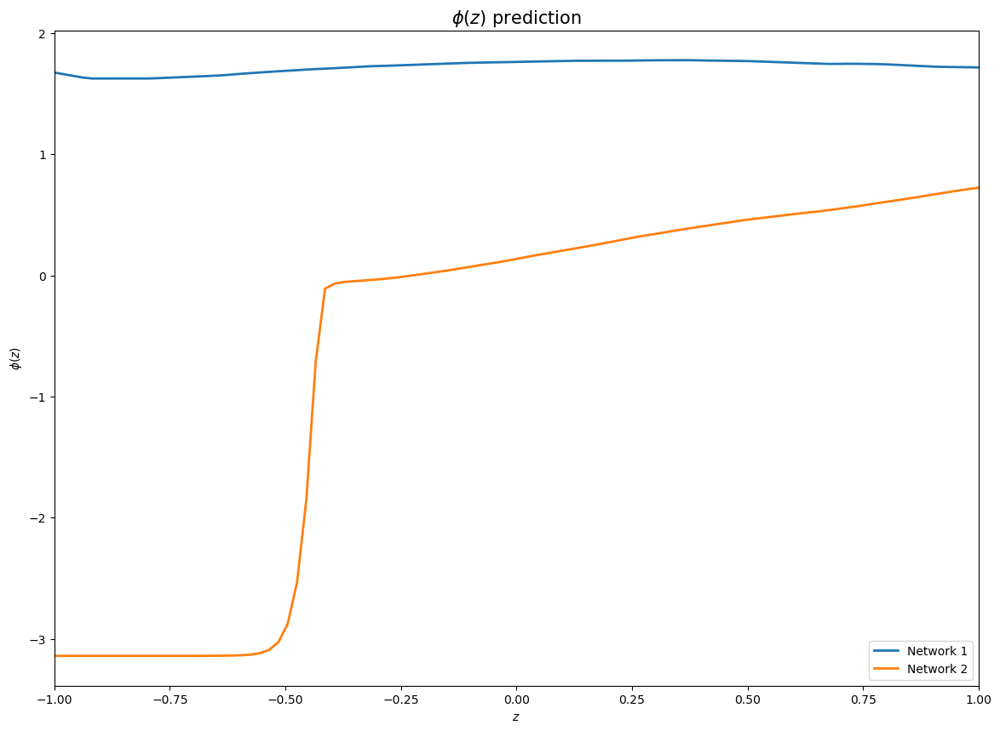

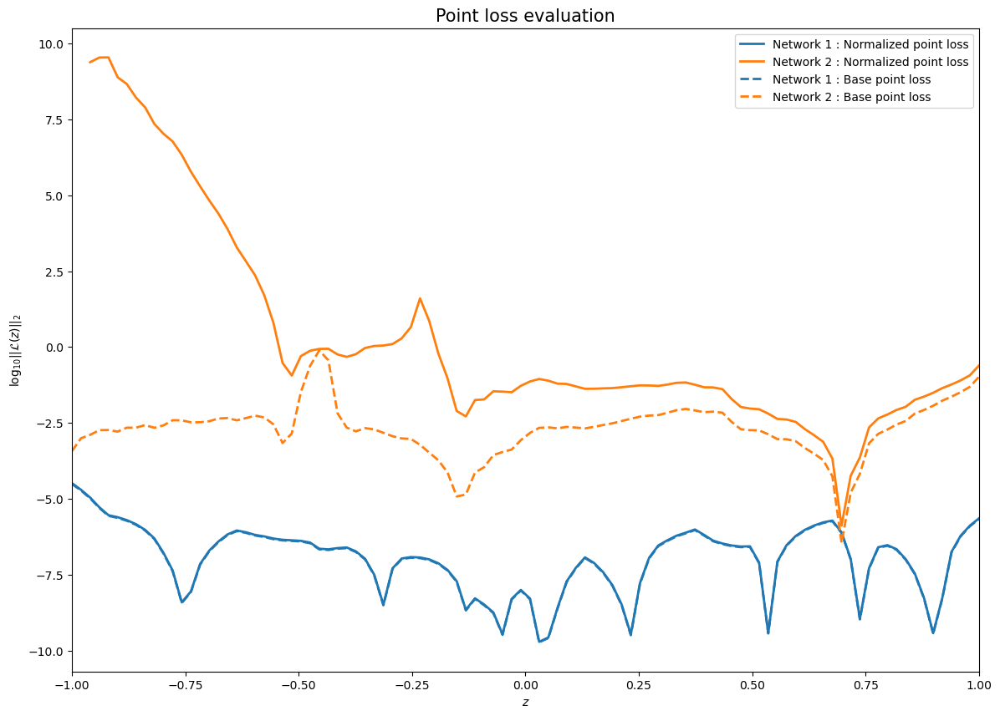

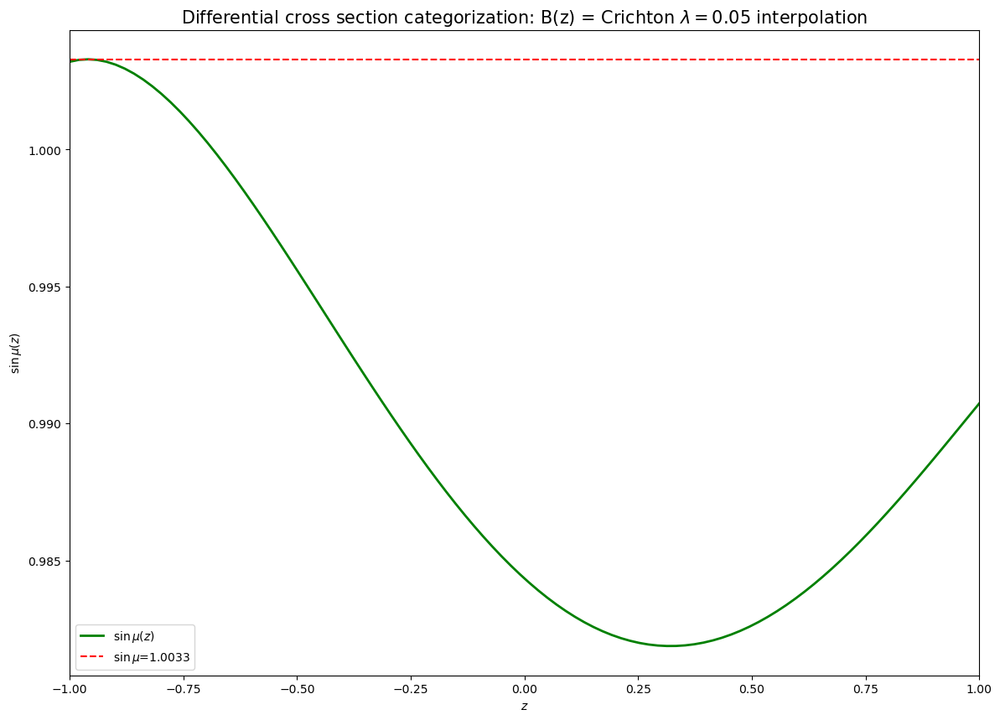

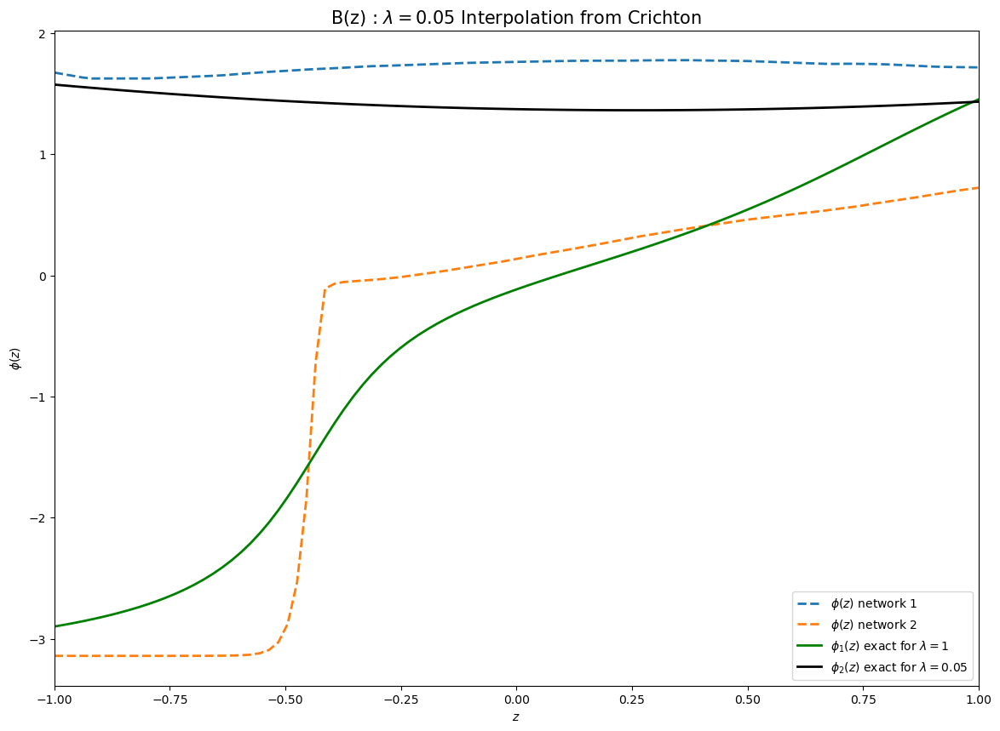

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 273 operations to synchronize with Neptune. Do not kill this process.


Error occurred during asynchronous operation processing: Cannot log infinite or NaN value to attribute metrics/eval_loss_scaled


All 273 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1078
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1079
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): ReLU()
    (layer_5): Linear(in_features=64, out_features=1, bias=True)
    (final_layer): Tanh()
  )
)
Begin Memory: 0
1 - After model to device 0


Train Epoch: 4999 ; tLoss: 0.914183: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [10:23<00:00,  8.02epoch/s]


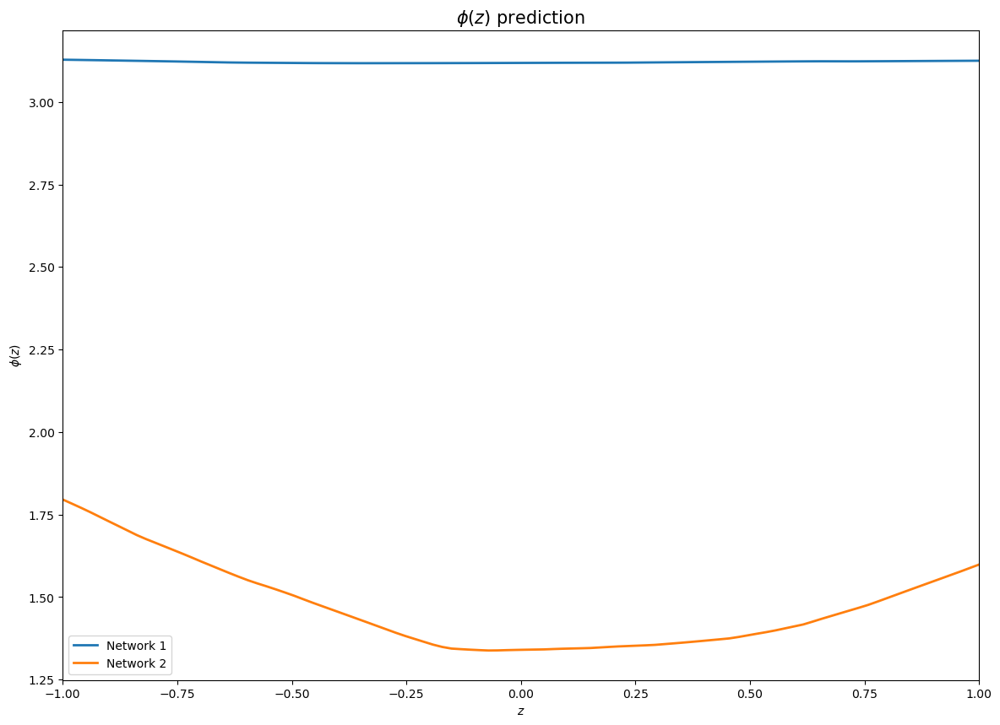

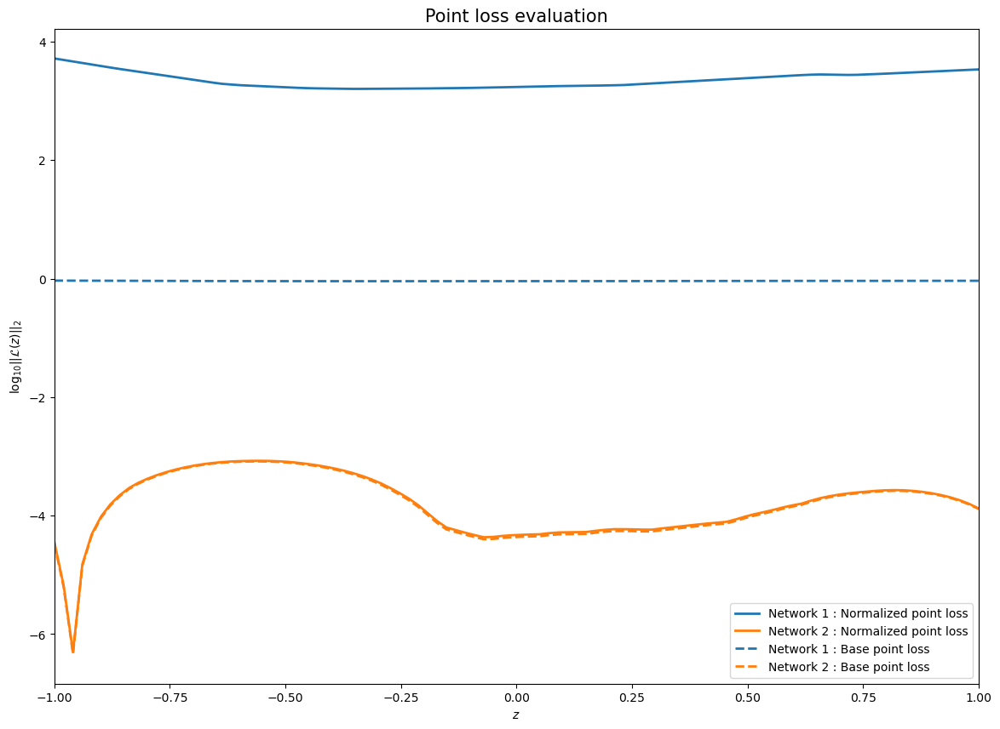

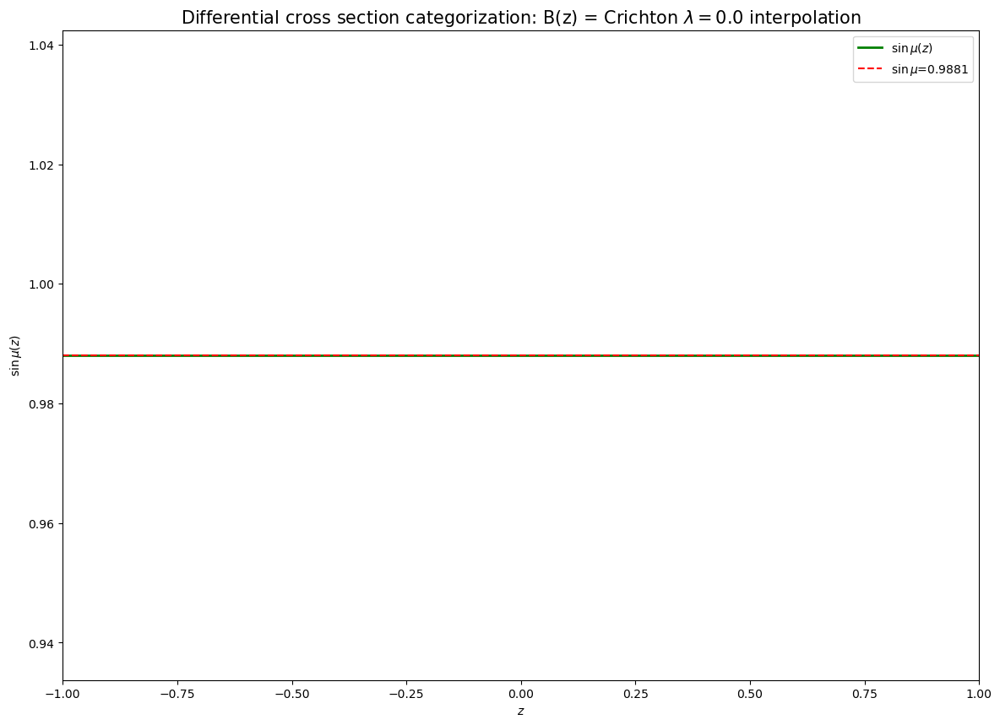

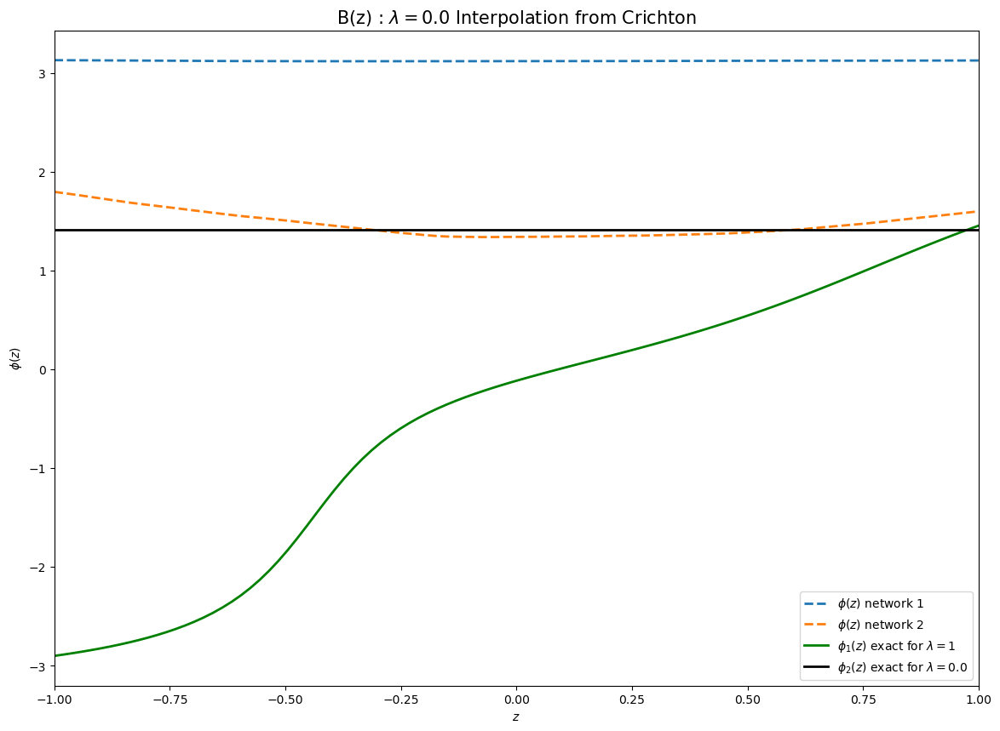

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 15 operations to synchronize with Neptune. Do not kill this process.
All 15 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1079


In [121]:
# Start the Neptune logger run


non_scaled_losses = []
scaled_losses = []
sinmuvalues = []
solved_phases = []

lambda_list = np.linspace(1,0,num=21)


for lambda_p in lambda_list:
    
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test_scan")
    
    params = {'batch_size': 64,
             'epochs_num': 5000,
             'learning_rate': 0.001,
             'lr_scheduler': True, 
             'beta1' : 0.85,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'activation': 'ReLU',
             'fund_dom': False,
             'layer_list' : [64,64, 64, 64],
             'final_layer': 'Tanh',
             'loss': 'MSE',
             'scaled_loss': False,
             'scan_param': lambda_p,
             'bound_phi': math.pi,
             'num_nets': 2,
             'p_value': 2,
             'lambda_repulsive': 1.0}

    tags = {'constant function': 'Crichton $\lambda={}$ interpolation'.format(round(lambda_p,2)), 'optimizer': 'Adam', 'Mode': 'Scan param', 'Huber': '0.1'}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params
    
    crichtonnet = ModuleInterpCrichton(lambda_param=params['scan_param'])
    netsolver = train_run(params, device, run, module_net=crichtonnet, seed_num=42, optim_name='Adam')

    phievals = []
    eval_pt_loss_ses = []
    eval_pt_loss_noses = []
    non_scaled_loss = []
    scaled_loss = []
    for i in range(params['num_nets']):
    
        if params['num_nets'] > 1: 
            netsolver.phi_net = netsolver.multi_nets[i]
        zpointseval, phieval, _, eval_pt_loss_s, eval_pt_loss_nos = eval_run(netsolver, params, device, run)
        phievals.append(phieval)
        eval_pt_loss_ses.append(eval_pt_loss_s)
        eval_pt_loss_noses.append(eval_pt_loss_nos)
        scaled_loss.append(torch.mean(eval_pt_loss_s))
        non_scaled_loss.append(torch.mean(eval_pt_loss_nos))
        
    
    plot_phases(zpointseval, phievals, run)
    solved_phases.append(phievals)
    
    plot_point_loss_crichton(zpointseval, eval_pt_loss_ses, eval_pt_loss_noses, run)
    non_scaled_losses.append(non_scaled_loss)
    scaled_losses.append(scaled_loss)
    
    integralz = sin_mu_integral(params, device, netsolver, zpointseval)
    plot_sin_mu(zpointseval, integralz, tags)
    sinmuvalues.append(max(integralz.cpu()))
    
    plot_summary_crichton_lambda(zpointseval, phievals, lambda_p, run)
    
    # Make sure to kill the Neptune logger run
    run.stop()

In [122]:
run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_recap2")

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1080
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


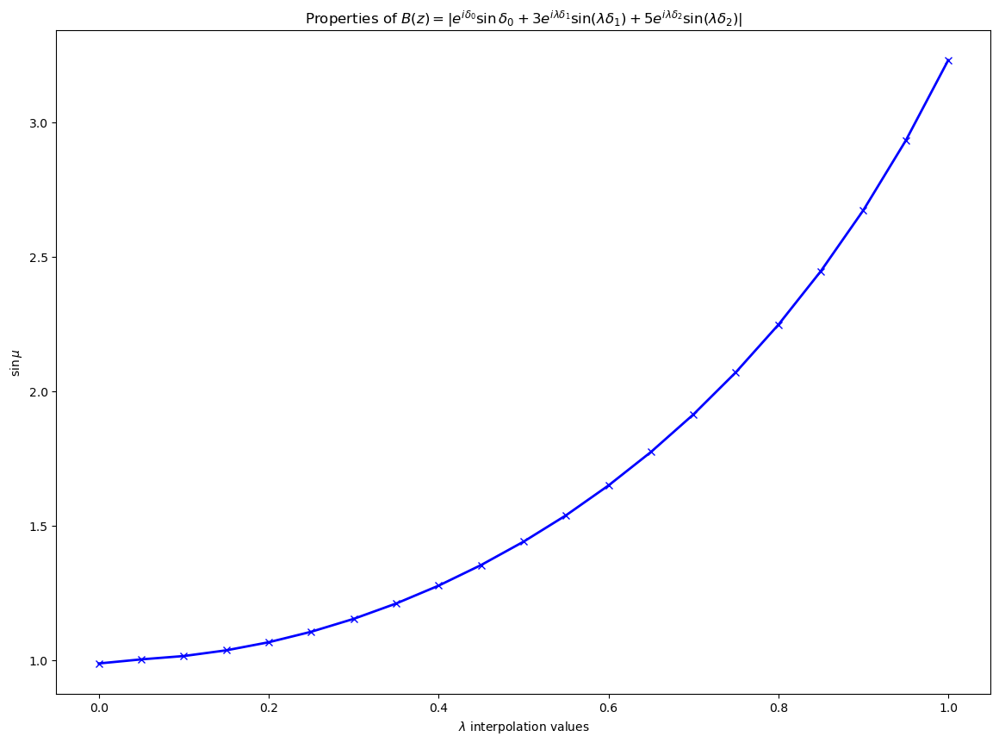

In [123]:
plot_lambda_sinmu(lambda_list, sinmuvalues, neptune_run=run)

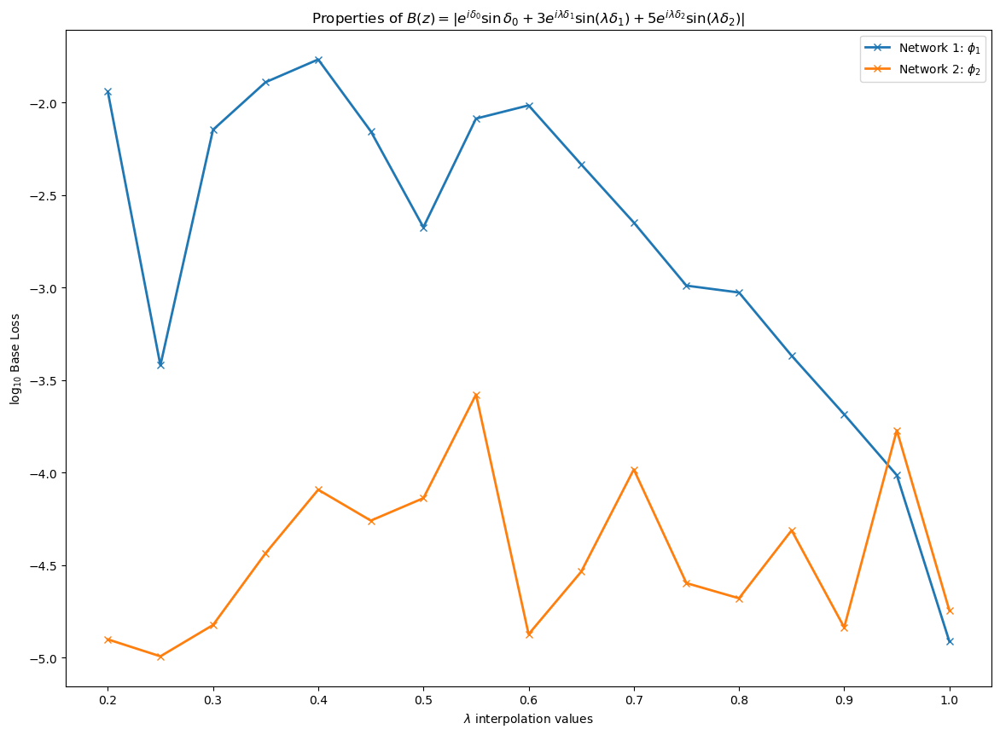

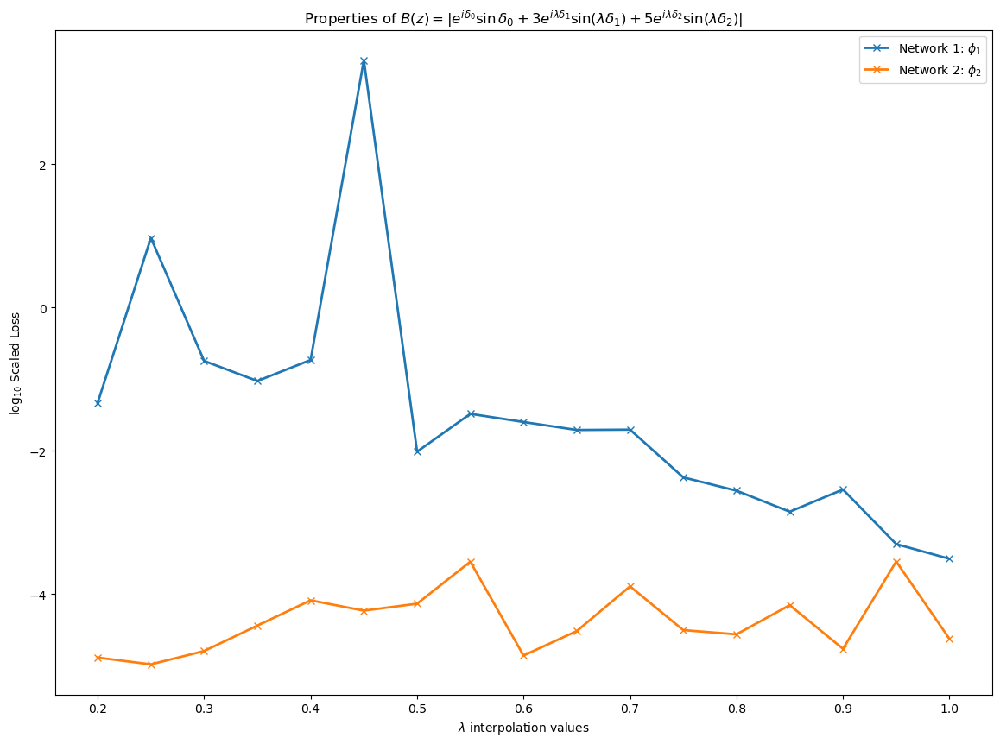

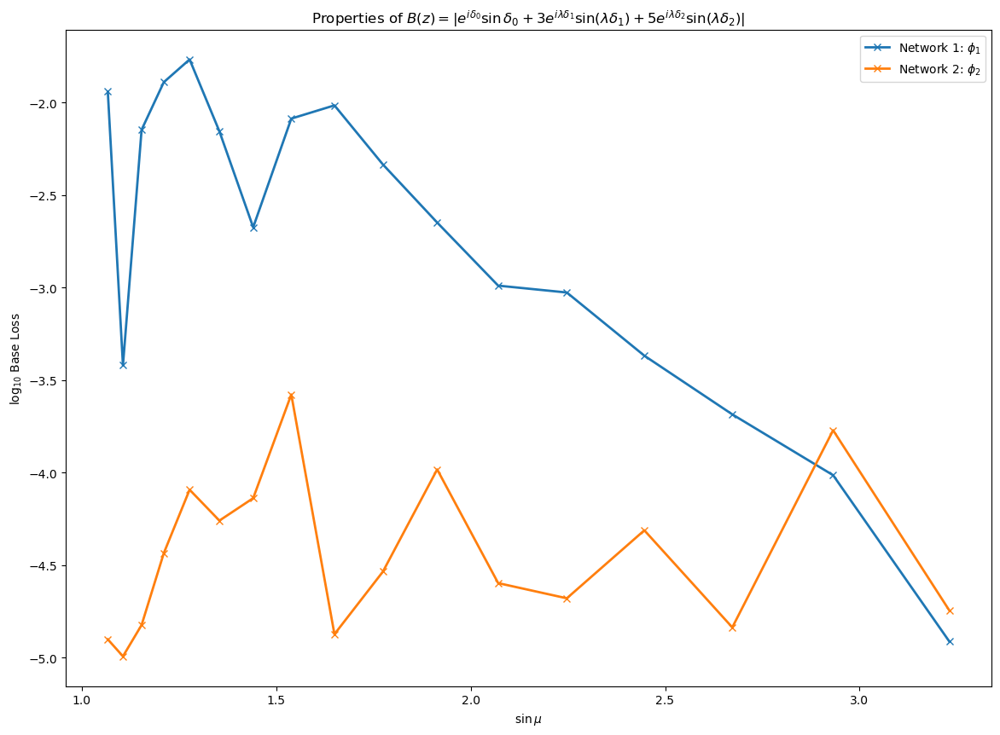

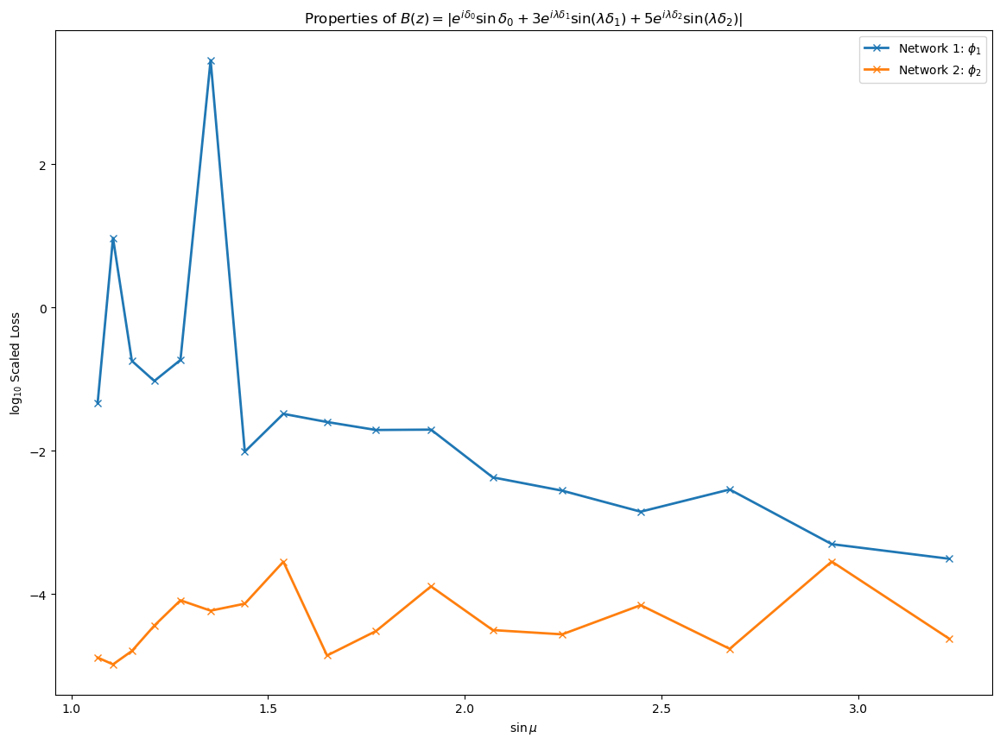

In [124]:
plot_losses(lambda_list[:-4], sinmuvalues[:-4], non_scaled_losses[:-4], scaled_losses[:-4], neptune_run=run)

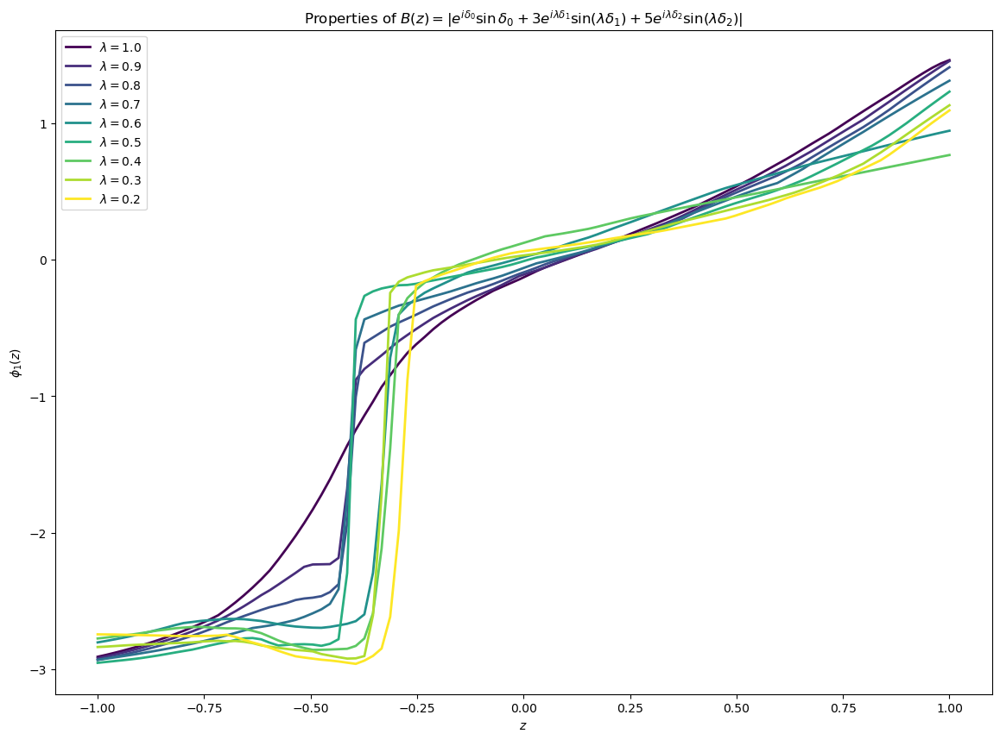

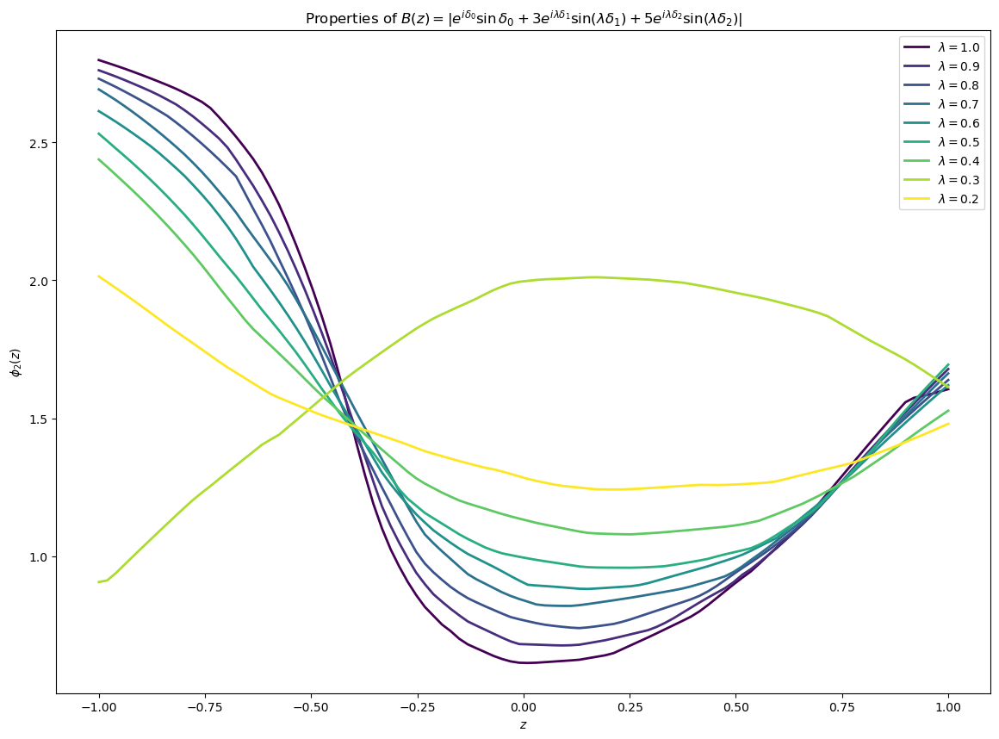

In [125]:
phase_plots(lambda_list[:-4:2], solved_phases[:-4:2],neptune_run=run)

In [126]:
run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 15 operations to synchronize with Neptune. Do not kill this process.
All 15 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1080


In [72]:
# Start the Neptune logger run


lambda_list = [1]


for lambda_p in lambda_list:
    
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test_scan")
    
    params = {'batch_size': 64,
             'epochs_num': 1,
             'learning_rate': 0.001,
             'lr_scheduler': False, 
             'beta1' : 0.85,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'activation': 'ReLU',
             'fund_dom': False,
             'layer_list' : [64,64, 64, 64],
             'final_layer': 'Tanh',
             'loss': 'MSE',
             'scaled_loss': False,
             'scan_param': lambda_p,
             'bound_phi': math.pi,
             'num_nets': 1,
             'p_value': 2,
             'lambda_repulsive': 0.0}

    tags = {'constant function': 'Crichton', 'optimizer': 'Adam', 'Mode': 'Constant param', 'Huber': '0.1'}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params
    crichtonnet = ModuleNetCrichton()
    #crichtonnet = ModuleInterpCrichton(lambda_param=params['scan_param'])
    netsolver = train_run(params, torch.device('cpu'), run, module_net=crichtonnet, seed_num=42, optim_name='Adam')

    phievals = []
    eval_pt_loss_ses = []
    eval_pt_loss_noses = []
    for i in range(params['num_nets']):
    
        if params['num_nets'] > 1: 
            netsolver.phi_net = netsolver.multi_nets[i]
        zpointseval, phieval, _, eval_pt_loss_s, eval_pt_loss_nos = eval_run(netsolver, params, device, run)
        phievals.append(phieval)
        eval_pt_loss_ses.append(eval_pt_loss_s)
        eval_pt_loss_noses.append(eval_pt_loss_nos)

    plot_phases(zpointseval, phievals, run)
    plot_point_loss_crichton(zpointseval, eval_pt_loss_ses, eval_pt_loss_noses, run)

    integralz = sin_mu_integral(params, device, netsolver, zpointseval)
    plot_sin_mu(zpointseval, integralz, tags)

    plot_summary_crichton_lambda(zpointseval, phievals, lambda_p, run)
    
    # Make sure to kill the Neptune logger run
    run.stop()

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1052
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): ReLU()
    (layer_5): Linear(in_features=64, out_features=1, bias=True)
    (final_layer): Tanh()
  )
)
Begin Memory: 0
1 - After model to device 0


Train Epoch: 0 ; tLoss: 6.038770: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.38epoch/s]


RuntimeError: Placeholder storage has not been allocated on MPS device!

In [73]:
run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 1 operations to synchronize with Neptune. Do not kill this process.
All 1 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1052


##### Verifying that we get 0 loss for the expected solution and looking at the error scaling

In [74]:
class DummyNet(nn.Module):
    """
    Class for parametrizing the solution of the phase
    """
    def __init__(self, paramsol=0):
        self.paramsol = paramsol
        super(DummyNet, self).__init__()
        
    def forward(self, x):
        """
        Network forward pass is given by a specific function. Can iterate on the overall scale if we want to
        """
        
        if self.paramsol == 0:
            return torch.angle((5/2)*np.exp(1j*math.pi/9)*(3*torch.pow(x,2)-1)*np.sin(math.pi/9)+np.exp(659*1j*math.pi/1200)*np.cos(59*math.pi/1200)-3*np.exp(-59*1j*math.pi/400)*x*np.sin(59*math.pi/400))
        else:
            sol1 = torch.angle((5/2)*np.exp(1j*math.pi/9)*(3*torch.pow(x,2)-1)*np.sin(math.pi/9)-np.exp(-7*1j*math.pi/54)*np.sin(7*math.pi/54)-3*np.exp(-869*1j*math.pi/3600)*x*np.sin(869*math.pi/3600))
#            return math.pi - sol1 - torch.div(math.pi - sol1, math.pi, rounding_mode = "floor")*2*math.pi
            return sol1
            #return math.pi - sol1 - 2*math.pi*torch.heaviside(-sol1, torch.tensor(0.0)) + 2*math.pi*torch.heaviside(sol1-2*math.pi, torch.tensor(0.0))

class DummyNetD(nn.Module):
    """
    Class for parametrizing the differential cross section
    """
    def __init__(self):
        super(DummyNetD, self).__init__()
        
    def forward(self, x):
        """
        Network forward pass is given by a specific function. Can iterate on the overall scale if we want to
        """
        return torch.abs((5/2)*np.exp(1j*math.pi/9)*(3*torch.pow(x,2)-1)*np.sin(math.pi/9)+np.exp(659*1j*math.pi/1200)*np.cos(59*math.pi/1200)-3*np.exp(-59*1j*math.pi/400)*x*np.sin(59*math.pi/400))

In [75]:
device = torch.device('cpu')
dummynet = DummyNet(1)
dummynet = dummynet.to(device)
dummynetd = DummyNetD()
dummynetd = dummynetd.to(device)
netsolver.scaled_loss = False
rzpoints = torch.linspace(-1,1,64, device=device)
netsolver.phi_net = dummynet
netsolver.mod_net = dummynetd

In [76]:
points_eval = np.linspace(15, 500, 100, dtype=int)
losses = []
for point_eval in points_eval:
    netsolver.eval_points_num = int(point_eval)
    losses.append(np.log10(netsolver.loss_function(rzpoints)))

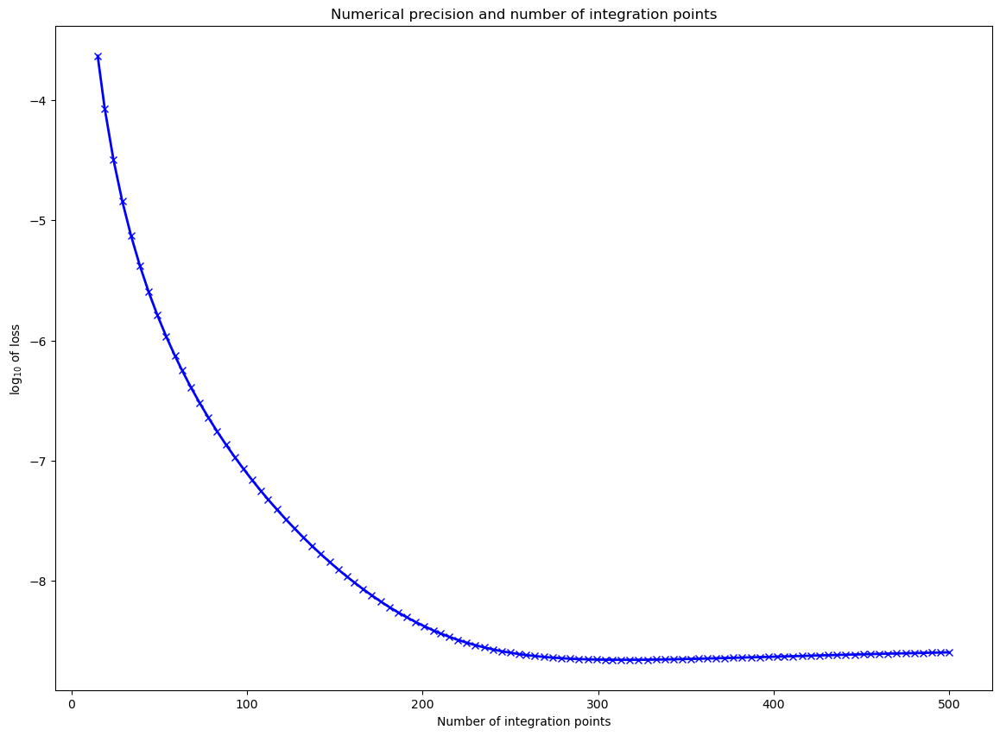

In [173]:
plt.figure(figsize=(14, 10))
plt.plot(points_eval,losses, 'b-x', linewidth = 2)  
plt.xlabel('Number of integration points')
plt.ylabel('$\log_{10}$ of loss')
plt.title('Numerical precision and number of integration points')
plt.show()

In [95]:
device = torch.device('cpu')
dummynet = DummyNet(0)
dummynet = dummynet.to(device)
dummynetd = DummyNetD()
dummynetd = dummynetd.to(device)
netsolver.scaled_loss = False
rzpoints = torch.linspace(-1,1,100, device=device)
netsolver.phi_net = dummynet
netsolver.mod_net = dummynetd

In [185]:
points_eval = np.linspace(15, 500, 100, dtype=int)
losses = []
for point_eval in points_eval:
    netsolver.eval_points_num = int(point_eval)
    losses.append(np.log10(netsolver.loss_function(rzpoints)))

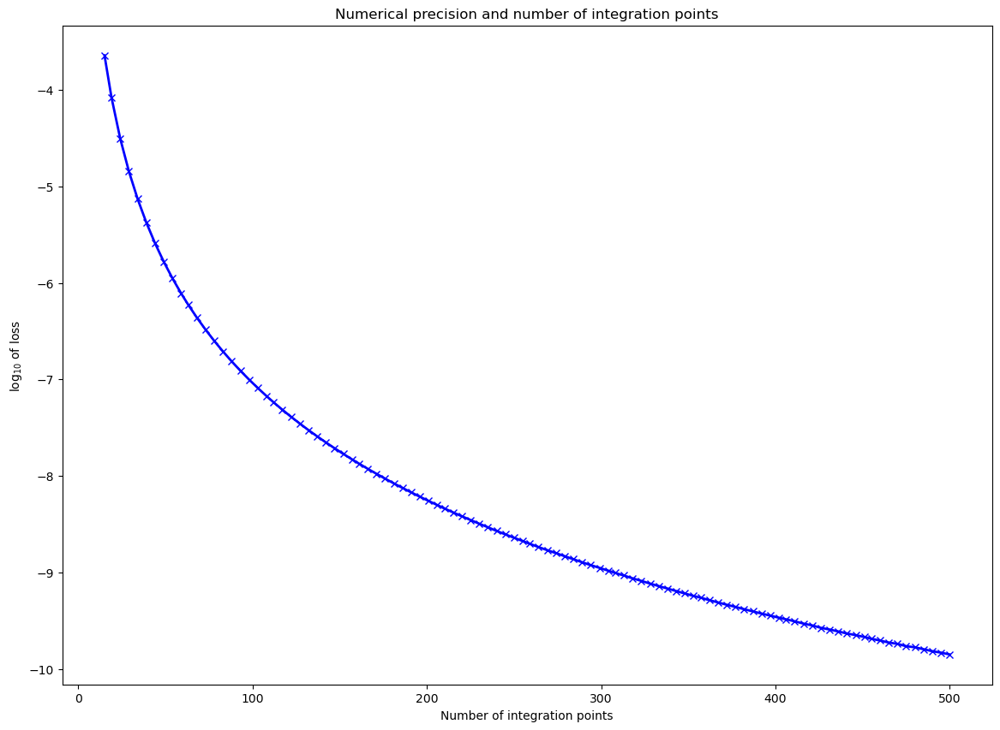

In [186]:
plt.figure(figsize=(14, 10))
plt.plot(points_eval,losses, 'b-x', linewidth = 2)  
plt.xlabel('Number of integration points')
plt.ylabel('$\log_{10}$ of loss')
plt.title('Numerical precision and number of integration points')
plt.show()

In [183]:
points_eval = np.linspace(15, 1500, 100, dtype=int)
losses = []
for point_eval in points_eval:
    netsolver.eval_points_num = int(point_eval)
    losses.append(np.log10(netsolver.loss_function(rzpoints)))

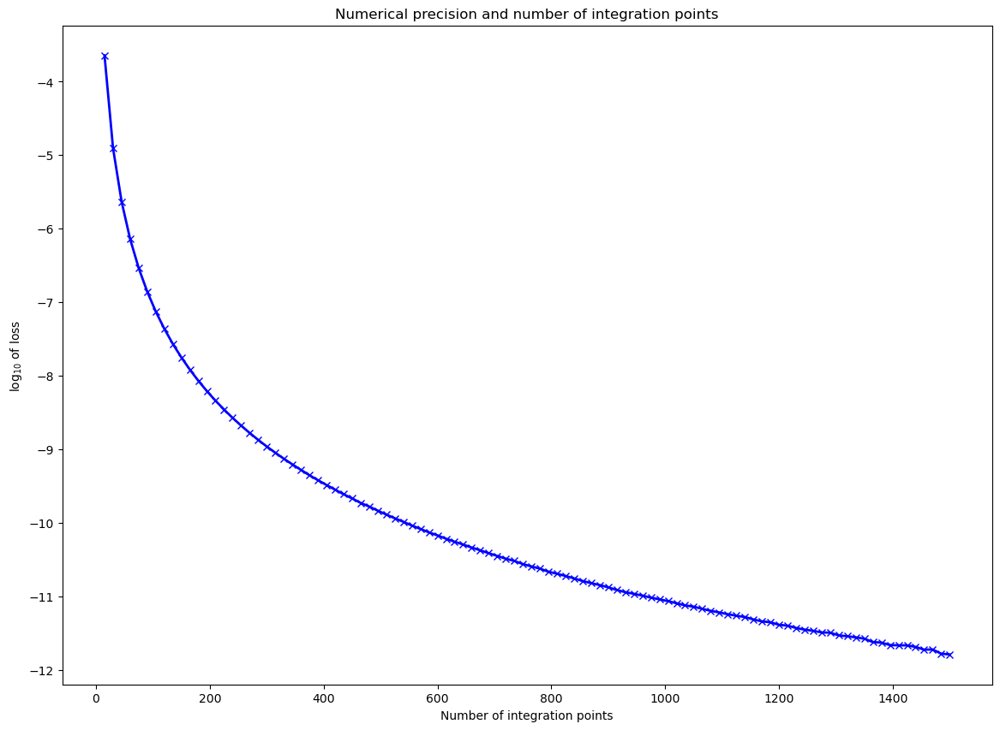

In [184]:
plt.figure(figsize=(14, 10))
plt.plot(points_eval,losses, 'b-x', linewidth = 2)  
plt.xlabel('Number of integration points')
plt.ylabel('$\log_{10}$ of loss')
plt.title('Numerical precision and number of integration points')
plt.show()

##### Look at the scaling for the Crichton ambiguity as a function of the number of integration points

https://app.neptune.ai/zulap/2to2scattering/e/TOS-959
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): ReLU()
    (layer_5): Linear(in_features=64, out_features=1, bias=True)
    (final_layer): Tanh()
  )
)
Begin Memory: 0
1 - After model to device 0
Train Epoch: 0 ; tLoss: 10.949785
Train Epoch: 20 ; tLoss: 0.767159
Train Epoch: 40 ; tLoss: 0.451451
Train Epoch: 60 ; tLoss: 0.113229
Train Epoch: 

Exception in thread NeptuneAsyncOpProcessor:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/new/internal/backends/swagger_client_wrapper.py", line 92, in __call__
    return FinishedApiResponseFuture(future.response())  # wait synchronously
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 200, in response
    swagger_result = self._get_swagger_result(incoming_response)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 124, in wrapper
    return func(self, *args, **kwargs)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 300, in _get_swagger_result
    unmarshal_response(
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 353, in unmarshal_response
    raise_on

Train Epoch: 180 ; tLoss: 0.035978
Train Epoch: 200 ; tLoss: 0.032785
Unexpected error occurred in Neptune background thread: Killing Neptune ping thread. Your run's status will not be updated and the run will be shown as inactive.


Exception in thread NeptunePing:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/new/internal/backends/swagger_client_wrapper.py", line 92, in __call__
    return FinishedApiResponseFuture(future.response())  # wait synchronously
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 200, in response
    swagger_result = self._get_swagger_result(incoming_response)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 124, in wrapper
    return func(self, *args, **kwargs)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 300, in _get_swagger_result
    unmarshal_response(
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/bravado/http_future.py", line 353, in unmarshal_response
    raise_on_expected(in

Train Epoch: 220 ; tLoss: 0.027847
Train Epoch: 240 ; tLoss: 0.027247
Train Epoch: 260 ; tLoss: 6.572886
Train Epoch: 280 ; tLoss: 1.940891
Train Epoch: 300 ; tLoss: 1.818122
Train Epoch: 320 ; tLoss: 1.713632
Train Epoch: 340 ; tLoss: 2.420684
Train Epoch: 360 ; tLoss: 1.488096
Train Epoch: 380 ; tLoss: 1.845976
Train Epoch: 400 ; tLoss: 1.700695
Train Epoch: 420 ; tLoss: 1.844488
Train Epoch: 440 ; tLoss: 1.641309
Train Epoch: 460 ; tLoss: 1.713576
Train Epoch: 480 ; tLoss: 1.645870
Train Epoch: 500 ; tLoss: 1.755320
Train Epoch: 520 ; tLoss: 0.136550
Train Epoch: 540 ; tLoss: 0.056250
Train Epoch: 560 ; tLoss: 0.033149
Train Epoch: 580 ; tLoss: 0.024951
Train Epoch: 600 ; tLoss: 0.018967
Train Epoch: 620 ; tLoss: 0.014393
Train Epoch: 640 ; tLoss: 0.013306
Train Epoch: 660 ; tLoss: 0.010698
Train Epoch: 680 ; tLoss: 0.008832
Train Epoch: 700 ; tLoss: 0.008746
Train Epoch: 720 ; tLoss: 0.006518
Train Epoch: 740 ; tLoss: 0.005171
Train Epoch: 760 ; tLoss: 0.005235
Train Epoch: 780 ; t

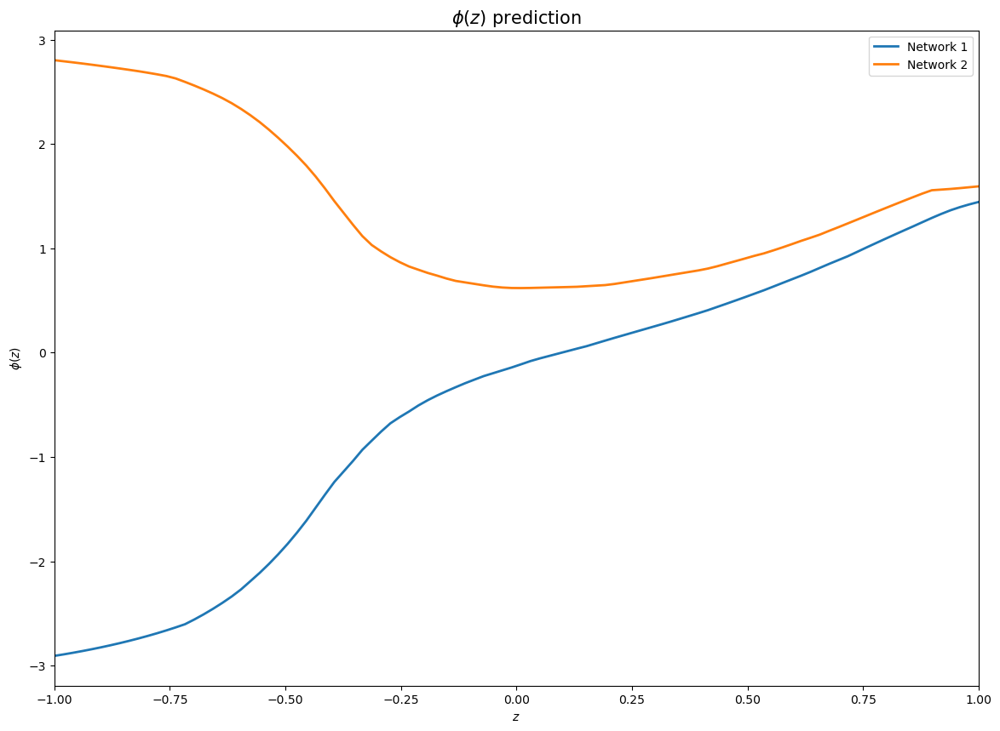

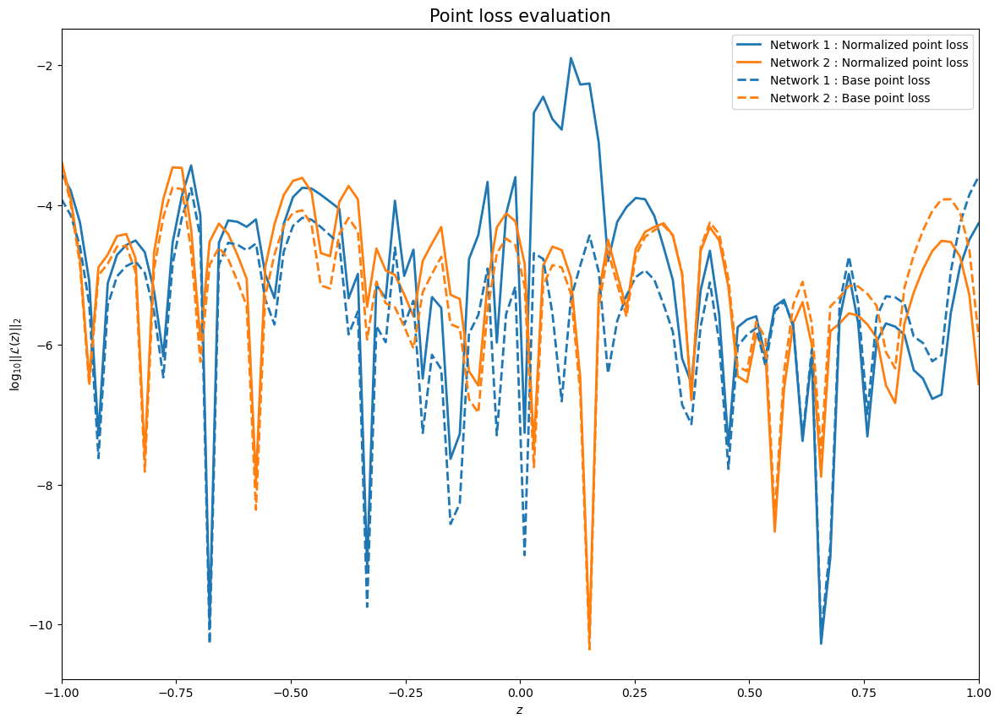

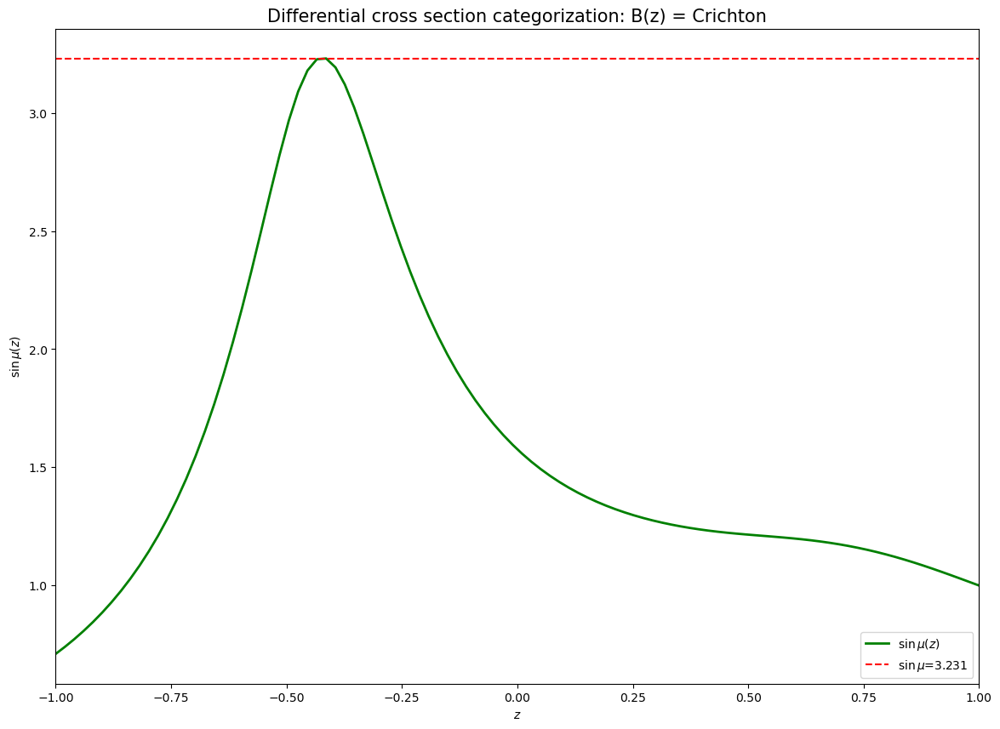

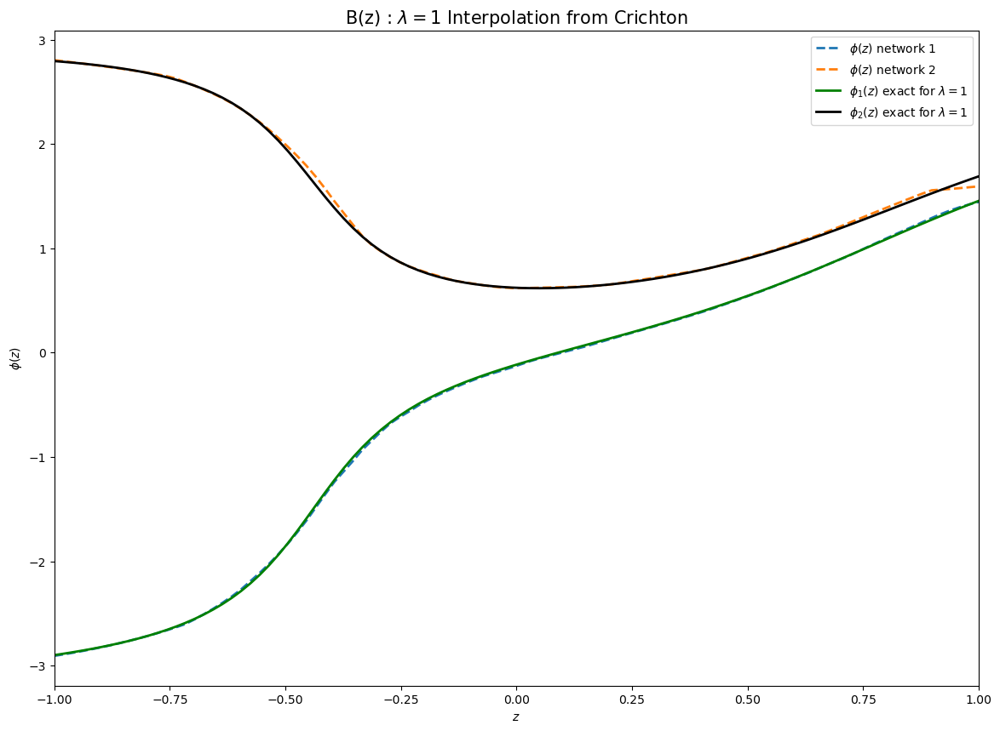

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 91 operations to synchronize with Neptune. Do not kill this process.
All 91 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-959
https://app.neptune.ai/zulap/2to2scattering/e/TOS-960
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): 

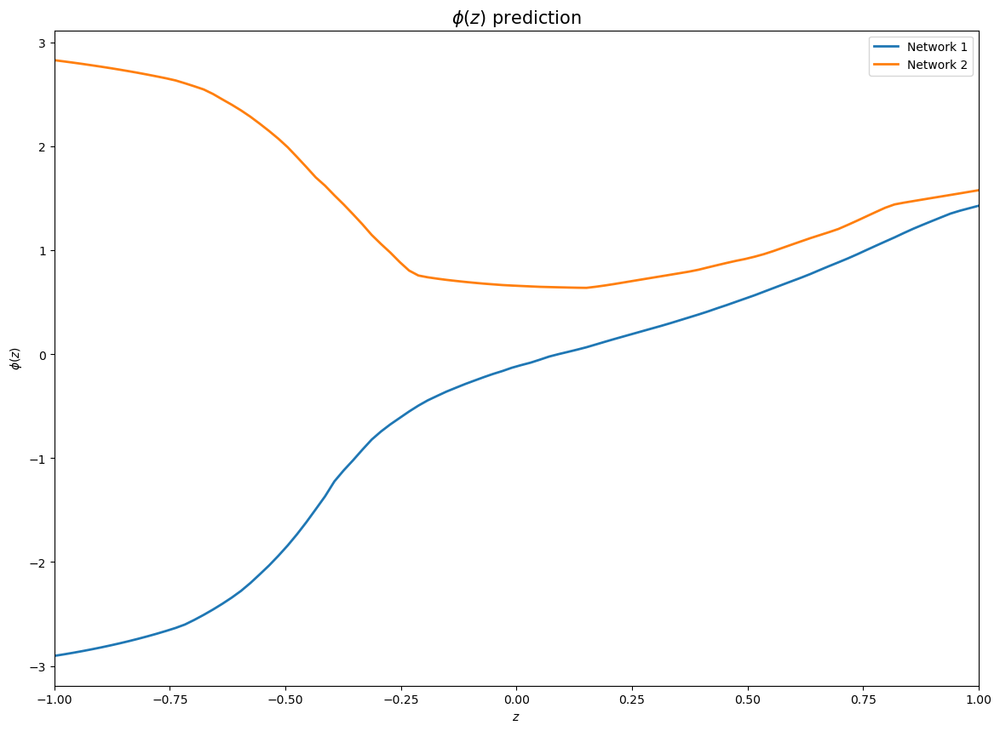

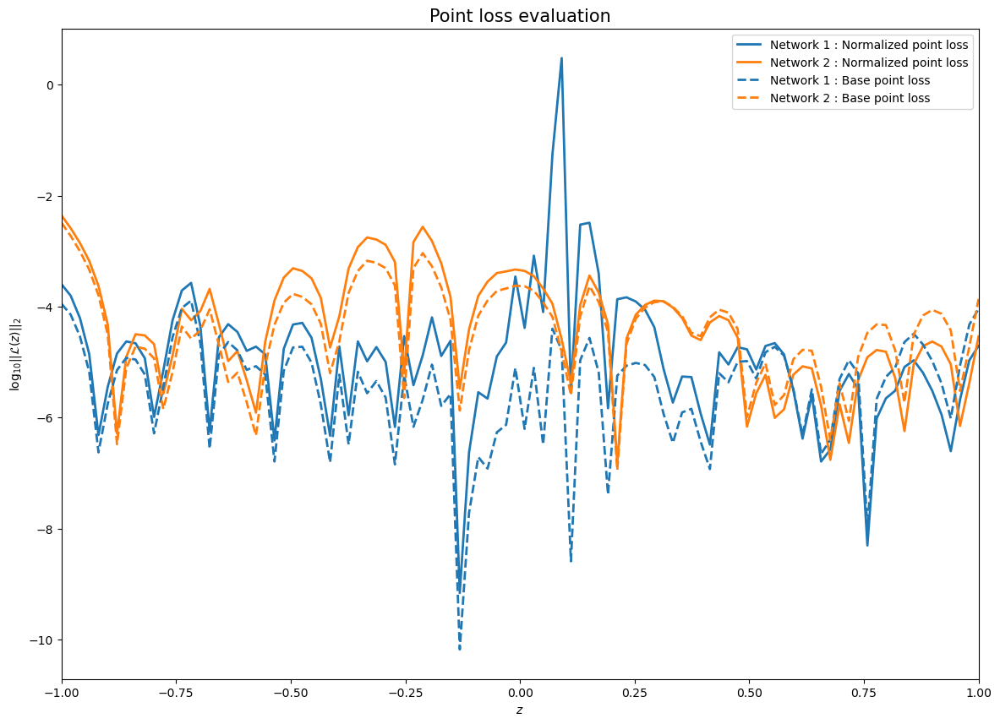

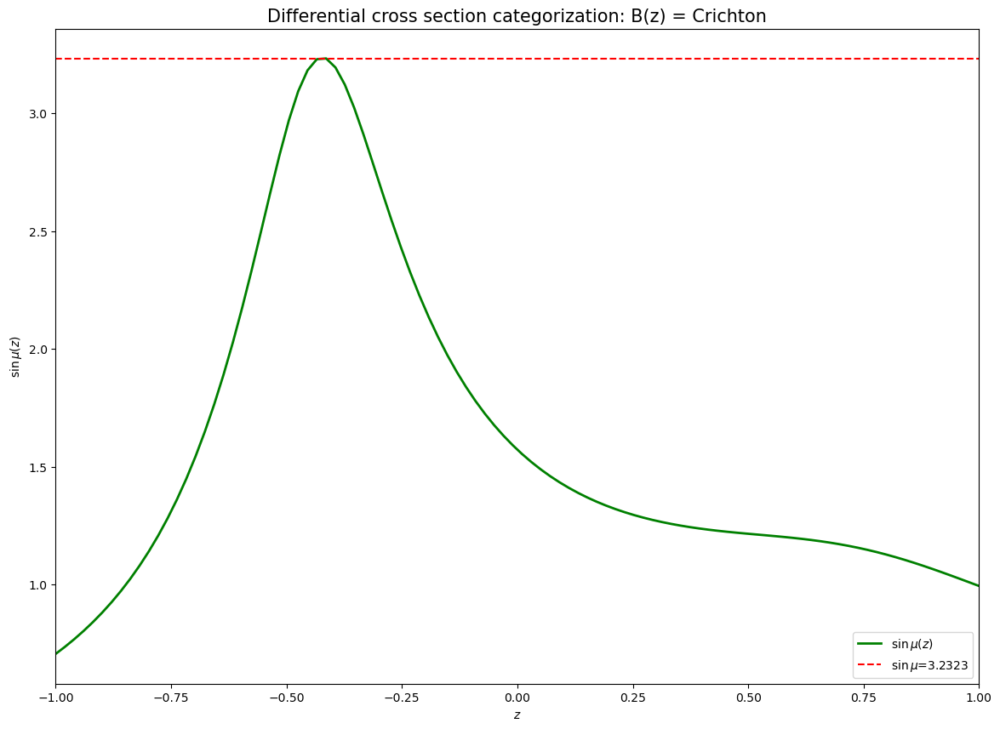

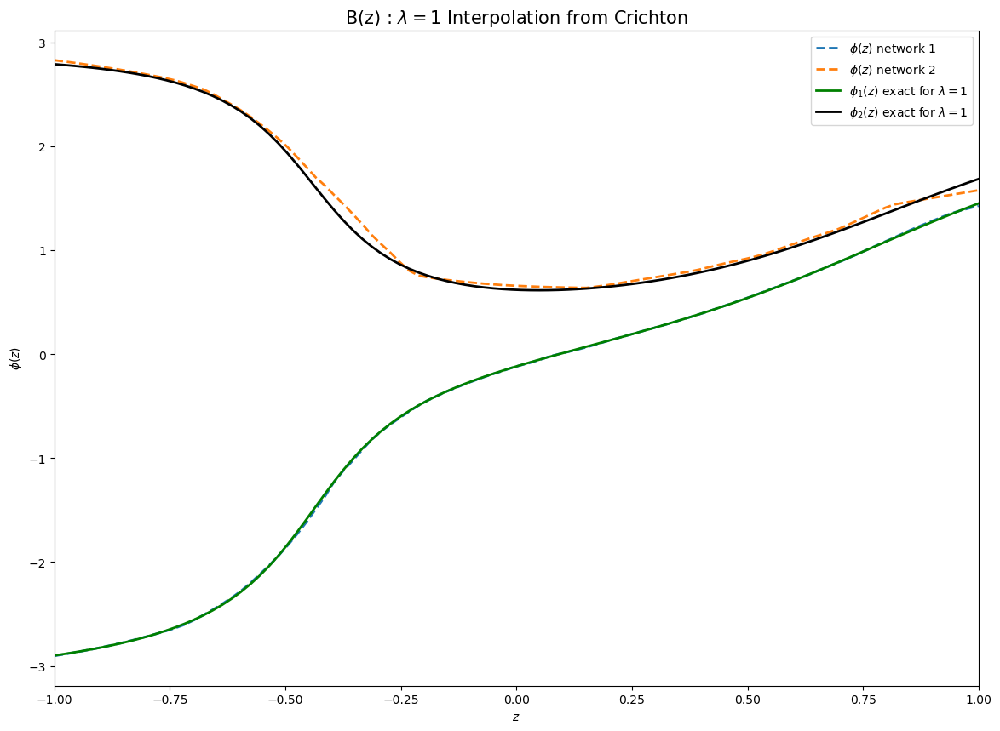

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 27 operations to synchronize with Neptune. Do not kill this process.
All 27 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-960
https://app.neptune.ai/zulap/2to2scattering/e/TOS-961
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
PhiNet(
  (activation): ReLU()
  (final_layer): Tanh()
  (model): Sequential(
    (layer_1): Linear(in_features=1, out_features=64, bias=True)
    (activation_1): ReLU()
    (layer_2): Linear(in_features=64, out_features=64, bias=True)
    (activation_2): ReLU()
    (layer_3): Linear(in_features=64, out_features=64, bias=True)
    (activation_3): ReLU()
    (layer_4): Linear(in_features=64, out_features=64, bias=True)
    (activation_4): 

KeyboardInterrupt: 

In [15]:
# Start the Neptune logger run


integration_points = [25, 50, 100, 150]
non_scaled_losses2a = []
scaled_losses2a = []
solved_phases2a = []


for int_point in integration_points:
    
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_test_scan")
    
    params = {'batch_size': 64,
             'epochs_num': 2500,
             'learning_rate': 0.001,
             'lr_scheduler': False, 
             'beta1' : 0.85,
             'beta2' : 0.999,
             'integral_points': int_point,
             'method_int': 'trapz',
             'activation': 'ReLU',
             'fund_dom': False,
             'layer_list' : [64,64, 64, 64],
             'final_layer': 'Tanh',
             'loss': 'MSE',
             'scaled_loss': False,
             'scan_param': 1,
             'bound_phi': math.pi,
             'num_nets': 2,
             'p_value': 2,
             'lambda_repulsive': 1.0}
    

    tags = {'constant function': 'Crichton', 'optimizer': 'Adam', 'Mode': 'Constant param', 'Huber': '0.1'}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params
    crichtonnet = ModuleInterpCrichton(lambda_param=params['scan_param'])
    netsolver = train_run(params, device, run, module_net=crichtonnet, seed_num=42, optim_name='Adam')

    phievals = []
    eval_pt_loss_ses = []
    eval_pt_loss_noses = []
    non_scaled_loss = []
    scaled_loss = []
    
    for i in range(params['num_nets']):
    
        if params['num_nets'] > 1: 
            netsolver.phi_net = netsolver.multi_nets[i]
        zpointseval, phieval, _, eval_pt_loss_s, eval_pt_loss_nos = eval_run(netsolver, params, device, run)
        phievals.append(phieval)
        eval_pt_loss_ses.append(eval_pt_loss_s)
        eval_pt_loss_noses.append(eval_pt_loss_nos)
        scaled_loss.append(torch.mean(eval_pt_loss_s))
        non_scaled_loss.append(torch.mean(eval_pt_loss_nos))
        
    
    plot_phases(zpointseval, phievals, run)
    solved_phases2a.append(phievals)
    
    plot_point_loss_crichton(zpointseval, eval_pt_loss_ses, eval_pt_loss_noses, run)
    non_scaled_losses2a.append(non_scaled_loss)
    scaled_losses2a.append(scaled_loss)

    integralz = sin_mu_integral(params, device, netsolver, zpointseval)
    plot_sin_mu(zpointseval, integralz, tags)

    plot_summary_crichton_lambda(zpointseval, phievals, 1, run)
    
    # Make sure to kill the Neptune logger run
    run.stop()

In [16]:
run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 1 operations to synchronize with Neptune. Do not kill this process.
All 1 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-961
